In [2]:
import sys
# install shap package
!{sys.executable} -m pip install shap --user

In [173]:
import pickle
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import pandas as pd
import shap
from datetime import datetime
from iso3166 import countries
from littlebird import TweetReader, TweetTokenizer
from collections import OrderedDict

In [4]:
# need to run this so that the shap package can do visualization in JS in notebooks
shap.initjs()

In [5]:
import sys
sys.path.append("/export/b10/jzhan237/minerva/src/evaluation")

In [6]:
# there are a couple of different models in this folder. They use different parameters
# and give *slightly* different results. The original one is marked "backup"
result_path = "/export/b10/jzhan237/minerva/experiments/explain-ngram/results/"
model_path = result_path+"results_daily_0_rf_model.pkl"
settings_path = result_path+"results_daily_0_rf_dict.pkl"
clf = pickle.load(open(model_path, "rb"))
results = pickle.load(open(settings_path, "rb"))
args = results["settings"]

Trying to unpickle estimator DecisionTreeClassifier from version 0.24.0 when using version 0.22.1. This might lead to breaking code or invalid results. Use at your own risk.
Trying to unpickle estimator RandomForestClassifier from version 0.24.0 when using version 0.22.1. This might lead to breaking code or invalid results. Use at your own risk.


In [7]:
clf

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.


RandomForestClassifier(n_jobs=None)

In [8]:
from event_forecasting import load_dataset
dataset_df, feat_index = load_dataset(args)
train_df = dataset_df[dataset_df.DATE.map(lambda x: x.strftime("%Y") in args.train_years)]
# if args.validation_years:
#     valid_df = dataset_df[dataset_df.DATE.map(lambda x: x.strftime("%Y") in args.validation_years)]
# else:
#     valid_df = None
test_df = dataset_df[dataset_df.DATE.map(lambda x: x.strftime("%Y") in args.test_years)]

INFO: Loading, aggregating, and labelling features
INFO:                     00am  00pm  02pm  04pm  06pm  0km  0km gt  0km pressure  \
COUNTRY DATE                                                                  
GIN     2014-11-21     0     0     0     0     0    0       0             0   
        2014-04-04     0     0     0     0     0    0       0             0   
SDN     2015-02-16     0     0     0     0     0    0       0             0   
CMR     2014-06-08     0     0     0     0     0    0       0             0   
LKA     2014-07-19     0     0     0     0     0    0       0             0   

                    0km visibility  0kmh  ...  zim  zimbabwe  zlatan  zombie  \
COUNTRY DATE                              ...                                  
GIN     2014-11-21               0     0  ...    0         0       0       0   
        2014-04-04               0     0  ...    0         1       0       0   
SDN     2015-02-16               0     0  ...    0         0       0 

In [9]:
feature_names = list(dataset_df)[feat_index:]

In [10]:
# The explaner operates on numpy array, so we need to convert df -> ndarray
X_train = train_df.iloc[:, feat_index:]
y_train = train_df.LABEL.values
X_test = test_df.iloc[:, feat_index:]
y_test = test_df.LABEL.values

In [11]:
pred_labels = clf.predict(X_test)
f1 = sklearn.metrics.f1_score(y_test, pred_labels)
precision = sklearn.metrics.precision_score(y_test, pred_labels)
recall = sklearn.metrics.recall_score(y_test, pred_labels)
print(f"{precision} {recall} {f1}")

0.788083041251011 0.30041109969167523 0.4350026043604435


In [13]:
np.sum(pred_labels)/len(pred_labels)

0.12345227000399414

Use shap KernelExplainer because shap don't really support pipelined random forest.

Use median as the base value (standard practice)

In [15]:
f = lambda x: clf.predict_proba(x)[:,1]
med = X_train.median().values.reshape((1,X_train.shape[1]))
explainer = shap.KernelExplainer(f, med)

In [19]:
X_train.median().sort_values()

00am           0.0
philippines    0.0
philosophy     0.0
phir           0.0
phnom          0.0
              ... 
back           4.0
day            5.0
time           6.0
good           7.0
love           8.0
Length: 10000, dtype: float64

In [65]:
pd.set_option("display.max_rows", 200)
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 200)

In [111]:
def shap_single(explaner, index):
    print(clf.predict_proba(X_test.iloc[index, :].values.reshape(1,-1)))
    shap_values_single = explainer.shap_values(X_test.iloc[index,:], nsamples=1000)
    shap.force_plot(explainer.expected_value, shap_values_single, feature_names)

In [105]:
def peek_entry(country, date):
    temp_idx = test_df[(test_df.COUNTRY == country) & (test_df.DATE == date)].index[0]
    idx = np.where(test_df.index == temp_idx)[0]
    print(test_df.iloc[idx,feat_index:].iloc[0].sort_values(ascending=False)[:30])
    return idx

## Ethiopia Burayu massacre

### Results for 5 single days of the protest

In [118]:
# https://en.wikipedia.org/wiki/Burayu_massacre
# 
burayu_list =  [('ETH', '2018-09-13'), ('ETH', '2018-09-14'), ('ETH', '2018-09-15'), ('ETH', '2018-09-16'), ('ETH', '2018-09-17')]
index_list = []
for country, date in burayu_list:
    index = peek_entry(country, date)
    index_list.append(index)

ethiopia       19
addis          13
clouds          8
work            7
ethiopian       7
humidity        7
wind            7
temperature     6
broken          6
abeba           5
people          5
women           5
rain            5
government      5
great           5
africa          4
made            4
add             4
good            4
health          4
world           3
love            3
happy           3
flight          3
make            3
today           3
amazing         3
forward         3
sky             3
success         3
Name: 67374, dtype: int64
ethiopia       19
addis          13
clouds         10
wind            8
proud           8
love            7
humidity        7
current         6
thinking        6
big             6
people          5
ababa           5
position        5
make            5
place           5
speaks          4
african         4
scattered       4
time            4
things          4
race            4
abt             4
abeba           4
temperature     4
wr

In [128]:
index = index_list[0]
print(clf.predict_proba(X_test.iloc[index, :].values.reshape(1,-1)))
shap_values_single = explainer.shap_values(X_test.iloc[index,:], nsamples=1000)
shap.force_plot(explainer.expected_value, shap_values_single, feature_names)

[[0.57 0.43]]


  0%|          | 0/1 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14800058 0.07415255 0.04953696 0.03722948 0.02984525 0.02492264
 0.02140668 0.01876987 0.01671916 0.01507872 0.01373667 0.0126184
 0.01167227 0.0108614  0.01015874 0.009544   0.00900166 0.00851966
 0.00808846 0.00770046 0.00734947 0.00703046 0.00673925 0.00647237
 0.00622689 0.00600036 0.00579065 0.00559598 0.00541479 0.00524573
 0.00508762 0.00493944 0.00480029 0.00466936 0.00454597 0.00442947
 0.00431931 0.00421499 0.00411606 0.00402211 0.00393279 0.00384776
 0.00376672 0.00368941 0.00361556 0.00354497 0.00347741 0.0034127
 0.00335067 0.00329115 0.00323401 0.00317909 0.00312628 0.00307545
 0.00302651 0.00297934 0.00293387 0.00288999 0.00284763 0.00280671
 0.00276716 0.00272892 0.00269192 0.00265611 0.00262143 0.00258783
 0.00255526 0.00252368 0.00249304 0.0024633  0.00243443 0.00240639
 0.00237915 0.00235267 0.00232692 0.00230187 0.00227751 0.00225379
 0.0022307  0.00220822 0.00218632 0.00216497 0.00214417 0.00212389
 0.00

In [131]:
index = index_list[1]
print(clf.predict_proba(X_test.iloc[index, :].values.reshape(1,-1)))
shap_values_single = explainer.shap_values(X_test.iloc[index,:], nsamples=1000)
shap.force_plot(explainer.expected_value, shap_values_single, feature_names)

[[0.58 0.42]]


  0%|          | 0/1 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14786415 0.07408265 0.04948923 0.03719282 0.02981523 0.02489704
 0.02138423 0.01874978 0.01670091 0.01506194 0.01372108 0.01260381
 0.01165852 0.01084837 0.01014633 0.00953212 0.00899026 0.00850867
 0.00807786 0.00769019 0.0073395  0.00702076 0.0067298  0.00646315
 0.00621788 0.00599153 0.005782   0.00558749 0.00540645 0.00523752
 0.00507954 0.00493148 0.00479243 0.00466161 0.00453831 0.0044219
 0.00431183 0.00420759 0.00410873 0.00401485 0.0039256  0.00384063
 0.00375965 0.00368238 0.00360859 0.00353804 0.00347053 0.00340586
 0.00334387 0.00328439 0.00322727 0.00317239 0.0031196  0.00306881
 0.00301989 0.00297275 0.0029273  0.00288344 0.0028411  0.0028002
 0.00276067 0.00272244 0.00268546 0.00264966 0.002615   0.00258141
 0.00254885 0.00251727 0.00248664 0.00245691 0.00242805 0.00240001
 0.00237277 0.00234629 0.00232055 0.00229551 0.00227114 0.00224743
 0.00222434 0.00220185 0.00217995 0.0021586  0.00213779 0.00211751
 0.00

In [127]:
index = index_list[2]
print(clf.predict_proba(X_test.iloc[index, :].values.reshape(1,-1)))
shap_values_single = explainer.shap_values(X_test.iloc[index,:], nsamples=1000)
shap.force_plot(explainer.expected_value, shap_values_single, feature_names)

[[0.66 0.34]]


  0%|          | 0/1 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14711848 0.07370461 0.04923371 0.03699855 0.02965768 0.02476397
 0.02126862 0.01864727 0.01660857 0.01497772 0.01364351 0.01253177
 0.01159115 0.010785   0.01008642 0.00947524 0.00893603 0.00845681
 0.0080281  0.00764232 0.00729335 0.00697616 0.0066866  0.00642124
 0.00617715 0.00595189 0.00574336 0.00554978 0.0053696  0.00520147
 0.00504423 0.00489687 0.00475847 0.00462826 0.00450553 0.00438966
 0.00428009 0.00417632 0.00407791 0.00398446 0.0038956  0.00381101
 0.00373039 0.00365346 0.00357999 0.00350974 0.00344252 0.00337813
 0.0033164  0.00325716 0.00320029 0.00314563 0.00309306 0.00304246
 0.00299374 0.00294679 0.00290151 0.00285782 0.00281564 0.00277489
 0.00273551 0.00269742 0.00266057 0.0026249  0.00259035 0.00255687
 0.00252442 0.00249295 0.00246242 0.00243278 0.00240401 0.00237605
 0.00234889 0.00232249 0.00229682 0.00227184 0.00224754 0.00222388
 0.00220085 0.00217842 0.00215656 0.00213526 0.0021145  0.00209426
 0.

In [122]:
index = index_list[3]
print(clf.predict_proba(X_test.iloc[index, :].values.reshape(1,-1)))
shap_values_single = explainer.shap_values(X_test.iloc[index,:], nsamples=1000)
shap.force_plot(explainer.expected_value, shap_values_single, feature_names)

[[0.49 0.51]]


  0%|          | 0/1 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14417333 0.07221031 0.04822292 0.03622944 0.02903353 0.02423639
 0.02080999 0.0182403  0.01624175 0.014643   0.01333501 0.01224509
 0.01132292 0.01053255 0.00984763 0.00924838 0.00871968 0.00824978
 0.00782939 0.00745108 0.00710885 0.00679777 0.00651379 0.00625351
 0.00601409 0.00579312 0.00558856 0.00539864 0.00522186 0.00505689
 0.0049026  0.00475798 0.00462216 0.00449435 0.00437388 0.00426013
 0.00415256 0.00405067 0.00395404 0.00386226 0.00377498 0.00369189
 0.00361268 0.0035371  0.00346491 0.00339587 0.0033298  0.0032665
 0.0032058  0.00314756 0.00309162 0.00303786 0.00298614 0.00293636
 0.00288841 0.0028422  0.00279762 0.0027546  0.00271306 0.00267293
 0.00263413 0.0025966  0.00256028 0.00252511 0.00249104 0.00245803
 0.00242601 0.00239496 0.00236482 0.00233557 0.00230715 0.00227954
 0.00225271 0.00222662 0.00220123 0.00217654 0.0021525  0.0021291
 0.0021063  0.00208409 0.00206244 0.00204134 0.00202077 0.00200069
 0.00

In [126]:
index = index_list[4]
print(clf.predict_proba(X_test.iloc[index, :].values.reshape(1,-1)))
shap_values_single = explainer.shap_values(X_test.iloc[index,:], nsamples=1000)
shap.force_plot(explainer.expected_value, shap_values_single, feature_names)

[[0.66 0.34]]


  0%|          | 0/1 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14548286 0.07287466 0.04867225 0.03657129 0.02931091 0.02447083
 0.02101376 0.01842109 0.01640468 0.01479166 0.013472   0.01237238
 0.011442   0.01064461 0.00995361 0.00934905 0.00881568 0.00834163
 0.00791753 0.0075359  0.00719067 0.00687687 0.0065904  0.00632786
 0.00608636 0.00586348 0.00565715 0.0054656  0.0052873  0.00512092
 0.00496532 0.00481947 0.0046825  0.00455362 0.00443214 0.00431744
 0.00420898 0.00410625 0.00400882 0.0039163  0.00382831 0.00374455
 0.00366471 0.00358852 0.00351576 0.00344618 0.00337959 0.0033158
 0.00325464 0.00319595 0.00313959 0.00308542 0.00303332 0.00298317
 0.00293487 0.00288832 0.00284343 0.00280011 0.00275828 0.00271787
 0.0026788  0.00264102 0.00260446 0.00256906 0.00253477 0.00250154
 0.00246933 0.00243809 0.00240777 0.00237834 0.00234975 0.00232199
 0.002295   0.00226876 0.00224325 0.00221842 0.00219426 0.00217073
 0.00214783 0.00212551 0.00210377 0.00208257 0.0020619  0.00204175
 0.0

In [132]:
print(index_list)

[array([11053]), array([12434]), array([13599]), array([14865]), array([16148])]


In [134]:
shap_values = explainer.shap_values(X_test.iloc[14800:14900,:], nsamples=100)
shap.force_plot(explainer.expected_value, shap_values, X_test.iloc[14800:14900,:])

  0%|          | 0/100 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16630252 0.08350967 0.05591412 0.04211792 0.03384147 0.02832492
 0.02438545 0.02143169 0.01913506 0.01729843 0.01579637 0.01454523
 0.01348712 0.01258068 0.01179558 0.01110908 0.01050379 0.00996617
 0.00948555 0.00905338 0.00866275 0.00830799 0.00798444 0.00768819
 0.00741598 0.00716503 0.00693299 0.00671784 0.00651783 0.00633145
 0.00615739 0.00599451 0.00584177 0.00569831 0.00556331 0.0054361
 0.00531602 0.00520254 0.00509513 0.00499336 0.00489681 0.00480512
 0.00471795 0.00463499 0.00455597 0.00448063 0.00440875 0.00434011
 0.00427452 0.00421179 0.00415177 0.0040943  0.00403925 0.00398647
 0.00393585 0.00388729 0.00384067 0.00379589 0.00375288 0.00371154
 0.0036718  0.00363358 0.00359681 0.00356144 0.0035274  0.00349463
 0.00346309 0.00343271 0.00340347 0.0033753  0.00334818 0.00332206
 0.0032969  0.00327268 0.00324935 0.00322689 0.00320527 0.00318446
 0.00316443 0.00314517 0.00312664 0.00310883 0.00309172 0.00307528
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18094992 0.09109892 0.06115437 0.04618652 0.03720942 0.03122776
 0.02695784 0.02375781 0.02127109 0.01928371 0.01765955 0.01630783
 0.01516572 0.01418834 0.01334277 0.01260434 0.01195416 0.01137756
 0.01086295 0.01040106 0.00998439 0.0096068  0.00926321 0.00894942
 0.00866186 0.00839755 0.00815392 0.00792878 0.00772025 0.00752669
 0.00734669 0.00717899 0.00702251 0.00687629 0.00673946 0.00661128
 0.00649108 0.00637824 0.00627224 0.00617259 0.00607885 0.00599063
 0.00590758 0.00582937 0.00575571 0.00568633 0.005621   0.00555949
 0.0055016  0.00544715 0.00539597 0.00534791 0.00530283 0.00526059
 0.00522108 0.0051842  0.00514984 0.00511792 0.00508835 0.00506105
 0.00503597 0.00501303 0.00499219 0.0049734  0.0049566  0.00494177
 0.00492886 0.00491785 0.00490871 0.00490143 0.00489598 0.00489235
 0.00489054]
INFO: num_paired_subset_sizes = 73
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 146.99999999999994
INFO: np.

INFO: num_paired_subset_sizes = 948
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1897.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 79 iterations, i.e. alpha=6.274e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 113 iterations, i.e. alpha=3.139e-03, with an active set of 27 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 113 iterations, i.e. alpha=3.139e-03, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 113 iterations, i.e. alpha=3.139e-03, with an active set of 27 regress

INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1248902  0.06248205 0.04167936 0.03127804 0.02503726 0.02087676
 0.01790499 0.01567617 0.01394265 0.01255585 0.0114212  0.01047566
 0.0096756  0.00898984 0.00839552 0.0078755  0.00741666 0.00700881
 0.00664389 0.00631547 0.00601833 0.00574821 0.00550158 0.00527551
 0.00506753 0.00487555 0.00469779 0.00453274 0.00437907 0.00423565
 0.00410148 0.0039757  0.00385755 0.00374635 0.00364151 0.00354249
 0.00344883 0.00336011 0.00327593 0.00319596 0.0031199  0.00304746
 0.0029784  0.00291247 0.00284948 0.00278923 0.00273154 0.00267626
 0.00262324 0.00257234 0.00252344 0.00247642 0.00243118 0.00238762
 0.00234564 0.00230516 0.0022661  0.00222839 0.00219197 0.00215675
 0.0021227  0.00208974 0.00205783 0.00202692 0.00199697 0.00196792
 0.00193974 0.00191239 0.00188584 0.00186004 0.00183498 0.00181061
 0.00178691 0.00176385 0.00174141 0.00171956 0.00169828 0.00167754
 0.00165734 0.00163763 0.00161842 

INFO: num_paired_subset_sizes = 845
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1692.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=2.131e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.847e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=1.761e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=1.761e-02, with an active 

INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1693991  0.08510676 0.05701194 0.04296652 0.03454089 0.02892517
 0.02491514 0.02190867 0.01957126 0.01770221 0.01617378 0.01490085
 0.01382445 0.01290248 0.01210407 0.01140606 0.01079074 0.01024433
 0.00975597 0.00931695 0.00892023 0.00856006 0.00823167 0.0079311
 0.00765501 0.00740059 0.00716543 0.00694749 0.00674498 0.00655637
 0.00638032 0.00621566 0.00606136 0.00591651 0.00578031 0.00565205
 0.00553108 0.00541683 0.0053088  0.00520653 0.0051096  0.00501763
 0.00493029 0.00484726 0.00476827 0.00469306 0.00462138 0.00455304
 0.00448782 0.00442555 0.00436606 0.0043092  0.00425483 0.0042028
 0.00415301 0.00410534 0.00405967 0.00401593 0.00397401 0.00393382
 0.0038953  0.00385837 0.00382296 0.003789   0.00375644 0.00372521
 0.00369527 0.00366657 0.00363906 0.0036127  0.00358744 0.00356325
 0.00354009 0.00351793 0.00349673 0.00347647 0.00345712 0.00343866
 0.00342105 0.00340427 0.00338831 0.

INFO: num_paired_subset_sizes = 285
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 572.0000000000001
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.04164169
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.      

INFO: num_paired_subset_sizes = 156
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 314.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.          0.          0.          0.          0.          0.00925768
  0.          0.01431176  0.          0.          0.01155538  0.
  0.          0.00199168  0.          0.          0.         -0.01163821
  0.          0.          0.          0.          0.02179123  0.
  0.          0.          0.          0.          0.          0.
  0.01614379  0.          0.         -0.00595535  0.          0.
  0.01500765  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00373178  0.          0.          0.
  0.          0.          0.          0.          0.          0.00100555
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

INFO: num_paired_subset_sizes = 955
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1911.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=8.128e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 96 iterations, i.e. alpha=2.081e-03, with an active set of 24 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 116 iterations, i.e. alpha=2.025e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 116 iterations, i.e. alpha=2.025e-03, with an active set of 22 regressors

INFO: num_paired_subset_sizes = 74
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 150.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.          0.          0.          0.01419615  0.          0.04043874
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00104613  0.          0.          0.          0.          0.
  0.          0.00148631  0.01295142  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.01037938  0.          0.          0.
  0.          0.          0.01082233  0.          0.01613595  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00509593 -0.03194828
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0

INFO: num_paired_subset_sizes = 198
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 397.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=3.062e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=3.062e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. alpha=2.063e-03, with an active set of 8 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 19 iterations, i.e. alpha=1.531e-03, with an active set of 9 re

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16446674 0.08256496 0.05526615 0.04161811 0.03343038 0.02797283
 0.02407538 0.02115301 0.01888069 0.01706342 0.01557711 0.01433901
 0.01329186 0.01239474 0.01161765 0.01093809 0.01033886 0.00980657
 0.00933065 0.00890266 0.00851575 0.00816432 0.00784375 0.00755019
 0.00728039 0.00703163 0.00680156 0.00658819 0.0063898  0.00620488
 0.00603214 0.00587044 0.00571878 0.00557628 0.00544216 0.00531571
 0.00519632 0.00508344 0.00497657 0.00487526 0.00477911 0.00468775
 0.00460086 0.00451812 0.00443926 0.00436405 0.00429224 0.00422362
 0.00415801 0.00409522 0.0040351  0.00397749 0.00392225 0.00386926
 0.00381839 0.00376953 0.00372259 0.00367746 0.00363406 0.0035923
 0.00355211 0.0035134  0.00347612 0.00344021 0.00340559 0.00337222
 0.00334004 0.003309   0.00327906 0.00325018 0.0032223  0.0031954
 0.00316943 0.00314437 0.00312017 0.00309681 0.00307426 0.00305249
 0.00303148 0.00301119 0.00299162 0.00297272 0.00295449 0.00293691
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12429429 0.06218254 0.04147865 0.03112672 0.02491558 0.02077484
 0.01781717 0.01559893 0.01387365 0.01249342 0.01136416 0.01042311
 0.00962685 0.00894434 0.00835284 0.00783529 0.00737862 0.0069727
 0.00660952 0.00628265 0.00598693 0.00571808 0.00547262 0.00524762
 0.00504062 0.00484955 0.00467264 0.00450836 0.00435542 0.00421267
 0.00407914 0.00395396 0.00383636 0.00372569 0.00362134 0.00352279
 0.00342958 0.00334126 0.00325749 0.0031779  0.00310219 0.0030301
 0.00296135 0.00289574 0.00283304 0.00277307 0.00271566 0.00266064
 0.00260786 0.0025572  0.00250853 0.00246173 0.0024167  0.00237334
 0.00233155 0.00229127 0.00225239 0.00221486 0.0021786  0.00214355
 0.00210965 0.00207685 0.00204509 0.00201433 0.00198451 0.00195559
 0.00192755 0.00190032 0.00187389 0.00184821 0.00182326 0.00179901
 0.00177542 0.00175246 0.00173013 0.00170838 0.00168719 0.00166655
 0.00164644 0.00162683 0.0016077  0.00158904 0.00157083 0.00155306
 0.00

INFO: num_paired_subset_sizes = 878
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1758.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 21 iterations, i.e. alpha=2.004e-02, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 21 iterations, i.e. alpha=2.004e-02, with an active set of 13 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 33 iterations, i.e. alpha=1.821e-02, with an active set of 13 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 43 iterations, i.e. alpha=1.711e-02, with an active set of 15 regressors

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1195922  0.05982093 0.03989719 ... 0.00019841 0.00019841 0.00019841]
INFO: num_paired_subset_sizes = 1204
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2410.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 30 iterations, i.e. alpha=1.124e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=1.097e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 35 iterations, i.e. alpha=1.020e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regre

Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=1.889e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 4.712e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=1.889e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=1.889e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 9.306e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=1.888e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 5.373e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

INFO: phi = [ 0.          0.          0.          0.          0.          0.
 -0.0010882   0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01936999  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.         

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18119723 0.09123663 0.0612558  0.04627001 0.03728231 0.03129372
 0.02701898 0.02381544 0.02132609 0.01933672 0.01771101 0.01635808
 0.01521503 0.01423692 0.0133908  0.01265195 0.01200148 0.01142469
 0.01090998 0.01044807 0.01003144 0.00965395 0.00931053 0.00899695
 0.00870965 0.00844563 0.00820234 0.00797759 0.00776948 0.00757638
 0.00739686 0.00722969 0.00707377 0.00692813 0.00679193 0.0066644
 0.00654489 0.00643277 0.00632752 0.00622865 0.00613573 0.00604837
 0.0059662  0.00588891 0.00581621 0.00574783 0.00568353 0.00562309
 0.00556632 0.00551302 0.00546304 0.00541622 0.00537242 0.00533152
 0.0052934  0.00525796 0.00522509 0.00519471 0.00516674 0.00514111
 0.00511776 0.00509662 0.00507764 0.00506078 0.005046   0.00503326
 0.00502252 0.00501378 0.005007   0.00500216 0.00499927 0.0049983 ]
INFO: num_paired_subset_sizes = 71
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 144.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14388847 0.07206597 0.04812541 0.03615534 0.02897346 0.02418568
 0.02076596 0.01820128 0.01620662 0.01461097 0.01330553 0.01221772
 0.01129734 0.01050851 0.00982491 0.00922682 0.00869914 0.00823014
 0.00781056 0.00743298 0.00709141 0.00678092 0.00649748 0.0062377
 0.00599873 0.00577818 0.00557401 0.00538445 0.005208   0.00504334
 0.00488933 0.00474499 0.00460941 0.00448185 0.0043616  0.00424805
 0.00414068 0.00403897 0.00394251 0.0038509  0.00376378 0.00368084
 0.00360177 0.00352633 0.00345426 0.00338534 0.00331938 0.00325619
 0.0031956  0.00313746 0.00308161 0.00302794 0.00297631 0.00292661
 0.00287874 0.0028326  0.0027881  0.00274515 0.00270367 0.0026636
 0.00262486 0.00258739 0.00255112 0.00251601 0.00248199 0.00244902
 0.00241706 0.00238605 0.00235596 0.00232674 0.00229836 0.00227079
 0.00224399 0.00221793 0.00219259 0.00216792 0.00214391 0.00212054
 0.00209777 0.00207558 0.00205396 0.00203289 0.00201233 0.00199228
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14347043 0.07185418 0.04798236 0.03604665 0.02888538 0.02411133
 0.02070142 0.01814408 0.01615513 0.01456406 0.01326234 0.01217765
 0.01125989 0.01047331 0.00979165 0.00919526 0.00866908 0.00820141
 0.00778302 0.00740651 0.0070659  0.00675629 0.00647364 0.00621458
 0.00597629 0.00575635 0.00555274 0.00536371 0.00518775 0.00502354
 0.00486996 0.00472601 0.00459081 0.00446359 0.00434367 0.00423043
 0.00412334 0.00402191 0.00392571 0.00383434 0.00374745 0.00366473
 0.00358587 0.00351062 0.00343874 0.00337    0.00330421 0.00324118
 0.00318074 0.00312274 0.00306704 0.0030135  0.002962   0.00291242
 0.00286467 0.00281864 0.00277424 0.00273139 0.00269001 0.00265003
 0.00261138 0.002574   0.00253781 0.00250278 0.00246884 0.00243594
 0.00240404 0.0023731  0.00234307 0.00231392 0.0022856  0.00225808
 0.00223134 0.00220533 0.00218003 0.00215541 0.00213145 0.00210811
 0.00208539 0.00206324 0.00204166 0.00202062 0.0020001  0.00198008
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16654387 0.08363399 0.05599947 0.04218381 0.03389571 0.02837141
 0.02442643 0.02146855 0.01916873 0.01732957 0.01582544 0.01457259
 0.01351304 0.01260538 0.01181924 0.01113184 0.01052576 0.00998744
 0.00950621 0.0090735  0.00868238 0.00832719 0.00800325 0.00770666
 0.00743413 0.0071829  0.00695061 0.00673523 0.00653502 0.00634845
 0.00617423 0.00601119 0.00585833 0.00571474 0.00557964 0.00545233
 0.00533217 0.00521862 0.00511115 0.00500933 0.00491274 0.00482101
 0.00473381 0.00465083 0.00457179 0.00449645 0.00442457 0.00435594
 0.00429036 0.00422765 0.00416766 0.00411022 0.00405519 0.00400246
 0.00395189 0.00390337 0.00385681 0.00381209 0.00376914 0.00372787
 0.0036882  0.00365006 0.00361338 0.00357809 0.00354414 0.00351147
 0.00348002 0.00344975 0.00342061 0.00339256 0.00336555 0.00333955
 0.00331452 0.00329042 0.00326723 0.00324491 0.00322343 0.00320277
 0.00318289 0.00316379 0.00314542 0.00312778 0.00311083 0.00309457
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14156165 0.07088807 0.04733043 0.03555177 0.0284847  0.02377344
 0.02040834 0.0178846  0.01592177 0.01435157 0.01306693 0.01199644
 0.0110907  0.0103144  0.00964165 0.00905304 0.00853372 0.00807214
 0.00765918 0.00728756 0.00695136 0.00664576 0.00636676 0.00611104
 0.00587581 0.0056587  0.0054577  0.00527108 0.00509736 0.00493525
 0.00478361 0.00464148 0.00450799 0.00438236 0.00426394 0.00415212
 0.00404637 0.0039462  0.00385119 0.00376094 0.00367512 0.0035934
 0.00351551 0.00344117 0.00337015 0.00330224 0.00323723 0.00317495
 0.00311523 0.00305792 0.00300286 0.00294994 0.00289904 0.00285003
 0.00280282 0.00275732 0.00271342 0.00267105 0.00263013 0.00259059
 0.00255236 0.00251538 0.00247959 0.00244493 0.00241135 0.00237879
 0.00234723 0.0023166  0.00228688 0.00225802 0.00222998 0.00220274
 0.00217625 0.00215049 0.00212543 0.00210105 0.00207731 0.00205419
 0.00203166 0.00200971 0.00198832 0.00196746 0.00194711 0.00192726
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15235493 0.07636649 0.05103764 0.03837368 0.03077569 0.02571069
 0.0220931  0.01938016 0.01727031 0.01558263 0.01420198 0.01305161
 0.01207837 0.01124432 0.01052161 0.00988936 0.00933162 0.00883597
 0.00839261 0.00799369 0.00763286 0.00730494 0.00700562 0.00673134
 0.00647909 0.00624634 0.0060309  0.00583094 0.00564485 0.00547123
 0.0053089  0.00515679 0.00501396 0.00487961 0.004753   0.0046335
 0.00452052 0.00441355 0.00431213 0.00421585 0.00412432 0.00403722
 0.00395422 0.00387506 0.00379947 0.00372722 0.00365811 0.00359193
 0.00352851 0.00346768 0.00340929 0.0033532  0.00329928 0.00324741
 0.00319747 0.00314938 0.00310301 0.0030583  0.00301516 0.0029735
 0.00293325 0.00289436 0.00285674 0.00282035 0.00278513 0.00275102
 0.00271798 0.00268596 0.00265491 0.00262479 0.00259557 0.00256721
 0.00253967 0.00251292 0.00248692 0.00246166 0.0024371  0.00241321
 0.00238997 0.00236736 0.00234535 0.00232392 0.00230305 0.00228272
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17368193 0.08732341 0.05854084 0.04415229 0.03552139 0.02976935
 0.02566239 0.02258364 0.02019038 0.01827699 0.01671262 0.01541001
 0.0143088  0.01336583 0.01254947 0.01183601 0.01120728 0.0106492
 0.01015061 0.0097026  0.00929797 0.0089308  0.00859623 0.0082902
 0.00800928 0.0077506  0.00751169 0.00729045 0.00708506 0.00689395
 0.00671575 0.00654926 0.00639342 0.0062473  0.00611009 0.00598106
 0.00585954 0.00574496 0.0056368  0.00553458 0.00543789 0.00534633
 0.00525957 0.00517728 0.00509918 0.005025   0.00495452 0.0048875
 0.00482376 0.0047631  0.00470535 0.00465036 0.00459799 0.00454809
 0.00450056 0.00445528 0.00441213 0.00437103 0.00433188 0.00429459
 0.0042591  0.00422533 0.0041932  0.00416266 0.00413365 0.00410612
 0.00408    0.00405527 0.00403186 0.00400975 0.00398889 0.00396925
 0.00395079 0.00393349 0.00391731 0.00390224 0.00388824 0.0038753
 0.00386339 0.0038525  0.00384261 0.00383371 0.00382578 0.00381881
 0.0038

INFO: num_paired_subset_sizes = 167
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 336.00000000000006
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=3.178e-03, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.660e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. alpha=2.141e-03, with an active set of 8 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 14 iterations, i.e. alpha=1.589e-03, with an active set of 10 reg

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11572491 0.05788062 0.0385992  ... 0.0001452  0.0001452  0.0001452 ]
INFO: num_paired_subset_sizes = 1593
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 3187.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=1.879e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 30 iterations, i.e. alpha=1.860e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 39 iterations, i.e. alpha=1.452e-03, with an active set of 23 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or inc

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.12313655e-01 5.61703953e-02 3.74559797e-02 ... 1.08463363e-04
 1.08463262e-04 1.08463211e-04]
INFO: num_paired_subset_sizes = 2070
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4141.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 47 iterations, i.e. alpha=3.373e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 3.495e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 57 iterations, i.e. alpha=2.374e-03, with an active set of 19 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=2.369e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or incre

INFO: num_paired_subset_sizes = 399
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 800.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0121875   0.          0.          0.
  0.          0.          0.          0.          0.033125    0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.0190625   0.0203125   0.          0.          0.          0.
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14841187 0.07436085 0.04967761 0.03733632 0.02993181 0.02499568
 0.02147007 0.01882603 0.0167697  0.01512478 0.01377905 0.01265773
 0.01170902 0.01089595 0.01019137 0.00957496 0.00903115 0.00854784
 0.00811548 0.00772643 0.0073745  0.00705463 0.00676264 0.00649505
 0.00624892 0.00602178 0.00581153 0.00561634 0.00543467 0.00526517
 0.00510664 0.00495808 0.00481857 0.00468731 0.00456359 0.0044468
 0.00433636 0.00423177 0.0041326  0.00403842 0.00394887 0.00386363
 0.0037824  0.00370489 0.00363087 0.0035601  0.00349239 0.00342753
 0.00336535 0.00330569 0.00324841 0.00319337 0.00314044 0.0030895
 0.00304045 0.00299318 0.0029476  0.00290363 0.00286118 0.00282018
 0.00278055 0.00274223 0.00270516 0.00266928 0.00263453 0.00260087
 0.00256823 0.00253659 0.0025059  0.00247611 0.00244719 0.0024191
 0.00239181 0.00236529 0.0023395  0.00231442 0.00229001 0.00226626
 0.00224314 0.00222063 0.00219869 0.00217732 0.0021565  0.00213619
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15719521 0.07883723 0.05271888 0.03966045 0.03182598 0.02660351
 0.02287361 0.02007656 0.01790143 0.01616163 0.01473845 0.01355273
 0.01254968 0.01169015 0.01094544 0.01029403 0.00971946 0.00920891
 0.00875228 0.00834149 0.00796998 0.00763241 0.00732435 0.00704211
 0.00678259 0.00654317 0.00632163 0.00611604 0.00592476 0.00574636
 0.00557959 0.00542337 0.00527673 0.00513883 0.00500893 0.00488636
 0.00477052 0.00466089 0.00455699 0.00445838 0.00436469 0.00427556
 0.00419068 0.00410976 0.00403253 0.00395876 0.00388822 0.00382072
 0.00375606 0.00369409 0.00363464 0.00357756 0.00352273 0.00347002
 0.00341932 0.00337052 0.00332352 0.00327822 0.00323455 0.00319242
 0.00315176 0.0031125  0.00307456 0.0030379  0.00300245 0.00296816
 0.00293498 0.00290285 0.00287174 0.00284161 0.0028124  0.00278409
 0.00275663 0.00273001 0.00270417 0.00267909 0.00265475 0.00263112
 0.00260816 0.00258586 0.00256419 0.00254314 0.00252267 0.00250277
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14768545 0.0739919  0.04942779 0.03714604 0.02977723 0.0248649
 0.02135626 0.01872494 0.0166785  0.01504147 0.0137022  0.01258625
 0.01164208 0.01083289 0.01013167 0.00951819 0.00897696 0.00849594
 0.00806562 0.0076784  0.00732813 0.00700976 0.00671913 0.00645278
 0.0062078  0.00598171 0.00577242 0.00557813 0.00539729 0.00522855
 0.00507075 0.00492285 0.00478396 0.00465328 0.00453012 0.00441383
 0.00430388 0.00419975 0.004101   0.00400722 0.00391806 0.00383318
 0.00375228 0.00367509 0.00360138 0.0035309  0.00346345 0.00339885
 0.00333692 0.00327749 0.00322043 0.0031656  0.00311287 0.00306212
 0.00301324 0.00296615 0.00292073 0.00287691 0.00283461 0.00279374
 0.00275425 0.00271605 0.0026791  0.00264333 0.00260869 0.00257512
 0.00254259 0.00251104 0.00248043 0.00245072 0.00242187 0.00239386
 0.00236663 0.00234017 0.00231444 0.00228941 0.00226506 0.00224136
 0.00221828 0.0021958  0.00217391 0.00215257 0.00213177 0.00211149
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11698723 0.05851379 0.03902265 ... 0.0001612  0.0001612  0.00016119]
INFO: num_paired_subset_sizes = 1450
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2902.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 30 iterations, i.e. alpha=1.018e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=9.891e-04, with an active set of 22 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 33 iterations, i.e. alpha=9.879e-04, with an active set of 23 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regre

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.12529567e-01 5.62786111e-02 3.75282970e-02 ... 1.10540010e-04
 1.10539903e-04 1.10539850e-04]
INFO: num_paired_subset_sizes = 2035
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 4070.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
Regressors in active set degenerate. Dropping a regressor, after 21 iterations, i.e. alpha=3.610e-03, with an active set of 15 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 22 iterations, i.e. alpha=3.582e-03, with an active set of 16 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=3.112e-03, with an active set of 19 regressors, and the smallest cholesky pivot element being 1.490e-0

INFO: num_paired_subset_sizes = 342
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 686.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.073e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=9.893e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=9.893e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=9.089e-03, with an active set of 4 regr

Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. alpha=5.318e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 3.161e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. alpha=5.318e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. alpha=5.318e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. alpha=5.318e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 5.162e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.216e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.215e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 5.960e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.215e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 3.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.214e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17773432 0.08942961 0.05999949 0.04528807 0.0364642  0.03058415
 0.02638633 0.02323993 0.02079452 0.01883984 0.01724207 0.01591203
 0.01478794 0.01382571 0.01299299 0.01226552 0.01162475 0.01105624
 0.01054862 0.01009277 0.00968131 0.00930822 0.0089685  0.00865801
 0.00837326 0.0081113  0.00786961 0.00764604 0.00743874 0.00724609
 0.00706671 0.00689935 0.00674296 0.00659658 0.00645937 0.00633059
 0.00620957 0.00609572 0.00598851 0.00588745 0.00579212 0.00570213
 0.00561713 0.00553679 0.00546082 0.00538897 0.00532099 0.00525665
 0.00519576 0.00513814 0.0050836  0.00503201 0.00498321 0.00493706
 0.00489346 0.00485229 0.00481345 0.00477684 0.00474237 0.00470996
 0.00467954 0.00465105 0.00462441 0.00459957 0.00457648 0.00455509
 0.00453535 0.00451722 0.00450068 0.00448568 0.00447219 0.00446019
 0.00444965 0.00444057 0.0044329  0.00442665 0.00442181 0.00441835
 0.00441628 0.00441559]
INFO: num_paired_subset_sizes = 79
INFO: weigh

INFO: num_paired_subset_sizes = 204
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 410.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.950e-03, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 17 iterations, i.e. alpha=9.768e-04, with an active set of 13 regressors, and the smallest cholesky pivot element being 4.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 17 iterations, i.e. alpha=9.768e-04, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 17 iterations, i.e. alpha=9.761e-04, with an active set of 13 regressors, a

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11992139e-01 5.60092639e-02 3.73483095e-02 ... 1.05478910e-04
 1.05478840e-04 1.05478816e-04]
INFO: num_paired_subset_sizes = 2122
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4246.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 21 iterations, i.e. alpha=5.882e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e. alpha=4.974e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e. alpha=4.947e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or incre

INFO: num_paired_subset_sizes = 774
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1549.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.509e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=1.381e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=1.295e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=1.126e-02, with an active

Regressors in active set degenerate. Dropping a regressor, after 59 iterations, i.e. alpha=6.553e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 59 iterations, i.e. alpha=6.553e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 5.475e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 59 iterations, i.e. alpha=6.553e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 59 iterations, i.e. alpha=6.553e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1369619  0.06856287 0.04576332 0.03436364 0.02752392 0.02296417
 0.01970726 0.01726463 0.01536485 0.01384506 0.01260164 0.01156549
 0.01068878 0.00993734 0.00928612 0.00871633 0.00821359 0.00776674
 0.00736695 0.00700716 0.00668165 0.00638576 0.00611561 0.00586799
 0.0056402  0.00542995 0.00523529 0.00505455 0.00488628 0.00472925
 0.00458237 0.00444468 0.00431534 0.00419363 0.00407889 0.00397053
 0.00386804 0.00377096 0.00367887 0.00359139 0.00350819 0.00342896
 0.00335343 0.00328135 0.00321247 0.0031466  0.00308355 0.00302313
 0.00296519 0.00290957 0.00285615 0.00280478 0.00275537 0.00270779
 0.00266196 0.00261776 0.00257513 0.00253398 0.00249423 0.00245581
 0.00241866 0.00238271 0.00234792 0.00231422 0.00228156 0.0022499
 0.0022192  0.0021894  0.00216048 0.00213239 0.00210509 0.00207857
 0.00205277 0.00202768 0.00200327 0.00197951 0.00195636 0.00193382
 0.00191186 0.00189045 0.00186958 0.00184922 0.00182936 0.00180998
 0.0

Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=2.312e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=2.312e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 5.373e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=2.312e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=2.309e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 6.409e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12470659 0.06238976 0.04161751 0.03123141 0.02499976 0.02084535
 0.01787792 0.01565236 0.01392138 0.0125366  0.01140361 0.01045946
 0.00966057 0.00897581 0.00838236 0.0078631  0.00740493 0.00699767
 0.00663329 0.00630535 0.00600864 0.00573892 0.00549265 0.00526691
 0.00505923 0.00486753 0.00469003 0.00452522 0.00437177 0.00422856
 0.00409459 0.00396899 0.00385101 0.00373997 0.00363528 0.00353641
 0.00344289 0.00335429 0.00327023 0.00319039 0.00311443 0.0030421
 0.00297313 0.00290731 0.0028444  0.00278424 0.00272664 0.00267144
 0.00261849 0.00256767 0.00251883 0.00247188 0.00242671 0.0023832
 0.00234128 0.00230086 0.00226186 0.00222421 0.00218783 0.00215267
 0.00211867 0.00208576 0.00205389 0.00202303 0.00199312 0.00196411
 0.00193597 0.00190866 0.00188214 0.00185639 0.00183135 0.00180702
 0.00178335 0.00176033 0.00173792 0.0017161  0.00169485 0.00167414
 0.00165396 0.00163429 0.0016151  0.00159639 0.00157812 0.00156029
 0.00

INFO: num_paired_subset_sizes = 855
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1712.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=8.521e-03, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=7.571e-03, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 16 iterations, i.e. alpha=5.250e-03, with an active set of 14 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 40 iterations, i.e. alpha=4.322e-03, with an active set of 16 regressors, an

INFO: num_paired_subset_sizes = 776
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1554.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 48 iterations, i.e. alpha=1.737e-04, with an active set of 26 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 49 iterations, i.e. alpha=1.735e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 49 iterations, i.e. alpha=1.735e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 49 iterations, i.e. alpha=1.735e-04, with an active set of 27 regressors

INFO: num_paired_subset_sizes = 241
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 483.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 16 iterations, i.e. alpha=3.343e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 37 iterations, i.e. alpha=2.014e-03, with an active set of 15 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 47 iterations, i.e. alpha=1.671e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 47 iterations, i.e. alpha=1.671e-03, with an active set of 17 regressors,

Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.120e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 6.234e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.120e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 5.674e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.120e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.120e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 4.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.116e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 5.475e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.115e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.115e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.115e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15111916 0.07573737 0.05061066 0.03804773 0.03051031 0.02548565
 0.02189686 0.01920548 0.01711238 0.01543807 0.01406835 0.01292706
 0.01196149 0.011134   0.01041695 0.00978965 0.00923626 0.00874447
 0.00830454 0.00790869 0.00755064 0.00722523 0.00692819 0.00665599
 0.00640565 0.00617464 0.00596081 0.00576233 0.00557761 0.00540527
 0.00524412 0.0050931  0.0049513  0.0048179  0.00469218 0.00457351
 0.00446131 0.00435508 0.00425435 0.00415871 0.00406778 0.00398125
 0.00389879 0.00382013 0.00374501 0.00367321 0.00360452 0.00353874
 0.00347569 0.00341521 0.00335715 0.00330137 0.00324774 0.00319615
 0.00314647 0.00309861 0.00305248 0.00300798 0.00296503 0.00292356
 0.00288349 0.00284475 0.00280729 0.00277104 0.00273594 0.00270195
 0.00266902 0.00263709 0.00260614 0.0025761  0.00254695 0.00251865
 0.00249117 0.00246447 0.00243851 0.00241328 0.00238875 0.00236488
 0.00234165 0.00231905 0.00229704 0.0022756  0.00225472 0.00223437
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13803552 0.06910512 0.04612847 0.03464026 0.02774742 0.02315227
 0.01987008 0.0174085  0.01549398 0.01396242 0.01270936 0.01166518
 0.01078168 0.01002443 0.00936818 0.00879398 0.00828737 0.00783707
 0.0074342  0.00707164 0.00674363 0.00644546 0.00617324 0.00592372
 0.00569419 0.00548233 0.00528618 0.00510406 0.00493452 0.00477629
 0.00462829 0.00448956 0.00435925 0.00423662 0.00412101 0.00401183
 0.00390858 0.00381077 0.00371799 0.00362986 0.00354604 0.00346623
 0.00339014 0.00331752 0.00324814 0.00318178 0.00311827 0.00305741
 0.00299904 0.00294302 0.00288921 0.00283748 0.00278771 0.00273979
 0.00269363 0.00264912 0.00260618 0.00256474 0.00252471 0.00248602
 0.00244861 0.00241242 0.00237738 0.00234345 0.00231057 0.0022787
 0.00224778 0.00221779 0.00218867 0.00216039 0.00213292 0.00210621
 0.00208025 0.002055   0.00203042 0.00200651 0.00198322 0.00196053
 0.00193843 0.00191689 0.00189589 0.00187541 0.00185542 0.00183592
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13914006 0.06966329 0.04650453 0.03492528 0.02797783 0.02334628
 0.0200381  0.01755703 0.01562737 0.01408369 0.01282073 0.0117683
 0.01087783 0.0101146  0.00945317 0.00887446 0.00836386 0.00791002
 0.00750398 0.00713857 0.00680799 0.00650749 0.00623314 0.00598168
 0.00575035 0.00553684 0.00533917 0.00515564 0.00498478 0.00482533
 0.00467619 0.00453638 0.00440507 0.0042815  0.004165   0.00405499
 0.00395095 0.0038524  0.00375891 0.00367011 0.00358566 0.00350525
 0.00342859 0.00335542 0.00328553 0.00321868 0.00315469 0.00309338
 0.00303459 0.00297816 0.00292395 0.00287184 0.00282171 0.00277345
 0.00272695 0.00268212 0.00263888 0.00259714 0.00255683 0.00251787
 0.0024802  0.00244375 0.00240847 0.00237431 0.0023412  0.00230911
 0.00227799 0.00224779 0.00221847 0.00219    0.00216235 0.00213547
 0.00210934 0.00208392 0.00205919 0.00203512 0.00201168 0.00198886
 0.00196662 0.00194494 0.00192381 0.0019032  0.0018831  0.00186348
 0.0

Regressors in active set degenerate. Dropping a regressor, after 117 iterations, i.e. alpha=1.858e-04, with an active set of 33 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 117 iterations, i.e. alpha=1.858e-04, with an active set of 33 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 117 iterations, i.e. alpha=1.858e-04, with an active set of 33 regressors, and the smallest cholesky pivot element being 8.297e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 117 iterations, i.e. alpha=1.858e-04, with an active set of 33 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14869249 0.07450343 0.04977418 0.03740989 0.02999159 0.02504628
 0.02151412 0.01886516 0.01680502 0.01515704 0.01380882 0.01268543
 0.01173497 0.0109204  0.01021453 0.00959698 0.00905218 0.00856798
 0.00813484 0.00774508 0.00739252 0.00707207 0.00677955 0.00651148
 0.00626491 0.00603737 0.00582674 0.00563121 0.00544922 0.00527942
 0.00512062 0.0049718  0.00483205 0.00470056 0.00457664 0.00445965
 0.00434902 0.00424426 0.00414492 0.00405059 0.0039609  0.00387552
 0.00379416 0.00371653 0.00364239 0.00357151 0.00350369 0.00343873
 0.00337646 0.00331672 0.00325935 0.00320423 0.00315122 0.00310021
 0.00305109 0.00300376 0.00295812 0.00291409 0.00287159 0.00283053
 0.00279085 0.00275249 0.00271537 0.00267945 0.00264466 0.00261096
 0.00257829 0.00254662 0.00251589 0.00248608 0.00245713 0.00242901
 0.0024017  0.00237515 0.00234934 0.00232424 0.00229982 0.00227605
 0.00225292 0.00223039 0.00220844 0.00218706 0.00216622 0.00214591
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11424686 0.05713947 0.03810368 ... 0.00012822 0.00012822 0.00012822]
INFO: num_paired_subset_sizes = 1781
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 3563.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
Regressors in active set degenerate. Dropping a regressor, after 52 iterations, i.e. alpha=1.304e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=1.145e-03, with an active set of 24 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 59 iterations, i.e. alpha=1.141e-03, with an active set of 25 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or inc

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14729124 0.07379232 0.04929307 0.03704375 0.02969439 0.02479501
 0.02129563 0.01867124 0.01663019 0.01499747 0.01366172 0.01254869
 0.011607   0.01079993 0.01010054 0.00948866 0.00894885 0.00846908
 0.00803988 0.00765367 0.0073043  0.00698675 0.00669687 0.00643121
 0.00618685 0.00596134 0.00575258 0.00555879 0.0053784  0.00521009
 0.00505268 0.00490516 0.00476661 0.00463626 0.0045134  0.00439741
 0.00428772 0.00418384 0.00408533 0.00399178 0.00390283 0.00381816
 0.00373745 0.00366045 0.0035869  0.00351659 0.0034493  0.00338485
 0.00332305 0.00326377 0.00320683 0.00315212 0.00309951 0.00304887
 0.0030001  0.0029531  0.00290779 0.00286406 0.00282184 0.00278106
 0.00274165 0.00270353 0.00266665 0.00263095 0.00259637 0.00256287
 0.0025304  0.0024989  0.00246835 0.00243869 0.0024099  0.00238193
 0.00235475 0.00232833 0.00230264 0.00227765 0.00225334 0.00222967
 0.00220663 0.00218418 0.00216232 0.00214101 0.00212024 0.00209999
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14417333 0.07221031 0.04822292 0.03622944 0.02903353 0.02423639
 0.02080999 0.0182403  0.01624175 0.014643   0.01333501 0.01224509
 0.01132292 0.01053255 0.00984763 0.00924838 0.00871968 0.00824978
 0.00782939 0.00745108 0.00710885 0.00679777 0.00651379 0.00625351
 0.00601409 0.00579312 0.00558856 0.00539864 0.00522186 0.00505689
 0.0049026  0.00475798 0.00462216 0.00449435 0.00437388 0.00426013
 0.00415256 0.00405067 0.00395404 0.00386226 0.00377498 0.00369189
 0.00361268 0.0035371  0.00346491 0.00339587 0.0033298  0.0032665
 0.0032058  0.00314756 0.00309162 0.00303786 0.00298614 0.00293636
 0.00288841 0.0028422  0.00279762 0.0027546  0.00271306 0.00267293
 0.00263413 0.0025966  0.00256028 0.00252511 0.00249104 0.00245803
 0.00242601 0.00239496 0.00236482 0.00233557 0.00230715 0.00227954
 0.00225271 0.00222662 0.00220123 0.00217654 0.0021525  0.0021291
 0.0021063  0.00208409 0.00206244 0.00204134 0.00202077 0.00200069
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17524347 0.08812822 0.05909373 0.04457948 0.03587337 0.03007136
 0.02592888 0.02282363 0.02040988 0.01848022 0.01690264 0.01558914
 0.01447881 0.01352811 0.01270515 0.01198599 0.01135233 0.01078994
 0.01028757 0.00983625 0.00942868 0.00905893 0.00872207 0.00841401
 0.0081313  0.00787103 0.00763072 0.00740825 0.00720179 0.00700974
 0.00683073 0.00666354 0.00650712 0.00636053 0.00622293 0.0060936
 0.00597187 0.00585716 0.00574894 0.00564673 0.00555012 0.00545871
 0.00537216 0.00529014 0.00521237 0.00513859 0.00506854 0.00500203
 0.00493883 0.00487878 0.00482169 0.00476741 0.0047158  0.00466672
 0.00462006 0.00457568 0.00453351 0.00449342 0.00445534 0.00441918
 0.00438487 0.00435232 0.00432148 0.00429228 0.00426467 0.00423858
 0.00421398 0.00419081 0.00416904 0.00414862 0.00412952 0.0041117
 0.00409513 0.00407979 0.00406565 0.00405268 0.00404086 0.00403018
 0.00402062 0.00401215 0.00400478 0.00399847 0.00399324 0.00398906
 0.00

INFO: num_paired_subset_sizes = 684
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1369.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
Regressors in active set degenerate. Dropping a regressor, after 34 iterations, i.e. alpha=1.455e-02, with an active set of 14 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 132 iterations, i.e. alpha=6.526e-03, with an active set of 24 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 132 iterations, i.e. alpha=6.526e-03, with an active set of 24 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 132 iterations, i.e. alpha=6.526e-03, with 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16728512 0.08401596 0.05626181 0.04238643 0.03406258 0.02851451
 0.02455261 0.02158208 0.01927248 0.01742553 0.01591507 0.01465699
 0.01359305 0.01268165 0.01189231 0.01120213 0.01059363 0.01005319
 0.00957009 0.00913572 0.00874312 0.00838662 0.0080615  0.00776385
 0.00749038 0.0072383  0.00700524 0.00678917 0.00658833 0.00640122
 0.00622649 0.00606301 0.00590974 0.0057658  0.00563039 0.0055028
 0.0053824  0.00526864 0.005161   0.00505903 0.00496231 0.00487049
 0.00478322 0.00470019 0.00462114 0.00454579 0.00447393 0.00440533
 0.00433981 0.00427718 0.00421727 0.00415994 0.00410504 0.00405245
 0.00400204 0.00395369 0.00390731 0.0038628  0.00382007 0.00377903
 0.00373961 0.00370173 0.00366532 0.00363032 0.00359667 0.00356431
 0.0035332  0.00350327 0.00347449 0.00344681 0.00342019 0.00339458
 0.00336997 0.0033463  0.00332355 0.00330168 0.00328067 0.00326049
 0.00324112 0.00322253 0.0032047  0.0031876  0.00317122 0.00315553
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12467019 0.06237146 0.04160525 0.03122216 0.02499233 0.02083912
 0.01787255 0.01564764 0.01391716 0.01253279 0.01140013 0.01045625
 0.00965759 0.00897303 0.00837975 0.00786064 0.0074026  0.00699546
 0.00663119 0.00630334 0.00600672 0.00573708 0.00549088 0.0052652
 0.00505758 0.00486594 0.00468849 0.00452373 0.00437032 0.00422715
 0.00409322 0.00396766 0.00384972 0.00373871 0.00363405 0.00353521
 0.00344171 0.00335314 0.00326911 0.00318928 0.00311335 0.00304104
 0.00297209 0.00290628 0.0028434  0.00278325 0.00272567 0.00267048
 0.00261755 0.00256674 0.00251792 0.00247098 0.00242582 0.00238233
 0.00234042 0.00230001 0.00226103 0.00222338 0.00218702 0.00215187
 0.00211787 0.00208497 0.00205312 0.00202226 0.00199235 0.00196336
 0.00193522 0.00190792 0.00188141 0.00185566 0.00183064 0.00180631
 0.00178265 0.00175963 0.00173723 0.00171542 0.00169417 0.00167347
 0.0016533  0.00163363 0.00161445 0.00159574 0.00157747 0.00155965
 0.0

INFO: num_paired_subset_sizes = 857
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1716.0000000000002
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.06955362e-01 5.34859595e-02 3.56628269e-02 ... 6.61955134e-05
 6.61954944e-05 6.61954881e-05]
INFO: num_paired_subset_sizes = 3230
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6462.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 33 iterations, i.e. alpha=3.999e-03, with an active set of 19 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 35 iterations, i.e. alpha=3.931e-03, with an active set of 19 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set dege

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1787498  0.08995151 0.06035708 0.04556368 0.03669075 0.03077811
 0.02655711 0.02339343 0.02093466 0.01896937 0.01736299 0.01602584
 0.01489582 0.01392856 0.01309153 0.01236036 0.01171637 0.01114507
 0.010635   0.010177   0.00976364 0.00938888 0.00904769 0.00873589
 0.00844999 0.00818701 0.00794444 0.00772009 0.00751211 0.00731889
 0.00713901 0.00697124 0.00681451 0.00666785 0.00653044 0.00640151
 0.0062804  0.00616651 0.00605932 0.00595833 0.00586311 0.00577329
 0.00568849 0.0056084  0.00553273 0.00546122 0.00539361 0.0053297
 0.00526927 0.00521214 0.00515815 0.00510714 0.00505896 0.00501348
 0.00497058 0.00493016 0.0048921  0.00485632 0.00482272 0.00479123
 0.00476178 0.00473429 0.00470871 0.00468497 0.00466304 0.00464285
 0.00462437 0.00460756 0.00459239 0.00457881 0.00456681 0.00455637
 0.00454745 0.00454005 0.00453414 0.00452972 0.00452678 0.00452531]
INFO: num_paired_subset_sizes = 78
INFO: weight_left = 1.0
INFO: np.su

INFO: num_paired_subset_sizes = 483
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 967.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=1.358e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e. alpha=1.079e-02, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 28 iterations, i.e. alpha=7.665e-03, with an active set of 12 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 42 iterations, i.e. alpha=6.037e-03, with an active set of 14 regressors, an

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12190717 0.06098322 0.04067525 ... 0.00023671 0.00023671 0.00023671]
INFO: num_paired_subset_sizes = 1029
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2059.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. alpha=1.166e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. alpha=1.130e-02, with an active set of 8 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 19 iterations, i.e. alpha=1.006e-02, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regresso

Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.754e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.753e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.751e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.750e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 3.161e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.716e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 4.470e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.715e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.715e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.715e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 4.712e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.669e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 7.885e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.669e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.669e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 6.495e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.668e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1314712  0.06579352 0.04390102 0.03295483 0.02638715 0.02200874
 0.01888132 0.01653579 0.01471151 0.01325211 0.01205807 0.01106306
 0.01022114 0.00949951 0.00887411 0.0083269  0.00784408 0.00741492
 0.00703094 0.00668538 0.00637273 0.00608852 0.00582903 0.00559117
 0.00537235 0.00517037 0.00498336 0.00480972 0.00464805 0.00449718
 0.00435604 0.00422374 0.00409945 0.00398249 0.00387221 0.00376807
 0.00366956 0.00357625 0.00348772 0.00340363 0.00332364 0.00324747
 0.00317485 0.00310553 0.0030393  0.00297596 0.00291531 0.00285719
 0.00280146 0.00274795 0.00269655 0.00264713 0.00259958 0.0025538
 0.00250968 0.00246715 0.00242611 0.00238649 0.00234822 0.00231122
 0.00227545 0.00224083 0.00220731 0.00217485 0.00214339 0.00211288
 0.00208329 0.00205458 0.0020267  0.00199962 0.0019733  0.00194772
 0.00192285 0.00189865 0.00187509 0.00185217 0.00182984 0.00180808
 0.00178688 0.00176622 0.00174606 0.0017264  0.00170722 0.0016885
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14587687 0.07307451 0.0488074  0.0366741  0.02939433 0.02454132
 0.02107503 0.01847544 0.01645366 0.01483634 0.01351318 0.01241063
 0.01147778 0.01067828 0.00998545 0.0093793  0.00884452 0.00836922
 0.00794401 0.00756138 0.00721524 0.00690062 0.00661341 0.00635018
 0.00610806 0.00588461 0.00567775 0.00548571 0.00530695 0.00514015
 0.00498415 0.00483794 0.00470062 0.00457142 0.00444964 0.00433465
 0.00422592 0.00412294 0.00402528 0.00393252 0.00384433 0.00376036
 0.00368033 0.00360397 0.00353103 0.00346129 0.00339454 0.00333061
 0.00326931 0.00321049 0.003154   0.00309971 0.0030475  0.00299724
 0.00294884 0.00290219 0.0028572  0.00281379 0.00277187 0.00273138
 0.00269223 0.00265437 0.00261774 0.00258227 0.00254792 0.00251463
 0.00248236 0.00245106 0.00242069 0.00239121 0.00236257 0.00233476
 0.00230773 0.00228145 0.00225589 0.00223103 0.00220683 0.00218327
 0.00216033 0.00213799 0.00211621 0.00209499 0.0020743  0.00205412
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14134914 0.07078021 0.04725745 0.03549622 0.02843962 0.02373532
 0.0203752  0.01785519 0.01589525 0.01432737 0.01304462 0.01197571
 0.0110713  0.01029614 0.00962438 0.00903663 0.00851807 0.00805717
 0.00764481 0.00727373 0.00693802 0.00663286 0.00635426 0.00609891
 0.00586402 0.00564722 0.00544651 0.00526016 0.00508669 0.0049248
 0.00477338 0.00463145 0.00449814 0.0043727  0.00425444 0.00414278
 0.00403717 0.00393714 0.00384226 0.00375214 0.00366643 0.00358483
 0.00350703 0.00343279 0.00336187 0.00329405 0.00322913 0.00316693
 0.00310729 0.00305005 0.00299506 0.00294221 0.00289137 0.00284243
 0.00279528 0.00274982 0.00270598 0.00266366 0.0026228  0.0025833
 0.00254512 0.00250818 0.00247243 0.00243781 0.00240426 0.00237175
 0.00234022 0.00230963 0.00227993 0.0022511  0.0022231  0.00219588
 0.00216942 0.00214369 0.00211866 0.00209429 0.00207057 0.00204748
 0.00202497 0.00200304 0.00198167 0.00196083 0.0019405  0.00192066
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14961411 0.07497256 0.05009253 0.03765288 0.03018939 0.02521398
 0.02166034 0.01899529 0.01692264 0.01526468 0.01390831 0.01277813
 0.01182194 0.01100247 0.01029236 0.00967112 0.00912306 0.00863598
 0.00820026 0.0078082  0.00745356 0.00713123 0.006837   0.00656736
 0.00631937 0.00609051 0.00587867 0.00568202 0.005499   0.00532824
 0.00516855 0.0050189  0.00487837 0.00474616 0.00462156 0.00450393
 0.00439271 0.0042874  0.00418753 0.0040927  0.00400255 0.00391674
 0.00383496 0.00375694 0.00368243 0.00361121 0.00354306 0.00347779
 0.00341523 0.00335521 0.00329758 0.00324221 0.00318897 0.00313774
 0.00308841 0.00304088 0.00299506 0.00295085 0.00290818 0.00286697
 0.00282715 0.00278864 0.0027514  0.00271535 0.00268045 0.00264664
 0.00261388 0.00258211 0.0025513  0.0025214  0.00249238 0.00246419
 0.00243682 0.00241021 0.00238435 0.0023592  0.00233474 0.00231094
 0.00228777 0.00226521 0.00224325 0.00222185 0.00220099 0.00218067
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1621855  0.08139309 0.05446378 0.04100025 0.03292305 0.02753902
 0.02369395 0.02081073 0.01856877 0.01677568 0.01530905 0.01408727
 0.01305384 0.0121684  0.01140137 0.01073053 0.01013893 0.00961336
 0.00914339 0.00872069 0.00833851 0.00799132 0.00767457 0.00738445
 0.00711778 0.00687184 0.00664433 0.00643329 0.00623702 0.00605403
 0.00588305 0.00572295 0.00557275 0.00543157 0.00529865 0.00517329
 0.00505489 0.0049429  0.00483683 0.00473624 0.00464072 0.00454992
 0.00446352 0.00438121 0.00430272 0.00422781 0.00415624 0.00408782
 0.00402235 0.00395966 0.00389959 0.00384198 0.0037867  0.00373363
 0.00368264 0.00363362 0.00358648 0.00354111 0.00349744 0.00345537
 0.00341483 0.00337575 0.00333806 0.0033017  0.00326661 0.00323274
 0.00320002 0.00316842 0.00313788 0.00310836 0.00307983 0.00305224
 0.00302556 0.00299975 0.00297477 0.00295061 0.00292722 0.00290459
 0.00288268 0.00286148 0.00284095 0.00282107 0.00280183 0.0027832
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16858156 0.08468466 0.0567215  0.04274179 0.03435548 0.0287659
 0.02477446 0.02178187 0.0194552  0.01759468 0.01607319 0.01480598
 0.01373438 0.01281649 0.01202157 0.01132657 0.01071387 0.01016976
 0.00968342 0.00924618 0.00885105 0.00849228 0.00816514 0.00786568
 0.00759058 0.00733705 0.00710269 0.00688546 0.00668358 0.00649553
 0.00631997 0.00615575 0.00600183 0.00585731 0.00572139 0.00559337
 0.0054726  0.00535852 0.00525062 0.00514844 0.00505157 0.00495964
 0.0048723  0.00478925 0.00471021 0.00463492 0.00456314 0.00449467
 0.00442931 0.00436687 0.00430719 0.00425012 0.00419551 0.00414324
 0.00409317 0.0040452  0.00399923 0.00395515 0.00391288 0.00387233
 0.00383343 0.00379609 0.00376025 0.00372585 0.00369282 0.00366111
 0.00363068 0.00360145 0.0035734  0.00354648 0.00352064 0.00349586
 0.00347208 0.00344928 0.00342743 0.00340649 0.00338644 0.00336725
 0.00334889 0.00333135 0.00331459 0.0032986  0.00328336 0.00326885
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12217087 0.06111566 0.04076394 ... 0.00024145 0.00024144 0.00024144]
INFO: num_paired_subset_sizes = 1011
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2023.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 43 iterations, i.e. alpha=2.001e-04, with an active set of 25 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=2.001e-04, with an active set of 26 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 49 iterations, i.e. alpha=1.440e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regre

INFO: num_paired_subset_sizes = 698
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1398.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=9.078e-03, with an active set of 5 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. alpha=8.147e-03, with an active set of 8 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 68 iterations, i.e. alpha=4.198e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 5.674e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 68 iterations, i.e. alpha=4.198e-03, with an active set of 22 regressors, a

INFO: num_paired_subset_sizes = 445
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 891.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=3.663e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 33 iterations, i.e. alpha=1.500e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 40 iterations, i.e. alpha=1.463e-03, with an active set of 14 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 40 iterations, i.e. alpha=1.463e-03, with an act

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1796057  0.09039757 0.06066681 0.04580548 0.03689198 0.03095246
 0.02671239 0.02353454 0.02106487 0.01909096 0.01747764 0.01613479
 0.01500004 0.01402881 0.01318844 0.01245441 0.01180799 0.0112346
 0.01072273 0.01026318 0.00984851 0.00947261 0.00913046 0.00881785
 0.00853127 0.00826774 0.00802471 0.00780002 0.00759179 0.00739839
 0.00721842 0.00705064 0.00689396 0.00674742 0.00661019 0.0064815
 0.00636069 0.00624715 0.00614037 0.00603984 0.00594514 0.00585587
 0.00577168 0.00569226 0.0056173  0.00554654 0.00547974 0.00541668
 0.00535716 0.00530098 0.00524799 0.00519803 0.00515096 0.00510663
 0.00506495 0.00502579 0.00498905 0.00495464 0.00492248 0.00489248
 0.00486459 0.00483872 0.00481483 0.00479285 0.00477274 0.00475445
 0.00473795 0.00472319 0.00471016 0.00469881 0.00468912 0.00468108
 0.00467467 0.00466987 0.00466668 0.00466508]
INFO: num_paired_subset_sizes = 76
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 153.0
INFO: 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11341736e-01 5.56833138e-02 3.71305102e-02 ... 9.95012235e-05
 9.95011440e-05 9.95011043e-05]
INFO: num_paired_subset_sizes = 2237
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 4475.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
Regressors in active set degenerate. Dropping a regressor, after 35 iterations, i.e. alpha=4.045e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 36 iterations, i.e. alpha=4.035e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 36 iterations, i.e. alpha=4.035e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce ma

Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 79 iterations, alpha=2.509e-03, previous alpha=2.501e-03, with an active set of 30 regressors.
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13065495 0.06538246 0.04362503 0.03274636 0.0262192  0.02186778
 0.01875966 0.01642859 0.01461556 0.01316515 0.01197847 0.01098958
 0.01015285 0.00943566 0.00881411 0.00827027 0.00779042 0.0073639
 0.00698228 0.00663883 0.00632811 0.00604564 0.00578774 0.00555134
 0.00533386 0.00513312 0.00494725 0.00477467 0.004614   0.00446404
 0.00432377 0.00419227 0.00406874 0.00395249 0.00384289 0.00373938
 0.00364147 0.00354872 0.00346073 0.00337715 0.00329764 0.00322193
 0.00314975 0.00308085 0.00301502 0.00295205 0.00289177 0.002834
 0.0027786  0.00272542 0.00267432 0.0026252  0.00257793 0.00253242
 0.00248857 0.00244628 0.00240549 0.0023661  0.00232805 0.00229128
 0.00225571 0.0022213  0.0

INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17833318 0.08973453 0.0602065  0.0454462  0.03659304 0.03069351
 0.02648181 0.02332503 0.02087159 0.0189105  0.01730752 0.01597315
 0.01484544 0.01388012 0.01304474 0.01231497 0.01167218 0.01110191
 0.01059272 0.01013548 0.00972279 0.00934859 0.00900788 0.00869649
 0.00841094 0.00814825 0.0079059  0.00768175 0.00747391 0.00728079
 0.00710097 0.00693323 0.00677649 0.0066298  0.00649231 0.00636329
 0.00624206 0.00612802 0.00602065 0.00591946 0.00582403 0.00573395
 0.00564889 0.00556851 0.00549252 0.00542067 0.00535271 0.00528841
 0.00522758 0.00517003 0.00511558 0.0050641  0.00501542 0.00496943
 0.00492599 0.00488499 0.00484634 0.00480994 0.0047757  0.00474354
 0.00471339 0.00468517 0.00465884 0.00463432 0.00461156 0.00459052
 0.00457116 0.00455343 0.0045373  0.00452274 0.00450971 0.00449819
 0.00448816 0.00447959 0.00447248 0.00446681 0.00446257 0.00445974
 0.00445833]
INFO: num_paired_subs

### Summary plot from 100 random samples from the test set

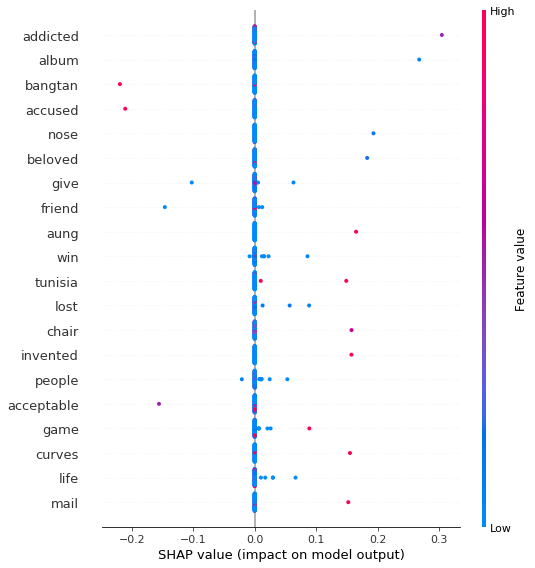

In [136]:
shap.summary_plot(shap_values, X_test.iloc[14800:14900,:])

In [138]:
shap_values500 = explainer.shap_values(X_test.iloc[10000:10500,:], nsamples=500)
shap.force_plot(explainer.expected_value, shap_values500, X_test.iloc[10000:10500,:])

  0%|          | 0/500 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12781069 0.06395073 0.04266412 0.03202085 0.02563491 0.02137764
 0.01833675 0.0160561  0.01428228 0.01286323 0.01170221 0.0107347
 0.00991604 0.00921435 0.00860623 0.00807412 0.00760463 0.00718731
 0.00681393 0.00647789 0.00617386 0.00589747 0.00564513 0.00541382
 0.00520102 0.00500459 0.00482272 0.00465385 0.00449662 0.00434989
 0.00421262 0.00408394 0.00396306 0.00384929 0.00374203 0.00364073
 0.00354492 0.00345414 0.00336803 0.00328623 0.00320842 0.00313432
 0.00306366 0.00299623 0.00293179 0.00287016 0.00281115 0.00275461
 0.00270037 0.00264831 0.0025983  0.0025502  0.00250393 0.00245937
 0.00241644 0.00237504 0.0023351  0.00229654 0.00225928 0.00222327
 0.00218845 0.00215475 0.00212212 0.00209051 0.00205988 0.00203018
 0.00200137 0.00197341 0.00194626 0.00191989 0.00189426 0.00186935
 0.00184512 0.00182155 0.0017986  0.00177627 0.00175452 0.00173332
 0.00171267 0.00169253 0.00167289 0.00165374 0.00163504 0.0016168
 0.00

INFO: num_paired_subset_sizes = 683
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1367.9999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17752142 0.08931202 0.05991348 0.04521772 0.03640313 0.03052916
 0.0263356  0.02319232 0.02074926 0.01879639 0.01720004 0.01587112
 0.01474793 0.01378642 0.01295427 0.01222724 0.01158681 0.01101857
 0.01051114 0.01005541 0.00964402 0.00927094 0.0089312  0.00862064
 0.00833579 0.00807369 0.00783183 0.00760806 0.00740053 0.00720764
 0.00702797 0.00686032 0.00670361 0.00655688 0.0064193  0.00629013
 0.0061687  0.00605441 0.00594675 0.00584522 0.00574939 0.00565889
 0.00557335 0.00549245 0.00541591 0.00534345 0.00527485 0.00520987
 0.00514831 0.00508999 0.00503475 0.00498241 0.00493284 0.00488591
 0.00484149 0.00479948 0.00475976 0.00472224 0.00468684 0.00465347
 0.00462206 0.00459254 0.00456484 0.0045389  0.00451467 0.00449211
 0.00447116 0

INFO: num_paired_subset_sizes = 201
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 404.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.54704449e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.60126468e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  5.02205645e-03  0.00000000e+00
  0.00000000e+00  2.35172825e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.19358345e-04
  1.41519468e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 854
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1710.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16169748 0.08114061 0.05428973 0.04086536 0.03281161 0.02744316
 0.02360919 0.02073427 0.01849872 0.01671074 0.01524827 0.01402993
 0.01299939 0.01211641 0.01135149 0.01068249 0.01009248 0.00956831
 0.00909957 0.00867797 0.00829677 0.00795046 0.00763449 0.00734508
 0.00707904 0.00683367 0.00660669 0.00639612 0.00620026 0.00601766
 0.00584702 0.00568723 0.00553731 0.00539639 0.00526369 0.00513853
 0.00502031 0.00490848 0.00480255 0.00470208 0.00460667 0.00451596
 0.00442963 0.00434738 0.00426894 0.00419406 0.00412251 0.0040541
 0.00398863 0.00392593 0.00386583 0.00380819 0.00375287 0.00369974
 0.00364869 0.00359961 0.00355239 0.00350694 0.00346317 0.003421
 0.00338035 0.00334116 0.00330334 0.00326685 0.00323162 0.0031976
 0.00316474 0.00313297 0.0031

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17189039 0.08639051 0.05789364 0.04364756 0.03510183 0.02940629
 0.02533946 0.0222906  0.01992039 0.01802526 0.01647566 0.01518522
 0.01409414 0.01315972 0.01235064 0.01164341 0.01102007 0.01046665
 0.00997211 0.00952764 0.00912609 0.00876162 0.00842941 0.00812542
 0.00784629 0.00758915 0.00735157 0.00713147 0.00692703 0.00673671
 0.00655915 0.00639316 0.0062377  0.00609184 0.00595477 0.00582577
 0.0057042  0.00558946 0.00548105 0.00537851 0.0052814  0.00518935
 0.00510201 0.00501908 0.00494026 0.0048653  0.00479395 0.00472601
 0.00466127 0.00459955 0.00454068 0.0044845  0.00443087 0.00437966
 0.00433074 0.00428401 0.00423935 0.00419667 0.00415587 0.00411688
 0.00407961 0.00404399 0.00400995 0.00397743 0.00394636 0.00391669
 0.00388838 0.00386136 0.0038356  0.00381106 0.00378768 0.00376544
 0.0037443  0.00372423 0.00370519 0.00368717 0.00367012 0.00365404
 0.00363888 0.00362465 0.0036113  0.00359883 0.00358721 0.00357644
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14479667 0.0725267  0.04843701 0.0363924  0.02916582 0.02434825
 0.02090726 0.01832664 0.01631959 0.01471405 0.01340051 0.01230597
 0.0113799  0.0105862  0.00989838 0.0092966  0.00876568 0.00829381
 0.00787166 0.00749177 0.00714811 0.00683574 0.00655057 0.00628922
 0.00604881 0.00582693 0.00562153 0.00543084 0.00525333 0.00508769
 0.00493278 0.00478758 0.00465121 0.00452289 0.00440194 0.00428774
 0.00417974 0.00407746 0.00398045 0.00388831 0.0038007  0.00371729
 0.00363778 0.00356192 0.00348945 0.00342016 0.00335384 0.0032903
 0.00322939 0.00317093 0.0031148  0.00306084 0.00300894 0.00295899
 0.00291087 0.0028645  0.00281977 0.00277661 0.00273494 0.00269467
 0.00265574 0.00261809 0.00258166 0.00254638 0.00251221 0.00247909
 0.00244699 0.00241584 0.00238562 0.00235628 0.00232779 0.0023001
 0.0022732  0.00224704 0.00222159 0.00219683 0.00217274 0.00214928
 0.00212643 0.00210417 0.00208248 0.00206133 0.00204071 0.0020206
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1207682  0.0604113  0.04029235 ... 0.00021731 0.00021731 0.00021731]
INFO: num_paired_subset_sizes = 1110
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 2222.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14292949 0.0715802  0.04779735 0.03590611 0.02877152 0.02401525
 0.02061803 0.0180702  0.01608865 0.01450348 0.0132066  0.01212593
 0.01121157 0.0104279  0.00974877 0.00915457 0.00863034 0.00816439
 0.00774753 0.0073724  0.00703304 0.00672456 0.00644295 0.00618483
 0.0059474  0.00572827 0.00552539 0.00533704 0.00516171 0.0049981
 0.00484507 0.00470163 0.00456691 0.00444014 0.00432064 0.0042078
 0.00410109 0.00400001 0.00390415 0.00381309 0.0037265  0.00364406
 0.00356547 0.00349048 0.00341884 0.00335033 0.00328476 0.00322194
 0.00316171 0.0031039  0.00304838 0.00299501 0.00294367 0.00289425
 0.00284665 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14874095 0.07452871 0.04979175 0.0374236  0.03000299 0.02505615
 0.02152288 0.01887311 0.01681233 0.01516385 0.01381522 0.01269148
 0.01174074 0.01092592 0.01021984 0.00960211 0.00905714 0.00857281
 0.00813954 0.00774967 0.007397   0.00707646 0.00678387 0.00651572
 0.00626908 0.00604148 0.00583079 0.00563521 0.00545318 0.00528333
 0.0051245  0.00497564 0.00483585 0.00470434 0.00458038 0.00446337
 0.00435272 0.00424794 0.00414858 0.00405422 0.00396452 0.00387912
 0.00379774 0.0037201  0.00364595 0.00357507 0.00350723 0.00344227
 0.00337999 0.00332024 0.00326287 0.00320774 0.00315473 0.00310371
 0.00305459 0.00300725 0.00296161 0.00291758 0.00287508 0.00283402
 0.00279434 0.00275598 0.00271886 0.00268294 0.00264816 0.00261446
 0.00258179 0.00255012 0.0025194  0.00248959 0.00246064 0.00243253
 0.00240522 0.00237868 0.00235288 0.00232778 0.00230337 0.00227961
 0.00225648 0.00223396 0.00221202 0.00219065 0.00216982 0.00214951
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11906692e-01 5.59664347e-02 3.73196862e-02 ... 1.04634726e-04
 1.04634634e-04 1.04634588e-04]
INFO: num_paired_subset_sizes = 2138
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4277.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14981431 0.07507436 0.05016154 0.03770551 0.03023219 0.02525023
 0.02169191 0.01902337 0.016948   0.01528787 0.01392972 0.01279806
 0.01184063 0.01102009 0.01030906 0.00968701 0.00913825 0.00865054
 0.00821427 0.0078217  0.0074666  0.00714386 0.00684926 0.00657929
 0.00633098 0.00610183 0.00588973 0.00569284 0.00550959 0.00533862
 0.00517874 0.0050289  0.00488821 0.00475584 0.00463109 0.00451333
 0.00440198 0.00429654 0.00419656 0.00410162 0.00401137 0.00392546
 0.00384359 0.00376548 0.0036909  0.0036196  0.00355138 0.00348604
 0.00342341 0.00336333 0.00330565 0.00325022 0.00319693 0.00314565
 0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14720463 0.07374835 0.04926331 0.03702109 0.02967598 0.02477945
 0.02128209 0.01865922 0.01661935 0.01498757 0.01365259 0.01254021
 0.01159905 0.01079244 0.01009346 0.00948193 0.00894242 0.00846293
 0.00803397 0.00764798 0.00729881 0.00698144 0.00669172 0.00642621
 0.00618198 0.0059566  0.00574796 0.00555427 0.00537399 0.00520577
 0.00504844 0.004901   0.00476253 0.00463225 0.00450945 0.00439352
 0.00428389 0.00418007 0.00408161 0.00398811 0.0038992  0.00381457
 0.00373391 0.00365694 0.00358343 0.00351315 0.0034459  0.00338147
 0.00331971 0.00326045 0.00320355 0.00314886 0.00309627 0.00304565
 0.00299691 0.00294993 0.00290464 0.00286093 0.00281873 0.00277796
 0.00273856 0.00270046 0.0026636  0.00262791 0.00259335 0.00255986
 0.0025274  0.00249592 0.00246537 0.00243573 0.00240694 0.00237898
 0.00235181 0.0023254  0.00229972 0.00227474 0.00225043 0.00222677
 0.00220373 0.00218129 0.00215943 0.00213813 0.00211736 0.00209711
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11634572e-01 5.58300615e-02 3.72285621e-02 ... 1.02136058e-04
 1.02135973e-04 1.02135930e-04]
INFO: num_paired_subset_sizes = 2185
INFO: weight_left = 0.9999999999999997
INFO: np.sum(w_aug) = 4370.999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999993
INFO: phi = [0.         0.         0.         ... 0.         0.         0.00734681]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1787498  0.08995151 0.06035708 0.04556368 0.03669075 0.03077811
 0.02655711 0.02339343 0.02093466 0.01896937 0.01736299 0.01602584
 0.01489582 0.01392856 0.01309153 0.01236036 0.01171637 0.01114507
 0.010635   0.010177   0.00976364 0.00938888 0.00904769 0.00873589
 0.00844999 0.00818701 0.00794444 0.00772009 0.00751211 0.00731889
 0.00713901 0.00697124 0.00681451 0.00666785 0.00653044 0.00640151
 0.0062804  0.00616651 0.00605932 0.00595833 0.00586311 0.00577329
 0.00568849 0.0056084  0.00553273 0.00546122 0.00539361 0.0053

INFO: num_paired_subset_sizes = 355
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 711.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.73950686e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.12499278e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.82450879e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.04025563e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18028329 0.09075905 0.06092332 0.0460098  0.03706524 0.03110522
 0.0268507  0.02366218 0.02118437 0.01920409 0.0175857  0.01623875
 0.01510065 0.01412668 0.01328403 0.01254813 0.01190015 0.01132549
 0.01081258 0.0103522  0.00993687 0.00956048 0.00921796 0.00890512
 0.00861842 0.00835487 0.00811192 0.00788739 0.00767941 0.00748634
 0.00730677 0.00713945 0.00698331 0.00683737 0.00670079 0.00657283
 0.0064528  0.00634011 0.00623421 0.00613464 0.00604095 0.00595275
 0.00586969 0.00579144 0.00571772 0.00564826 0.00558282 0.00552118
 0.00546313 0.0054085  0.00535711 0.00530882 0.00526348 0.00522097
 0.00518116 0.00514395 0.00510924 0.00507694 0.00504697 0.00501925
 0.00499371 0.0049703  0.00494895 0.00492962 0.00491226 0.00489683
 0.0048833  0.00487163 0.00486179 0.00485378 0.00484757 0.00484314
 0.00484048 0.0048396 ]
INFO: num_paired_subset_sizes = 73
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 147.9999999999999

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17471784 0.08786098 0.05891257 0.04444131 0.03576096 0.0299761
 0.02584583 0.02274972 0.02034306 0.01841905 0.01684607 0.01553639
 0.01442927 0.01348131 0.01266071 0.0119436  0.01131174 0.01075092
 0.01024996 0.00979988 0.00939343 0.00902468 0.00868872 0.00838148
 0.0080995  0.0078399  0.0076002  0.00737829 0.00717233 0.00698074
 0.00680214 0.00663533 0.00647926 0.00633298 0.00619567 0.00606659
 0.00594509 0.00583059 0.00572256 0.00562052 0.00552405 0.00543277
 0.00534632 0.0052644  0.0051867  0.00511298 0.00504299 0.0049765
 0.00491333 0.00485327 0.00479618 0.00474188 0.00469023 0.00464111
 0.00459438 0.00454994 0.00450768 0.00446751 0.00442932 0.00439305
 0.00435861 0.00432592 0.00429493 0.00426557 0.00423779 0.00421152
 0.00418672 0.00416335 0.00414135 0.0041207  0.00410136 0.00408328
 0.00406645 0.00405082 0.00403639 0.00402311 0.00401097 0.00399995
 0.00399003 0.0039812  0.00397344 0.00396674 0.00396109 0.00395647
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15074495 0.07554776 0.05048257 0.03795039 0.03043142 0.02541904
 0.02183902 0.01915421 0.01706621 0.01539599 0.0140296  0.01289109
 0.01192786 0.01110237 0.01038706 0.00976128 0.00920922 0.00871861
 0.00827973 0.00788484 0.00752764 0.007203   0.00690667 0.00663512
 0.00638536 0.0061549  0.00594157 0.00574355 0.00555926 0.00538732
 0.00522654 0.00507586 0.00493439 0.00480129 0.00467586 0.00455745
 0.00444551 0.00433951 0.00423899 0.00414356 0.00405284 0.00396649
 0.0038842  0.00380571 0.00373075 0.00365911 0.00359055 0.00352491
 0.00346198 0.00340163 0.00334368 0.00328801 0.00323448 0.00318298
 0.0031334  0.00308563 0.00303958 0.00299516 0.00295229 0.00291089
 0.00287089 0.00283222 0.00279482 0.00275862 0.00272358 0.00268965
 0.00265676 0.00262488 0.00259397 0.00256397 0.00253486 0.0025066
 0.00247915 0.00245248 0.00242656 0.00240136 0.00237685 0.002353
 0.0023298  0.00230721 0.00228522 0.0022638  0.00224293 0.0022226
 0.0022

INFO: num_paired_subset_sizes = 83
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 168.00000000000006
INFO: np.sum(self.kernelWeights) = 1.0000000000000002
INFO: phi = [ 0.00000000e+00  4.32481244e-03  0.00000000e+00  2.14749814e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.39162301e-03
  0.00000000e+00  0.00000000e+00  9.96671518e-04 -7.21618815e-05
  3.32227127e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  6.14394999e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.43528153e-02  5.68710380e-03  7.67143945e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.91842623e-03
  4.14741392e-03  0.00000000e+00  0.00000000e+00  3.65191137e-03
  0.00000000e+00  0.00000000e+00  2.47724400e-04  1.30930504e-03
  2.91670062e-03  0.00000000e+00 -2.50787847e-04  0.00000000e+00
  7.06070886e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.486

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11054431e-01 5.55393498e-02 3.70343264e-02 ... 9.70120202e-05
 9.70119647e-05 9.70119462e-05]
INFO: num_paired_subset_sizes = 2288
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 4578.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1735044  0.08722625 0.05847035 0.04409504 0.03547201 0.02972515
 0.02562184 0.02254577 0.02015455 0.01824275 0.01667963 0.01537804
 0.01427764 0.01333534 0.01251953 0.01180651 0.01117815 0.01062036
 0.01012201 0.00967418 0.00926969 0.00890262 0.00856812 0.00826211
 0.0079812  0.0077225  0.00748355 0.00726224 0.00705677 0.00686555
 0.00668722 0.00652059 0.0063646  0.00621831 0.00608092 0.00595168
 0.00582995 0.00571515 0.00560675 0.00550428 0.00540732 0.00531549
 0.00522843 0.00514584 0.00506743 0.00499293 0.00492211 0.00485475
 0.00479064 0.0047296  0.00467147 0.00461608 0.0045632

INFO: num_paired_subset_sizes = 356
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 714.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.15662677e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.84776707e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -7.37966948e-04  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11906692e-01 5.59664347e-02 3.73196862e-02 ... 1.04634726e-04
 1.04634634e-04 1.04634588e-04]
INFO: num_paired_subset_sizes = 2138
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4276.999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17712587 0.08910626 0.05977087 0.04510659 0.0363108  0.03044931
 0.0262646  0.0231279  0.02068992 0.01874106 0.01714796 0.0158217
 0.01470073 0.01374108 0.01291051 0.01218483 0.01154557 0.01097832
 0.01047175 0.01001677 0.00960603 0.00923352 0.00889426 0.00858411
 0.00829961 0.00803781 0.0077962  0.00757264 0.00736527 0.0071725
 0.00699293 0.00682534 0.00666865 0.00652192 0.00638432 0.00625509
 0.00613358 0.0060192  0.0059114  0.00580973 0.00571374 0.00562304
 0.00553729 0.00545617 0.00537938 0.00530666 0.00523776 0.00517248
 0.0051106  0.00505194 0.00499633 0.00494361 0.00489364 0.00

INFO: np.sum(w_aug) = 705.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.40384943e-02
  0.00000000e+00  4.03983352e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  7.35205634e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  9.08595069e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.39705473e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14237487 0.07129972 0.04760824 0.03576267 0.02865548 0.02391747
 0.02053328 0.01799523 0.01602127 0.01444218 0.01315026 0.01207372
 0.01116286 0.01038218 0.00970564 0.00911371 0.00859147 0.0081273
 0.00771202 0.00733831 0.00700024 0.00669293 0.00641237 0.00615523
 0.00591869 0.00570038 0.00549827 0.00531062 0.00513595 0.00497294
 0.00482048 0.00467757 0.00454335 0.00441704 0.00429798 0.00418556
 0.00407923 0.00397853 0.00388301 0.00379228 0.00370601 0.00362386
 0.00354555 0.00347082 0.00339944 0.00333117 0.00326583 0.00320323
 0.00314321 0.0030856  0.00303027 0.00297708 0.00292592 0.00287667
 0.00282923 0.0027835  0.00273939 0.00269682 0.0026557  0.00261597
 0.00257756 0.00254041 0.00250445 0.00246963 0.00243589 0.00240319
 0.00237148 0.00234072 0.00231087 0.00228188 0.00225372 0.00222636
 0.00219976 0.0021739  0.00214874 0.00212425 0.00210041 0.0020772
 0.00205459 0.00203255 0.00201108 0.00199014 0.00196972 0.00194979
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1666599  0.08369069 0.05603637 0.0422108  0.03391675 0.02838847
 0.02444064 0.02148061 0.01917912 0.01733861 0.01583337 0.0145796
 0.01351926 0.01261093 0.01182419 0.01113626 0.01052971 0.00999098
 0.00950937 0.00907631 0.00868488 0.0083294  0.0080052  0.00770835
 0.0074356  0.00718415 0.00695165 0.00673608 0.00653568 0.00634895
 0.00617456 0.00601136 0.00585835 0.00571462 0.00557938 0.00545193
 0.00533165 0.00521796 0.00511037 0.00500843 0.00491172 0.00481988
 0.00473257 0.00464948 0.00457034 0.0044949  0.00442291 0.00435418
 0.0042885  0.00422569 0.0041656  0.00410806 0.00405295 0.00400011
 0.00394945 0.00390084 0.00385418 0.00380937 0.00376633 0.00372496
 0.0036852  0.00364696 0.00361019 0.00357481 0.00354076 0.00350799
 0.00347645 0.00344609 0.00341685 0.0033887  0.0033616  0.0033355
 0.00331037 0.00328617 0.00326288 0.00324045 0.00321887 0.00319811
 0.00317813 0.00315891 0.00314044 0.00312269 0.00310563 0.00308925
 0.00

INFO: num_paired_subset_sizes = 902
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1806.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17418407 0.08757858 0.05871373 0.04428409 0.03562856 0.02986013
 0.02574149 0.022654   0.02025396 0.01833517 0.01676638 0.01546012
 0.01435583 0.01341024 0.01259162 0.01187619 0.01124574 0.01068614
 0.0101862  0.009737   0.00933129 0.00896316 0.00862772 0.0083209
 0.00803926 0.00777993 0.00754044 0.00731866 0.00711278 0.00692122
 0.00674261 0.00657574 0.00641956 0.00627314 0.00613564 0.00600635
 0.0058846  0.00576981 0.00566145 0.00555907 0.00546222 0.00537053
 0.00528364 0.00520125 0.00512306 0.00504881 0.00497827 0.00491121
 0.00484742 0.00478674 0.00472898 0.00467399 0.00462163 0.00457176
 0.00452426 0.00447902 0.00443593 0.00439489 0.00435581 0.00431861
 0.00428321 0.00424954 0.00421753 0.00418712 0.00415824 0.00413085
 0.00410489 0.00408031 0.0

INFO: num_paired_subset_sizes = 819
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1639.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16031627 0.08043454 0.05380857 0.04049656 0.03251013 0.0271865
 0.02338448 0.02053347 0.01831646 0.01654327 0.01509286 0.01388453
 0.01286243 0.01198665 0.01122793 0.01056432 0.00997904 0.00945905
 0.00899403 0.00857574 0.00819751 0.00785388 0.00754033 0.00725311
 0.00698907 0.00674552 0.0065202  0.00631115 0.0061167  0.00593537
 0.00576592 0.00560722 0.00545829 0.00531829 0.00518644 0.00506207
 0.00494457 0.00483341 0.00472809 0.00462818 0.00453328 0.00444305
 0.00435715 0.0042753  0.00419721 0.00412266 0.00405141 0.00398327
 0.00391803 0.00385554 0.00379563 0.00373814 0.00368296 0.00362994
 0.00357898 0.00352997 0.00348279 0.00343737 0.00339362 0.00335144
 0.00331077 0.00327153 0.00323366 0.0031971  0.00316178 0.00312765
 0.00309466 0.00306276 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15464959 0.07753723 0.05183389 0.0389828  0.03127263 0.02613292
 0.02246204 0.01970918 0.01756835 0.01585593 0.01445508 0.01328792
 0.01230052 0.01145436 0.0107212  0.01007984 0.00951409 0.00901135
 0.00856167 0.0081571  0.00779118 0.00745866 0.00715517 0.00687708
 0.00662136 0.00638542 0.00616706 0.0059644  0.00577582 0.00559991
 0.00543545 0.00528135 0.00513669 0.00500063 0.00487243 0.00475144
 0.00463707 0.00452881 0.00442618 0.00432877 0.00423618 0.00414808
 0.00406416 0.00398413 0.00390773 0.00383472 0.0037649  0.00369805
 0.00363401 0.0035726  0.00351367 0.00345707 0.00340268 0.00335037
 0.00330004 0.00325156 0.00320485 0.00315982 0.00311639 0.00307446
 0.00303397 0.00299486 0.00295705 0.00292048 0.00288511 0.00285086
 0.00281771 0.00278559 0.00275446 0.00272428 0.00269502 0.00266662
 0.00263907 0.00261232 0.00258635 0.00256112 0.00253661 0.00251278
 0.00248962 0.00246709 0.00244519 0.00242387 0.00240313 0.00238294
 0.

INFO: num_paired_subset_sizes = 241
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 484.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.31234065e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.83670982e-03  0.00000000e+00  0.00000000e+00  2.04722838e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 316
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 633.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.         -0.00185026  0.          0.01744054  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00245461  0.          0.          0.          0.          0.
  0.01309539  0.          0.00299366  0.         -0.00203863 -0.00190289
  0.          0.          0.          0.00432283  0.          0.
  0.          0.01265602  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.0062555   0.          0.          0.      

INFO: num_paired_subset_sizes = 490
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 982.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.35178012e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.99713316e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14595681 0.07311507 0.04883483 0.03669497 0.02941126 0.02455563
 0.02108747 0.01848648 0.01646361 0.01484542 0.01352154 0.0124184
 0.01148506 0.01068513 0.00999193 0.00938544 0.00885038 0.00837483
 0.00794939 0.00756656 0.00722024 0.00690546 0.00661809 0.00635473
 0.00611248 0.00588891 0.00568194 0.0054898  0.00531095 0.00514406
 0.00498798 0.0048417  0.00470431 0.00457505 0.0044532  0.00433816
 0.00422937 0.00412634 0.00402863 0.00393583 0.00384759 0.00376359
 0.00368352 0.00360712 0.00353414 0.00346437 0.00339759 0.00333363
 0.0032723  0.00321345 0.00315694 0.00310263 0.00305039 0.00300011
 0.00295169 0.00290502 0.00286001 0.00281658 0.00277465 0.00273413
 0.00269497 0.0026571  0.00262045 0.00258497 0.00255061 0.00251731
 0.00248502 0.00245371 0.00242333 0.00239383 0.00236519 0.00233737
 0.00231033 0.00228404 0.00225848 0.00223361 0.0022094  0.00218584
 0.00216289 0.00214054 0.00211876 0.00209753 0.00207683 0.00205665
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16582805 0.08326536 0.05574645 0.04198851 0.03373498 0.02823365
 0.02430504 0.02135937 0.01906902 0.01723739 0.01573939 0.01449161
 0.01343632 0.01253229 0.01174925 0.01106454 0.01046081 0.00992456
 0.00944514 0.00901405 0.00862437 0.00827046 0.00794767 0.00765211
 0.00738052 0.00713012 0.00689859 0.00668389 0.00648428 0.00629828
 0.00612455 0.00596196 0.0058095  0.00566627 0.00553149 0.00540446
 0.00528456 0.00517122 0.00506394 0.00496228 0.00486582 0.0047742
 0.00468709 0.00460418 0.00452519 0.00444987 0.00437799 0.00430935
 0.00424374 0.00418098 0.00412092 0.0040634  0.00400829 0.00395544
 0.00390474 0.00385609 0.00380937 0.00376449 0.00372136 0.00367989
 0.00364002 0.00360165 0.00356474 0.00352921 0.003495   0.00346205
 0.00343033 0.00339976 0.00337032 0.00334194 0.0033146  0.00328826
 0.00326287 0.0032384  0.00321483 0.00319211 0.00317022 0.00314914
 0.00312883 0.00310928 0.00309045 0.00307233 0.0030549  0.00303813
 0.0

INFO: phi = [ 0.00000000e+00 -9.89898979e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.78106299e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.62031235e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.34815575e-04  0.00000000e+00  0.00000000e+00
  0.00000000e

INFO: num_paired_subset_sizes = 92
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 185.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.44063069e-03 -5.34771995e-03  2.61920282e-03 -3.87180531e-03
  0.00000000e+00  2.31127370e-03  0.00000000e+00 -4.10895430e-03
  0.00000000e+00  2.81638361e-03  0.00000000e+00  0.00000000e+00
  1.55438911e-03  0.00000000e+00  0.00000000e+00 -2.11104736e-03
 -3.94129807e-03 -3.03723110e-03  1.31517582e-03 -1.46410907e-03
  0.00000000e+00  2.05164527e-03 -2.97038832e-03 -1.08018400e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  9.31486762e-04  0.00000000e+00 -2.44126451e-03 -5.88891893e-03
  1.79366548e-03 -8.01396731e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -2.56115773e-03  1.15463650e-03
  0.00000000e+00  8.13522271e-04 -1.028

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.10068508e-01 5.50453497e-02 3.67042998e-02 ... 8.87113239e-05
 8.87112807e-05 8.87112663e-05]
INFO: num_paired_subset_sizes = 2480
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4962.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14981431 0.07507436 0.05016154 0.03770551 0.03023219 0.02525023
 0.02169191 0.01902337 0.016948   0.01528787 0.01392972 0.01279806
 0.01184063 0.01102009 0.01030906 0.00968701 0.00913825 0.00865054
 0.00821427 0.0078217  0.0074666  0.00714386 0.00684926 0.00657929
 0.00633098 0.00610183 0.00588973 0.00569284 0.00550959 0.00533862
 0.00517874 0.0050289  0.00488821 0.00475584 0.00463109 0.00451333
 0.00440198 0.00429654 0.00419656 0.00410162 0.00401137 0.00392546
 0.00384359 0.00376548 0.0036909  0.0036196  0.00355138 0.00348604
 0.00342341 0.00336333 0.00330565 0.00325022 0.00319693 0.00314565
 0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.10947091e-01 5.54855632e-02 3.69983907e-02 ... 9.60789513e-05
 9.60788973e-05 9.60788793e-05]
INFO: num_paired_subset_sizes = 2308
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4618.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12367535 0.0618715  0.04127024 0.03096963 0.02478928 0.02066906
 0.01772606 0.01551881 0.01380208 0.01242869 0.01130502 0.01036864
 0.00957632 0.00889719 0.00830862 0.00779363 0.00733922 0.00693531
 0.00657393 0.00624868 0.00595441 0.0056869  0.00544266 0.00521877
 0.00501279 0.00482266 0.00464662 0.00448316 0.00433097 0.00418893
 0.00405606 0.00393149 0.00381448 0.00370435 0.00360051 0.00350245
 0.00340969 0.00332181 0.00323845 0.00315925 0.00308392 0.00301217
 0.00294377 0.00287848 0.00281609 0.00275641 0.00269928 0.00264453
 0.00259201 0.0025416  0.00249316 0.00244659 0.00240178 0.00235863
 0

INFO: num_paired_subset_sizes = 914
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1830.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17814052 0.08964122 0.06014637 0.0454027  0.03655956 0.03066673
 0.02645985 0.02330672 0.02085612 0.01889734 0.01729627 0.01596351
 0.01483717 0.01387305 0.01303872 0.01230989 0.01166794 0.01109844
 0.01058995 0.01013336 0.00972126 0.00934761 0.00900743 0.00869654
 0.00841145 0.0081492  0.00790728 0.00768353 0.00747609 0.00728335
 0.0071039  0.00693652 0.00678014 0.00663379 0.00649665 0.00636796
 0.00624705 0.00613335 0.0060263  0.00592544 0.00583032 0.00574057
 0.00565583 0.00557577 0.00550011 0.00542858 0.00536095 0.00529698
 0.00523648 0.00517927 0.00512517 0.00507403 0.00502571 0.00498007
 0.00493699 0.00489637 0.0048581  0.00482208 0.00478823 0.00475647
 0.00472673 0.00469894 0.00467303 0.00464895 0.00462664 0.00460607
 0.00458718 0.00456994 0.

INFO: num_paired_subset_sizes = 387
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 775.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -6.08906861e-05  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.17899858e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.29979647e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.91741720e-03  8.98868253e-03  1.08340605e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.08326735e-03
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17269165 0.08681005 0.0581862  0.04387682 0.03529327 0.02957265
 0.02548803 0.02242593 0.02004552 0.01814233 0.0165862  0.01529041
 0.01419487 0.01325671 0.01244445 0.0117345  0.01110882 0.01055338
 0.0100571  0.00961111 0.00920825 0.00884264 0.00850944 0.00820461
 0.00792475 0.00766698 0.00742888 0.00720833 0.00700354 0.00681294
 0.00663516 0.00646902 0.00631346 0.00616756 0.0060305  0.00590156
 0.00578009 0.0056655  0.00555728 0.00545496 0.00535811 0.00526636
 0.00517936 0.0050968  0.00501839 0.00494387 0.004873   0.00480556
 0.00474135 0.00468019 0.00462192 0.00456637 0.00451339 0.00446287
 0.00441467 0.00436869 0.00432481 0.00428294 0.00424298 0.00420486
 0.0041685  0.00413381 0.00410074 0.00406922 0.00403919 0.0040106
 0.00398339 0.00395752 0.00393294 0.00390961 0.00388749 0.00386654
 0.00384673 0.00382804 0.00381042 0.00379386 0.00377832 0.00376379
 0.00375024 0.00373765 0.00372601 0.00371529 0.00370549 0.00369658
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15681759 0.07864285 0.05258554 0.03955759 0.03174139 0.02653107
 0.02280983 0.02001927 0.01784916 0.01611337 0.01469345 0.01351044
 0.01250967 0.01165208 0.01090905 0.01025909 0.00968579 0.00917637
 0.00872074 0.00831084 0.00794013 0.00760328 0.00729586 0.00701421
 0.00675522 0.00651629 0.00629519 0.00609    0.00589909 0.00572103
 0.00555458 0.00539864 0.00525226 0.00511461 0.00498493 0.00486256
 0.00474691 0.00463745 0.0045337  0.00443525 0.00434169 0.00425268
 0.00416791 0.00408709 0.00400995 0.00393626 0.00386579 0.00379835
 0.00373375 0.00367183 0.00361242 0.00355538 0.00350058 0.00344789
 0.00339721 0.00334842 0.00330142 0.00325613 0.00321246 0.00317032
 0.00312965 0.00309036 0.00305241 0.00301572 0.00298024 0.00294592
 0.0029127  0.00288053 0.00284938 0.00281919 0.00278993 0.00276157
 0.00273406 0.00270736 0.00268146 0.00265632 0.0026319  0.00260819
 0.00258516 0.00256278 0.00254103 0.00251988 0.00249932 0.00247933
 0.

INFO: num_paired_subset_sizes = 301
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 603.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.49467865e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.62233650e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.59187033e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.51747648e-03  0.00000000e+00  0.00000000e+00
  4.17699546e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11386242e-01 5.57056165e-02 3.71454118e-02 ... 9.98980951e-05
 9.98980147e-05 9.98979745e-05]
INFO: num_paired_subset_sizes = 2229
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4459.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16582805 0.08326536 0.05574645 0.04198851 0.03373498 0.02823365
 0.02430504 0.02135937 0.01906902 0.01723739 0.01573939 0.01449161
 0.01343632 0.01253229 0.01174925 0.01106454 0.01046081 0.00992456
 0.00944514 0.00901405 0.00862437 0.00827046 0.00794767 0.00765211
 0.00738052 0.00713012 0.00689859 0.00668389 0.00648428 0.00629828
 0.00612455 0.00596196 0.0058095  0.00566627 0.00553149 0.00540446
 0.00528456 0.00517122 0.00506394 0.00496228 0.00486582 0.0047742
 0.00468709 0.00460418 0.00452519 0.00444987 0.00437799 0.00430935
 0.00424374 0.00418098 0.00412092 0.0040634  0.00400829 0.00395544
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.06653666e-01 5.33348704e-02 3.55619400e-02 ... 6.42685896e-05
 6.42685663e-05 6.42685546e-05]
INFO: num_paired_subset_sizes = 3318
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 6636.999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16765963 0.08420573 0.05639002 0.04248389 0.0341416  0.02858125
 0.02461059 0.0216335  0.0193188  0.01746779 0.01595402 0.01469318
 0.01362691 0.01271353 0.01192246 0.01123079 0.01062097 0.01007938
 0.00959524 0.00915994 0.00876652 0.00840926 0.00808346 0.00778519
 0.00751115 0.00725855 0.00702502 0.00680851 0.00660728 0.00641979
 0.00624472 0.00608092 0.00592736 0.00578315 0.00564748 0.00551966
 0.00539904 0.00528508 0.00517725 0.0050751  0.00497823 0.00488626
 0.00479884 0.00471569 0.00463651 0.00456106 0.00448909 0.0044204
 0.0043548  0.00429209 0.00423211 0.00417472

INFO: num_paired_subset_sizes = 872
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 1744.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18119723 0.09123663 0.0612558  0.04627001 0.03728231 0.03129372
 0.02701898 0.02381544 0.02132609 0.01933672 0.01771101 0.01635808
 0.01521503 0.01423692 0.0133908  0.01265195 0.01200148 0.01142469
 0.01090998 0.01044807 0.01003144 0.00965395 0.00931053 0.00899695
 0.00870965 0.00844563 0.00820234 0.00797759 0.00776948 0.00757638
 0.00739686 0.00722969 0.00707377 0.00692813 0.00679193 0.0066644
 0.00654489 0.00643277 0.00632752 0.00622865 0.00613573 0.00604837
 0.0059662  0.00588891 0.00581621 0.00574783 0.00568353 0.00562309
 0.00556632 0.00551302 0.00546304 0.00541622 0.00537242 0.00533152
 0.0052934  0.00525796 0.00522509 0.00519471 0.00516674 0.00514111
 0.00511776 0.00509662 0.00507764 0.00506078 0.005046   0.00503326

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15374746 0.0770771  0.05152103 0.03874354 0.03107749 0.02596715
 0.02231723 0.01958007 0.01745142 0.01574873 0.01435582 0.01319526
 0.01221343 0.01137203 0.01064298 0.0100052  0.0094426  0.00894265
 0.00849545 0.0080931  0.00772918 0.00739846 0.00709661 0.00682002
 0.00656567 0.00633097 0.00611376 0.00591216 0.00572456 0.00554955
 0.00538592 0.0052326  0.00508866 0.00495327 0.0048257  0.00470529
 0.00459147 0.00448371 0.00438155 0.00428458 0.00419241 0.0041047
 0.00402114 0.00394144 0.00386536 0.00379265 0.0037231  0.00365652
 0.00359272 0.00353153 0.00347281 0.00341641 0.0033622  0.00331006
 0.00325988 0.00321155 0.00316497 0.00312006 0.00307674 0.00303491
 0.00299452 0.00295548 0.00291775 0.00288124 0.00284592 0.00281173
 0.00277861 0.00274653 0.00271542 0.00268527 0.00265601 0.00262763
 0.00260008 0.00257332 0.00254734 0.00252209 0.00249755 0.00247369
 0.00245049 0.00242793 0.00240597 0.00238461 0.00236381 0.00234356
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1434018  0.07181941 0.04795888 0.03602881 0.02887093 0.02409914
 0.02069083 0.0181347  0.01614669 0.01455636 0.01325526 0.01217108
 0.01125375 0.01046754 0.0097862  0.00919009 0.00866416 0.00819671
 0.00777851 0.00740217 0.00706172 0.00675225 0.00646974 0.0062108
 0.00597261 0.00575278 0.00554927 0.00536032 0.00518443 0.00502031
 0.00486679 0.00472291 0.00458777 0.0044606  0.00434073 0.00422755
 0.00412051 0.00401912 0.00392296 0.00383164 0.00374479 0.00366209
 0.00358327 0.00350805 0.0034362  0.00336749 0.00330173 0.00323873
 0.00317832 0.00312034 0.00306466 0.00301114 0.00295966 0.0029101
 0.00286237 0.00281636 0.00277198 0.00272915 0.00268779 0.00264782
 0.00260918 0.00257181 0.00253564 0.00250062 0.00246669 0.00243381
 0.00240192 0.00237099 0.00234097 0.00231182 0.00228352 0.00225601
 0.00222927 0.00220327 0.00217798 0.00215337 0.00212942 0.00210609
 0.00208337 0.00206123 0.00203965 0.00201862 0.0019981  0.00197809
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11427261 0.05715239 0.03811232 ... 0.00012858 0.00012858 0.00012858]
INFO: num_paired_subset_sizes = 1776
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3554.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12856455 0.06433    0.04291853 0.03221283 0.02578944 0.0215072
 0.01844848 0.01615446 0.01437023 0.01294287 0.01177504 0.01080186
 0.00997841 0.00927261 0.00866092 0.0081257  0.00765346 0.0072337
 0.00685813 0.00652013 0.00621432 0.00593632 0.0056825  0.00544984
 0.0052358  0.00503823 0.0048553  0.00468544 0.0045273  0.00437971
 0.00424164 0.00411221 0.00399063 0.0038762  0.00376832 0.00366643
 0.00357006 0.00347876 0.00339215 0.00330987 0.00323161 0.00315708
 0.00308603 0.0030182  0.00295339 0.0028914  0.00283206 0.00277519
 0.00272064 0.00266828 0.00261798 0.00256961 0.00252308 0.00247826
 0.00243509 0.00239345 0.0023

INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 2907.999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11633125 0.05818473 0.03880256 ... 0.00015267 0.00015267 0.00015267]
INFO: num_paired_subset_sizes = 1523
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3047.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12842987 0.06426229 0.04287315 0.03217861 0.02576191 0.02148414
 0.01842861 0.01613698 0.01435461 0.01292873 0.01176212 0.01078995
 0.00996736 0.00926229 0.00865125 0.00811659 0.00764484 0.00722551
 0.00685033 0.00651268 0.00620719 0.00592948 0.00567593 0.00544351
 0.00522969 0.00503232 0.00484958 0.0046799  0.00452192 0.00437448
 0.00423656 0.00410726 0.00398581 0.0038715  0.00376373 0.00366195
 0.00356567 0.00347447 0.00338795 0.00330575 0.00322757 0.0

INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12449865 0.0622852  0.04154742 0.03117854 0.02495723 0.02080971
 0.01784721 0.01562534 0.01389723 0.01251475 0.01138363 0.01044105
 0.00964348 0.00895986 0.00836739 0.00784899 0.00739158 0.00698499
 0.00662121 0.00629382 0.0059976  0.00572832 0.00548246 0.00525709
 0.00504976 0.00485837 0.00468117 0.00451663 0.00436343 0.00422046
 0.00408671 0.00396132 0.00384353 0.00373268 0.00362816 0.00352945
 0.00343608 0.00334763 0.00326371 0.003184   0.00310817 0.00303596
 0.0029671  0.00290138 0.00283858 0.00277852 0.00272101 0.0026659
 0.00261304 0.0025623  0.00251354 0.00246667 0.00242157 0.00237813
 0.00233628 0.00229593 0.00225699 0.0022194  0.00218308 0.00214798
 0.00211403 0.00208117 0.00204936 0.00201855 0.00198868 0.00195972
 0.00193163 0.00190436 0.00187789 0.00185217 0.00182718 0.00180288
 0.00177925 0.00175627 0.00173389 0.00171211 0.0

INFO: num_paired_subset_sizes = 868
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1737.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15458154 0.07750137 0.05180875 0.03896302 0.03125605 0.02611846
 0.0224491  0.01969737 0.01755741 0.01584568 0.01444541 0.01327871
 0.0122917  0.01144588 0.010713   0.01007189 0.00950635 0.0090038
 0.00855429 0.00814986 0.00778407 0.00745166 0.00714828 0.00687029
 0.00661465 0.00637879 0.00616049 0.0059579  0.00576937 0.00559351
 0.00542909 0.00527504 0.00513041 0.00499438 0.00486621 0.00474525
 0.0046309  0.00452266 0.00442005 0.00432264 0.00423007 0.00414198
 0.00405807 0.00397804 0.00390165 0.00382864 0.00375882 0.00369198
 0.00362793 0.00356652 0.00350758 0.00345098 0.00339659 0.00334427
 0.00329392 0.00324544 0.00319872 0.00315368 0.00311022 0.00306829
 0.00302778 0.00298865 0.00295083 0.00291424 0.00287885 0.00284458
 0.00281141 0.00277927 0.0

INFO: num_paired_subset_sizes = 451
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 903.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.19913719e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.53593837e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.81549633e-03
  0.00000000e+00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14791026 0.07410668 0.0495059  0.03720582 0.02982603 0.02490638
 0.02139252 0.01875729 0.01670781 0.01506836 0.01372711 0.0126095
 0.01166394 0.01085356 0.01015131 0.00953694 0.00899492 0.0085132
 0.00808226 0.00769448 0.0073437  0.00702488 0.00673383 0.00646711
 0.00622177 0.00599537 0.00578579 0.00559123 0.00541014 0.00524117
 0.00508315 0.00493505 0.00479598 0.00466513 0.0045418  0.00442536
 0.00431526 0.004211   0.00411212 0.00401823 0.00392895 0.00384397
 0.00376297 0.0036857  0.00361189 0.00354133 0.00347381 0.00340913
 0.00334713 0.00328764 0.00323052 0.00317563 0.00312284 0.00307204
 0.00302312 0.00297598 0.00293052 0.00288666 0.00284432 0.00280342
 0.00276389 0.00272566 0.00268868 0.00265288 0.00261821 0.00258462
 0.00255207 0.00252049 0.00248987 0.00246014 0.00243128 0.00240325
 0.00237601 0.00234954 0.00232379 0.00229876 0.0022744  0.00225069
 0.00222761 0.00220513 0.00218323 0.00216189 0.00214109 0.00212081
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15337415 0.07688678 0.05139169 0.03864467 0.03099688 0.02589871
 0.02225746 0.0195268  0.0174032  0.01570453 0.01431492 0.0131571
 0.01217757 0.01133814 0.01061079 0.0099745  0.00941321 0.00891441
 0.00846824 0.00806681 0.00770372 0.00737376 0.00707259 0.00679662
 0.00654283 0.00630866 0.00609193 0.00589077 0.00570357 0.00552894
 0.00536566 0.00521266 0.00506902 0.00493391 0.0048066  0.00468643
 0.00457284 0.00446529 0.00436334 0.00426655 0.00417455 0.00408701
 0.0040036  0.00392405 0.0038481  0.00377551 0.00370608 0.00363961
 0.00357591 0.00351482 0.00345619 0.00339988 0.00334574 0.00329368
 0.00324356 0.00319529 0.00314878 0.00310392 0.00306065 0.00301887
 0.00297851 0.00293952 0.00290182 0.00286535 0.00283005 0.00279588
 0.00276279 0.00273072 0.00269963 0.00266949 0.00264024 0.00261187
 0.00258432 0.00255756 0.00253158 0.00250633 0.00248178 0.00245792
 0.00243471 0.00241213 0.00239017 0.00236878 0.00234797 0.0023277
 0.00

INFO: num_paired_subset_sizes = 669
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1339.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14661066 0.07344684 0.04905927 0.03686576 0.02954988 0.0246728
 0.02118934 0.01857689 0.0165451  0.01491979 0.01359009 0.01248211
 0.01154467 0.01074124 0.01004501 0.00943588 0.00889848 0.00842086
 0.00799358 0.00760909 0.00726128 0.00694514 0.00665654 0.00639205
 0.00614876 0.00592424 0.00571639 0.00552344 0.00534384 0.00517625
 0.00501952 0.00487263 0.00473467 0.00460487 0.00448253 0.00436702
 0.00425779 0.00415434 0.00405624 0.00396307 0.00387448 0.00379014
 0.00370976 0.00363307 0.00355981 0.00348977 0.00342274 0.00335853
 0.00329698 0.00323791 0.00318119 0.00312668 0.00307426 0.0030238
 0.00297521 0.00292838 0.00288322 0.00283964 0.00279756 0.00275692
 0.00271763 0.00267964 0.00264287 0.00260728 0.00257281 0.00253941


INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15844794 0.07947789 0.05315563 0.03999533 0.03209981 0.02683669
 0.02307781 0.02025907 0.01806711 0.01631388 0.01487975 0.01368494
 0.01267422 0.01180814 0.01105779 0.01040147 0.00982258 0.00930822
 0.00884821 0.00843439 0.00806017 0.00772014 0.00740986 0.0071256
 0.00686425 0.00662316 0.00640008 0.00619308 0.00600051 0.00582092
 0.00565305 0.00549581 0.00534824 0.00520948 0.00507877 0.00495546
 0.00483893 0.00472866 0.00462417 0.00452502 0.00443082 0.00434123
 0.00425592 0.0041746  0.004097   0.00402289 0.00395204 0.00388426
 0.00381935 0.00375714 0.00369747 0.00364021 0.00358521 0.00353235
 0.00348152 0.0034326  0.0033855  0.00334013 0.00329639 0.00325421
 0.00321352 0.00317423 0.00313629 0.00309964 0.00306421 0.00302995
 0.00299681 0.00296474 0.0029337  0.00290364 0.00287453 0.00284632
 0.00281897 0.00279247 0.00276676 0.00274183 0.00271764 0.00269417
 0.00267138 0.00264926 0.00262779 0.00260693 0.00258667 0.00256699
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16831586 0.08454755 0.0566272  0.04266886 0.03429534 0.02871426
 0.02472887 0.0217408  0.01941762 0.01755988 0.01604064 0.0147753
 0.01370527 0.0127887  0.01199492 0.01130091 0.01068907 0.01014571
 0.00966002 0.00922337 0.00882875 0.00847044 0.00814371 0.00784462
 0.00756985 0.00731661 0.00708252 0.00686552 0.00666385 0.00647598
 0.00630059 0.00613652 0.00598273 0.00583832 0.0057025  0.00557456
 0.00545387 0.00533985 0.00523199 0.00512985 0.00503301 0.00494109
 0.00485376 0.00477071 0.00469166 0.00461635 0.00454455 0.00447605
 0.00441064 0.00434816 0.00428843 0.0042313  0.00417662 0.00412427
 0.00407413 0.00402607 0.00398001 0.00393583 0.00389346 0.0038528
 0.00381378 0.00377632 0.00374035 0.00370582 0.00367265 0.0036408
 0.00361021 0.00358084 0.00355263 0.00352553 0.00349952 0.00347456
 0.00345059 0.0034276  0.00340555 0.00338441 0.00336415 0.00334474
 0.00332616 0.00330838 0.00329139 0.00327516 0.00325966 0.0032449
 0.0032

INFO: num_paired_subset_sizes = 555
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1112.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17597808 0.08850969 0.05935769 0.04478484 0.0360437  0.03021846
 0.02605947 0.02294193 0.02051871 0.01858154 0.01699788 0.01567939
 0.01456489 0.01361068 0.01278473 0.01206301 0.01142715 0.01086284
 0.01035882 0.00990605 0.00949723 0.00912638 0.00878856 0.00847967
 0.00819624 0.00793535 0.00769452 0.0074716  0.00726476 0.00707241
 0.00689315 0.00672578 0.00656923 0.00642256 0.00628493 0.00615561
 0.00603394 0.00591933 0.00581124 0.00570921 0.00561281 0.00552165
 0.00543537 0.00535366 0.00527624 0.00520283 0.0051332  0.00506712
 0.0050044  0.00494484 0.00488828 0.00483456 0.00478354 0.00473509
 0.00468907 0.00464538 0.00460392 0.00456458 0.00452728 0.00449193
 0.00445846 0.00442679 0.00439687 0.00436861 0.00434198 0.00431692
 0.00429338 0.00427131 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14128912 0.07074984 0.04723696 0.03548068 0.02842703 0.02372471
 0.020366   0.01784705 0.01588793 0.01432071 0.01303849 0.01197003
 0.011066   0.01029117 0.00961969 0.00903218 0.00851384 0.00805312
 0.00764094 0.00727001 0.00693444 0.0066294  0.00635092 0.00609568
 0.00586088 0.00564417 0.00544354 0.00525727 0.00508387 0.00492205
 0.00477069 0.00462882 0.00449556 0.00437017 0.00425196 0.00414034
 0.00403477 0.00393478 0.00383994 0.00374985 0.00366418 0.00358261
 0.00350485 0.00343064 0.00335974 0.00329195 0.00322705 0.00316488
 0.00310526 0.00304804 0.00299307 0.00294024 0.00288942 0.00284049
 0.00279336 0.00274792 0.0027041  0.0026618  0.00262094 0.00258147
 0.0025433  0.00250637 0.00247063 0.00243602 0.00240249 0.00236998
 0.00233846 0.00230788 0.0022782  0.00224938 0.00222138 0.00219417
 0.00216772 0.002142   0.00211697 0.00209262 0.00206891 0.00204582
 0.00202332 0.0020014  0.00198003 0.00195919 0.00193887 0.00191904
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14494668 0.07260276 0.04848843 0.03643149 0.02919752 0.02437503
 0.02093053 0.01834727 0.01633817 0.01473099 0.01341612 0.01232047
 0.01139346 0.01059894 0.00991043 0.00930805 0.00877659 0.00830424
 0.00788166 0.00750139 0.00715739 0.0068447  0.00655926 0.00629764
 0.00605699 0.00583489 0.00562929 0.00543841 0.00526073 0.00509493
 0.00493986 0.00479452 0.00465802 0.00452958 0.00440852 0.00429421
 0.00418611 0.00408372 0.00398662 0.0038944  0.00380671 0.00372322
 0.00364364 0.0035677  0.00349517 0.00342581 0.00335943 0.00329585
 0.00323488 0.00317637 0.00312018 0.00306618 0.00301424 0.00296424
 0.00291609 0.00286967 0.00282491 0.00278171 0.00274    0.0026997
 0.00266075 0.00262307 0.0025866  0.0025513  0.00251711 0.00248397
 0.00245183 0.00242067 0.00239043 0.00236107 0.00233255 0.00230485
 0.00227793 0.00225175 0.00222629 0.00220151 0.0021774  0.00215393
 0.00213107 0.00210879 0.00208709 0.00206593 0.0020453  0.00202518
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15781124 0.0791522  0.05293355 0.03982501 0.03196051 0.02671804
 0.02297388 0.02016617 0.01798275 0.01623635 0.01480778 0.01361758
 0.01261076 0.01174801 0.01100052 0.01034669 0.00976999 0.00925757
 0.00879927 0.00838699 0.00801414 0.00767536 0.00736621 0.00708297
 0.00682255 0.0065823  0.00636    0.00615372 0.0059618  0.00578281
 0.0056155  0.00545877 0.00531167 0.00517335 0.00504305 0.00492011
 0.00480393 0.00469398 0.00458978 0.0044909  0.00439696 0.0043076
 0.00422251 0.00414138 0.00406397 0.00399003 0.00391934 0.00385169
 0.0037869  0.00372481 0.00366525 0.00360808 0.00355316 0.00350037
 0.0034496  0.00340074 0.00335368 0.00330835 0.00326464 0.00322248
 0.0031818  0.00314252 0.00310458 0.00306791 0.00303247 0.00299819
 0.00296502 0.00293292 0.00290184 0.00287174 0.00284257 0.0028143
 0.0027869  0.00276032 0.00273454 0.00270953 0.00268526 0.0026617
 0.00263882 0.0026166  0.00259502 0.00257406 0.00255368 0.00253388
 0.002

INFO: num_paired_subset_sizes = 475
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 951.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.00319096  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00653343  0.
  0.00172633  0.00259971  0.          0.          0.00316974  0.
  0.          0.          0.          0.          0.          0.00406095
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00259011
  0.          0.          0.00456739  0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14162273 0.07091898 0.04735128 0.0355676  0.02849752 0.02378425
 0.02041772 0.0178929  0.01592923 0.01435837 0.01307317 0.01200224
 0.01109611 0.01031948 0.00964645 0.00905759 0.00853805 0.00807627
 0.00766314 0.00729136 0.00695502 0.00664929 0.00637017 0.00611435
 0.00587902 0.00566182 0.00546073 0.00527404 0.00510024 0.00493806
 0.00478637 0.00464418 0.00451063 0.00438495 0.00426649 0.00415462
 0.00404882 0.00394861 0.00385356 0.00376328 0.00367743 0.00359568
 0.00351775 0.00344338 0.00337234 0.0033044  0.00323937 0.00317706
 0.00311732 0.00305998 0.00300491 0.00295197 0.00290104 0.00285202
 0.00280479 0.00275927 0.00271535 0.00267297 0.00263204 0.00259248
 0.00255424 0.00251725 0.00248144 0.00244676 0.00241317 0.00238061
 0.00234903 0.0023184  0.00228866 0.00225979 0.00223175 0.00220449
 0.002178   0.00215223 0.00212717 0.00210277 0.00207902 0.00205589
 0.00203336 0.00201141 0.00199001 0.00196914 0.00194879 0.00192893
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13074167 0.06542614 0.04365436 0.03276852 0.02623705 0.02188277
 0.01877259 0.01643999 0.01462576 0.01317439 0.01198693 0.0109974
 0.01016011 0.00944245 0.0088205  0.00827629 0.00779613 0.00736933
 0.00698746 0.00664379 0.00633286 0.0060502  0.00579214 0.00555558
 0.00533796 0.00513709 0.0049511  0.0047784  0.00461763 0.00446757
 0.00432721 0.00419562 0.00407202 0.00395569 0.00384601 0.00374244
 0.00364446 0.00355165 0.00346361 0.00337997 0.00330042 0.00322466
 0.00315242 0.00308348 0.00301761 0.0029546  0.00289428 0.00283648
 0.00278104 0.00272782 0.00267669 0.00262754 0.00258024 0.0025347
 0.00249082 0.00244851 0.00240769 0.00236828 0.00233021 0.00229341
 0.00225782 0.00222338 0.00219004 0.00215775 0.00212645 0.00209611
 0.00206667 0.0020381  0.00201036 0.00198342 0.00195725 0.0019318
 0.00190705 0.00188297 0.00185954 0.00183673 0.00181451 0.00179287
 0.00177178 0.00175122 0.00173116 0.0017116  0.00169252 0.00167389
 0.001

INFO: num_paired_subset_sizes = 163
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 327.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 4.52331742e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.43595923e-04  0.00000000e+00  0.00000000e+00  7.79871621e-03
  0.00000000e+00  0.00000000e+00  2.34933271e-03  3.56795138e-03
  0.00000000e+00 -6.14309730e-05  0.00000000e+00  4.22595264e-03
  3.52869383e-03  1.91927117e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.58569552e-04  0.00000000e+00
  0.00000000e+00  3.02394375e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.74888657e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.36786655e-03  0.00

INFO: num_paired_subset_sizes = 956
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 1913.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17855386 0.08985665 0.06029597 0.04551949 0.03665675 0.03075094
 0.02653485 0.02337487 0.02091901 0.01895606 0.01735163 0.01601612
 0.01488749 0.01392145 0.01308551 0.01235529 0.01171217 0.01114165
 0.01063229 0.01017494 0.0097622  0.00938801 0.00904735 0.00873606
 0.00845064 0.00818812 0.00794598 0.00772206 0.00751448 0.00732165
 0.00714215 0.00697476 0.00681839 0.00667209 0.00653503 0.00640645
 0.00628568 0.00617213 0.00606527 0.00596462 0.00586975 0.00578025
 0.00569579 0.00561604 0.00554071 0.00546954 0.00540227 0.00533871
 0.00527863 0.00522186 0.00516823 0.00511758 0.00506977 0.00502466
 0.00498215 0.00494212 0.00490446 0.00486908 0.0048359  0.00480483
 0.00477582 0.00474877 0.00472365 0.00470038 0.00467893 0.00465923
 0.0046412

INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 771.9999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.         -0.00297109
  0.          0.          0.          0.          0.          0.00472382
  0.          0.          0.          0.          0.          0.
  0.00380268  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00160869  0.00125436  0.
  0.          0.0003719   0.          0.          0.          0.00622168
  0.          0.          0.005711    0.          0.          0.
  0.          0.00627933  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00252714  0.          0.          0.          0.          0.
  0.00903424  0.          0.          0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12405846 0.06206398 0.04139918 0.0310668  0.02486739 0.02073446
 0.01778238 0.01556833 0.01384629 0.01246868 0.01134154 0.01040227
 0.00960751 0.00892629 0.00833591 0.00781933 0.00736352 0.00695837
 0.00659587 0.00626962 0.00597445 0.00570611 0.00546112 0.00523654
 0.00502993 0.00483922 0.00466263 0.00449867 0.00434601 0.00420354
 0.00407026 0.00394531 0.00382793 0.00371747 0.00361331 0.00351495
 0.00342191 0.00333376 0.00325014 0.0031707  0.00309514 0.00302317
 0.00295456 0.00288907 0.00282649 0.00276663 0.00270932 0.0026544
 0.00260173 0.00255116 0.00250258 0.00245587 0.00241092 0.00236764
 0.00232593 0.00228572 0.00224692 0.00220945 0.00217326 0.00213828
 0.00210444 0.0020717  0.00204    0.00200929 0.00197953 0.00195067
 0.00192267 0.0018955  0.00186911 0.00184348 0.00181858 0.00179437
 0.00177082 0.00174791 0.00172561 0.0017039  0.00168276 0.00166215
 0.00164207 0.0016225  0.00160341 0.00158478 0.00156661 0.00154887
 0.0

INFO: num_paired_subset_sizes = 893
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1787.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16022389 0.08038537 0.05377377 0.04046892 0.03248678 0.02716599
 0.02336598 0.02051647 0.01830063 0.01652836 0.01507869 0.01387097
 0.01284938 0.01197403 0.01121567 0.01055238 0.00996738 0.00944762
 0.0089828  0.0085647  0.00818662 0.00784313 0.0075297  0.00724259
 0.00697864 0.00673518 0.00650993 0.00630094 0.00610654 0.00592526
 0.00575584 0.00559718 0.00544828 0.0053083  0.00517646 0.0050521
 0.00493461 0.00482345 0.00471813 0.00461822 0.00452332 0.00443307
 0.00434716 0.00426529 0.00418718 0.00411261 0.00404134 0.00397316
 0.0039079  0.00384537 0.00378542 0.00372791 0.00367268 0.00361963
 0.00356862 0.00351956 0.00347234 0.00342688 0.00338307 0.00334084
 0.00330011 0.00326082 0.00322289 0.00318627 0.00315089 0.0031167
 0.00308365 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13078506 0.0654479  0.04366891 0.03277946 0.02624583 0.02189011
 0.01877891 0.01644553 0.0146307  0.01317885 0.011991   0.01100113
 0.01016357 0.00944568 0.00882351 0.00827913 0.00779881 0.00737186
 0.00698987 0.00664609 0.00633505 0.0060523  0.00579415 0.00555752
 0.00533983 0.00513889 0.00495284 0.00478008 0.00461925 0.00446915
 0.00432874 0.00419711 0.00407346 0.0039571  0.00384739 0.00374377
 0.00364577 0.00355293 0.00346485 0.00338119 0.00330161 0.00322582
 0.00315357 0.0030846  0.00301871 0.00295568 0.00289534 0.00283752
 0.00278206 0.00272883 0.00267768 0.00262851 0.0025812  0.00253564
 0.00249175 0.00244942 0.00240859 0.00236916 0.00233108 0.00229427
 0.00225867 0.00222422 0.00219087 0.00215857 0.00212726 0.0020969
 0.00206746 0.00203888 0.00201114 0.00198419 0.001958   0.00193254
 0.00190779 0.0018837  0.00186026 0.00183745 0.00181522 0.00179357
 0.00177247 0.0017519  0.00173184 0.00171228 0.00169319 0.00167455
 0.0

INFO: num_paired_subset_sizes = 925
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1851.9999999999998
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17792379 0.0895214  0.06005866 0.0453309  0.03649719 0.03061054
 0.02640798 0.02325801 0.0208098  0.01885285 0.01725322 0.01592159
 0.01479616 0.01383275 0.012999   0.01227061 0.01162901 0.01105975
 0.01055145 0.01009497 0.00968293 0.00930929 0.00896906 0.00865809
 0.00837288 0.00811049 0.00786838 0.00764442 0.00743673 0.00724372
 0.00706397 0.00689627 0.00673954 0.00659282 0.00645528 0.00632618
 0.00620484 0.00609067 0.00598315 0.00588178 0.00578614 0.00569584
 0.00561053 0.00552988 0.0054536  0.00538144 0.00531314 0.00524849
 0.00518728 0.00512933 0.00507448 0.00502255 0.00497341 0.00492693
 0.00488299 0.00484146 0.00480226 0.00476528 0.00473044 0.00469766
 0.00466685 0.00463796 0.00461092 0.00458566 0.00456215 0.00454032
 0.00452013 0

INFO: num_paired_subset_sizes = 324
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 650.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  7.67050541e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.18144700e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.26744006e-03
  2.05704252e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.28528881e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.46907889e-03  0.00000000e+00
  0.00000000e+00 -3.06026288e-03  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12695569 0.06352062 0.04237563 0.03180317 0.02545972 0.02123077
 0.0182101  0.01594462 0.01418259 0.01277298 0.01161967 0.01065859
 0.00984538 0.00914835 0.00854426 0.0080157  0.00754932 0.00713477
 0.00676386 0.00643005 0.00612804 0.00585349 0.00560282 0.00537304
 0.00516165 0.00496652 0.00478586 0.0046181  0.00446191 0.00431614
 0.00417978 0.00405195 0.00393187 0.00381885 0.0037123  0.00361167
 0.00351648 0.00342631 0.00334076 0.0032595  0.0031822  0.00310858
 0.00303839 0.0029714  0.00290738 0.00284615 0.00278753 0.00273136
 0.00267748 0.00262575 0.00257606 0.00252829 0.00248231 0.00243805
 0.00239539 0.00235426 0.00231458 0.00227626 0.00223925 0.00220347
 0.00216887 0.00213539 0.00210297 0.00207157 0.00204113 0.00201162
 0.00198299 0.00195521 0.00192823 0.00190203 0.00187657 0.00185181
 0.00182774 0.00180431 0.00178152 0.00175932 0.00173771 0.00171665
 0.00169612 0.00167611 0.0016566  0.00163756 0.00161899 0.00160085
 0.

INFO: num_paired_subset_sizes = 742
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1486.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0.         0.01247323 0.         ... 0.0052407  0.         0.        ]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15438725 0.07740339 0.05174287 0.03891318 0.03121583 0.02608466
 0.02241987 0.01967158 0.01753429 0.01582469 0.01442616 0.01326092
 0.01227513 0.01143036 0.01069838 0.01005807 0.00949323 0.0089913
 0.00854234 0.00813841 0.00777308 0.00744108 0.00713806 0.00686042
 0.00660509 0.00636951 0.00615148 0.00594913 0.00576083 0.00558519
 0.00542096 0.00526709 0.00512264 0.00498677 0.00485875 0.00473793
 0.00462372 0.00451561 0.00441311 0.00431583 0.00422336 0.00413537
 0.00405155 0.00397162 0.00389531 0.00382239 0.00375264 0.00368588
 0.0036219  0.00356056 0.00350168 0.00344514 0.0033908  0.00333854
 0.00328825 0.00323981 0.00319314 0.00314815 0.00310474 0.00306284
 0.00302238 0.00298329 0.0029455  0.00290895 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13937582 0.06978221 0.04658451 0.03498579 0.02802666 0.02338733
 0.02007359 0.01758835 0.01565545 0.01410918 0.0128441  0.01178991
 0.01089794 0.01013344 0.0094709  0.00889122 0.00837976 0.00792517
 0.00751845 0.00715243 0.0068213  0.0065203  0.0062455  0.00599361
 0.00576191 0.00554804 0.00535004 0.0051662  0.00499507 0.00483535
 0.00468597 0.00454593 0.0044144  0.00429063 0.00417394 0.00406376
 0.00395954 0.00386083 0.00376719 0.00367825 0.00359366 0.00351312
 0.00343633 0.00336305 0.00329304 0.00322609 0.003162   0.00310059
 0.0030417  0.00298518 0.00293089 0.0028787  0.00282849 0.00278015
 0.00273358 0.00268869 0.00264538 0.00260358 0.0025632  0.00252418
 0.00248645 0.00244995 0.00241462 0.0023804  0.00234725 0.00231511
 0.00228394 0.0022537  0.00222434 0.00219583 0.00216813 0.00214122
 0.00211505 0.00208959 0.00206483 0.00204072 0.00201725 0.00199439
 0.00197212 0.00195042 0.00192926 0.00190862 0.00188849 0.00186885
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12299065 0.06152749 0.04103979 0.03079596 0.02464967 0.02055216
 0.01762537 0.01543029 0.01372302 0.0123572  0.01123972 0.0103085
 0.00952054 0.00884515 0.00825982 0.00774767 0.00729576 0.00689408
 0.00653468 0.00621122 0.00591857 0.00565253 0.00540963 0.00518697
 0.00498213 0.00479305 0.00461797 0.00445541 0.00430405 0.00416279
 0.00403065 0.00390677 0.00379039 0.00368087 0.0035776  0.00348008
 0.00338783 0.00330043 0.00321752 0.00313876 0.00306384 0.00299248
 0.00292445 0.00285952 0.00279747 0.00273812 0.0026813  0.00262684
 0.00257461 0.00252448 0.0024763  0.00242999 0.00238542 0.0023425
 0.00230115 0.00226127 0.0022228  0.00218565 0.00214977 0.00211508
 0.00208153 0.00204906 0.00201762 0.00198717 0.00195766 0.00192904
 0.00190128 0.00187433 0.00184817 0.00182275 0.00179806 0.00177405
 0.00175069 0.00172798 0.00170586 0.00168433 0.00166336 0.00164293
 0.00162302 0.00160361 0.00158467 0.0015662  0.00154818 0.00153058
 0.00

INFO: num_paired_subset_sizes = 956
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1914.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12676122 0.06342281 0.04231004 0.03175369 0.0254199  0.02119739
 0.01818133 0.01591929 0.01415995 0.01275248 0.01160093 0.01064132
 0.00982934 0.00913337 0.0085302  0.00800244 0.00753677 0.00712285
 0.00675251 0.00641921 0.00611765 0.00584352 0.00559323 0.0053638
 0.00515273 0.0049579  0.0047775  0.00461    0.00445405 0.00430851
 0.00417235 0.00404471 0.00392481 0.00381197 0.00370557 0.0036051
 0.00351005 0.00342001 0.0033346  0.00325345 0.00317627 0.00310276
 0.00303268 0.00296579 0.00290187 0.00284073 0.0027822  0.00272611
 0.00267231 0.00262066 0.00257104 0.00252334 0.00247743 0.00243323
 0.00239064 0.00234957 0.00230995 0.00227169 0.00223473 0.00219901
 0.00216446 0.00213102 0.00209865 0.0020673  0.00203691 0.00200744
 0.00197885 0.00195111 0.00

INFO: num_paired_subset_sizes = 751
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1504.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.06946501e-01 5.34815192e-02 3.56598602e-02 ... 6.61184311e-05
 6.61184059e-05 6.61183932e-05]
INFO: num_paired_subset_sizes = 3234
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6469.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14986335 0.07509856 0.05017746 0.03771729 0.03024148 0.02525787
 0.02169836 0.01902892 0.01695287 0.01529218 0.01393358 0.01280154
 0.01184378 0.01102297 0.0103117  0.00968944 0.00914049 0.00865262
 0.00821619 0.00782349 0.00746827 0.00714542 0.00685072 0.00658065
 0.00633225 0.00610303 0.00589085 0.0056939  0.00551058 0.00533955
 0.00517961 0.00502972 0.00488897 0.00475656 0.00463177 0.004513

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13855216 0.06936593 0.04630401 0.03477317 0.02785476 0.02324256
 0.0199482  0.01747749 0.01555588 0.01401865 0.01276095 0.01171291
 0.01082614 0.01006609 0.00940741 0.0088311  0.00832262 0.00787066
 0.0074663  0.00710241 0.00677319 0.00647393 0.00620071 0.00595028
 0.00571991 0.00550727 0.00531041 0.00512763 0.00495746 0.00479867
 0.00465013 0.00451089 0.00438011 0.00425704 0.00414101 0.00403144
 0.00392782 0.00382966 0.00373654 0.0036481  0.00356398 0.00348389
 0.00340753 0.00333465 0.00326503 0.00319844 0.0031347  0.00307363
 0.00301506 0.00295885 0.00290485 0.00285294 0.00280299 0.00275491
 0.00270859 0.00266393 0.00262085 0.00257927 0.0025391  0.00250029
 0.00246275 0.00242644 0.00239129 0.00235724 0.00232426 0.00229228
 0.00226126 0.00223117 0.00220196 0.00217359 0.00214603 0.00211924
 0.0020932  0.00206786 0.00204321 0.00201922 0.00199586 0.00197311
 0.00195094 0.00192933 0.00190827 0.00188772 0.00186768 0.00184813
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16678805 0.08375979 0.05608585 0.04225051 0.03395063 0.0284185
 0.02446795 0.02150589 0.01920285 0.01736112 0.0158549  0.01460033
 0.01353933 0.01263044 0.01184324 0.01115493 0.01054804 0.01000903
 0.00952718 0.00909392 0.00870232 0.00834669 0.00802236 0.00772542
 0.00745258 0.00720107 0.00696852 0.00675291 0.00655249 0.00636574
 0.00619135 0.00602817 0.00587517 0.00573146 0.00559626 0.00546885
 0.00534862 0.00523499 0.00512746 0.00502559 0.00492895 0.00483719
 0.00474996 0.00466697 0.00458792 0.00451258 0.0044407  0.00437208
 0.00430651 0.00424383 0.00418386 0.00412645 0.00407147 0.00401878
 0.00396826 0.00391979 0.00387329 0.00382864 0.00378575 0.00374456
 0.00370496 0.0036669  0.00363031 0.00359511 0.00356126 0.00352868
 0.00349734 0.00346718 0.00343815 0.00341022 0.00338333 0.00335746
 0.00333256 0.0033086  0.00328555 0.00326337 0.00324204 0.00322153
 0.00320182 0.00318287 0.00316468 0.0031472  0.00313044 0.00311436
 0.0

INFO: phi = [ 0.          0.00160185  0.          0.          0.          0.
  0.00632009  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.0040218   0.          0.          0.          0.          0.
  0.00156124  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00110334  0.00485376  0.          0.
  0.          0.          0.00205335 -0.00055248  0.          0.
  0.          0.          0.          0.00485793  0.00407504  0.
  0.          0.          0.00123529  0.          0.00186536  0.
  0.00051895  0.          0.          0.          0.00634222  0.
  0.          0.          0.          0.00680928  0.          0.
  0.          0.          0.         -0.00012792  0.00180996  0.
  0.00687377  0.          0.          0.          0.          0.00361712
  0. 

INFO: num_paired_subset_sizes = 246
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 492.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.00231641  0.          0.00072066
  0.          0.          0.          0.          0.          0.00591858
  0.          0.          0.          0.         -0.00032326  0.
  0.          0.          0.          0.00448223  0.          0.
  0.          0.          0.          0.         -0.00043332  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00702446  0.          0.
  0.01716744  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         -0.00037326
  0.          0.          0.          0.          0.          0.
  0.          0

INFO: num_paired_subset_sizes = 382
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 766.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.01730667  0.00143385  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.01297118  0.02124668  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00138884  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13877976 0.06948118 0.04638182 0.03483225 0.02790261 0.02328294
 0.01998323 0.01750852 0.0155838  0.01404407 0.01278434 0.0117346
 0.0108464  0.01008512 0.00942538 0.00884814 0.00833884 0.00788616
 0.00748115 0.00711667 0.00678693 0.00648719 0.00621353 0.0059627
 0.00573196 0.00551899 0.00532181 0.00513874 0.00496831 0.00480926
 0.00466049 0.00452104 0.00439005 0.00426678 0.00415058 0.00404084
 0.00393705 0.00383874 0.00374548 0.0036569  0.00357266 0.00349244
 0.00341597 0.00334298 0.00327325 0.00320656 0.00314273 0.00308156
 0.00302291 0.00296661 0.00291253 0.00286055 0.00281053 0.00276238
 0.00271599 0.00267127 0.00262813 0.00258649 0.00254626 0.00250739
 0.00246981 0.00243344 0.00239824 0.00236415 0.00233112 0.0022991
 0.00226804 0.00223791 0.00220866 0.00218025 0.00215265 0.00212583
 0.00209976 0.00207439 0.00204971 0.00202569 0.0020023  0.00197952
 0.00195733 0.00193569 0.0019146  0.00189404 0.00187397 0.00185439
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15337415 0.07688678 0.05139169 0.03864467 0.03099688 0.02589871
 0.02225746 0.0195268  0.0174032  0.01570453 0.01431492 0.0131571
 0.01217757 0.01133814 0.01061079 0.0099745  0.00941321 0.00891441
 0.00846824 0.00806681 0.00770372 0.00737376 0.00707259 0.00679662
 0.00654283 0.00630866 0.00609193 0.00589077 0.00570357 0.00552894
 0.00536566 0.00521266 0.00506902 0.00493391 0.0048066  0.00468643
 0.00457284 0.00446529 0.00436334 0.00426655 0.00417455 0.00408701
 0.0040036  0.00392405 0.0038481  0.00377551 0.00370608 0.00363961
 0.00357591 0.00351482 0.00345619 0.00339988 0.00334574 0.00329368
 0.00324356 0.00319529 0.00314878 0.00310392 0.00306065 0.00301887
 0.00297851 0.00293952 0.00290182 0.00286535 0.00283005 0.00279588
 0.00276279 0.00273072 0.00269963 0.00266949 0.00264024 0.00261187
 0.00258432 0.00255756 0.00253158 0.00250633 0.00248178 0.00245792
 0.00243471 0.00241213 0.00239017 0.00236878 0.00234797 0.0023277
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13467449 0.06740842 0.0449865  0.03377562 0.02704915 0.02256489
 0.01936189 0.01695967 0.01509132 0.01359667 0.0123738  0.01135477
 0.01049253 0.0097535  0.00911302 0.00855262 0.00805818 0.00761868
 0.00722547 0.00687159 0.00655143 0.00626039 0.00599468 0.00575112
 0.00552705 0.00532024 0.00512875 0.00495096 0.00478544 0.00463096
 0.00448646 0.00435101 0.00422377 0.00410403 0.00399114 0.00388453
 0.00378369 0.00368816 0.00359755 0.00351147 0.00342961 0.00335164
 0.00327732 0.00320637 0.00313859 0.00307377 0.00301171 0.00295224
 0.00289521 0.00284046 0.00278787 0.00273731 0.00268866 0.00264182
 0.0025967  0.00255319 0.00251121 0.00247068 0.00243154 0.00239371
 0.00235712 0.00232172 0.00228745 0.00225426 0.00222209 0.0021909
 0.00216065 0.0021313  0.0021028  0.00207512 0.00204822 0.00202208
 0.00199666 0.00197193 0.00194787 0.00192444 0.00190163 0.00187941
 0.00185775 0.00183665 0.00181606 0.00179599 0.0017764  0.00175729
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13176516 0.06594172 0.04400065 0.03303016 0.02644791 0.02205978
 0.01892544 0.0165747  0.01474638 0.01328374 0.01208706 0.01108984
 0.01024605 0.00952283 0.00889604 0.00834762 0.00786373 0.00743362
 0.0070488  0.00670247 0.00638913 0.00610429 0.00584423 0.00560585
 0.00538655 0.00518413 0.00499671 0.00482268 0.00466067 0.00450946
 0.00436801 0.00423542 0.00411086 0.00399364 0.00388313 0.00377876
 0.00368004 0.00358652 0.0034978  0.00341353 0.00333337 0.00325703
 0.00318425 0.00311478 0.00304841 0.00298493 0.00292415 0.00286591
 0.00281006 0.00275644 0.00270493 0.0026554  0.00260775 0.00256187
 0.00251766 0.00247504 0.00243391 0.00239421 0.00235585 0.00231878
 0.00228293 0.00224824 0.00221466 0.00218213 0.0021506  0.00212003
 0.00209038 0.0020616  0.00203367 0.00200653 0.00198016 0.00195453
 0.0019296  0.00190536 0.00188176 0.00185878 0.00183641 0.00181461
 0.00179337 0.00177266 0.00175247 0.00173277 0.00171355 0.00169479
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.12123141e-01 5.60749184e-02 3.73921818e-02 ... 1.06707814e-04
 1.06707742e-04 1.06707718e-04]
INFO: num_paired_subset_sizes = 2100
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 4202.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17284469 0.0868845  0.05823441 0.04391189 0.03532044 0.02959454
 0.02550612 0.02244116 0.02005852 0.01815352 0.01659592 0.01529887
 0.01420227 0.01326318 0.01245012 0.01173945 0.01111313 0.01055712
 0.01006031 0.00961385 0.00921054 0.00884453 0.00851095 0.00820576
 0.00792556 0.00766749 0.00742908 0.00720825 0.00700319 0.00681233
 0.0066343  0.00646791 0.00631212 0.006166   0.00602872 0.00589956
 0.00577788 0.00566309 0.00555467 0.00545215 0.00535511 0.00526317
 0.00517598 0.00509323 0.00501463 0.00493992 0.00486886 0.00480124
 0.00473685 0.00467551 0.00461705 0.00456131 0.0045081

INFO: num_paired_subset_sizes = 691
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1383.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12125182 0.06065414 0.04045492 ... 0.00022548 0.00022548 0.00022548]
INFO: num_paired_subset_sizes = 1074
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2150.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13714312 0.06865438 0.04582493 0.0344103  0.02756161 0.02299588
 0.01973471 0.01728888 0.01538661 0.01386483 0.01261979 0.01158228
 0.01070442 0.009952   0.00929993 0.0087294  0.00822601 0.00777857
 0.00737826 0.007018   0.00669207 0.00639579 0.0061253  0.00587736
 0.00564927 0.00543875 0.00524384 0.00506286 0.00489438 0.00473715
 0.00459008 0.00445221 0.00432271 0.00420084 0.00408595 0.00397746
 0.00387484 0.00377763 0.00368542 0.00359784 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11512664 0.0575806  0.0383986  ... 0.00013812 0.00013812 0.00013812]
INFO: num_paired_subset_sizes = 1666
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3333.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18073593 0.09099552 0.0610879  0.04613857 0.03717264 0.03119846
 0.02693393 0.02373796 0.02125443 0.01926964 0.01764762 0.01629771
 0.01515715 0.01418112 0.01333675 0.01259938 0.01195016 0.01137444
 0.01086063 0.01039949 0.00998351 0.00960657 0.00926359 0.00895038
 0.00866338 0.00839959 0.00815646 0.00793181 0.00772376 0.00753066
 0.00735111 0.00718386 0.00702781 0.00688201 0.00674561 0.00661786
 0.00649807 0.00638565 0.00628006 0.00618083 0.00608751 0.0059997
 0.00591707 0.00583928 0.00576605 0.00569711 0.00563222 0.00557115
 0.00551372 0.00545973 0.00540902 0.00536144 0.00531684 0.0052751
 0.00523611 0.00519974 0.0051

INFO: num_paired_subset_sizes = 748
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1497.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17580325 0.08842485 0.05930289 0.0447451  0.03601303 0.03019385
 0.02603922 0.02292496 0.02050431 0.01856922 0.01698728 0.01567023
 0.01455696 0.01360382 0.01277882 0.01205793 0.01142282 0.01085919
 0.01035579 0.00990358 0.00949529 0.00912492 0.00878756 0.0084791
 0.00819607 0.00793556 0.00769509 0.00747252 0.00726602 0.00707399
 0.00689505 0.00672798 0.00657172 0.00642534 0.00628799 0.00615894
 0.00603754 0.0059232  0.00581537 0.00571361 0.00561746 0.00552655
 0.00544053 0.00535908 0.00528191 0.00520876 0.00513938 0.00507356
 0.00501109 0.00495179 0.00489549 0.00484204 0.00479128 0.0047431
 0.00469735 0.00465394 0.00461275 0.0045737  0.00453668 0.00450163
 0.00446845 0.00443709 0.00440747 0.00437953 0.00435322 0.00432849
 0.00430528 0.00428356 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.10608511e-01 5.53159060e-02 3.68850408e-02 ... 9.31441086e-05
 9.31440425e-05 9.31440095e-05]
INFO: num_paired_subset_sizes = 2374
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4749.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0.         0.         0.         ... 0.         0.         0.00550758]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11663832 0.05833875 0.03890557 ... 0.00015656 0.00015656 0.00015656]
INFO: num_paired_subset_sizes = 1489
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2979.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14864662 0.07448078 0.04975927 0.03739886 0.02998288 0.02503912
 0.02150806 0.01885994 0.01680044 0.01515299 0.01380519 0.01268215
 0.011732   0.01091768 0.01021203 0.00959469 0.00905005 0.00856602
 0.00813301 0.00774338 0.00739092 0.00707058 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17418407 0.08757858 0.05871373 0.04428409 0.03562856 0.02986013
 0.02574149 0.022654   0.02025396 0.01833517 0.01676638 0.01546012
 0.01435583 0.01341024 0.01259162 0.01187619 0.01124574 0.01068614
 0.0101862  0.009737   0.00933129 0.00896316 0.00862772 0.0083209
 0.00803926 0.00777993 0.00754044 0.00731866 0.00711278 0.00692122
 0.00674261 0.00657574 0.00641956 0.00627314 0.00613564 0.00600635
 0.0058846  0.00576981 0.00566145 0.00555907 0.00546222 0.00537053
 0.00528364 0.00520125 0.00512306 0.00504881 0.00497827 0.00491121
 0.00484742 0.00478674 0.00472898 0.00467399 0.00462163 0.00457176
 0.00452426 0.00447902 0.00443593 0.00439489 0.00435581 0.00431861
 0.00428321 0.00424954 0.00421753 0.00418712 0.00415824 0.00413085
 0.00410489 0.00408031 0.00405708 0.00403515 0.00401449 0.00399505
 0.00397681 0.00395973 0.00394379 0.00392896 0.00391523 0.00390256
 0.00389093 0.00388034 0.00387076 0.00386217 0.00385458 0.00384795
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16319055 0.0819091  0.0548169  0.04127203 0.0331461  0.02772964
 0.02386147 0.02096099 0.01870564 0.01690188 0.01542656 0.01419758
 0.01315809 0.01226749 0.01149601 0.01082132 0.01022635 0.0096978
 0.0092252  0.00880015 0.00841587 0.00806681 0.00774836 0.00745671
 0.00718865 0.00694145 0.0067128  0.00650072 0.0063035  0.00611965
 0.00594787 0.00578706 0.0056362  0.00549442 0.00536095 0.00523509
 0.00511624 0.00500385 0.00489741 0.00479648 0.00470067 0.0046096
 0.00452296 0.00444044 0.00436177 0.00428671 0.00421502 0.00414649
 0.00408094 0.00401818 0.00395806 0.00390043 0.00384515 0.00379209
 0.00374113 0.00369216 0.00364508 0.00359979 0.00355621 0.00351425
 0.00347384 0.0034349  0.00339736 0.00336117 0.00332626 0.00329257
 0.00326006 0.00322868 0.00319837 0.0031691  0.00314083 0.0031135
 0.0030871  0.00306158 0.00303691 0.00301307 0.00299001 0.00296772
 0.00294617 0.00292533 0.00290517 0.00288569 0.00286685 0.00284863
 0.002

INFO: num_paired_subset_sizes = 277
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 556.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  1.25788099e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.18904209e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.43185707e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.19241396e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.58197159e-03
  2.47801347e-03  4.45989219e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -9.21971765e-06  1.56231534e-03  0.00000000e+00  0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12637043 0.06322622 0.04217818 0.03165419 0.02533982 0.02113025
 0.01812344 0.01586834 0.01411439 0.01271123 0.01156321 0.01060653
 0.00979704 0.0091032  0.00850188 0.00797574 0.00751149 0.00709884
 0.00672963 0.00639735 0.00609671 0.00582342 0.00557389 0.00534516
 0.00513474 0.0049405  0.00476066 0.00459366 0.00443819 0.00429309
 0.00415735 0.0040301  0.00391056 0.00379806 0.00369199 0.00359182
 0.00349706 0.0034073  0.00332214 0.00324124 0.00316429 0.00309101
 0.00302113 0.00295444 0.00289072 0.00282976 0.00277141 0.00271548
 0.00266185 0.00261036 0.00256089 0.00251333 0.00246756 0.00242349
 0.00238103 0.00234008 0.00230057 0.00226243 0.00222558 0.00218997
 0.00215552 0.00212218 0.00208991 0.00205865 0.00202835 0.00199897
 0.00197046 0.0019428  0.00191595 0.00188986 0.00186451 0.00183986
 0.00181589 0.00179257 0.00176987 0.00174778 0.00172626 0.00170529
 0.00168485 0.00166493 0.0016455  0.00162654 0.00160805 0.00158999
 0.

INFO: num_paired_subset_sizes = 771
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1543.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15349774 0.07694978 0.0514345  0.03867739 0.03102355 0.02592135
 0.02227724 0.01954443 0.01741915 0.01571915 0.01432845 0.01316972
 0.01218943 0.01134935 0.01062143 0.00998465 0.00942293 0.00892375
 0.00847724 0.0080755  0.00771214 0.00738192 0.00708053 0.00680436
 0.00655038 0.00631603 0.00609914 0.00589784 0.0057105  0.00553575
 0.00537235 0.00521925 0.00507551 0.00494031 0.0048129  0.00469266
 0.00457899 0.00447137 0.00436935 0.0042725  0.00418045 0.00409285
 0.00400939 0.00392979 0.00385379 0.00378117 0.0037117  0.00364519
 0.00358146 0.00352034 0.00346168 0.00340533 0.00335117 0.00329908
 0.00324894 0.00320066 0.00315412 0.00310925 0.00306595 0.00302416
 0.00298379 0.00294478 0.00290707 0.00287059 0.00283528 0.00280111
 0.002768   0.00273593 0.

INFO: num_paired_subset_sizes = 439
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 879.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00047451  0.0117085
  0.          0.00771406  0.006205    0.          0.          0.
  0.          0.00375563  0.          0.00162484  0.          0.
  0.          0.          0.          0.          0.          0.
  0.00187164  0.          0.          0.          0.00642533  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.0061906   0.          0.          0.          0.          0.
  0.00343443  0.          0.          0.          0.          0.
  0.          0.          0.    

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12214128 0.0611008  0.04075399 ... 0.00024091 0.00024091 0.00024091]
INFO: num_paired_subset_sizes = 1013
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2027.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16641725 0.08356574 0.05595063 0.04214463 0.03386229 0.0283418
 0.02439952 0.02144363 0.01914535 0.01730739 0.01580424 0.01455218
 0.01349329 0.01258618 0.0118005  0.01111348 0.01050773 0.0099697
 0.0094887  0.00905619 0.00866525 0.00831021 0.00798639 0.0076899
 0.00741745 0.00716629 0.00693405 0.00671871 0.00651852 0.00633197
 0.00615775 0.00599471 0.00584183 0.00569822 0.00556309 0.00543574
 0.00531554 0.00520193 0.00509441 0.00499252 0.00489586 0.00480405
 0.00471677 0.0046337  0.00455458 0.00447914 0.00440716 0.00433842
 0.00427273 0.00420991 0.00414979 0.00409223 0.00403708 0.00398421
 0.0039335  0.00388484 0.00383

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14544308 0.072854   0.04865797 0.03656019 0.02930172 0.0244629
 0.02100675 0.01841476 0.01639887 0.01478627 0.01346695 0.01236761
 0.01143747 0.01064029 0.00994946 0.00934506 0.00881182 0.00833789
 0.0079139  0.00753236 0.00718721 0.00687349 0.0065871  0.00632461
 0.00608317 0.00586034 0.00565406 0.00546256 0.0052843  0.00511796
 0.00496239 0.00481658 0.00467964 0.00455078 0.00442933 0.00431465
 0.00420621 0.0041035  0.00400609 0.00391359 0.00382562 0.00374187
 0.00366204 0.00358587 0.00351312 0.00344355 0.00337697 0.00331319
 0.00325204 0.00319336 0.00313701 0.00308285 0.00303075 0.00298061
 0.00293232 0.00288578 0.00284089 0.00279757 0.00275574 0.00271533
 0.00267627 0.00263849 0.00260193 0.00256653 0.00253225 0.00249902
 0.00246681 0.00243556 0.00240525 0.00237582 0.00234723 0.00231946
 0.00229248 0.00226624 0.00224072 0.00221589 0.00219173 0.0021682
 0.00214529 0.00212297 0.00210123 0.00208003 0.00205936 0.0020392
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13300706 0.0665676  0.0444212  0.03334805 0.02670422 0.02227504
 0.01911137 0.01673866 0.01489324 0.01341693 0.01220906 0.01120252
 0.01035086 0.00962088 0.00898825 0.00843471 0.00794631 0.00751219
 0.00712379 0.00677423 0.00645798 0.00617049 0.00590801 0.00566742
 0.00544608 0.00524178 0.00505262 0.00487699 0.00471347 0.00456087
 0.00441812 0.0042843  0.0041586  0.0040403  0.00392877 0.00382344
 0.00372381 0.00362943 0.0035399  0.00345486 0.00337397 0.00329694
 0.00322349 0.00315339 0.00308642 0.00302236 0.00296103 0.00290227
 0.00284591 0.0027918  0.00273983 0.00268986 0.00264178 0.00259549
 0.00255089 0.00250788 0.00246639 0.00242634 0.00238764 0.00235024
 0.00231408 0.00227908 0.0022452  0.00221238 0.00218058 0.00214975
 0.00211984 0.00209081 0.00206263 0.00203526 0.00200867 0.00198282
 0.00195768 0.00193322 0.00190942 0.00188625 0.00186369 0.00184171
 0.00182029 0.00179941 0.00177904 0.00175918 0.0017398  0.00172089
 0.

INFO: num_paired_subset_sizes = 339
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 679.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.01710208  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00111546  0.          0.          0.          0.
 -0.0006744   0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.0073775
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00899084  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00468448  0.       

INFO: num_paired_subset_sizes = 181
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 364.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.44565711e-03  0.00000000e+00  0.00000000e+00  4.28928432e-03
  0.00000000e+00  0.00000000e+00  4.73930863e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.81492635e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.66342136e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.03033850e-04  4.54498965e-03  0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14615742 0.07321634 0.04890299 0.03674657 0.02945293 0.02459069
 0.0211178  0.01851327 0.01648765 0.01486726 0.01354158 0.01243694
 0.01150233 0.01070131 0.01000717 0.00939987 0.00886408 0.00838789
 0.00796188 0.00757853 0.00723175 0.00691654 0.00662879 0.00636507
 0.0061225  0.00589863 0.00569139 0.00549899 0.00531991 0.0051528
 0.00499651 0.00485003 0.00471247 0.00458303 0.00446103 0.00434584
 0.00423691 0.00413375 0.00403591 0.00394299 0.00385464 0.00377052
 0.00369035 0.00361386 0.00354079 0.00347093 0.00340407 0.00334002
 0.00327862 0.0032197  0.00316312 0.00310874 0.00305644 0.0030061
 0.00295762 0.00291089 0.00286583 0.00282235 0.00278037 0.00273981
 0.0027006  0.00266269 0.002626   0.00259048 0.00255607 0.00252274
 0.00249042 0.00245907 0.00242865 0.00239913 0.00237046 0.00234261
 0.00231554 0.00228922 0.00226363 0.00223874 0.00221451 0.00219092
 0.00216795 0.00214558 0.00212378 0.00210253 0.00208181 0.00206161
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13021538 0.06516101 0.04347628 0.03263396 0.0261286  0.02179173
 0.01869398 0.0163707  0.01456372 0.01311815 0.01193543 0.01094985
 0.01011591 0.00940111 0.00878163 0.0082396  0.00776135 0.00733625
 0.0069559  0.0066136  0.00630391 0.00602238 0.00576533 0.00552972
 0.00531296 0.00511288 0.00492764 0.00475562 0.00459548 0.00444602
 0.00430621 0.00417515 0.00405203 0.00393616 0.00382692 0.00372375
 0.00362616 0.00353372 0.00344602 0.0033627  0.00328346 0.003208
 0.00313605 0.00306738 0.00300176 0.002939   0.00287891 0.00282133
 0.00276611 0.0027131  0.00266217 0.0026132  0.00256609 0.00252072
 0.00247701 0.00243486 0.0023942  0.00235494 0.00231701 0.00228036
 0.0022449  0.0022106  0.00217738 0.00214521 0.00211403 0.0020838
 0.00205447 0.00202601 0.00199838 0.00197154 0.00194546 0.00192011
 0.00189545 0.00187147 0.00184812 0.00182539 0.00180326 0.0017817
 0.00176068 0.00174019 0.00172021 0.00170072 0.00168171 0.00166315
 0.0016

INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.55514180e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  9.61081789e-04  0.00000000e+00  2.22436671e-03
  5.12986975e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.35714608e-03  1.58019759e-03  0.00000000e+00  6.91397407e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.19629860e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.56903845e-03  5.03708461e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -8.07278982e-04  0.00000000e+00
  0.00000000e+00  4.39626335e-03  0.00000000e+00  0.00000000e+00
 -5.26768478e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.50096065e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.80238511e-03
  0.00000000e+00  2.91758537e-03  1.46330460e-02  0.00000000e+00
  0.00000000e

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17143637 0.08616003 0.05773764 0.04352877 0.03500533 0.02932464
 0.0252684  0.02222745 0.01986339 0.01797317 0.01642756 0.01514044
 0.01405216 0.01312013 0.01231311 0.01160767 0.0109859  0.01043386
 0.00994056 0.00949719 0.00909662 0.00873304 0.00840163 0.00809837
 0.0078199  0.00756337 0.00732634 0.00710674 0.00690277 0.00671287
 0.0065357  0.00637006 0.00621493 0.00606937 0.00593258 0.00580384
 0.00568249 0.00556797 0.00545976 0.00535739 0.00526044 0.00516854
 0.00508133 0.00499852 0.00491981 0.00484494 0.00477368 0.00470581
 0.00464113 0.00457946 0.00452063 0.00446449 0.00441088 0.00435969
 0.00431078 0.00426404 0.00421937 0.00417667 0.00413585 0.00409682
 0.00405951 0.00402384 0.00398975 0.00395716 0.00392602 0.00389628
 0.00386788 0.00384077 0.00381491 0.00379026 0.00376677 0.00374441
 0.00372314 0.00370293 0.00368376 0.00366558 0.00364838 0.00363213
 0.0036168  0.00360238 0.00358885 0.00357618 0.00356436 0.00355337
 0.

INFO: phi = [ 0.          0.00261626  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00631657  0.
  0.          0.          0.          0.          0.          0.00550383
  0.00121689  0.          0.          0.          0.          0.
  0.          0.00353324  0.          0.00207227  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00280587
  0.          0.00412121  0.          0.         -0.00260393  0.
  0.00091024  0.00682388  0.          0.          0.          0.
  0.          0.         -0.00089879  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00190405  0.          0.
  0.          0.          0.          0.          0.          

INFO: num_paired_subset_sizes = 582
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1165.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15696668 0.07871903 0.05263742 0.03959734 0.03177386 0.0265587
 0.022834   0.02004085 0.01786874 0.01613135 0.01471012 0.01352602
 0.01252434 0.01166597 0.01092226 0.01027172 0.0096979  0.00918803
 0.00873199 0.00832173 0.00795069 0.00761355 0.00730586 0.00702396
 0.00676476 0.00652563 0.00630434 0.00609898 0.00590792 0.00572971
 0.00556312 0.00540706 0.00526057 0.00512281 0.00499304 0.00487058
 0.00475484 0.0046453  0.00454148 0.00444296 0.00434933 0.00426027
 0.00417544 0.00409457 0.00401738 0.00394365 0.00387314 0.00380567
 0.00374104 0.00367908 0.00361964 0.00356258 0.00350775 0.00345505
 0.00340434 0.00335553 0.00330852 0.00326322 0.00321953 0.00317739
 0.0031367  0.00309742 0.00305946 0.00302277 0.00298729 0.00295296

INFO: num_paired_subset_sizes = 105
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 212.00000000000003
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  6.15909186e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.05227762e-02  2.41834199e-03
  3.90882078e-04  0.00000000e+00  7.89758240e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.25578922e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.60913268e-04  0.00000000e+00  3.59692314e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.50941985e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  6.48738142e-03  4.48158902e-03  2.36995761e-02  0.00000000e+00
  0.00000000e+00  7.40971592e-03  6.20012641e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.31616450e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.0

INFO: num_paired_subset_sizes = 572
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1146.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16570581 0.08319957 0.05569943 0.04195084 0.03370288 0.02820524
 0.02427924 0.02133551 0.01904664 0.01721619 0.01571913 0.01447212
 0.01341747 0.01251397 0.01173138 0.01104705 0.01044364 0.00990767
 0.0094285  0.0089976  0.00860809 0.00825434 0.00793167 0.00763621
 0.0073647  0.00711438 0.0068829  0.00666824 0.00646867 0.00628268
 0.00610897 0.00594638 0.00579391 0.00565067 0.00551587 0.00538881
 0.00526887 0.00515548 0.00504816 0.00494644 0.00484993 0.00475824
 0.00467106 0.00458807 0.004509   0.0044336  0.00436164 0.0042929
 0.00422719 0.00416433 0.00410417 0.00404654 0.00399131 0.00393834
 0.00388753 0.00383874 0.00379189 0.00374688 0.00370361 0.00366201
 0.00362198 0.00358347 0.00354641 0.00351072 0.00347635 0.00344324
 0.00341134 0.0033806  0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12400667 0.06203796 0.04138174 0.03105366 0.02485682 0.02072561
 0.01777475 0.01556162 0.01384031 0.01246326 0.0113366  0.01039771
 0.00960328 0.00892235 0.00833221 0.00781584 0.00736023 0.00695524
 0.00659289 0.00626678 0.00597173 0.0057035  0.00545861 0.00523412
 0.0050276  0.00483697 0.00466046 0.00449656 0.00434397 0.00420155
 0.00406832 0.00394343 0.0038261  0.00371568 0.00361157 0.00351325
 0.00342024 0.00333213 0.00324854 0.00316914 0.00309361 0.00302167
 0.00295309 0.00288762 0.00282507 0.00276524 0.00270795 0.00265306
 0.0026004  0.00254986 0.00250129 0.0024546  0.00240967 0.00236641
 0.00232472 0.00228452 0.00224573 0.00220829 0.00217211 0.00213714
 0.00210332 0.00207059 0.0020389  0.00200821 0.00197845 0.00194961
 0.00192162 0.00189446 0.00186809 0.00184247 0.00181757 0.00179337
 0.00176983 0.00174693 0.00172464 0.00170294 0.0016818  0.00166121
 0.00164114 0.00162157 0.00160249 0.00158387 0.0015657  0.00154797
 0.

INFO: num_paired_subset_sizes = 896
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1793.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16981262 0.08531648 0.05715376 0.04307442 0.03462846 0.0289992
 0.02497951 0.02196581 0.01962279 0.01774926 0.01621718 0.01494121
 0.01386225 0.0129381  0.01213781 0.01143816 0.01082139 0.01027371
 0.00978422 0.00934419 0.00894656 0.00858557 0.00825643 0.00795519
 0.00767848 0.0074235  0.00718784 0.00696942 0.00676648 0.00657747
 0.00640106 0.00623606 0.00608144 0.00593631 0.00579984 0.00567133
 0.00555013 0.00543568 0.00532745 0.005225   0.00512791 0.00503579
 0.00494831 0.00486515 0.00478605 0.00471073 0.00463896 0.00457053
 0.00450523 0.0044429  0.00438335 0.00432644 0.00427202 0.00421996
 0.00417013 0.00412244 0.00407676 0.004033   0.00399108 0.0039509
 0.00391239 0.00387547 0.00384008 0.00380614 0.00377361 0.00374243


INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13784315 0.06900794 0.04606302 0.03459066 0.02770734 0.02311853
 0.01984087 0.01738268 0.01547081 0.01394135 0.01269002 0.01164728
 0.010765   0.01000879 0.00935343 0.00878003 0.00827411 0.00782443
 0.00742211 0.00706004 0.00673248 0.00643472 0.00616287 0.0059137
 0.00568447 0.0054729  0.00527702 0.00509515 0.00492583 0.00476782
 0.00462002 0.00448147 0.00435134 0.00422887 0.00411341 0.00400439
 0.00390127 0.00380359 0.00371093 0.00362292 0.00353921 0.0034595
 0.00338351 0.00331099 0.0032417  0.00317543 0.003112   0.00305122
 0.00299293 0.00293698 0.00288323 0.00283157 0.00278186 0.00273401
 0.0026879  0.00264345 0.00260057 0.00255918 0.00251919 0.00248056
 0.00244319 0.00240704 0.00237205 0.00233816 0.00230532 0.00227348
 0.00224261 0.00221265 0.00218356 0.00215532 0.00212787 0.0021012
 0.00207527 0.00205005 0.0020255  0.00200161 0.00197835 0.00195569
 0.00193361 0.0019121  0.00189112 0.00187065 0.00185069 0.00183122
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15006646 0.07520184 0.05024748 0.03777068 0.03028491 0.02529465
 0.0217304  0.01905741 0.0169786  0.01531571 0.0139553  0.01282177
 0.01186275 0.01104085 0.01032865 0.00970557 0.0091559  0.0086674
 0.0082304  0.00783719 0.00748152 0.00715825 0.00686317 0.00659275
 0.00634404 0.00611453 0.00590208 0.00570488 0.00552134 0.00535009
 0.00518995 0.00503988 0.00489896 0.00476639 0.00464145 0.0045235
 0.00441197 0.00430637 0.00420624 0.00411116 0.00402076 0.00393472
 0.00385273 0.00377451 0.00369981 0.00362841 0.00356009 0.00349466
 0.00343194 0.00337177 0.003314   0.0032585  0.00320514 0.00315379
 0.00310434 0.00305671 0.00301078 0.00296648 0.00292371 0.00288241
 0.00284251 0.00280392 0.0027666  0.00273048 0.00269552 0.00266164
 0.00262882 0.00259699 0.00256612 0.00253617 0.0025071  0.00247888
 0.00245146 0.00242481 0.00239891 0.00237373 0.00234923 0.0023254
 0.0023022  0.00227962 0.00225763 0.00223621 0.00221533 0.00219499
 0.002

INFO: num_paired_subset_sizes = 81
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 163.99999999999994
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 7.15684248e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  8.10643318e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.51595760e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.24813763e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.16285223e-03  0.00000000e+00
  0.00000000e+00  7.66232139e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.03085909e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17617679 0.08861905 0.05943742 0.04484988 0.03610003 0.03026906
 0.02610606 0.02298557 0.02056011 0.01862122 0.0170362  0.01571663
 0.01460125 0.01364635 0.01281984 0.01209767 0.01146144 0.01089686
 0.01039263 0.0099397  0.00953078 0.00915988 0.00882205 0.00851317
 0.0082298  0.00796899 0.00772827 0.00750549 0.00729882 0.00710665
 0.0069276  0.00676046 0.00660416 0.00645775 0.00632041 0.0061914
 0.00607005 0.00595577 0.00584805 0.00574639 0.00565038 0.00555962
 0.00547377 0.00539251 0.00531554 0.00524261 0.00517347 0.0051079
 0.00504571 0.0049867  0.00493071 0.00487757 0.00482716 0.00477932
 0.00473395 0.00469093 0.00465015 0.00461152 0.00457495 0.00454036
 0.00450766 0.0044768  0.0044477  0.0044203  0.00439455 0.0043704
 0.00434779 0.00432669 0.00430706 0.00428885 0.00427204 0.00425659
 0.00424247 0.00422966 0.00421814 0.00420788 0.00419888 0.0041911
 0.00418454 0.00417919 0.00417504 0.00417208 0.00417031 0.00416972]
INFO: 

INFO: num_paired_subset_sizes = 672
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1346.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16858156 0.08468466 0.0567215  0.04274179 0.03435548 0.0287659
 0.02477446 0.02178187 0.0194552  0.01759468 0.01607319 0.01480598
 0.01373438 0.01281649 0.01202157 0.01132657 0.01071387 0.01016976
 0.00968342 0.00924618 0.00885105 0.00849228 0.00816514 0.00786568
 0.00759058 0.00733705 0.00710269 0.00688546 0.00668358 0.00649553
 0.00631997 0.00615575 0.00600183 0.00585731 0.00572139 0.00559337
 0.0054726  0.00535852 0.00525062 0.00514844 0.00505157 0.00495964
 0.0048723  0.00478925 0.00471021 0.00463492 0.00456314 0.00449467
 0.00442931 0.00436687 0.00430719 0.00425012 0.00419551 0.00414324
 0.00409317 0.0040452  0.00399923 0.00395515 0.00391288 0.00387233
 0.00383343 0.00379609 0.00376025 0.00372585 0.00369282 0.00366111
 0.00363068 0.00360145 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17712587 0.08910626 0.05977087 0.04510659 0.0363108  0.03044931
 0.0262646  0.0231279  0.02068992 0.01874106 0.01714796 0.0158217
 0.01470073 0.01374108 0.01291051 0.01218483 0.01154557 0.01097832
 0.01047175 0.01001677 0.00960603 0.00923352 0.00889426 0.00858411
 0.00829961 0.00803781 0.0077962  0.00757264 0.00736527 0.0071725
 0.00699293 0.00682534 0.00666865 0.00652192 0.00638432 0.00625509
 0.00613358 0.0060192  0.0059114  0.00580973 0.00571374 0.00562304
 0.00553729 0.00545617 0.00537938 0.00530666 0.00523776 0.00517248
 0.0051106  0.00505194 0.00499633 0.00494361 0.00489364 0.00484629
 0.00480143 0.00475895 0.00471875 0.00468074 0.00464481 0.0046109
 0.00457892 0.0045488  0.00452049 0.00449391 0.00446902 0.00444577
 0.0044241  0.00440398 0.00438536 0.00436822 0.00435251 0.00433821
 0.00432529 0.00431373 0.0043035  0.0042946  0.00428699 0.00428067
 0.00427563 0.00427186 0.00426935 0.00426809]
INFO: num_paired_subset_siz

INFO: num_paired_subset_sizes = 653
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 1308.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14521171 0.07273667 0.04857865 0.03649987 0.02925279 0.02442157
 0.02097083 0.0183829  0.01637018 0.01476009 0.01344284 0.01234522
 0.01141653 0.01062059 0.00993084 0.00932737 0.00879496 0.00832176
 0.00789843 0.00751748 0.00717286 0.00685962 0.00657366 0.00631158
 0.0060705  0.00584802 0.00564205 0.00545083 0.00527284 0.00510675
 0.00495141 0.00480582 0.00466908 0.00454042 0.00441914 0.00430463
 0.00419635 0.00409379 0.00399652 0.00390414 0.0038163  0.00373267
 0.00365296 0.0035769  0.00350424 0.00343477 0.00336828 0.00330459
 0.00324352 0.00318492 0.00312864 0.00307455 0.00302253 0.00297245
 0.00292422 0.00287773 0.0028329  0.00278964 0.00274786 0.0027075
 0.00266849 0.00263075 0.00259423 0.00255888 0.00252463 0.00249144
 0.00245927

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12584084 0.06295992 0.04199964 0.03151953 0.02523148 0.02103947
 0.01804519 0.01579949 0.01405284 0.01265554 0.0115123  0.01055961
 0.00975349 0.00906254 0.00846373 0.00793977 0.00747746 0.00706652
 0.00669885 0.00636795 0.00606856 0.0057964  0.00554791 0.00532013
 0.00511058 0.00491715 0.00473806 0.00457175 0.00441693 0.00427242
 0.00413725 0.00401052 0.00389148 0.00377945 0.00367381 0.00357406
 0.00347969 0.0033903  0.00330549 0.00322492 0.00314829 0.00307531
 0.00300573 0.00293931 0.00287585 0.00281514 0.00275703 0.00270133
 0.00264792 0.00259664 0.00254737 0.0025     0.00245442 0.00241054
 0.00236824 0.00232747 0.00228812 0.00225013 0.00221343 0.00217796
 0.00214365 0.00211045 0.00207831 0.00204717 0.002017   0.00198774
 0.00195935 0.0019318  0.00190505 0.00187907 0.00185382 0.00182927
 0.0018054  0.00178217 0.00175956 0.00173755 0.00171612 0.00169523
 0.00167488 0.00165504 0.00163568 0.0016168  0.00159838 0.0015804
 0.0

INFO: num_paired_subset_sizes = 797
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1595.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15432019 0.07736807 0.05171812 0.03889371 0.03119952 0.02607044
 0.02240715 0.01965997 0.01752354 0.01581463 0.01441665 0.01325187
 0.01226648 0.01142203 0.01069034 0.01005026 0.00948564 0.0089839
 0.0085351  0.00813132 0.00776611 0.00743423 0.00713132 0.00685376
 0.00659852 0.00636301 0.00614506 0.00594277 0.00575452 0.00557892
 0.00541474 0.00526092 0.0051165  0.00498066 0.00485267 0.00473188
 0.00461769 0.00450959 0.00440712 0.00430984 0.00421739 0.00412941
 0.0040456  0.00396567 0.00388937 0.00381645 0.00374671 0.00367994
 0.00361597 0.00355462 0.00349574 0.0034392  0.00338485 0.00333259
 0.00328228 0.00323384 0.00318716 0.00314215 0.00309873 0.00305682
 0.00301635 0.00297724 0.00293943 0.00290287 0.00286749 0.00283324
 0.00280007 0.

INFO: num_paired_subset_sizes = 206
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 414.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00638688  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00485922  0.          0.          0.          0.00105686
  0.          0.          0.00367746  0.          0.          0.
  0.          0.00206379  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00540894
  0.          0.          0.          0.          0.00481179  0.
  0.          0.          0.          0.          0.          0.
  0.          0.00236638  0.          0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12249368 0.06127784 0.04087258 0.03066996 0.0245484  0.02046738
 0.01755237 0.01536612 0.01366571 0.01230539 0.0111924  0.01026492
 0.00948013 0.00880746 0.00822449 0.00771439 0.0072643  0.00686423
 0.00650627 0.00618412 0.00589264 0.00562767 0.00538574 0.00516398
 0.00495996 0.00477163 0.00459726 0.00443535 0.0042846  0.00414391
 0.00401229 0.00388891 0.003773   0.00366391 0.00356106 0.00346393
 0.00337204 0.003285   0.00320242 0.00312397 0.00304935 0.00297828
 0.00291052 0.00284584 0.00278404 0.00272493 0.00266833 0.0026141
 0.00256208 0.00251214 0.00246416 0.00241802 0.00237363 0.00233089
 0.0022897  0.00224998 0.00221166 0.00217466 0.00213891 0.00210436
 0.00207094 0.00203861 0.00200729 0.00197696 0.00194757 0.00191906
 0.00189141 0.00186457 0.00183851 0.00181319 0.00178859 0.00176468
 0.00174142 0.00171879 0.00169676 0.00167531 0.00165443 0.00163408
 0.00161424 0.0015949  0.00157604 0.00155764 0.00153969 0.00152216
 0.0

INFO: num_paired_subset_sizes = 988
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 1977.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14595681 0.07311507 0.04883483 0.03669497 0.02941126 0.02455563
 0.02108747 0.01848648 0.01646361 0.01484542 0.01352154 0.0124184
 0.01148506 0.01068513 0.00999193 0.00938544 0.00885038 0.00837483
 0.00794939 0.00756656 0.00722024 0.00690546 0.00661809 0.00635473
 0.00611248 0.00588891 0.00568194 0.0054898  0.00531095 0.00514406
 0.00498798 0.0048417  0.00470431 0.00457505 0.0044532  0.00433816
 0.00422937 0.00412634 0.00402863 0.00393583 0.00384759 0.00376359
 0.00368352 0.00360712 0.00353414 0.00346437 0.00339759 0.00333363
 0.0032723  0.00321345 0.00315694 0.00310263 0.00305039 0.00300011
 0.00295169 0.00290502 0.00286001 0.00281658 0.00277465 0.00273413
 0.00269497 0.0026571  0.00262045 0.00258497 0.00255061 0.00251731

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14421008 0.07222936 0.04823607 0.03623964 0.02904196 0.02424365
 0.02081641 0.01824609 0.01624705 0.01464791 0.0133396  0.01224942
 0.01132703 0.01053648 0.00985139 0.00925199 0.00872317 0.00825316
 0.00783267 0.00745428 0.00711196 0.00680082 0.00651677 0.00625643
 0.00601695 0.00579594 0.00559133 0.00540137 0.00522455 0.00505954
 0.00490522 0.00476057 0.00462472 0.00449689 0.00437639 0.00426262
 0.00415502 0.00405312 0.00395646 0.00386467 0.00377738 0.00369427
 0.00361505 0.00353946 0.00346725 0.0033982  0.00333212 0.00326881
 0.0032081  0.00314985 0.00309391 0.00304013 0.00298841 0.00293862
 0.00289067 0.00284445 0.00279987 0.00275685 0.0027153  0.00267516
 0.00263636 0.00259882 0.0025625  0.00252733 0.00249326 0.00246024
 0.00242823 0.00239717 0.00236704 0.00233778 0.00230936 0.00228176
 0.00225492 0.00222883 0.00220345 0.00217875 0.00215471 0.00213131
 0.00210851 0.00208631 0.00206466 0.00204356 0.00202299 0.00200292
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17334694 0.0871497  0.05842079 0.04405902 0.03544412 0.02970271
 0.0256033  0.02253018 0.02014126 0.01823132 0.01666973 0.01536942
 0.01427013 0.01332878 0.0125138  0.01180152 0.01117383 0.01061663
 0.01011882 0.00967149 0.00926745 0.00890081 0.0085667  0.00826107
 0.0079805  0.00772213 0.00748348 0.00726248 0.00705728 0.00686634
 0.00668828 0.00652189 0.00636614 0.0062201  0.00608293 0.00595392
 0.00583241 0.00571782 0.00560964 0.00550738 0.00541062 0.005319
 0.00523214 0.00514976 0.00507154 0.00499724 0.00492662 0.00485945
 0.00479554 0.0047347  0.00467676 0.00462158 0.00456899 0.00451887
 0.00447111 0.00442557 0.00438216 0.00434079 0.00430135 0.00426378
 0.00422797 0.00419388 0.00416142 0.00413053 0.00410116 0.00407325
 0.00404675 0.00402161 0.00399779 0.00397525 0.00395394 0.00393384
 0.00391491 0.00389711 0.00388043 0.00386483 0.00385028 0.00383678
 0.00382429 0.0038128  0.00380229 0.00379274 0.00378415 0.00377649
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14548286 0.07287466 0.04867225 0.03657129 0.02931091 0.02447083
 0.02101376 0.01842109 0.01640468 0.01479166 0.013472   0.01237238
 0.011442   0.01064461 0.00995361 0.00934905 0.00881568 0.00834163
 0.00791753 0.0075359  0.00719067 0.00687687 0.0065904  0.00632786
 0.00608636 0.00586348 0.00565715 0.0054656  0.0052873  0.00512092
 0.00496532 0.00481947 0.0046825  0.00455362 0.00443214 0.00431744
 0.00420898 0.00410625 0.00400882 0.0039163  0.00382831 0.00374455
 0.00366471 0.00358852 0.00351576 0.00344618 0.00337959 0.0033158
 0.00325464 0.00319595 0.00313959 0.00308542 0.00303332 0.00298317
 0.00293487 0.00288832 0.00284343 0.00280011 0.00275828 0.00271787
 0.0026788  0.00264102 0.00260446 0.00256906 0.00253477 0.00250154
 0.00246933 0.00243809 0.00240777 0.00237834 0.00234975 0.00232199
 0.002295   0.00226876 0.00224325 0.00221842 0.00219426 0.00217073
 0.00214783 0.00212551 0.00210377 0.00208257 0.0020619  0.00204175
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13482917 0.06748646 0.04503899 0.03381533 0.0270812  0.02259183
 0.01938518 0.01698023 0.01510975 0.0136134  0.01238914 0.01136895
 0.01050573 0.00976586 0.00912466 0.00856362 0.00806861 0.00762862
 0.00723496 0.00688068 0.00656016 0.0062688  0.00600278 0.00575894
 0.00553463 0.00532758 0.00513588 0.00495789 0.00479218 0.00463753
 0.00449287 0.00435726 0.00422988 0.00411    0.00399699 0.00389026
 0.00378931 0.00369368 0.00360297 0.00351679 0.00343484 0.00335679
 0.00328238 0.00321136 0.0031435  0.00307861 0.00301648 0.00295695
 0.00289985 0.00284505 0.0027924  0.00274178 0.00269308 0.0026462
 0.00260102 0.00255746 0.00251544 0.00247487 0.00243569 0.00239781
 0.00236119 0.00232575 0.00229144 0.00225822 0.00222601 0.0021948
 0.00216451 0.00213513 0.0021066  0.00207889 0.00205197 0.0020258
 0.00200036 0.0019756  0.00195152 0.00192807 0.00190523 0.00188299
 0.00186131 0.00184018 0.00181958 0.00179949 0.00177988 0.00176074
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13500492 0.06757497 0.04509842 0.03386022 0.02711737 0.02262218
 0.01941138 0.01700332 0.01513042 0.01363213 0.01240629 0.01138478
 0.01052045 0.00977962 0.00913759 0.00857583 0.00808018 0.00763962
 0.00724546 0.00689072 0.00656979 0.00627805 0.00601169 0.00576754
 0.00554293 0.00533562 0.00514368 0.00496545 0.00479953 0.00464469
 0.00449984 0.00436406 0.00423652 0.00411649 0.00400333 0.00389646
 0.00379538 0.00369964 0.0036088  0.00352252 0.00344046 0.00336232
 0.00328781 0.0032167  0.00314876 0.00308378 0.00302158 0.00296197
 0.00290481 0.00284993 0.00279722 0.00274654 0.00269778 0.00265084
 0.0026056  0.00256199 0.00251992 0.0024793  0.00244007 0.00240215
 0.00236548 0.00233    0.00229565 0.00226238 0.00223014 0.00219888
 0.00216857 0.00213915 0.00211058 0.00208284 0.00205589 0.00202969
 0.00200421 0.00197943 0.00195532 0.00193184 0.00190898 0.00188671
 0.00186501 0.00184385 0.00182323 0.00180311 0.00178348 0.00176432
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13805933 0.06911693 0.04613628 0.03464607 0.02775203 0.02315608
 0.01987332 0.0174113  0.01549646 0.01396462 0.01271135 0.01166699
 0.01078333 0.01002595 0.00936958 0.00879529 0.00828858 0.00783821
 0.00743526 0.00707264 0.00674457 0.00644635 0.00617408 0.00592452
 0.00569495 0.00548305 0.00528687 0.00510471 0.00493514 0.00477689
 0.00462886 0.0044901  0.00435977 0.00423712 0.00412148 0.00401229
 0.00390902 0.00381119 0.00371839 0.00363025 0.00354641 0.00346658
 0.00339048 0.00331785 0.00324845 0.00318209 0.00311856 0.00305769
 0.00299931 0.00294328 0.00288946 0.00283772 0.00278794 0.00274001
 0.00269384 0.00264933 0.00260638 0.00256493 0.00252489 0.0024862
 0.00244878 0.00241258 0.00237754 0.0023436  0.00231071 0.00227883
 0.00224791 0.00221791 0.00218879 0.0021605  0.00213302 0.00210631
 0.00208035 0.00205509 0.00203051 0.00200659 0.00198329 0.00196061
 0.0019385  0.00191695 0.00189595 0.00187546 0.00185547 0.00183597
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17368193 0.08732341 0.05854084 0.04415229 0.03552139 0.02976935
 0.02566239 0.02258364 0.02019038 0.01827699 0.01671262 0.01541001
 0.0143088  0.01336583 0.01254947 0.01183601 0.01120728 0.0106492
 0.01015061 0.0097026  0.00929797 0.0089308  0.00859623 0.0082902
 0.00800928 0.0077506  0.00751169 0.00729045 0.00708506 0.00689395
 0.00671575 0.00654926 0.00639342 0.0062473  0.00611009 0.00598106
 0.00585954 0.00574496 0.0056368  0.00553458 0.00543789 0.00534633
 0.00525957 0.00517728 0.00509918 0.005025   0.00495452 0.0048875
 0.00482376 0.0047631  0.00470535 0.00465036 0.00459799 0.00454809
 0.00450056 0.00445528 0.00441213 0.00437103 0.00433188 0.00429459
 0.0042591  0.00422533 0.0041932  0.00416266 0.00413365 0.00410612
 0.00408    0.00405527 0.00403186 0.00400975 0.00398889 0.00396925
 0.00395079 0.00393349 0.00391731 0.00390224 0.00388824 0.0038753
 0.00386339 0.0038525  0.00384261 0.00383371 0.00382578 0.00381881
 0.0038

INFO: num_paired_subset_sizes = 938
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1878.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15804466 0.07927005 0.05301288 0.03988509 0.03200905 0.02675888
 0.02300923 0.0201974  0.01801079 0.01626183 0.01483117 0.01363924
 0.01263094 0.01176694 0.01101836 0.01036358 0.00978605 0.00927288
 0.00881392 0.00840105 0.00802767 0.0076884  0.0073788  0.00709516
 0.00683436 0.00659378 0.00637116 0.00616459 0.0059724  0.00579316
 0.00562562 0.00546867 0.00532137 0.00518285 0.00505238 0.00492927
 0.00481293 0.00470284 0.0045985  0.00449949 0.00440543 0.00431595
 0.00423074 0.00414952 0.004072   0.00399797 0.00392719 0.00385945
 0.00379459 0.00373242 0.00367279 0.00361555 0.00356057 0.00350772
 0.00345689 0.00340797 0.00336086 0.00331548 0.00327172 0.00322952
 0.0031888  0.00314948 0.0031115  0.0030748  0.00303932 0.00300501
 0.00297181 0.00293968 0.

INFO: num_paired_subset_sizes = 225
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 452.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.32447563e-03  1.23878969e-03  1.46626680e-03  0.00000000e+00
  0.00000000e+00  4.04090880e-03  0.00000000e+00  0.00000000e+00
  2.89281566e-02  0.00000000e+00  2.74342482e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.65262083e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.97728831e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.48813590e-03  3.92674958e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00

INFO: num_paired_subset_sizes = 149
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 299.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.32644635e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.36585361e-02
 -2.00226259e-04  1.80286114e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.20428013e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  5.12692535e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17507394 0.08804591 0.05904053 0.04454087 0.03584354 0.03004741
 0.02590915 0.02280707 0.02039582 0.01846817 0.01689224 0.01558014
 0.01447099 0.01352134 0.01269928 0.01198093 0.01134799 0.01078625
 0.01028448 0.0098337  0.00942664 0.00905735 0.00872093 0.00841328
 0.00813095 0.00787105 0.00763109 0.00740895 0.0072028  0.00701106
 0.00683235 0.00666545 0.0065093  0.00636298 0.00622565 0.00609658
 0.0059751  0.00586064 0.00575267 0.00565071 0.00555434 0.00546317
 0.00537685 0.00529507 0.00521754 0.00514399 0.00507418 0.0050079
 0.00494495 0.00488513 0.00482828 0.00477424 0.00472287 0.00467404
 0.00462762 0.0045835  0.00454158 0.00450175 0.00446393 0.00442804
 0.00439399 0.00436172 0.00433116 0.00430224 0.00427492 0.00424913
 0.00422483 0.00420197 0.00418051 0.00416041 0.00414164 0.00412415
 0.00410793 0.00409294 0.00407916 0.00406657 0.00405513 0.00404484
 0.00403568 0.00402763 0.00402068 0.00401482 0.00401003 0.00400632
 0.0

INFO: num_paired_subset_sizes = 180
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 362.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.00338122  0.          0.          0.
  0.          0.          0.          0.          0.          0.00121638
  0.          0.          0.          0.          0.00316095  0.
  0.          0.          0.          0.          0.0041737   0.00326902
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00182734
  0.          0.          0.          0.00792054  0.          0.
  0.          0.          0.          0.          0.          0.00512096
  0.          0.          0.00587924  0.00266484  0.00224295  0.
  0.          0.          0.00453502  0.00358597  0.          0.
  0.          0.01860178  0.          0.0018185   0.0053621   0.00313021
  0.          0.          0.00031278  0.          0.          0.
  0.0042586   0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11592903 0.05798299 0.03866766 ... 0.00014768 0.00014768 0.00014768]
INFO: num_paired_subset_sizes = 1569
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 3138.999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13399843 0.06706744 0.04475721 0.03360216 0.02690918 0.02244725
 0.01926019 0.01686994 0.01501088 0.01352366 0.01230687 0.01129291
 0.01043496 0.00969959 0.00906229 0.00850468 0.00801268 0.00757537
 0.0071841  0.00683197 0.0065134  0.0062238  0.00595939 0.00571703
 0.00549408 0.00528828 0.00509774 0.00492082 0.00475611 0.00460239
 0.0044586  0.00432381 0.00419719 0.00407803 0.00396569 0.0038596
 0.00375925 0.00366419 0.00357402 0.00348836 0.00340689 0.0033293
 0.00325533 0.00318473 0.00311728 0.00305276 0.002991   0.00293181
 0.00287505 0.00282057 0.00276823 0.0027179  0.00266949 0.00262287
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12706501 0.06357561 0.04241251 0.03183099 0.02548211 0.02124953
 0.01822628 0.01595886 0.01419533 0.01278451 0.01163021 0.01066831
 0.0098544  0.00915678 0.00855217 0.00802315 0.00755638 0.00714148
 0.00677025 0.00643616 0.00613389 0.0058591  0.00560821 0.00537824
 0.00516667 0.00497138 0.00479056 0.00462265 0.00446634 0.00432044
 0.00418397 0.00405603 0.00393584 0.00382273 0.00371609 0.00361537
 0.0035201  0.00342985 0.00334423 0.0032629  0.00318553 0.00311186
 0.00304161 0.00297456 0.00291049 0.00284921 0.00279054 0.00273431
 0.00268039 0.00262862 0.00257889 0.00253107 0.00248506 0.00244076
 0.00239807 0.0023569  0.00231719 0.00227884 0.0022418  0.00220599
 0.00217136 0.00213785 0.0021054  0.00207397 0.00204351 0.00201398
 0.00198533 0.00195752 0.00193052 0.0019043  0.00187881 0.00185404
 0.00182994 0.0018065  0.00178369 0.00176147 0.00173984 0.00171876
 0.00169822 0.0016782  0.00165867 0.00163961 0.00162102 0.00160287
 0.

INFO: num_paired_subset_sizes = 737
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1476.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14595681 0.07311507 0.04883483 0.03669497 0.02941126 0.02455563
 0.02108747 0.01848648 0.01646361 0.01484542 0.01352154 0.0124184
 0.01148506 0.01068513 0.00999193 0.00938544 0.00885038 0.00837483
 0.00794939 0.00756656 0.00722024 0.00690546 0.00661809 0.00635473
 0.00611248 0.00588891 0.00568194 0.0054898  0.00531095 0.00514406
 0.00498798 0.0048417  0.00470431 0.00457505 0.0044532  0.00433816
 0.00422937 0.00412634 0.00402863 0.00393583 0.00384759 0.00376359
 0.00368352 0.00360712 0.00353414 0.00346437 0.00339759 0.00333363
 0.0032723  0.00321345 0.00315694 0.00310263 0.00305039 0.00300011
 0.00295169 0.00290502 0.00286001 0.00281658 0.00277465 0.00273413
 0.00269497 0.0026571  0.00262045 0.00258497 0.00255061 0.00251731
 0.00248502 0.00245371 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16319055 0.0819091  0.0548169  0.04127203 0.0331461  0.02772964
 0.02386147 0.02096099 0.01870564 0.01690188 0.01542656 0.01419758
 0.01315809 0.01226749 0.01149601 0.01082132 0.01022635 0.0096978
 0.0092252  0.00880015 0.00841587 0.00806681 0.00774836 0.00745671
 0.00718865 0.00694145 0.0067128  0.00650072 0.0063035  0.00611965
 0.00594787 0.00578706 0.0056362  0.00549442 0.00536095 0.00523509
 0.00511624 0.00500385 0.00489741 0.00479648 0.00470067 0.0046096
 0.00452296 0.00444044 0.00436177 0.00428671 0.00421502 0.00414649
 0.00408094 0.00401818 0.00395806 0.00390043 0.00384515 0.00379209
 0.00374113 0.00369216 0.00364508 0.00359979 0.00355621 0.00351425
 0.00347384 0.0034349  0.00339736 0.00336117 0.00332626 0.00329257
 0.00326006 0.00322868 0.00319837 0.0031691  0.00314083 0.0031135
 0.0030871  0.00306158 0.00303691 0.00301307 0.00299001 0.00296772
 0.00294617 0.00292533 0.00290517 0.00288569 0.00286685 0.00284863
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13431341 0.06722616 0.04486383 0.03368274 0.02697415 0.0225018
 0.0193073  0.01691147 0.01504808 0.01355739 0.01233777 0.01132144
 0.01046149 0.00972441 0.00908563 0.00852672 0.00803358 0.00759524
 0.00720307 0.00685013 0.00653081 0.00624054 0.00597552 0.0057326
 0.00550913 0.00530285 0.00511187 0.00493454 0.00476946 0.00461538
 0.00447126 0.00433616 0.00420925 0.00408982 0.00397722 0.00387089
 0.00377031 0.00367503 0.00358465 0.0034988  0.00341714 0.00333938
 0.00326524 0.00319448 0.00312687 0.00306221 0.00300031 0.00294099
 0.0028841  0.0028295  0.00277704 0.0027266  0.00267808 0.00263136
 0.00258634 0.00254294 0.00250107 0.00246064 0.00242159 0.00238385
 0.00234736 0.00231204 0.00227785 0.00224474 0.00221265 0.00218154
 0.00215136 0.00212208 0.00209365 0.00206603 0.0020392  0.00201312
 0.00198776 0.00196309 0.00193908 0.00191571 0.00189295 0.00187078
 0.00184917 0.00182811 0.00180758 0.00178755 0.001768   0.00174893
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12775256 0.06392142 0.04264442 0.03200595 0.02562289 0.02136754
 0.01832803 0.0160484  0.01427538 0.01285697 0.01169647 0.0107294
 0.00991111 0.00920974 0.00860188 0.00807002 0.00760074 0.00718361
 0.00681039 0.0064745  0.00617061 0.00589435 0.00564212 0.00541091
 0.00519821 0.00500187 0.00482008 0.00465128 0.00449413 0.00434746
 0.00421025 0.00408162 0.0039608  0.00384708 0.00373987 0.00363862
 0.00354284 0.00345211 0.00336604 0.00328427 0.00320649 0.00313243
 0.00306181 0.0029944  0.00292999 0.00286839 0.00280941 0.00275289
 0.00269868 0.00264664 0.00259664 0.00254857 0.00250232 0.00245778
 0.00241487 0.00237349 0.00233356 0.00229501 0.00225778 0.00222178
 0.00218697 0.00215329 0.00212067 0.00208908 0.00205846 0.00202877
 0.00199997 0.00197202 0.00194488 0.00191852 0.00189291 0.00186801
 0.00184379 0.00182023 0.00179729 0.00177497 0.00175322 0.00173204
 0.00171139 0.00169126 0.00167163 0.00165249 0.0016338  0.00161556
 0.0

INFO: num_paired_subset_sizes = 902
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1806.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0.         0.         0.         ... 0.         0.         0.00673144]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1239466  0.06200781 0.04136157 0.03103847 0.02484462 0.02071541
 0.01776598 0.01555391 0.01383343 0.01245705 0.01133093 0.0103925
 0.00959845 0.00891784 0.00832799 0.00781187 0.00735648 0.00695169
 0.00658951 0.00626356 0.00596865 0.00570055 0.00545578 0.0052314
 0.00502498 0.00483443 0.00465801 0.00449419 0.00434167 0.00419932
 0.00406616 0.00394132 0.00382405 0.00371369 0.00360963 0.00351135
 0.00341839 0.00333032 0.00324678 0.00316741 0.00309191 0.00302001
 0.00295146 0.00288603 0.0028235  0.0027637  0.00270644 0.00265157
 0.00259894 0.00254842 0.00249988 0.00245321 0.0024083  0.00236506
 0.00232339 0.00228321 0.00224445 0.00220702 0.00217086 0.0021359
 0.0021021  0.00206938 0.00203771 0.00200703 0.

INFO: num_paired_subset_sizes = 898
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 1797.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15001685 0.07517736 0.05023138 0.03775877 0.03027551 0.02528693
 0.02172388 0.0190518  0.01697368 0.01531135 0.01395141 0.01281826
 0.01185957 0.01103795 0.01032599 0.00970312 0.00915364 0.0086653
 0.00822846 0.00783539 0.00747983 0.00715668 0.0068617  0.00659138
 0.00634276 0.00611332 0.00590095 0.00570382 0.00552034 0.00534916
 0.00518908 0.00503906 0.00489819 0.00476567 0.00464077 0.00452287
 0.00441139 0.00430582 0.00420573 0.00411068 0.00402033 0.00393432
 0.00385236 0.00377417 0.0036995  0.00362812 0.00355983 0.00349443
 0.00343173 0.00337159 0.00331385 0.00325837 0.00320503 0.0031537
 0.00310428 0.00305666 0.00301076 0.00296647 0.00292373 0.00288245
 0.00284256 0.00280399 0.00276669 0.00273059 0.00269564 0.00266178


INFO: num_paired_subset_sizes = 166
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 332.99999999999994
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.00242008  0.00748995  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00406192
  0.00353935  0.          0.00265127  0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00090458  0.          0.          0.00246624  0.          0.
  0.          0.00452731  0.00073339  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00275548  0.          0.          0.00272904  0.          0.01975645
  0.          0.          0.          0.          0.0076784   0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.

INFO: num_paired_subset_sizes = 76
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 154.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  4.44040117e-03  1.32624625e-03  0.00000000e+00
  3.15055205e-03  5.90935206e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.48102254e-03  5.25864385e-03  2.74442701e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.28375392e-03  0.00000000e+00
  0.00000000e+00  1.65941422e-03  0.00000000e+00  0.00000000e+00
  4.02877586e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.10603694e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.37038618e-02  0.00000000e+00  1.69991386e-03  5.08098624e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.90155353e-03
  0.00000000e+00  8.11490188e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.12094176e-03 -3.41201693e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.47488504e-03
  2.46149775e-03 

INFO: num_paired_subset_sizes = 244
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 490.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.00264999  0.          0.
  0.          0.          0.          0.          0.00602168  0.
  0.          0.          0.00224398  0.00903548  0.          0.01254715
  0.00638134  0.          0.          0.          0.00038453  0.
  0.          0.          0.          0.0180369   0.          0.
  0.          0.          0.          0.00518914  0.          0.
  0.          0.          0.00518854  0.          0.          0.
  0.          0.01165303  0.          0.          0.          0.
  0.00882933  0.          0.01759035  0.          0.00562202  0.
  0.00205878  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.0003134   0.          0.          0.          0.          0.
  0.    

INFO: num_paired_subset_sizes = 933
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1868.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13367211 0.06690289 0.04464657 0.03351848 0.02684168 0.02239053
 0.01921117 0.01682668 0.01497211 0.01348849 0.01227463 0.01126311
 0.01040723 0.00967364 0.00903788 0.0084816  0.00799079 0.00755453
 0.0071642  0.00681292 0.00649511 0.0062062  0.00594243 0.00570066
 0.00547823 0.00527293 0.00508284 0.00490634 0.00474203 0.00458868
 0.00444523 0.00431075 0.00418444 0.00406556 0.00395349 0.00384765
 0.00374754 0.0036527  0.00356274 0.00347728 0.003396   0.0033186
 0.0032448  0.00317436 0.00310707 0.0030427  0.00298108 0.00292203
 0.0028654  0.00281105 0.00275883 0.00270862 0.00266031 0.0026138
 0.00256899 0.00252578 0.0024841  0.00244385 0.00240498 0.00236741
 0.00233107 0.00229591 0.00226188 0.00222891 0.00219696 0.00216598
 0.00213594 0.00210678 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1307127  0.06541155 0.04364456 0.03276111 0.02623108 0.02187776
 0.01876827 0.01643618 0.01462235 0.01317131 0.0119841  0.01099479
 0.01015769 0.00944018 0.00881836 0.00827428 0.00779422 0.00736751
 0.00698573 0.00664213 0.00633127 0.00604868 0.00579067 0.00555416
 0.00533659 0.00513576 0.00494981 0.00477716 0.00461641 0.00446639
 0.00432606 0.0041945  0.00407092 0.00395462 0.00384497 0.00374141
 0.00364346 0.00355067 0.00346265 0.00337903 0.00329949 0.00322375
 0.00315153 0.0030826  0.00301674 0.00295375 0.00289344 0.00283565
 0.00278022 0.00272702 0.0026759  0.00262676 0.00257947 0.00253394
 0.00249007 0.00244776 0.00240695 0.00236755 0.00232949 0.0022927
 0.00225712 0.00222269 0.00218935 0.00215707 0.00212577 0.00209543
 0.002066   0.00203744 0.00200971 0.00198278 0.0019566  0.00193116
 0.00190642 0.00188235 0.00185892 0.00183611 0.0018139  0.00179226
 0.00177117 0.00175062 0.00173057 0.00171101 0.00169193 0.00167331
 0.0

INFO: num_paired_subset_sizes = 939
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 1878.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14724681 0.07376919 0.04927704 0.03703126 0.02968402 0.02478606
 0.02128768 0.01866405 0.01662358 0.01499133 0.01365595 0.01254325
 0.01160182 0.01079497 0.01009578 0.00948407 0.0089444  0.00846477
 0.00803569 0.00764958 0.0073003  0.00698284 0.00669304 0.00642744
 0.00618314 0.00595769 0.00574899 0.00555524 0.0053749  0.00520663
 0.00504926 0.00490177 0.00476326 0.00463294 0.0045101  0.00439413
 0.00428447 0.00418061 0.00408212 0.00398859 0.00389966 0.003815
 0.00373431 0.00365732 0.00358378 0.00351348 0.0034462  0.00338176
 0.00331998 0.0032607  0.00320377 0.00314907 0.00309645 0.00304582
 0.00299706 0.00295007 0.00290475 0.00286103 0.00281881 0.00277803
 0.00273862 0.0027005  0.00266362 0.00262792 0.00259335 0.00255985


INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.07540164e-01 5.37788393e-02 3.58583997e-02 ... 7.00245527e-05
 7.00245304e-05 7.00245230e-05]
INFO: num_paired_subset_sizes = 3070
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 6141.999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13440775 0.06727388 0.04489602 0.03370716 0.02699391 0.02251845
 0.01932174 0.01692425 0.01505956 0.01356784 0.01234737 0.01133034
 0.01046979 0.00973221 0.00909298 0.00853368 0.0080402  0.00760157
 0.00720912 0.00685594 0.0065364  0.00624593 0.00598073 0.00573764
 0.00551402 0.0053076  0.00511649 0.00493904 0.00477384 0.00461967
 0.00447545 0.00434025 0.00421326 0.00409375 0.00398107 0.00387467
 0.00377402 0.00367868 0.00358824 0.00350233 0.00342062 0.0033428
 0.00326861 0.00319781 0.00313015 0.00306545 0.00300351 0.00294415
 0.00288723 0.00283258 0.00278009 0.00272962

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12846637 0.06428059 0.04288538 0.0321878  0.02576929 0.0214903
 0.0184339  0.01614162 0.01435875 0.01293247 0.01176553 0.01079309
 0.00997026 0.00926499 0.00865377 0.00811896 0.00764708 0.00722763
 0.00685235 0.0065146  0.00620902 0.00593124 0.00567761 0.00544512
 0.00523124 0.00503382 0.00485103 0.0046813  0.00452328 0.0043758
 0.00423783 0.0041085  0.00398701 0.00387267 0.00376487 0.00366306
 0.00356676 0.00347553 0.00338898 0.00330677 0.00322856 0.00315409
 0.00308308 0.00301531 0.00295055 0.00288861 0.00282931 0.00277248
 0.00271797 0.00266565 0.00261539 0.00256706 0.00252055 0.00247577
 0.00243263 0.00239102 0.00235088 0.00231213 0.00227469 0.0022385
 0.00220351 0.00216964 0.00213685 0.00210509 0.00207431 0.00204446
 0.00201551 0.00198741 0.00196013 0.00193363 0.00190787 0.00188284
 0.00185849 0.00183481 0.00181176 0.00178931 0.00176746 0.00174616
 0.00172541 0.00170517 0.00168544 0.00166619 0.00164741 0.00162908
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12240274 0.06123215 0.04084198 0.03064691 0.02452988 0.02045187
 0.01753901 0.01535438 0.01365523 0.01229591 0.01118375 0.01025695
 0.00947275 0.00880057 0.00821803 0.0077083  0.00725855 0.00685877
 0.00650108 0.00617916 0.00588791 0.00562313 0.00538138 0.00515978
 0.00495591 0.00476772 0.00459348 0.00443168 0.00428105 0.00414046
 0.00400894 0.00388565 0.00376982 0.00366082 0.00355804 0.00346098
 0.00336916 0.00328218 0.00319966 0.00312127 0.0030467  0.00297569
 0.00290798 0.00284335 0.00278159 0.00272252 0.00266597 0.00261177
 0.00255979 0.00250989 0.00246194 0.00241584 0.00237149 0.00232877
 0.00228761 0.00224792 0.00220963 0.00217266 0.00213694 0.00210241
 0.00206902 0.0020367  0.00200541 0.0019751  0.00194573 0.00191724
 0.00188961 0.00186279 0.00183675 0.00181145 0.00178687 0.00176297
 0.00173973 0.00171711 0.0016951  0.00167367 0.0016528  0.00163246
 0.00161264 0.00159332 0.00157447 0.00155609 0.00153814 0.00152063
 0.

INFO: num_paired_subset_sizes = 994
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1990.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17418407 0.08757858 0.05871373 0.04428409 0.03562856 0.02986013
 0.02574149 0.022654   0.02025396 0.01833517 0.01676638 0.01546012
 0.01435583 0.01341024 0.01259162 0.01187619 0.01124574 0.01068614
 0.0101862  0.009737   0.00933129 0.00896316 0.00862772 0.0083209
 0.00803926 0.00777993 0.00754044 0.00731866 0.00711278 0.00692122
 0.00674261 0.00657574 0.00641956 0.00627314 0.00613564 0.00600635
 0.0058846  0.00576981 0.00566145 0.00555907 0.00546222 0.00537053
 0.00528364 0.00520125 0.00512306 0.00504881 0.00497827 0.00491121
 0.00484742 0.00478674 0.00472898 0.00467399 0.00462163 0.00457176
 0.00452426 0.00447902 0.00443593 0.00439489 0.00435581 0.00431861
 0.00428321 0.00424954 0.00421753 0.00418712 0.00415824 0.00413085
 0.00410489 0.00408031 0.0

INFO: num_paired_subset_sizes = 831
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1664.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.08071150e-01 5.40447869e-02 3.60360011e-02 ... 7.36556126e-05
 7.36555869e-05 7.36555783e-05]
INFO: num_paired_subset_sizes = 2933
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 5867.999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13179646 0.06595749 0.04401124 0.03303817 0.02645437 0.0220652
 0.01893011 0.01657883 0.01475007 0.01328709 0.01209012 0.01109267
 0.01024869 0.00952529 0.00889836 0.00834981 0.00786581 0.0074356
 0.00705068 0.00670427 0.00639086 0.00610595 0.00584583 0.0056074
 0.00538804 0.00518557 0.00499811 0.00482404 0.00466199 0.00451075
 0.00436927 0.00423664 0.00411206 0.00399

INFO: num_paired_subset_sizes = 111
INFO: weight_left = 0.9999999999999997
INFO: np.sum(w_aug) = 222.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999993
INFO: phi = [ 0.00000000e+00  9.32919898e-04  1.20902237e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.40871761e-03
  0.00000000e+00  2.95186401e-03  0.00000000e+00  3.42606721e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  9.62107601e-04  0.00000000e+00  7.18426958e-03
  0.00000000e+00  0.00000000e+00  7.43634273e-03 -2.84919818e-06
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  9.09396678e-04  0.00000000e+00  0.00000000e+00
  2.08569745e-03  0.00000000e+00  0.00

INFO: num_paired_subset_sizes = 658
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1317.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0.         0.         0.00417492 ... 0.         0.         0.        ]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15616343 0.07831002 0.05235978 0.03938534 0.03160121 0.02641226
 0.02270626 0.0199271  0.01776586 0.01603714 0.014623   0.01344479
 0.01244807 0.01159395 0.01085391 0.01020657 0.00963556 0.00912816
 0.00867434 0.00826606 0.00789681 0.00756127 0.00725505 0.00697449
 0.0067165  0.00647848 0.00625821 0.0060538  0.00586361 0.00568621
 0.00552036 0.00536499 0.00521914 0.00508198 0.00495276 0.00483081
 0.00471556 0.00460647 0.00450307 0.00440494 0.00431168 0.00422296
 0.00413846 0.00405788 0.00398098 0.0039075  0.00383724 0.00376999
 0.00370557 0.00364381 0.00358456 0.00352766 0.003473   0.00342044
 0.00336987 0.00332118 0.00327429 0.00322908 0.00318549 0.00314343
 0.00310282 0.0030636  0.00302571 0.00298907

INFO: num_paired_subset_sizes = 224
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 450.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00457244  0.          0.
  0.          0.          0.00901613  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01384463  0.00447423  0.          0.          0.
  0.00349935  0.          0.          0.          0.          0.
  0.          0.          0.00488936  0.          0.          0.00234462
  0.          0.          0.          0.          0.          0.
 -0.00145158  0.          0.          0.          0.          0.
  0.          0.          0.00633068  0.          0.          0.
  0.00427753  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00355085  0.
  0.    

INFO: num_paired_subset_sizes = 882
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1765.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14677822 0.07353189 0.04911682 0.03690956 0.02958543 0.02470287
 0.02121549 0.01860009 0.01656603 0.01493889 0.0136077  0.01249848
 0.01155999 0.01075566 0.01005865 0.00944885 0.00891085 0.00843271
 0.00800495 0.00762004 0.00727184 0.00695535 0.00666644 0.00640166
 0.00615811 0.00593334 0.00572527 0.00553211 0.00535232 0.00518455
 0.00502765 0.0048806  0.0047425  0.00461257 0.0044901  0.00437447
 0.00426512 0.00416157 0.00406337 0.0039701  0.00388143 0.00379701
 0.00371654 0.00363977 0.00356644 0.00349634 0.00342924 0.00336497
 0.00330336 0.00324424 0.00318747 0.00313291 0.00308043 0.00302993
 0.0029813  0.00293442 0.00288922 0.00284561 0.0028035  0.00276282
 0.0027235  0.00268548 0.00264868 0.00261307 0.00257857 0.00254514
 0.00251274 0.00248132 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17773432 0.08942961 0.05999949 0.04528807 0.0364642  0.03058415
 0.02638633 0.02323993 0.02079452 0.01883984 0.01724207 0.01591203
 0.01478794 0.01382571 0.01299299 0.01226552 0.01162475 0.01105624
 0.01054862 0.01009277 0.00968131 0.00930822 0.0089685  0.00865801
 0.00837326 0.0081113  0.00786961 0.00764604 0.00743874 0.00724609
 0.00706671 0.00689935 0.00674296 0.00659658 0.00645937 0.00633059
 0.00620957 0.00609572 0.00598851 0.00588745 0.00579212 0.00570213
 0.00561713 0.00553679 0.00546082 0.00538897 0.00532099 0.00525665
 0.00519576 0.00513814 0.0050836  0.00503201 0.00498321 0.00493706
 0.00489346 0.00485229 0.00481345 0.00477684 0.00474237 0.00470996
 0.00467954 0.00465105 0.00462441 0.00459957 0.00457648 0.00455509
 0.00453535 0.00451722 0.00450068 0.00448568 0.00447219 0.00446019
 0.00444965 0.00444057 0.0044329  0.00442665 0.00442181 0.00441835
 0.00441628 0.00441559]
INFO: num_paired_subset_sizes = 79
INFO: weigh

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17940287 0.09029945 0.06060365 0.04575985 0.03685692 0.03092447
 0.02668949 0.02351548 0.02104882 0.01907735 0.01746604 0.0161249
 0.01499161 0.01402165 0.0131824  0.01244937 0.01180385 0.01123127
 0.01072016 0.0102613  0.00984727 0.00947197 0.00913038 0.00881831
 0.00853223 0.00826918 0.00802662 0.00780237 0.00759457 0.00740159
 0.00722203 0.00705464 0.00689835 0.0067522  0.00661534 0.00648703
 0.00636659 0.00625342 0.006147   0.00604684 0.0059525  0.0058636
 0.00577978 0.00570072 0.00562613 0.00555575 0.00548933 0.00542665
 0.00536751 0.00531173 0.00525914 0.00520958 0.00516292 0.00511902
 0.00507776 0.00503903 0.00500274 0.00496879 0.00493709 0.00490758
 0.00488017 0.00485481 0.00483143 0.00480998 0.00479042 0.0047727
 0.00475678 0.00474262 0.0047302  0.00471948 0.00471046 0.0047031
 0.00469739 0.00469332 0.00469088 0.00469007]
INFO: num_paired_subset_sizes = 75
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 152.0
INFO: np

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15580598 0.07812621 0.05223381 0.03928825 0.03152144 0.02634401
 0.02264622 0.01987321 0.01771673 0.01599182 0.01458077 0.01340514
 0.01241058 0.01155831 0.01081986 0.0101739  0.0096041  0.00909778
 0.00864491 0.00823748 0.00786899 0.00753414 0.00722854 0.00694853
 0.00669105 0.0064535  0.00623366 0.00602964 0.0058398  0.00566273
 0.00549719 0.00534209 0.0051965  0.00505957 0.00493057 0.00480883
 0.00469376 0.00458484 0.0044816  0.00438361 0.00429049 0.00420189
 0.00411749 0.00403702 0.00396021 0.00388682 0.00381664 0.00374946
 0.0036851  0.00362339 0.00356419 0.00350734 0.00345271 0.00340018
 0.00334964 0.00330097 0.00325409 0.0032089  0.00316532 0.00312326
 0.00308265 0.00304343 0.00300552 0.00296886 0.00293341 0.0028991
 0.00286589 0.00283372 0.00280255 0.00277235 0.00274306 0.00271466
 0.0026871  0.00266036 0.0026344  0.00260919 0.0025847  0.00256091
 0.00253779 0.00251532 0.00249347 0.00247221 0.00245154 0.00243143
 0.0

INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18073593 0.09099552 0.0610879  0.04613857 0.03717264 0.03119846
 0.02693393 0.02373796 0.02125443 0.01926964 0.01764762 0.01629771
 0.01515715 0.01418112 0.01333675 0.01259938 0.01195016 0.01137444
 0.01086063 0.01039949 0.00998351 0.00960657 0.00926359 0.00895038
 0.00866338 0.00839959 0.00815646 0.00793181 0.00772376 0.00753066
 0.00735111 0.00718386 0.00702781 0.00688201 0.00674561 0.00661786
 0.00649807 0.00638565 0.00628006 0.00618083 0.00608751 0.0059997
 0.00591707 0.00583928 0.00576605 0.00569711 0.00563222 0.00557115
 0.00551372 0.00545973 0.00540902 0.00536144 0.00531684 0.0052751
 0.00523611 0.00519974 0.00516592 0.00513454 0.00510553 0.00507882
 0.00505433 0.00503201 0.0050118  0.00499366 0.00497753 0.00496339
 0.0049512  0.00494093 0.00493256 0.00492607 0.00492145 0.00491868
 0.00491775]
INFO: num_paired_subset_sizes = 72
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_a

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15387363 0.07714144 0.05156476 0.03877698 0.03110475 0.0259903
 0.02233745 0.01959809 0.01746774 0.01576368 0.01436967 0.01320819
 0.01222558 0.01138351 0.01065388 0.0100156  0.00945256 0.00895222
 0.00850467 0.00810201 0.00773781 0.00740684 0.00710476 0.00682796
 0.00657341 0.00633854 0.00612117 0.00591942 0.00573168 0.00555655
 0.0053928  0.00523937 0.00509533 0.00495985 0.00483218 0.00471169
 0.00459779 0.00448997 0.00438774 0.00429071 0.00419848 0.00411071
 0.0040271  0.00394736 0.00387123 0.00379848 0.00372889 0.00366227
 0.00359843 0.00353722 0.00347846 0.00342204 0.0033678  0.00331564
 0.00326543 0.00321708 0.00317048 0.00312556 0.00308221 0.00304038
 0.00299997 0.00296092 0.00292317 0.00288666 0.00285133 0.00281713
 0.00278401 0.00275191 0.00272081 0.00269065 0.00266139 0.002633
 0.00260545 0.0025787  0.00255271 0.00252746 0.00250293 0.00247908
 0.00245588 0.00243332 0.00241137 0.00239001 0.00236922 0.00234898
 0.002

INFO: num_paired_subset_sizes = 116
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 234.00000000000006
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [0.         0.         0.00018627 0.00231772 0.         0.00159391
 0.         0.         0.         0.         0.         0.
 0.00059515 0.         0.0013901  0.         0.         0.
 0.         0.00495882 0.00263571 0.         0.         0.
 0.         0.         0.         0.00087811 0.00549159 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.00841463
 0.         0.         0.         0.00030458 0.         0.
 0.0020062  0.         0.         0.         0.00217348 0.
 0.00168613 0.00643772 0.         0.         0.         0.
 0.         0.         0.         0.         0.00160478 0.
 0.         0.         0.0056389  0.         0.00051753 0.00126772
 0.00178714 0.         0.00496155 0.      

INFO: num_paired_subset_sizes = 623
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1247.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0.01175514 0.         0.         ... 0.         0.         0.        ]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13999719 0.07009663 0.04679663 0.03514677 0.02815696 0.02349718
 0.02016885 0.01767267 0.01573126 0.01417819 0.01290754 0.01184872
 0.01095284 0.01018498 0.00951954 0.00893732 0.00842363 0.00796705
 0.00755856 0.00719095 0.00685838 0.00655606 0.00628007 0.00602709
 0.00579438 0.0055796  0.00538074 0.00519612 0.00502424 0.00486385
 0.00471382 0.00457319 0.0044411  0.0043168  0.00419962 0.00408897
 0.00398432 0.00388519 0.00379116 0.00370185 0.00361691 0.00353603
 0.00345893 0.00338535 0.00331505 0.00324783 0.00318347 0.00312182
 0.00306269 0.00300595 0.00295144 0.00289904 0.00284863 0.0028001
 0.00275335 0.00270828 0.0026648  0.00262284 0.00258231 0.00254314
 0.00250527 0.00246863 0.00243317 0.00239882 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15258915 0.07648579 0.05111864 0.03843555 0.03082609 0.02575344
 0.02213041 0.01941338 0.01730036 0.01561014 0.01422743 0.01307533
 0.01210065 0.01126535 0.01054156 0.00990839 0.00934983 0.00885345
 0.00840943 0.00800993 0.00764858 0.00732018 0.00702043 0.00674576
 0.00649316 0.00626007 0.00604433 0.00584409 0.00565774 0.00548389
 0.00532133 0.00516901 0.00502599 0.00489146 0.00476469 0.00464503
 0.0045319  0.0044248  0.00432325 0.00422685 0.00413521 0.00404799
 0.0039649  0.00388564 0.00380997 0.00373764 0.00366845 0.0036022
 0.00353871 0.00347782 0.00341936 0.00336322 0.00330924 0.00325732
 0.00320734 0.0031592  0.00311279 0.00306804 0.00302486 0.00298317
 0.0029429  0.00290397 0.00286633 0.00282992 0.00279467 0.00276055
 0.00272749 0.00269545 0.00266438 0.00263425 0.00260502 0.00257665
 0.0025491  0.00252234 0.00249635 0.00247108 0.00244652 0.00242263
 0.00239939 0.00237678 0.00235477 0.00233335 0.00231248 0.00229216
 0.0

INFO: num_paired_subset_sizes = 324
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 649.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  9.01544557e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.13871099e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.60557670e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.12163312e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.39326532e-05  7.02420981e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15464959 0.07753723 0.05183389 0.0389828  0.03127263 0.02613292
 0.02246204 0.01970918 0.01756835 0.01585593 0.01445508 0.01328792
 0.01230052 0.01145436 0.0107212  0.01007984 0.00951409 0.00901135
 0.00856167 0.0081571  0.00779118 0.00745866 0.00715517 0.00687708
 0.00662136 0.00638542 0.00616706 0.0059644  0.00577582 0.00559991
 0.00543545 0.00528135 0.00513669 0.00500063 0.00487243 0.00475144
 0.00463707 0.00452881 0.00442618 0.00432877 0.00423618 0.00414808
 0.00406416 0.00398413 0.00390773 0.00383472 0.0037649  0.00369805
 0.00363401 0.0035726  0.00351367 0.00345707 0.00340268 0.00335037
 0.00330004 0.00325156 0.00320485 0.00315982 0.00311639 0.00307446
 0.00303397 0.00299486 0.00295705 0.00292048 0.00288511 0.00285086
 0.00281771 0.00278559 0.00275446 0.00272428 0.00269502 0.00266662
 0.00263907 0.00261232 0.00258635 0.00256112 0.00253661 0.00251278
 0.00248962 0.00246709 0.00244519 0.00242387 0.00240313 0.00238294
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15844794 0.07947789 0.05315563 0.03999533 0.03209981 0.02683669
 0.02307781 0.02025907 0.01806711 0.01631388 0.01487975 0.01368494
 0.01267422 0.01180814 0.01105779 0.01040147 0.00982258 0.00930822
 0.00884821 0.00843439 0.00806017 0.00772014 0.00740986 0.0071256
 0.00686425 0.00662316 0.00640008 0.00619308 0.00600051 0.00582092
 0.00565305 0.00549581 0.00534824 0.00520948 0.00507877 0.00495546
 0.00483893 0.00472866 0.00462417 0.00452502 0.00443082 0.00434123
 0.00425592 0.0041746  0.004097   0.00402289 0.00395204 0.00388426
 0.00381935 0.00375714 0.00369747 0.00364021 0.00358521 0.00353235
 0.00348152 0.0034326  0.0033855  0.00334013 0.00329639 0.00325421
 0.00321352 0.00317423 0.00313629 0.00309964 0.00306421 0.00302995
 0.00299681 0.00296474 0.0029337  0.00290364 0.00287453 0.00284632
 0.00281897 0.00279247 0.00276676 0.00274183 0.00271764 0.00269417
 0.00267138 0.00264926 0.00262779 0.00260693 0.00258667 0.00256699
 0.0

INFO: num_paired_subset_sizes = 200
INFO: weight_left = 0.9999999999999997
INFO: np.sum(w_aug) = 401.99999999999983
INFO: np.sum(self.kernelWeights) = 0.9999999999999993
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  7.13953349e-03  0.00000000e+00
  0.00000000e+00  2.77500773e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.33954994e-02  2.82239180e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.15357698e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.17886119e-03  0.00000000e+00
  0.00000000e+00  1.29115479e-04  0.00000000e+00  0.00000000e+00
  3.28319528e-04  0.00000000e+00  5.22425984e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14453661 0.07239443 0.04834733 0.036324   0.02911018 0.02430112
 0.0208662  0.01829013 0.01628661 0.0146839  0.01337266 0.01228005
 0.0113556  0.01056328 0.00987667 0.00927594 0.00874594 0.00827489
 0.00785347 0.00747424 0.00713117 0.00681933 0.00653466 0.00627375
 0.00603375 0.00581225 0.00560719 0.00541682 0.00523961 0.00507425
 0.00491959 0.00477463 0.00463849 0.00451038 0.00438963 0.00427561
 0.00416779 0.00406567 0.00396881 0.00387682 0.00378935 0.00370607
 0.00362668 0.00355093 0.00347857 0.00340939 0.00334317 0.00327973
 0.0032189  0.00316053 0.00310448 0.0030506  0.00299877 0.00294889
 0.00290084 0.00285453 0.00280986 0.00276676 0.00272514 0.00268492
 0.00264604 0.00260844 0.00257205 0.00253682 0.00250269 0.00246961
 0.00243754 0.00240643 0.00237624 0.00234693 0.00231847 0.00229081
 0.00226393 0.0022378  0.00221237 0.00218764 0.00216356 0.00214012
 0.00211729 0.00209505 0.00207337 0.00205224 0.00203164 0.00201154
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17792379 0.0895214  0.06005866 0.0453309  0.03649719 0.03061054
 0.02640798 0.02325801 0.0208098  0.01885285 0.01725322 0.01592159
 0.01479616 0.01383275 0.012999   0.01227061 0.01162901 0.01105975
 0.01055145 0.01009497 0.00968293 0.00930929 0.00896906 0.00865809
 0.00837288 0.00811049 0.00786838 0.00764442 0.00743673 0.00724372
 0.00706397 0.00689627 0.00673954 0.00659282 0.00645528 0.00632618
 0.00620484 0.00609067 0.00598315 0.00588178 0.00578614 0.00569584
 0.00561053 0.00552988 0.0054536  0.00538144 0.00531314 0.00524849
 0.00518728 0.00512933 0.00507448 0.00502255 0.00497341 0.00492693
 0.00488299 0.00484146 0.00480226 0.00476528 0.00473044 0.00469766
 0.00466685 0.00463796 0.00461092 0.00458566 0.00456215 0.00454032
 0.00452013 0.00450155 0.00448453 0.00446904 0.00445506 0.00444254
 0.00443148 0.00442184 0.00441361 0.00440678 0.00440133 0.00439725
 0.00439454 0.00439318]
INFO: num_paired_subset_sizes = 80
INFO: weigh

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14595681 0.07311507 0.04883483 0.03669497 0.02941126 0.02455563
 0.02108747 0.01848648 0.01646361 0.01484542 0.01352154 0.0124184
 0.01148506 0.01068513 0.00999193 0.00938544 0.00885038 0.00837483
 0.00794939 0.00756656 0.00722024 0.00690546 0.00661809 0.00635473
 0.00611248 0.00588891 0.00568194 0.0054898  0.00531095 0.00514406
 0.00498798 0.0048417  0.00470431 0.00457505 0.0044532  0.00433816
 0.00422937 0.00412634 0.00402863 0.00393583 0.00384759 0.00376359
 0.00368352 0.00360712 0.00353414 0.00346437 0.00339759 0.00333363
 0.0032723  0.00321345 0.00315694 0.00310263 0.00305039 0.00300011
 0.00295169 0.00290502 0.00286001 0.00281658 0.00277465 0.00273413
 0.00269497 0.0026571  0.00262045 0.00258497 0.00255061 0.00251731
 0.00248502 0.00245371 0.00242333 0.00239383 0.00236519 0.00233737
 0.00231033 0.00228404 0.00225848 0.00223361 0.0022094  0.00218584
 0.00216289 0.00214054 0.00211876 0.00209753 0.00207683 0.00205665
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15674604 0.07860767 0.05256249 0.03954061 0.03172805 0.02652016
 0.02280066 0.0200114  0.01784231 0.01610734 0.01468809 0.01350564
 0.01250534 0.01164816 0.01090549 0.01025584 0.00968282 0.00917364
 0.00871823 0.00830853 0.00793801 0.00760132 0.00729406 0.00701254
 0.00675369 0.00651488 0.00629389 0.00608881 0.005898   0.00572004
 0.00555367 0.00539781 0.00525152 0.00511394 0.00498433 0.00486203
 0.00474645 0.00463705 0.00453336 0.00443496 0.00434146 0.0042525
 0.00416779 0.00408701 0.00400992 0.00393628 0.00386586 0.00379846
 0.00373391 0.00367202 0.00361265 0.00355566 0.0035009  0.00344825
 0.0033976  0.00334885 0.00330189 0.00325663 0.00321299 0.00317089
 0.00313025 0.003091   0.00305308 0.00301642 0.00298098 0.00294668
 0.0029135  0.00288136 0.00285024 0.00282008 0.00279085 0.00276252
 0.00273503 0.00270837 0.0026825  0.00265738 0.002633   0.00260932
 0.00258631 0.00256396 0.00254224 0.00252112 0.00250059 0.00248063
 0.0

INFO: num_paired_subset_sizes = 203
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 408.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.15294403e-02
  4.31105196e-04  9.11030479e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.98181564e-03
  0.00000000e+00  0.00000000e+00  3.36478580e-03  0.00000000e+00
  0.00000000e+00  5.41509111e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.58614478e-03  0

INFO: num_paired_subset_sizes = 240
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 480.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.36106021e-03
  5.32534156e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  9.80772589e-03
  4.68587515e-03  0.00000000e+00  0.00000000e+00  1.04423755e-02
  0.00000000e+00  1.10607904e-03  0.00000000e+00  0.00000000e+00
  1.07797778e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.80458927e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  7.99757645e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.96078122e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.82996349e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 77
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 155.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00647517  0.          0.          0.          0.          0.
  0.          0.          0.00059482  0.          0.          0.
  0.00161756  0.          0.          0.          0.          0.
  0.          0.          0.00059811  0.          0.          0.
  0.          0.00205981  0.0009713   0.00225977  0.          0.
  0.00094762  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00181601  0.00101475  0.          0.00110977  0.
  0.00087891  0.          0.          0.          0.          0.00074291
  0.          0.          0.          0.          0.          0.00233686
  0.          0.          0.          0.          0.          0.00074635
  0.          0.          0.          0.00223101  0.          0.
  0.          0.          0.          0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16104282 0.08080695 0.05406301 0.04069207 0.03267033 0.02732321
 0.02350444 0.0206409  0.01841419 0.01663325 0.01517653 0.01396296
 0.01293645 0.01205691 0.01129495 0.01062853 0.01004078 0.00951861
 0.00905166 0.00863165 0.00825188 0.00790686 0.00759206 0.0073037
 0.00703863 0.00679414 0.00656797 0.00635814 0.00616296 0.00598099
 0.00581093 0.00565168 0.00550225 0.00536178 0.0052295  0.00510474
 0.00498688 0.00487539 0.00476977 0.00466958 0.00457444 0.00448397
 0.00439787 0.00431583 0.00423757 0.00416287 0.00409149 0.00402323
 0.00395789 0.00389531 0.00383532 0.00377778 0.00372254 0.00366949
 0.00361851 0.00356948 0.00352231 0.00347689 0.00343315 0.00339101
 0.00335037 0.00331118 0.00327337 0.00323687 0.00320162 0.00316758
 0.00313468 0.00310288 0.00307213 0.0030424  0.00301363 0.00298579
 0.00295885 0.00293276 0.0029075  0.00288304 0.00285935 0.00283639
 0.00281415 0.00279259 0.0027717  0.00275146 0.00273183 0.0027128
 0.00

INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.          0.00065039  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00518568  0.00332389  0.01580896  0.00264495  0.          0.
  0.00517908  0.          0.          0.          0.          0.00427602
  0.          0.          0.          0.00346772  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00277058  0.          0.
  0.          0.          0.00350643  0.00163494  0.          0.
  0.          0.          0.          0.          0.          0.00438213
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.01256016
  0.          0.00217755  0.          0.          0.          0.
  0.          0.          0.00530925  0.          0.          0.
  0.0059403  -0.00311932  0.          0.          0.          0.


INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 342.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.12317016e-04  0.00000000e+00  4.58563072e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.95396302e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.67278430e-03  1.87940844e-03  3.90862029e-03  1.80074148e-03
  0.00000000e+00  1.99372738e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.73164731e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.35238059e-03
  0.00000000e+00  2.93720414e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.38245568e-03  0.0

INFO: num_paired_subset_sizes = 982
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 1966.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11525902 0.057647   0.03844299 ... 0.00013975 0.00013975 0.00013975]
INFO: num_paired_subset_sizes = 1648
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3298.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14159156 0.07090288 0.04734021 0.03555903 0.02849046 0.02377819
 0.02041237 0.01788809 0.01592484 0.01435431 0.01306938 0.01199867
 0.01109274 0.01031627 0.00964338 0.00905464 0.0085352  0.00807352
 0.00766048 0.00728877 0.0069525  0.00664683 0.00636777 0.006112
 0.00587672 0.00565956 0.00545851 0.00527186 0.0050981  0.00493595
 0.00478428 0.00464212 0.00450859 0.00438294 0.0042645  0.00415265
 0.00404687 0.00394668 0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13934986 0.06976934 0.04657601 0.03497947 0.02802165 0.02338319
 0.02007007 0.01758531 0.01565277 0.01410679 0.01284194 0.01178795
 0.01089615 0.01013179 0.00946938 0.00888981 0.00837845 0.00792394
 0.0075173  0.00715136 0.00682029 0.00651934 0.00624459 0.00599276
 0.00576109 0.00554727 0.00534931 0.00516551 0.0049944  0.00483472
 0.00468536 0.00454535 0.00441385 0.0042901  0.00417344 0.00406327
 0.00395908 0.00386038 0.00376676 0.00367784 0.00359327 0.00351274
 0.00343597 0.00336271 0.00329271 0.00322577 0.00316169 0.0031003
 0.00304142 0.00298491 0.00293063 0.00287845 0.00282825 0.00277993
 0.00273337 0.00268848 0.00264518 0.00260339 0.00256302 0.00252401
 0.00248629 0.00244979 0.00241447 0.00238026 0.00234711 0.00231498
 0.00228382 0.00225358 0.00222423 0.00219573 0.00216804 0.00214113
 0.00211496 0.00208951 0.00206475 0.00204065 0.00201719 0.00199434
 0.00197207 0.00195037 0.00192921 0.00190858 0.00188846 0.00186882
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15189552 0.07613255 0.05087882 0.03825242 0.03067694 0.02562693
 0.02202004 0.01931511 0.01721148 0.01552877 0.01415218 0.01300519
 0.0120348  0.01120318 0.01048257 0.00985217 0.00929604 0.00880182
 0.00835973 0.00796195 0.00760216 0.00727516 0.00697669 0.00670319
 0.00645164 0.00621953 0.0060047  0.00580528 0.0056197  0.00544656
 0.00528466 0.00513295 0.00499051 0.00485651 0.00473023 0.00461103
 0.00449834 0.00439165 0.00429048 0.00419443 0.00410313 0.00401623
 0.00393344 0.00385446 0.00377904 0.00370696 0.003638   0.00357197
 0.00350869 0.00344799 0.00338972 0.00333374 0.00327992 0.00322815
 0.00317831 0.0031303  0.00308402 0.00303939 0.00299631 0.00295472
 0.00291454 0.0028757  0.00283814 0.0028018  0.00276662 0.00273255
 0.00269955 0.00266756 0.00263654 0.00260645 0.00257726 0.00254891
 0.00252139 0.00249466 0.00246868 0.00244342 0.00241887 0.00239498
 0.00237175 0.00234913 0.00232712 0.00230569 0.00228481 0.00226447
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.07074845e-01 5.35457941e-02 3.57027790e-02 ... 6.69427368e-05
 6.69427106e-05 6.69426975e-05]
INFO: num_paired_subset_sizes = 3198
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6397.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18073593 0.09099552 0.0610879  0.04613857 0.03717264 0.03119846
 0.02693393 0.02373796 0.02125443 0.01926964 0.01764762 0.01629771
 0.01515715 0.01418112 0.01333675 0.01259938 0.01195016 0.01137444
 0.01086063 0.01039949 0.00998351 0.00960657 0.00926359 0.00895038
 0.00866338 0.00839959 0.00815646 0.00793181 0.00772376 0.00753066
 0.00735111 0.00718386 0.00702781 0.00688201 0.00674561 0.00661786
 0.00649807 0.00638565 0.00628006 0.00618083 0.00608751 0.0059997
 0.00591707 0.00583928 0.00576605 0.00569711 0.00563222 0.00557115
 0.00551372 0.00545973 0.00540902 0.00536144 0.00531684 0.0052751
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17384167 0.08740106 0.05859108 0.0441888  0.03554965 0.02979208
 0.02568116 0.02259942 0.02020382 0.01828855 0.01672261 0.01541871
 0.01431637 0.01337244 0.01255523 0.01184101 0.01121162 0.01065292
 0.01015378 0.00970527 0.00930017 0.00893258 0.0085976  0.00829119
 0.00800992 0.0077509  0.00751168 0.00729013 0.00708446 0.00689307
 0.0067146  0.00654784 0.00639175 0.0062454  0.00610795 0.00597868
 0.00585694 0.00574214 0.00563376 0.00553133 0.00543442 0.00534265
 0.00525568 0.00517318 0.00509488 0.0050205  0.00494981 0.00488259
 0.00481864 0.00475777 0.00469982 0.00464462 0.00459204 0.00454194
 0.0044942  0.0044487  0.00440534 0.00436403 0.00432466 0.00428715
 0.00425144 0.00421743 0.00418508 0.0041543  0.00412506 0.00409728
 0.00407092 0.00404593 0.00402227 0.0039999  0.00397877 0.00395886
 0.00394012 0.00392254 0.00390607 0.0038907  0.0038764  0.00386315
 0.00385092 0.00383971 0.00382948 0.00382023 0.00381195 0.00380462
 0.

INFO: num_paired_subset_sizes = 680
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1361.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11636249 0.05820041 0.03881306 ... 0.00015316 0.00015316 0.00015316]
INFO: num_paired_subset_sizes = 1518
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 3037.999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16524474 0.08296238 0.0555368  0.04182543 0.03359976 0.02811696
 0.02420151 0.02126567 0.01898292 0.01715733 0.01566423 0.0144205
 0.01336861 0.01246744 0.01168687 0.01100429 0.0104024  0.00986777
 0.00938978 0.00895994 0.00857137 0.00821845 0.00789654 0.00760176
 0.00733086 0.00708109 0.0068501  0.0066359  0.00643674 0.00625112
 0.00607774 0.00591545 0.00576325 0.00562026 0.00548568 0.00535881
 0.00523905 0.00512582 0

INFO: num_paired_subset_sizes = 319
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 638.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.01077944  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.01424016
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00109053  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00968496  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.02826083  0.          0.      

INFO: num_paired_subset_sizes = 861
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1723.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11261574e-01 5.56431492e-02 3.71036781e-02 ... 9.88333609e-05
 9.88333023e-05 9.88332828e-05]
INFO: num_paired_subset_sizes = 2250
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4502.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11198426e-01 5.56115003e-02 3.70825286e-02 ... 9.82319405e-05
 9.82318638e-05 9.82318255e-05]
INFO: num_paired_subset_sizes = 2263
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 4527.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17158122 0.08623056 0.05778337 0.04356207 0.03503117 0.02934548
 0.02528

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16392059 0.08228171 0.05507044 0.04146608 0.0333045  0.02786432
 0.02397924 0.0210661  0.01880093 0.01698934 0.01550764 0.01427336
 0.0132294  0.012335   0.01156024 0.01088269 0.01028521 0.00975446
 0.00927989 0.0088531  0.00846725 0.00811676 0.00779704 0.00750423
 0.00723512 0.00698696 0.00675744 0.00654455 0.00634659 0.00616207
 0.00598968 0.00582829 0.0056769  0.00553464 0.00540073 0.00527447
 0.00515524 0.0050425  0.00493574 0.00483452 0.00473845 0.00464714
 0.00456028 0.00447756 0.00439871 0.00432348 0.00425164 0.00418298
 0.00411731 0.00405446 0.00399426 0.00393655 0.00388121 0.0038281
 0.00377711 0.00372812 0.00368102 0.00363574 0.00359216 0.00355023
 0.00350984 0.00347094 0.00343345 0.00339732 0.00336247 0.00332886
 0.00329644 0.00326515 0.00323494 0.00320578 0.00317762 0.00315043
 0.00312416 0.00309878 0.00307426 0.00305057 0.00302768 0.00300556
 0.00298419 0.00296354 0.00294358 0.0029243  0.00290567 0.00288767
 0.0

INFO: num_paired_subset_sizes = 754
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1509.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0.         0.         0.00565856 ... 0.00926674 0.         0.        ]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1157123  0.05787431 0.03859499 ... 0.00014514 0.00014514 0.00014514]
INFO: num_paired_subset_sizes = 1593
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3188.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.07684512e-01 5.38511352e-02 3.59066781e-02 ... 7.09969054e-05
 7.09968822e-05 7.09968745e-05]
INFO: num_paired_subset_sizes = 3032
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6066.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14976268 0.07504737 0.05014276 0.03769083 0.03021997 0.02523965


INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.06981977e-01 5.34992856e-02 3.56717235e-02 ... 6.63454505e-05
 6.63454250e-05 6.63454122e-05]
INFO: num_paired_subset_sizes = 3224
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 6449.000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1516702  0.07601783 0.05080097 0.03819298 0.03062854 0.02558589
 0.02198425 0.01928325 0.01718268 0.01550241 0.01412781 0.01298247
 0.01201348 0.01118306 0.01046348 0.00983398 0.00927865 0.00878513
 0.00834367 0.00794645 0.00758716 0.00726062 0.00696257 0.00668944
 0.00643825 0.00620645 0.00599191 0.00579277 0.00560743 0.00543452
 0.00527284 0.00512133 0.00497907 0.00484525 0.00471913 0.00460009
 0.00448754 0.00438097 0.00427993 0.00418401 0.00409281 0.00400602
 0.00392332 0.00384443 0.0037691  0.00369711 0.00362822 0.00356226
 0.00349905 0.00343841 0.0033802  0.0033242

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17897456 0.09007601 0.06044836 0.04563851 0.03675585 0.03083683
 0.02661138 0.02344444 0.02098322 0.01901605 0.01740821 0.0160699
 0.01493896 0.01397097 0.01313339 0.01240177 0.01175745 0.01118591
 0.01067568 0.01021758 0.00980419 0.00942945 0.00908832 0.00877664
 0.00849089 0.0082281  0.00798574 0.00776165 0.00755396 0.00736105
 0.00718151 0.00701412 0.00685778 0.00671155 0.00657458 0.00644612
 0.0063255  0.00621214 0.00610549 0.00600507 0.00591045 0.00582124
 0.00573709 0.00565767 0.00558269 0.0055119  0.00544504 0.0053819
 0.00532228 0.00526598 0.00521285 0.00516273 0.00511547 0.00507095
 0.00502904 0.00498963 0.00495263 0.00491794 0.00488548 0.00485516
 0.00482692 0.00480069 0.0047764  0.00475401 0.00473347 0.00471472
 0.00469774 0.00468247 0.0046689  0.00465699 0.00464672 0.00463806
 0.004631   0.00462553 0.00462162 0.00461928 0.0046185 ]
INFO: num_paired_subset_sizes = 76
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14724681 0.07376919 0.04927704 0.03703126 0.02968402 0.02478606
 0.02128768 0.01866405 0.01662358 0.01499133 0.01365595 0.01254325
 0.01160182 0.01079497 0.01009578 0.00948407 0.0089444  0.00846477
 0.00803569 0.00764958 0.0073003  0.00698284 0.00669304 0.00642744
 0.00618314 0.00595769 0.00574899 0.00555524 0.0053749  0.00520663
 0.00504926 0.00490177 0.00476326 0.00463294 0.0045101  0.00439413
 0.00428447 0.00418061 0.00408212 0.00398859 0.00389966 0.003815
 0.00373431 0.00365732 0.00358378 0.00351348 0.0034462  0.00338176
 0.00331998 0.0032607  0.00320377 0.00314907 0.00309645 0.00304582
 0.00299706 0.00295007 0.00290475 0.00286103 0.00281881 0.00277803
 0.00273862 0.0027005  0.00266362 0.00262792 0.00259335 0.00255985
 0.00252737 0.00249588 0.00246532 0.00243566 0.00240686 0.00237889
 0.00235171 0.00232529 0.0022996  0.0022746  0.00225028 0.00222661
 0.00220356 0.00218111 0.00215924 0.00213793 0.00211715 0.0020969
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11505512 0.05754474 0.03837462 ... 0.0001373  0.0001373  0.0001373 ]
INFO: num_paired_subset_sizes = 1675
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3351.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11860109 0.05932351 0.03956433 ... 0.00018352 0.00018352 0.00018352]
INFO: num_paired_subset_sizes = 1291
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2584.0000000000005
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12637043 0.06322622 0.04217818 0.03165419 0.02533982 0.02113025
 0.01812344 0.01586834 0.01411439 0.01271123 0.01156321 0.01060653
 0.00979704 0.0091032  0.00850188 0.00797574 0.00751149 0.00709884
 0.00672963 0.00639735 0.00609671 0.00582342 0.00557389 0.00534516
 0.00513474 0.0049405  0.00476066 0.004

INFO: num_paired_subset_sizes = 771
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1543.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.07168634e-01 5.35927650e-02 3.57341436e-02 ... 6.75503929e-05
 6.75503660e-05 6.75503526e-05]
INFO: num_paired_subset_sizes = 3172
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 6345.000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17733506 0.0892217  0.05985523 0.04517554 0.03637063 0.03050315
 0.02631423 0.02317447 0.02073416 0.01878352 0.01718901 0.01586164
 0.01473977 0.01377941 0.01294827 0.01222215 0.01158253 0.01101502
 0.01050826 0.01005315 0.00964233 0.00926979 0.00893054 0.00862045
 0.00833604 0.00807436 0.00783291 0.00760953 0.00740237 0.00720983
 0.00703052 0.00686321 0.00670682 0.00656042 0.00642316 0.0062943

INFO: phi = [ 0.01185016  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00366867  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00133042  0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00195758  0.          0.          0.          0.          0.
  0.          0.          0.00662653  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00570379  0.          0.
  0.         

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18094992 0.09109892 0.06115437 0.04618652 0.03720942 0.03122776
 0.02695784 0.02375781 0.02127109 0.01928371 0.01765955 0.01630783
 0.01516572 0.01418834 0.01334277 0.01260434 0.01195416 0.01137756
 0.01086295 0.01040106 0.00998439 0.0096068  0.00926321 0.00894942
 0.00866186 0.00839755 0.00815392 0.00792878 0.00772025 0.00752669
 0.00734669 0.00717899 0.00702251 0.00687629 0.00673946 0.00661128
 0.00649108 0.00637824 0.00627224 0.00617259 0.00607885 0.00599063
 0.00590758 0.00582937 0.00575571 0.00568633 0.005621   0.00555949
 0.0055016  0.00544715 0.00539597 0.00534791 0.00530283 0.00526059
 0.00522108 0.0051842  0.00514984 0.00511792 0.00508835 0.00506105
 0.00503597 0.00501303 0.00499219 0.0049734  0.0049566  0.00494177
 0.00492886 0.00491785 0.00490871 0.00490143 0.00489598 0.00489235
 0.00489054]
INFO: num_paired_subset_sizes = 73
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 146.99999999999997
INFO: np.

INFO: num_paired_subset_sizes = 605
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1212.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17252201 0.08671741 0.05811912 0.04382244 0.03524643 0.02953079
 0.02544968 0.02239015 0.02001171 0.01811005 0.01655514 0.01526033
 0.01416559 0.01322808 0.01241636 0.01170685 0.01108154 0.01052639
 0.01003035 0.00958456 0.00918184 0.00881635 0.00848323 0.00817844
 0.0078986  0.00764083 0.00740271 0.00718212 0.00697726 0.00678658
 0.00660871 0.00644245 0.00628676 0.00614072 0.00600351 0.00587441
 0.00575275 0.00563797 0.00552955 0.00542702 0.00532995 0.00523796
 0.00515072 0.0050679  0.00498922 0.00491442 0.00484326 0.00477552
 0.00471101 0.00464953 0.00459092 0.00453503 0.0044817  0.00443082
 0.00438224 0.00433587 0.00429159 0.00424931 0.00420893 0.00417038
 0.00413357 0.00409842 0.00406488 0.00403287 0.00400234 0.00397323
 0.0039455  0.00391908 0.

INFO: num_paired_subset_sizes = 765
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1531.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.07019376e-01 5.35180178e-02 3.56842334e-02 ... 6.66061399e-05
 6.66061205e-05 6.66061140e-05]
INFO: num_paired_subset_sizes = 3212
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 6426.000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15734734 0.078915   0.05277188 0.03970107 0.03185918 0.02663177
 0.02289834 0.02009866 0.01792148 0.01618006 0.01475554 0.01356872
 0.01256473 0.01170441 0.01095902 0.01030701 0.0097319  0.00922089
 0.00876385 0.00835269 0.00798086 0.00764299 0.00733465 0.00705216
 0.00679242 0.0065528  0.00633107 0.00612531 0.00593387 0.00575532
 0.00558842 0.00543207 0.00528532 0.00514732 0.00501732 0.0048946

INFO: num_paired_subset_sizes = 755
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1512.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14180742 0.07101246 0.04741436 0.03561548 0.02853628 0.02381694
 0.02044607 0.017918   0.01595181 0.01437892 0.01309207 0.01201976
 0.01111247 0.01033485 0.00966095 0.00907134 0.00855114 0.00808877
 0.00767511 0.00730286 0.00696609 0.00665997 0.0063805  0.00612435
 0.00588873 0.00567125 0.00546992 0.00528299 0.00510898 0.00494659
 0.00479471 0.00465234 0.00451863 0.0043928  0.00427419 0.00416218
 0.00405625 0.00395592 0.00386076 0.00377037 0.00368441 0.00360256
 0.00352454 0.00345008 0.00337895 0.00331094 0.00324583 0.00318345
 0.00312364 0.00306623 0.0030111  0.0029581  0.00290711 0.00285803
 0.00281075 0.00276518 0.00272122 0.00267879 0.00263781 0.00259821
 0.00255993 0.00252289 0.00248705 0.00245234 0.00241871 0.00238611
 0.0023545  0.00232384 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11813084 0.05908754 0.03940645 ... 0.00017678 0.00017678 0.00017678]
INFO: num_paired_subset_sizes = 1335
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2672.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1796057  0.09039757 0.06066681 0.04580548 0.03689198 0.03095246
 0.02671239 0.02353454 0.02106487 0.01909096 0.01747764 0.01613479
 0.01500004 0.01402881 0.01318844 0.01245441 0.01180799 0.0112346
 0.01072273 0.01026318 0.00984851 0.00947261 0.00913046 0.00881785
 0.00853127 0.00826774 0.00802471 0.00780002 0.00759179 0.00739839
 0.00721842 0.00705064 0.00689396 0.00674742 0.00661019 0.0064815
 0.00636069 0.00624715 0.00614037 0.00603984 0.00594514 0.00585587
 0.00577168 0.00569226 0.0056173  0.00554654 0.00547974 0.00541668
 0.00535716 0.00530098 0.00524799 0.00519803 0.00515096 0.00510663
 0.00506495 0.00502579 0.0049

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12396376 0.06201643 0.04136734 0.03104282 0.02484812 0.02071834
 0.0177685  0.01555613 0.01383541 0.01245884 0.01133257 0.01039401
 0.00959985 0.00891915 0.00832921 0.00781302 0.00735757 0.00695272
 0.0065905  0.0062645  0.00596955 0.00570142 0.00545661 0.0052322
 0.00502575 0.00483518 0.00465873 0.00449489 0.00434235 0.00419998
 0.0040668  0.00394195 0.00382466 0.00371428 0.0036102  0.00351192
 0.00341894 0.00333086 0.0032473  0.00316792 0.00309242 0.00302051
 0.00295195 0.00288651 0.00282397 0.00276416 0.0027069  0.00265202
 0.00259938 0.00254885 0.00250031 0.00245363 0.00240872 0.00236547
 0.00232379 0.00228361 0.00224484 0.0022074  0.00217124 0.00213628
 0.00210247 0.00206975 0.00203807 0.00200739 0.00197765 0.00194881
 0.00192083 0.00189368 0.00186732 0.00184171 0.00181682 0.00179262
 0.00176909 0.0017462  0.00172392 0.00170223 0.0016811  0.00166051
 0.00164045 0.00162088 0.00160181 0.0015832  0.00156503 0.00154731
 0.0

INFO: num_paired_subset_sizes = 897
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1796.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15608945 0.07827094 0.05233232 0.03936367 0.03158301 0.02639636
 0.022692   0.01991407 0.01775376 0.0160258  0.01461227 0.01343457
 0.01243827 0.0115845  0.01084477 0.01019769 0.00962691 0.00911971
 0.00866607 0.00825794 0.00788883 0.00755342 0.00724731 0.00696684
 0.00670894 0.006471   0.0062508  0.00604646 0.00585632 0.00567896
 0.00551316 0.00535783 0.00521202 0.00507489 0.00494569 0.00482377
 0.00470854 0.00459947 0.00449608 0.00439796 0.00430471 0.004216
 0.0041315  0.00405093 0.00397402 0.00390055 0.00383028 0.00376303
 0.0036986  0.00363683 0.00357757 0.00352066 0.00346598 0.00341341
 0.00336282 0.00331412 0.00326721 0.00322199 0.00317838 0.00313629
 0.00309566 0.00305642 0.0030185  0.00298183 0.00294637 0.00291205
 0.00287884 0.00284667 0.00

INFO: num_paired_subset_sizes = 659
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1320.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16765963 0.08420573 0.05639002 0.04248389 0.0341416  0.02858125
 0.02461059 0.0216335  0.0193188  0.01746779 0.01595402 0.01469318
 0.01362691 0.01271353 0.01192246 0.01123079 0.01062097 0.01007938
 0.00959524 0.00915994 0.00876652 0.00840926 0.00808346 0.00778519
 0.00751115 0.00725855 0.00702502 0.00680851 0.00660728 0.00641979
 0.00624472 0.00608092 0.00592736 0.00578315 0.00564748 0.00551966
 0.00539904 0.00528508 0.00517725 0.0050751  0.00497823 0.00488626
 0.00479884 0.00471569 0.00463651 0.00456106 0.00448909 0.0044204
 0.0043548  0.00429209 0.00423211 0.00417472 0.00411976 0.00406712
 0.00401666 0.00396828 0.00392186 0.00387732 0.00383457 0.00379351
 0.00375407 0.00371618 0.00367977 0.00364477 0.00361113 0.00357878
 0.00354768 0.00351777 0.0

INFO: num_paired_subset_sizes = 311
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 624.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.14879905e-03  8.86347306e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.30042377e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.06700122e-01 5.33581372e-02 3.55774771e-02 ... 6.45787012e-05
 6.45786835e-05 6.45786776e-05]
INFO: num_paired_subset_sizes = 3303
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6608.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11989355 0.0599722  0.03999843 ... 0.00020312 0.00020312 0.00020312]
INFO: num_paired_subset_sizes = 1179
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2360.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12557444 0.06282602 0.04190992 0.03145189 0.02517709 0.02099391
 0.01800593 0.01576497 0.014022   0.01262764 0.01148681 0.01053612
 0.0097317  0.00904221 0.00844465 0.0079218  0.00746046 0.00705039
 0.00668349 0.00635328 0.00605453 0.00578294 0.00553497 0.00530767
 0.00509856 0.00490554 0.0

INFO: num_paired_subset_sizes = 809
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1620.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.06788492e-01 5.34023889e-02 3.56070230e-02 ... 6.51149703e-05
 6.51149460e-05 6.51149339e-05]
INFO: num_paired_subset_sizes = 3279
INFO: weight_left = 0.9999999999999997
INFO: np.sum(w_aug) = 6558.999999999997
INFO: np.sum(self.kernelWeights) = 0.9999999999999993
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16501802 0.08284578 0.05545687 0.04176382 0.03354912 0.0280736
 0.02416335 0.0212314  0.01895165 0.01712845 0.0156373  0.01439519
 0.01334465 0.01244464 0.01166507 0.01098334 0.01038221 0.00984824
 0.00937083 0.0089415  0.0085534  0.0082009  0.00787935 0.00758491
 0.00731431 0.00706482 0.00683408 0.0066201  0.00642114 0.0062357
 0.00606249 0.00590035 0.00574829 0.00560542 0.00547095 0.00534419


INFO: num_paired_subset_sizes = 871
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1743.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15511571 0.07777389 0.05199409 0.0391048  0.03137172 0.02621674
 0.02253497 0.01977396 0.01762679 0.0159093  0.01450433 0.01333373
 0.01234343 0.01149478 0.01075947 0.01011624 0.00954885 0.00904465
 0.00859367 0.00818793 0.00782096 0.00748748 0.00718313 0.00690426
 0.00664782 0.00641121 0.00619224 0.00598902 0.00579992 0.00562353
 0.00545862 0.00530411 0.00515906 0.00502264 0.0048941  0.00477279
 0.00465813 0.00454959 0.0044467  0.00434904 0.00425622 0.00416791
 0.00408378 0.00400356 0.00392698 0.00385381 0.00378382 0.00371683
 0.00365265 0.0035911  0.00353205 0.00347533 0.00342083 0.00336842
 0.00331798 0.00326942 0.00322263 0.00317752 0.003134   0.00309201
 0.00305146 0.00301228 0.00297441 0.0029378  0.00290237 0.00286809
 0.00283489 0.00280273 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12174175 0.06090017 0.04061966 ... 0.00023401 0.00023401 0.00023401]
INFO: num_paired_subset_sizes = 1039
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2080.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17507394 0.08804591 0.05904053 0.04454087 0.03584354 0.03004741
 0.02590915 0.02280707 0.02039582 0.01846817 0.01689224 0.01558014
 0.01447099 0.01352134 0.01269928 0.01198093 0.01134799 0.01078625
 0.01028448 0.0098337  0.00942664 0.00905735 0.00872093 0.00841328
 0.00813095 0.00787105 0.00763109 0.00740895 0.0072028  0.00701106
 0.00683235 0.00666545 0.0065093  0.00636298 0.00622565 0.00609658
 0.0059751  0.00586064 0.00575267 0.00565071 0.00555434 0.00546317
 0.00537685 0.00529507 0.00521754 0.00514399 0.00507418 0.0050079
 0.00494495 0.00488513 0.00482828 0.00477424 0.00472287 0.00467404
 0.00462762 0.0045835  0.004

INFO: num_paired_subset_sizes = 922
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1846.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12355016 0.06180856 0.04122806 0.03093782 0.02476369 0.02064762
 0.01770758 0.01550256 0.01378755 0.01241555 0.01129301 0.01035757
 0.00956604 0.0088876  0.00829962 0.00778514 0.0073312  0.0069277
 0.00656667 0.00624175 0.00594778 0.00568054 0.00543654 0.00521287
 0.0050071  0.00481717 0.0046413  0.004478   0.00432597 0.00418407
 0.00405133 0.00392689 0.00380999 0.00369997 0.00359624 0.00349828
 0.00340561 0.00331782 0.00323454 0.00315542 0.00308016 0.00300849
 0.00294015 0.00287493 0.0028126  0.00275298 0.00269591 0.00264121
 0.00258874 0.00253838 0.00249    0.00244347 0.0023987  0.0023556
 0.00231406 0.002274   0.00223536 0.00219805 0.002162   0.00212716
 0.00209346 0.00206084 0.00202927 0.00199868 0.00196904 0.00194029
 0.00191241 0.00188534 0.00

INFO: num_paired_subset_sizes = 923
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 1846.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15573812 0.07809282 0.05221192 0.03927211 0.03150876 0.02633363
 0.02263749 0.01986572 0.0177102  0.01598606 0.01457565 0.01340054
 0.01240644 0.01155455 0.01081644 0.01017077 0.00960124 0.00909515
 0.00864249 0.00823524 0.00786693 0.00753223 0.00722678 0.00694691
 0.00668955 0.00645211 0.00623238 0.00602846 0.00583872 0.00566173
 0.00549627 0.00534125 0.00519574 0.00505888 0.00492994 0.00480826
 0.00469326 0.0045844  0.00448121 0.00438327 0.0042902  0.00420165
 0.00411731 0.00403688 0.00396012 0.00388677 0.00381663 0.00374949
 0.00368517 0.00362351 0.00356434 0.00350752 0.00345293 0.00340044
 0.00334993 0.0033013  0.00325445 0.00320929 0.00316574 0.00312371
 0.00308314 0.00304394 0.00300606 0.00296944 0.00293401 0.0028997

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17773432 0.08942961 0.05999949 0.04528807 0.0364642  0.03058415
 0.02638633 0.02323993 0.02079452 0.01883984 0.01724207 0.01591203
 0.01478794 0.01382571 0.01299299 0.01226552 0.01162475 0.01105624
 0.01054862 0.01009277 0.00968131 0.00930822 0.0089685  0.00865801
 0.00837326 0.0081113  0.00786961 0.00764604 0.00743874 0.00724609
 0.00706671 0.00689935 0.00674296 0.00659658 0.00645937 0.00633059
 0.00620957 0.00609572 0.00598851 0.00588745 0.00579212 0.00570213
 0.00561713 0.00553679 0.00546082 0.00538897 0.00532099 0.00525665
 0.00519576 0.00513814 0.0050836  0.00503201 0.00498321 0.00493706
 0.00489346 0.00485229 0.00481345 0.00477684 0.00474237 0.00470996
 0.00467954 0.00465105 0.00462441 0.00459957 0.00457648 0.00455509
 0.00453535 0.00451722 0.00450068 0.00448568 0.00447219 0.00446019
 0.00444965 0.00444057 0.0044329  0.00442665 0.00442181 0.00441835
 0.00441628 0.00441559]
INFO: num_paired_subset_sizes = 79
INFO: weigh

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15666968 0.07856729 0.05253408 0.03951817 0.03170919 0.02650368
 0.02278587 0.01999787 0.01782975 0.01609555 0.01467693 0.01349499
 0.01249513 0.01163832 0.01089596 0.01024659 0.00967379 0.00916482
 0.0087096  0.00830006 0.00792967 0.00759311 0.00728596 0.00700454
 0.00674578 0.00650705 0.00628613 0.00608112 0.00589036 0.00571244
 0.00554612 0.0053903  0.00524404 0.00510649 0.00497691 0.00485463
 0.00473907 0.00462969 0.00452601 0.00442762 0.00433413 0.00424518
 0.00416046 0.00407969 0.0040026  0.00392895 0.00385852 0.00379112
 0.00372656 0.00366466 0.00360528 0.00354827 0.00349349 0.00344083
 0.00339016 0.00334139 0.00329441 0.00324913 0.00320547 0.00316334
 0.00312268 0.0030834  0.00304545 0.00300877 0.00297329 0.00293897
 0.00290575 0.00287358 0.00284242 0.00281223 0.00278297 0.0027546
 0.00272708 0.00270037 0.00267446 0.00264931 0.00262488 0.00260116
 0.00257811 0.00255571 0.00253394 0.00251278 0.0024922  0.00247219
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.12027701e-01 5.60270865e-02 3.73602190e-02 ... 1.05811377e-04
 1.05811306e-04 1.05811282e-04]
INFO: num_paired_subset_sizes = 2116
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4234.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13115386 0.06563375 0.04379379 0.03287385 0.02632193 0.02195402
 0.0188341  0.0164942  0.01467429 0.01321839 0.01202721 0.01103458
 0.01019468 0.00947478 0.00885087 0.00830497 0.00782331 0.00739517
 0.00701211 0.00666737 0.00635547 0.00607194 0.00581307 0.00557578
 0.00535748 0.00515598 0.00496942 0.00479618 0.00463491 0.00448439
 0.00434359 0.0042116  0.00408761 0.00397092 0.00386091 0.00375701
 0.00365874 0.00356564 0.00347732 0.00339343 0.00331363 0.00323764
 0.00316519 0.00309603 0.00302996 0.00296676 0.00290625 0.00284828
 0.00279267 0.00273929 0.00268801 0.0026387  0.00259126 0.00254559
 0

INFO: num_paired_subset_sizes = 214
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 430.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.34187603e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.09494486e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -8.43249784e-05  2.88778742e-03  8.17902661e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  7.92104948e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.20180132e-03  0.00000000e+00  0.00000000e+00  3.63093893e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0

INFO: np.sum(w_aug) = 163.00000000000003
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.74106561e-02
  1.41425549e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.93945980e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.35333975e-03  0.00000000e+00
  0.00000000e+00  3.18524732e-04 -3.46139365e-06  0.00000000e+00
  5.02935503e-03  2.30437528e-03  0.00000000e+00  2.14400119e-03
  0.00000000e+00  4.41131771e-03  5.70946170e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.90236619e-03
  0.00000000e+00  9.38753914e-03  4.22599026e-03  1.04740406e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.31965513e-04  0.00000000e+00  0.00000000e+00  2.63857693e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.08239448e-03
  0.00000000e+00  2.51393275e-03  0.00000000e+00  0.00000000e+0

INFO: num_paired_subset_sizes = 72
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 146.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.68217602e-03
  0.00000000e+00  7.26927867e-03  0.00000000e+00  0.00000000e+00
  1.51871760e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -7.22113824e-03  0.00000000e+00
  1.76701420e-03  0.00000000e+00  0.00000000e+00  6.27213154e-03
  0.00000000e+00  0.00000000e+00  6.65573056e-03  4.21721126e-03
  0.00000000e+00  0.00000000e+00  1.19780025e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -6.95790443e-03
  0.00000000e+00 -5.39969117e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.77311141e-03
  0.00000000e+00  4.65562219e-03  0.00000000e+00  0.00000000e+00
  3.18699909e-03  6.80336863e-03  7.52147109e-04  0.00000000e+00
  

INFO: num_paired_subset_sizes = 705
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1411.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1189276  0.05948735 0.03967395 ... 0.00018818 0.00018818 0.00018818]
INFO: num_paired_subset_sizes = 1263
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 2526.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1313344  0.0657247  0.04385487 0.03292    0.02635913 0.02198524
 0.01886107 0.01651796 0.01469557 0.01323767 0.01204487 0.01105088
 0.01020984 0.00948895 0.0088642  0.00831755 0.00783523 0.00740651
 0.00702293 0.00667772 0.0063654  0.00608148 0.00582226 0.00558464
 0.00536605 0.00516428 0.00497746 0.00480399 0.0046425  0.00449178
 0.00435079 0.00421862 0.00409446 0.00397762 0.00386745 0.00376342
 0.00366501 0.00357179

INFO: num_paired_subset_sizes = 124
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 250.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  2.06374957e-03  0.00000000e+00  4.22097571e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.93225801e-03  0.00000000e+00
  8.87796483e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.15529183e-03
  3.54555384e-03  0.00000000e+00  0.00000000e+00  2.81173028e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.77590705e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.48777352e-03
  6.29251811e-03  0.00000000e+00  0.00000000e+00  0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15006646 0.07520184 0.05024748 0.03777068 0.03028491 0.02529465
 0.0217304  0.01905741 0.0169786  0.01531571 0.0139553  0.01282177
 0.01186275 0.01104085 0.01032865 0.00970557 0.0091559  0.0086674
 0.0082304  0.00783719 0.00748152 0.00715825 0.00686317 0.00659275
 0.00634404 0.00611453 0.00590208 0.00570488 0.00552134 0.00535009
 0.00518995 0.00503988 0.00489896 0.00476639 0.00464145 0.0045235
 0.00441197 0.00430637 0.00420624 0.00411116 0.00402076 0.00393472
 0.00385273 0.00377451 0.00369981 0.00362841 0.00356009 0.00349466
 0.00343194 0.00337177 0.003314   0.0032585  0.00320514 0.00315379
 0.00310434 0.00305671 0.00301078 0.00296648 0.00292371 0.00288241
 0.00284251 0.00280392 0.0027666  0.00273048 0.00269552 0.00266164
 0.00262882 0.00259699 0.00256612 0.00253617 0.0025071  0.00247888
 0.00245146 0.00242481 0.00239891 0.00237373 0.00234923 0.0023254
 0.0023022  0.00227962 0.00225763 0.00223621 0.00221533 0.00219499
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12200178 0.06103077 0.04070711 ... 0.00023864 0.00023863 0.00023863]
INFO: num_paired_subset_sizes = 1021
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2044.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12302239 0.06154343 0.04105047 0.03080401 0.02465614 0.02055758
 0.01763004 0.01543439 0.01372668 0.01236051 0.01124275 0.01031128
 0.00952312 0.00884756 0.00826208 0.00774979 0.00729778 0.00689599
 0.0065365  0.00621296 0.00592023 0.00565413 0.00541116 0.00518844
 0.00498355 0.00479442 0.0046193  0.00445669 0.0043053  0.004164
 0.00403182 0.00390791 0.00379151 0.00368195 0.00357866 0.00348111
 0.00338884 0.00330142 0.00321849 0.0031397  0.00306476 0.00299339
 0.00292535 0.00286039 0.00279833 0.00273896 0.00268213 0.00262766
 0.00257542 0.00252527 0.00247708 0.00243075 0.00238618 0.00234325
 0.00230188 0.002262   0.0022

INFO: num_paired_subset_sizes = 954
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 1909.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17814052 0.08964122 0.06014637 0.0454027  0.03655956 0.03066673
 0.02645985 0.02330672 0.02085612 0.01889734 0.01729627 0.01596351
 0.01483717 0.01387305 0.01303872 0.01230989 0.01166794 0.01109844
 0.01058995 0.01013336 0.00972126 0.00934761 0.00900743 0.00869654
 0.00841145 0.0081492  0.00790728 0.00768353 0.00747609 0.00728335
 0.0071039  0.00693652 0.00678014 0.00663379 0.00649665 0.00636796
 0.00624705 0.00613335 0.0060263  0.00592544 0.00583032 0.00574057
 0.00565583 0.00557577 0.00550011 0.00542858 0.00536095 0.00529698
 0.00523648 0.00517927 0.00512517 0.00507403 0.00502571 0.00498007
 0.00493699 0.00489637 0.0048581  0.00482208 0.00478823 0.00475647
 0.00472673 0.00469894 0.00467303 0.00464895 0.00462664 0.0046060

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11589905 0.05796797 0.03865761 ... 0.00014741 0.00014741 0.00014741]
INFO: num_paired_subset_sizes = 1571
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3144.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12954902 0.06482559 0.04325117 0.032464   0.02599173 0.02167691
 0.01859492 0.01628345 0.01448566 0.01304744 0.01187073 0.01089015
 0.01006044 0.00934928 0.00873295 0.00819367 0.00771784 0.00729489
 0.00691648 0.00657591 0.00626778 0.00598768 0.00573194 0.00549752
 0.00528185 0.00508279 0.00489847 0.00472733 0.004568   0.00441929
 0.00428019 0.00414978 0.00402728 0.003912   0.0038033  0.00370065
 0.00360355 0.00351157 0.00342431 0.00334142 0.00326257 0.00318748
 0.00311589 0.00304756 0.00298227 0.00291982 0.00286004 0.00280274
 0.00274779 0.00269504 0.00264437 0.00259564 0.00254876 0.00250362
 0.00246012 0.00241818 0.00

INFO: num_paired_subset_sizes = 188
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 377.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.91675760e-02
  0.00000000e+00  1.29383849e-03  5.33799663e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.52408486e-04
  2.81974249e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.65070478e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.61143940e-04
  0.00000000e+00  0.00000000e+00  1.18308910e-03  0.00000000e+00
  0.00000000e+00  5.70575622e-04  0.00000000e+00  0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16606393 0.0833868  0.05582979 0.04205283 0.0337879  0.028279
 0.02434499 0.0213953  0.01910182 0.01726771 0.01576769 0.01451824
 0.01346155 0.01255631 0.01177225 0.01108665 0.01048214 0.00994521
 0.0094652  0.00903357 0.00864342 0.00828909 0.00796592 0.00767001
 0.00739811 0.00714744 0.00691565 0.00670073 0.00650092 0.00631473
 0.00614084 0.0059781  0.0058255  0.00568215 0.00554727 0.00542014
 0.00530015 0.00518674 0.0050794  0.00497768 0.00488118 0.00478952
 0.00470238 0.00461944 0.00454043 0.00446511 0.00439323 0.00432458
 0.00425898 0.00419624 0.0041362  0.0040787  0.00402361 0.0039708
 0.00392014 0.00387153 0.00382486 0.00378003 0.00373696 0.00369555
 0.00365574 0.00361745 0.00358061 0.00354515 0.00351102 0.00347817
 0.00344653 0.00341606 0.00338671 0.00335844 0.0033312  0.00330496
 0.00327969 0.00325534 0.00323189 0.00320929 0.00318754 0.00316659
 0.00314642 0.00312701 0.00310833 0.00309036 0.00307308 0.00305647
 0.003

INFO: num_paired_subset_sizes = 975
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 1951.9999999999995
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1642484  0.0824527  0.05518922 0.04155882 0.03338166 0.02793113
 0.02403869 0.02112006 0.01885064 0.01703568 0.01555124 0.0143147
 0.01326886 0.01237285 0.01159672 0.01091799 0.01031949 0.00978783
 0.00931248 0.00888499 0.00849853 0.0081475  0.00782729 0.00753405
 0.00726455 0.00701606 0.00678623 0.00657308 0.00637488 0.00619014
 0.00601757 0.00585602 0.00570449 0.00556211 0.00542809 0.00530174
 0.00518244 0.00506964 0.00496284 0.0048616  0.0047655  0.00467419
 0.00458733 0.00450463 0.0044258  0.00435061 0.00427881 0.00421021
 0.0041446  0.00408182 0.00402169 0.00396407 0.00390882 0.00385581
 0.00380492 0.00375604 0.00370907 0.00366391 0.00362047 0.00357868
 0.00353844 0.00349969 0.00346236 0.00342639 0.00339172 0.00335829

INFO: num_paired_subset_sizes = 430
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 862.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  8.80024083e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.67297814e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.01715183e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.66260283e-03  0.00000000e+00  0.00000000e+00  5.33697135e-04
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17174356 0.08631903 0.05784731 0.04361383 0.03507567 0.0293852
 0.02532201 0.02227588 0.01990781 0.01801441 0.01646622 0.01517697
 0.01408691 0.01315338 0.01234507 0.01163852 0.01101579 0.01046291
 0.00996887 0.00952486 0.00912373 0.00875965 0.00842779 0.00812414
 0.00784533 0.00758849 0.00735119 0.00713135 0.00692717 0.0067371
 0.00655977 0.006394   0.00623876 0.00609311 0.00595625 0.00582745
 0.00570606 0.00559152 0.00548329 0.00538093 0.005284   0.00519212
 0.00510496 0.0050222  0.00494355 0.00486876 0.00479758 0.00472981
 0.00466524 0.00460368 0.00454498 0.00448896 0.0044355  0.00438446
 0.00433571 0.00428914 0.00424465 0.00420214 0.00416152 0.0041227
 0.0040856  0.00405016 0.0040163  0.00398396 0.00395307 0.00392359
 0.00389546 0.00386864 0.00384307 0.00381872 0.00379555 0.00377351
 0.00375258 0.00373271 0.00371389 0.00369609 0.00367927 0.00366341
 0.00364849 0.00363449 0.00362138 0.00360916 0.0035978  0.00358728
 0.003

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.07035443e-01 5.35260615e-02 3.56896027e-02 ... 6.66887884e-05
 6.66887625e-05 6.66887495e-05]
INFO: num_paired_subset_sizes = 3209
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6419.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13502491 0.0675852  0.04510541 0.03386559 0.02712176 0.02262593
 0.01941466 0.01700626 0.01513308 0.01363458 0.01240856 0.0113869
 0.01052245 0.00978151 0.00913939 0.00857755 0.00808183 0.00764121
 0.00724699 0.00689221 0.00657123 0.00627944 0.00601305 0.00576886
 0.00554423 0.00533688 0.00514491 0.00496667 0.00480072 0.00464586
 0.00450099 0.00436519 0.00423763 0.00411759 0.00400441 0.00389753
 0.00379644 0.00370068 0.00360983 0.00352354 0.00344147 0.00336331
 0.0032888  0.00321768 0.00314973 0.00308475 0.00302253 0.00296292
 0.00290575 0.00285087 0.00279815 0.00274746 0.0026987  0.00265174
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15016891 0.07525395 0.0502828  0.03779762 0.03030682 0.02531321
 0.02174657 0.0190718  0.01699159 0.01532759 0.01396628 0.01283199
 0.01187233 0.01104988 0.01033721 0.00971372 0.00916369 0.00867486
 0.00823758 0.00784412 0.00748821 0.00716473 0.00686946 0.00659887
 0.00635    0.00612034 0.00590776 0.00571043 0.00552677 0.00535542
 0.00519518 0.00504502 0.00490402 0.00477136 0.00464634 0.00452832
 0.00441673 0.00431107 0.00421088 0.00411574 0.0040253  0.00393921
 0.00385717 0.0037789  0.00370417 0.00363272 0.00356436 0.0034989
 0.00343615 0.00337595 0.00331815 0.00326262 0.00320923 0.00315786
 0.00310839 0.00306073 0.00301479 0.00297046 0.00292768 0.00288636
 0.00284644 0.00280784 0.00277051 0.00273437 0.00269939 0.00266551
 0.00263267 0.00260083 0.00256996 0.00254    0.00251092 0.00248269
 0.00245526 0.00242861 0.0024027  0.00237751 0.00235301 0.00232918
 0.00230598 0.00228339 0.0022614  0.00223997 0.0022191  0.00219875
 0.0

INFO: num_paired_subset_sizes = 199
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 399.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.00146967  0.
  0.00057318  0.          0.          0.          0.          0.01435001
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00923137  0.          0.
  0.          0.          0.00850836  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00535742  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00486709
  0.00150787  0.          0.          0.0017008   0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.       

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16085864 0.08071252 0.05399848 0.04064248 0.03262969 0.02728852
 0.02347399 0.02061363 0.01838938 0.0166104  0.01515528 0.01394304
 0.01291764 0.01203905 0.01127791 0.0106122  0.01002508 0.00950346
 0.009037   0.00861743 0.00823804 0.00789337 0.00757889 0.00729083
 0.00702601 0.00678176 0.0065558  0.00634617 0.00615118 0.00596936
 0.00579946 0.00564034 0.00549104 0.00535069 0.00521852 0.00509386
 0.00497609 0.00486468 0.00475913 0.00465902 0.00456393 0.00447353
 0.00438747 0.00430548 0.00422727 0.0041526  0.00408125 0.00401302
 0.00394771 0.00388515 0.00382517 0.00376765 0.00371242 0.00365938
 0.0036084  0.00355937 0.0035122  0.00346678 0.00342304 0.00338088
 0.00334023 0.00330103 0.0032632  0.00322668 0.00319142 0.00315735
 0.00312443 0.0030926  0.00306183 0.00303206 0.00300326 0.00297538
 0.0029484  0.00292228 0.00289698 0.00287248 0.00284874 0.00282573
 0.00280344 0.00278184 0.0027609  0.0027406  0.00272092 0.00270183
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1791739  0.09017248 0.06051048 0.04568341 0.03679037 0.03086441
 0.02663396 0.02346325 0.02099907 0.0190295  0.01741968 0.01607971
 0.01494733 0.01397811 0.01313942 0.01240683 0.01176163 0.01118929
 0.01067832 0.01021955 0.00980554 0.00943021 0.00908853 0.00877633
 0.00849009 0.00822683 0.00798402 0.0077595  0.00755139 0.00735807
 0.00717814 0.00701036 0.00685365 0.00670704 0.00656971 0.00644089
 0.00631992 0.0062062  0.0060992  0.00599843 0.00590346 0.0058139
 0.0057294  0.00564963 0.0055743  0.00550315 0.00543593 0.00537243
 0.00531243 0.00525577 0.00520226 0.00515175 0.0051041  0.00505918
 0.00501687 0.00497705 0.00493963 0.00490451 0.00487161 0.00484084
 0.00481213 0.00478543 0.00476066 0.00473777 0.00471671 0.00469744
 0.00467992 0.00466409 0.00464995 0.00463744 0.00462656 0.00461727
 0.00460955 0.0046034  0.0045988  0.00459573 0.0045942 ]
INFO: num_paired_subset_sizes = 77
INFO: weight_left = 0.9999999999999999
INFO: n

INFO: num_paired_subset_sizes = 179
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 360.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.41278848e-02  0.00000000e+00  2.71123758e-02 -6.44480995e-05
 -1.64217214e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.97948080e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.09196772e-03  0.00000000e+00  7.48382633e-04  0.00000000e+00
  0.00000000e+00  1.15957031e-03  0.00000000e+00  0.00000000e+00
 -2.78628057e-04  0.00000000e+00  5.59363428e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.98414845e-03  1.84212640e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 261
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 524.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.15465027e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.47953933e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.68297367e-03  2.88041740e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.88565977e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -5.60639345e-03  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.06826872e-01 5.34216093e-02 3.56198569e-02 ... 6.53575600e-05
 6.53575355e-05 6.53575233e-05]
INFO: num_paired_subset_sizes = 3268
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6537.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15325141 0.07682422 0.05134917 0.03861217 0.03097039 0.02587622
 0.02223783 0.01950931 0.01738736 0.01569003 0.01430149 0.01314457
 0.0121658  0.01132702 0.01060023 0.00996443 0.00940357 0.00890515
 0.00845932 0.00805819 0.00769538 0.00736566 0.00706472 0.00678895
 0.00653535 0.00630135 0.00608477 0.00588376 0.0056967  0.00552219
 0.00535902 0.00520614 0.00506259 0.00492758 0.00480035 0.00468026
 0.00456674 0.00445927 0.00435738 0.00426065 0.00416871 0.00408122
 0.00399786 0.00391836 0.00384246 0.00376991 0.00370052 0.00363409
 0.00357042 0.00350937 0.00345076 0.00339448 0.00334037 0.00328833
 0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12415404 0.06211205 0.04143142 0.03109112 0.02488695 0.02075086
 0.01779652 0.01558077 0.01385742 0.01247875 0.01135075 0.01041076
 0.00961539 0.00893365 0.00834281 0.00782584 0.00736968 0.00696422
 0.00660144 0.00627495 0.00597955 0.00571101 0.00546582 0.00524107
 0.00503431 0.00484345 0.00466673 0.00450264 0.00434987 0.00420728
 0.0040739  0.00394886 0.00383139 0.00372084 0.00361661 0.00351817
 0.00342506 0.00333685 0.00325316 0.00317366 0.00309804 0.00302602
 0.00295736 0.00289182 0.00282919 0.00276929 0.00271194 0.00265698
 0.00260426 0.00255366 0.00250504 0.00245829 0.00241331 0.00236999
 0.00232826 0.00228801 0.00224918 0.00221169 0.00217547 0.00214046
 0.0021066  0.00207383 0.00204211 0.00201138 0.00198159 0.00195271
 0.00192469 0.0018975  0.0018711  0.00184545 0.00182052 0.00179629
 0.00177273 0.0017498  0.00172749 0.00170576 0.0016846  0.00166398
 0.00164389 0.0016243  0.00160519 0.00158656 0.00156837 0.00155061
 0.

INFO: num_paired_subset_sizes = 886
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1774.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.         0.         0.        ...  0.        -0.0074158  0.       ]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12507655 0.06257572 0.04174214 0.03132538 0.02507533 0.02090865
 0.01793247 0.01570034 0.01396425 0.01257539 0.01143905 0.01049211
 0.00969087 0.00900409 0.00840889 0.00788809 0.00742857 0.00702012
 0.00665466 0.00632575 0.00602818 0.00575766 0.00551066 0.00528426
 0.00507597 0.0048837  0.00470568 0.00454038 0.00438649 0.00424285
 0.00410849 0.00398252 0.0038642  0.00375284 0.00364784 0.00354868
 0.00345488 0.00336602 0.00328172 0.00320164 0.00312546 0.00305292
 0.00298375 0.00291773 0.00285465 0.00279431 0.00273654 0.00268117
 0.00262807 0.0025771  0.00252813 0.00248104 0.00243573 0.0023921
 0.00235006 0.00230953 0.00227041 0.00223265 0.00219617 0.00216091
 0.0021268  0.0020938  0.00206184 0.00203089 

INFO: num_paired_subset_sizes = 835
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 1672.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15032517 0.07533419 0.05033772 0.03783988 0.03034149 0.02534284
 0.0217726  0.01909512 0.01701283 0.01534715 0.01398448 0.01284906
 0.01188844 0.01106518 0.0103518  0.0097277  0.00917713 0.00868783
 0.00825013 0.00785628 0.00750003 0.00717625 0.0068807  0.00660985
 0.00636075 0.00613088 0.0059181  0.00572059 0.00553677 0.00536526
 0.00520489 0.00505459 0.00491347 0.0047807  0.00465557 0.00453746
 0.00442578 0.00432003 0.00421976 0.00412455 0.00403403 0.00394788
 0.00386578 0.00378746 0.00371267 0.00364118 0.00357278 0.00350727
 0.00344448 0.00338424 0.00332642 0.00327085 0.00321743 0.00316603
 0.00311654 0.00306886 0.00302289 0.00297855 0.00293575 0.00289442
 0.00285448 0.00281587 0.00277853 0.00274238 0.00270739 0.0026735
 0.00264066

INFO: num_paired_subset_sizes = 211
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 424.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.58573711e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.50142572e-04  1.07907260e-03
  0.00000000e+00  5.27717947e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.33915099e-03  3.30827144e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.12029428e-02  2.29403409e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.18038102e-03
  0.00000000e+00 -2.08669637e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.07235161e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1787498  0.08995151 0.06035708 0.04556368 0.03669075 0.03077811
 0.02655711 0.02339343 0.02093466 0.01896937 0.01736299 0.01602584
 0.01489582 0.01392856 0.01309153 0.01236036 0.01171637 0.01114507
 0.010635   0.010177   0.00976364 0.00938888 0.00904769 0.00873589
 0.00844999 0.00818701 0.00794444 0.00772009 0.00751211 0.00731889
 0.00713901 0.00697124 0.00681451 0.00666785 0.00653044 0.00640151
 0.0062804  0.00616651 0.00605932 0.00595833 0.00586311 0.00577329
 0.00568849 0.0056084  0.00553273 0.00546122 0.00539361 0.0053297
 0.00526927 0.00521214 0.00515815 0.00510714 0.00505896 0.00501348
 0.00497058 0.00493016 0.0048921  0.00485632 0.00482272 0.00479123
 0.00476178 0.00473429 0.00470871 0.00468497 0.00466304 0.00464285
 0.00462437 0.00460756 0.00459239 0.00457881 0.00456681 0.00455637
 0.00454745 0.00454005 0.00453414 0.00452972 0.00452678 0.00452531]
INFO: num_paired_subset_sizes = 78
INFO: weight_left = 1.0
INFO: np.su

INFO: num_paired_subset_sizes = 924
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1849.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0.         0.         0.         ... 0.         0.         0.00445376]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17053979 0.08569624 0.05741792 0.04328093 0.03480051 0.02914838
 0.02511245 0.02208666 0.01973431 0.01785338 0.01631532 0.01503443
 0.01395136 0.01302375 0.0122205  0.01151831 0.01089936 0.01034979
 0.00985864 0.00941717 0.00901828 0.00865619 0.00832609 0.00802399
 0.00774655 0.00749093 0.00725471 0.00703582 0.00683247 0.00664312
 0.00646642 0.00630119 0.0061464  0.00600114 0.00586458 0.00573603
 0.00561482 0.0055004  0.00539224 0.00528989 0.00519292 0.00510097
 0.00501368 0.00493074 0.00485188 0.00477683 0.00470535 0.00463724
 0.0045723  0.00451033 0.00445117 0.00439468 0.0043407  0.0042891
 0.00423976 0.00419258 0.00414743 0.00410423 0.00406288 0.0040233
 0.00398541 0.00394914 0.00391441 0.00388117 0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12465203 0.06236233 0.04159913 0.03121755 0.02498862 0.02083601
 0.01786988 0.01564529 0.01391506 0.01253089 0.01139839 0.01045465
 0.0096561  0.00897164 0.00837845 0.00785941 0.00740144 0.00699436
 0.00663014 0.00630234 0.00600577 0.00573616 0.00549    0.00526435
 0.00505676 0.00486515 0.00468773 0.00452298 0.0043696  0.00422645
 0.00409254 0.003967   0.00384907 0.00373808 0.00363344 0.00353461
 0.00344112 0.00335256 0.00326854 0.00318873 0.00311281 0.00304051
 0.00297157 0.00290577 0.0028429  0.00278276 0.00272518 0.00267
 0.00261708 0.00256628 0.00251747 0.00247054 0.00242538 0.00238189
 0.00233999 0.00229959 0.00226061 0.00222297 0.00218661 0.00215146
 0.00211747 0.00208458 0.00205273 0.00202187 0.00199197 0.00196298
 0.00193485 0.00190755 0.00188105 0.0018553  0.00183028 0.00180596
 0.0017823  0.00175928 0.00173688 0.00171507 0.00169383 0.00167314
 0.00165296 0.0016333  0.00161412 0.00159541 0.00157715 0.00155933
 0.001

INFO: num_paired_subset_sizes = 858
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1718.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.131124   0.06561871 0.04378368 0.03286622 0.02631578 0.02194885
 0.01882965 0.01649027 0.01467077 0.0132152  0.01202429 0.01103188
 0.01019217 0.00947243 0.00884867 0.00830289 0.00782134 0.0073933
 0.00701033 0.00666566 0.00635383 0.00607036 0.00581155 0.00557431
 0.00535606 0.00515461 0.00496809 0.00479489 0.00463365 0.00448317
 0.0043424  0.00421044 0.00408648 0.00396982 0.00385983 0.00375595
 0.0036577  0.00356463 0.00347633 0.00339245 0.00331267 0.0032367
 0.00316426 0.00309512 0.00302906 0.00296588 0.00290538 0.00284742
 0.00279182 0.00273846 0.00268719 0.00263789 0.00259046 0.00254479
 0.00250079 0.00245836 0.00241743 0.00237791 0.00233973 0.00230283
 0.00226714 0.00223261 0.00219918 0.0021668  0.00213541 0.00210498
 0.00207547 0.00204682 0.00

INFO: num_paired_subset_sizes = 456
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 913.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.60990017e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.25348916e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.17022805e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13193796 0.06602868 0.04405899 0.0330742  0.02648337 0.02208952
 0.01895109 0.01659729 0.01476658 0.01330204 0.0121038  0.01110528
 0.0102604  0.00953623 0.00890863 0.0083595  0.00787498 0.00744431
 0.00705899 0.00671221 0.00639846 0.00611325 0.00585286 0.00561417
 0.00539458 0.00519189 0.00500423 0.00482998 0.00466776 0.00451635
 0.00437473 0.00424196 0.00411724 0.00399987 0.00388922 0.00378471
 0.00368586 0.00359223 0.00350339 0.00341901 0.00333875 0.00326232
 0.00318944 0.00311989 0.00305343 0.00298987 0.00292901 0.0028707
 0.00281477 0.00276109 0.00270951 0.00265992 0.00261221 0.00256627
 0.00252201 0.00247933 0.00243815 0.0023984  0.00236    0.00232288
 0.00228699 0.00225225 0.00221862 0.00218605 0.00215449 0.00212388
 0.00209419 0.00206538 0.00203741 0.00201024 0.00198384 0.00195818
 0.00193322 0.00190894 0.00188532 0.00186231 0.00183991 0.00181809
 0.00179682 0.00177609 0.00175587 0.00173615 0.00171691 0.00169813
 0.0

INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 309.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.50926625e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.85552826e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.38478118e-03  2.36902999e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.19172218e-04  0.00000000e+00  1.52507953e-02  0.00000000e+00
  1.27947823e-02  0.00000000e+00  0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1449082  0.0725828  0.04847463 0.03642078 0.02918865 0.02436739
 0.02092377 0.01834116 0.01633258 0.01472581 0.01341126 0.01231589
 0.01138911 0.01059479 0.00990645 0.00930422 0.00877289 0.00830065
 0.00787818 0.007498   0.00715408 0.00684147 0.00655609 0.00629453
 0.00605394 0.0058319  0.00562634 0.0054355  0.00525786 0.0050921
 0.00493707 0.00479176 0.00465529 0.00452688 0.00440583 0.00429155
 0.00418347 0.00408111 0.00398402 0.00389182 0.00380414 0.00372067
 0.0036411  0.00356518 0.00349266 0.00342332 0.00335695 0.00329337
 0.00323241 0.00317391 0.00311773 0.00306374 0.0030118  0.00296181
 0.00291366 0.00286725 0.0028225  0.0027793  0.0027376  0.0026973
 0.00265835 0.00262067 0.00258421 0.00254891 0.00251471 0.00248158
 0.00244945 0.00241828 0.00238804 0.00235868 0.00233017 0.00230246
 0.00227554 0.00224936 0.0022239  0.00219912 0.00217501 0.00215154
 0.00212867 0.0021064  0.00208469 0.00206353 0.0020429  0.00202278
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13793902 0.06905637 0.04609564 0.03461538 0.02772731 0.02313534
 0.01985543 0.01739555 0.01548236 0.01395185 0.01269966 0.0116562
 0.01077331 0.01001658 0.00936078 0.00878698 0.00828072 0.00783073
 0.00742813 0.00706582 0.00673804 0.00644007 0.00616804 0.00591869
 0.00568931 0.0054776  0.00528158 0.00509959 0.00493016 0.00477204
 0.00462414 0.0044855  0.00435528 0.00423273 0.0041172  0.0040081
 0.00390491 0.00380716 0.00371444 0.00362637 0.00354261 0.00346285
 0.00338681 0.00331424 0.0032449  0.00317859 0.00311512 0.0030543
 0.00299597 0.00293999 0.00288621 0.00283451 0.00278477 0.00273689
 0.00269075 0.00264627 0.00260336 0.00256195 0.00252194 0.00248328
 0.00244589 0.00240972 0.00237471 0.00234079 0.00230793 0.00227608
 0.00224518 0.00221521 0.0021861  0.00215784 0.00213038 0.0021037
 0.00207775 0.00205251 0.00202795 0.00200405 0.00198077 0.0019581
 0.00193601 0.00191448 0.00189349 0.00187302 0.00185305 0.00183356
 0.00181

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16349767 0.08206447 0.0549217  0.04135155 0.03321047 0.02778392
 0.02390855 0.02100267 0.01874312 0.01693601 0.01545796 0.01422671
 0.0131853  0.01229306 0.01152016 0.01084423 0.01024817 0.00971865
 0.00924519 0.00881938 0.0084344  0.00808471 0.00776569 0.00747352
 0.00720498 0.00695735 0.0067283  0.00651585 0.00631828 0.00613411
 0.00596205 0.00580095 0.00564984 0.00550783 0.00537413 0.00524807
 0.00512903 0.00501645 0.00490984 0.00480876 0.00471279 0.00462159
 0.00453482 0.00445218 0.00437339 0.00429822 0.00422643 0.0041578
 0.00409216 0.00402933 0.00396913 0.00391143 0.00385608 0.00380295
 0.00375193 0.00370291 0.00365578 0.00361045 0.00356682 0.00352483
 0.00348438 0.0034454  0.00340784 0.00337162 0.00333669 0.00330298
 0.00327046 0.00323906 0.00320874 0.00317946 0.00315118 0.00312385
 0.00309745 0.00307193 0.00304727 0.00302343 0.00300038 0.0029781
 0.00295656 0.00293573 0.0029156  0.00289613 0.00287731 0.00285912
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16287946 0.08174705 0.05470446 0.04118435 0.03307323 0.02766663
 0.02380546 0.0209102  0.01865889 0.01685834 0.01538563 0.0141588
 0.01312112 0.01223205 0.01146189 0.01078833 0.01019434 0.00966665
 0.00919481 0.00877043 0.00838675 0.00803821 0.00772023 0.007429
 0.00716131 0.00691445 0.0066861  0.00647429 0.0062773  0.00609366
 0.00592208 0.00576143 0.00561071 0.00546907 0.00533571 0.00520995
 0.00509118 0.00497885 0.00487246 0.00477158 0.0046758  0.00458476
 0.00449812 0.00441561 0.00433693 0.00426185 0.00419013 0.00412157
 0.00405598 0.00399317 0.003933   0.00387531 0.00381996 0.00376682
 0.00371577 0.00366672 0.00361954 0.00357416 0.00353047 0.0034884
 0.00344787 0.00340881 0.00337114 0.00333482 0.00329977 0.00326594
 0.00323328 0.00320174 0.00317127 0.00314184 0.00311339 0.00308589
 0.00305931 0.0030336  0.00300875 0.0029847  0.00296144 0.00293895
 0.00291718 0.00289612 0.00287574 0.00285603 0.00283695 0.0028185
 0.00280

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17983903 0.09052708 0.06076194 0.04588359 0.03696002 0.03101391
 0.02676925 0.02358804 0.02111585 0.01914001 0.01752519 0.01618117
 0.01504549 0.01407354 0.0132326  0.01249814 0.0118514  0.01127778
 0.01076578 0.01030616 0.00989148 0.00951563 0.00917358 0.00886112
 0.00857472 0.00831142 0.00806866 0.00784427 0.00763637 0.00744334
 0.00726376 0.0070964  0.00694017 0.00679412 0.0066574  0.00652924
 0.006409   0.00629606 0.00618989 0.00609    0.00599598 0.00590741
 0.00582395 0.00574529 0.00567111 0.00560117 0.00553522 0.00547304
 0.00541443 0.0053592  0.00530719 0.00525824 0.00521222 0.00516898
 0.00512842 0.00509043 0.0050549  0.00502174 0.00499088 0.00496223
 0.00493572 0.00491129 0.00488889 0.00486846 0.00484996 0.00483334
 0.00481856 0.0048056  0.00479442 0.004785   0.00477732 0.00477137
 0.00476713 0.00476458 0.00476374]
INFO: num_paired_subset_sizes = 74
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 150.0
INFO: np.sum(se

INFO: num_paired_subset_sizes = 155
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 312.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0.00076307 0.         0.00201951 0.         0.         0.
 0.         0.         0.         0.         0.00232836 0.
 0.         0.         0.         0.00532532 0.0004617  0.
 0.         0.         0.         0.00010866 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.00265873
 0.         0.         0.00083164 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.00047347 0.00109394 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.00547605 0.         0.         0.00160332
 0.0045327  0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0. 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12438276 0.062227   0.04150844 0.03114918 0.02493364 0.02078996
 0.0178302  0.01561039 0.01388388 0.01250269 0.01137262 0.01043091
 0.00963408 0.00895109 0.00835917 0.00784125 0.00738426 0.00697806
 0.00661461 0.00628752 0.00599158 0.00572255 0.00547692 0.00525176
 0.00504461 0.00485341 0.00467637 0.00451197 0.00435892 0.00421608
 0.00408245 0.00395718 0.0038395  0.00372875 0.00362433 0.00352571
 0.00343243 0.00334405 0.00326022 0.00318057 0.00310481 0.00303267
 0.00296388 0.00289822 0.00283548 0.00277546 0.00271801 0.00266295
 0.00261014 0.00255944 0.00251074 0.0024639  0.00241884 0.00237545
 0.00233364 0.00229332 0.00225442 0.00221686 0.00218058 0.0021455
 0.00211158 0.00207876 0.00204698 0.00201619 0.00198635 0.00195742
 0.00192935 0.00190211 0.00187566 0.00184996 0.001825   0.00180072
 0.00177711 0.00175415 0.00173179 0.00171003 0.00168883 0.00166818
 0.00164805 0.00162842 0.00160928 0.00159061 0.00157239 0.00155461
 0.0

INFO: num_paired_subset_sizes = 873
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 1748.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14567777 0.07297303 0.04873844 0.0366214  0.02935137 0.02450486
 0.0210432  0.01844709 0.01642801 0.01481284 0.01349144 0.01239035
 0.01145875 0.01066031 0.00996839 0.00936303 0.00882896 0.00835428
 0.00792963 0.0075475  0.00720181 0.0068876  0.00660076 0.00633787
 0.00609605 0.00587288 0.00566629 0.00547449 0.00529596 0.00512937
 0.00497356 0.00482753 0.00469038 0.00456134 0.0044397  0.00432486
 0.00421625 0.0041134  0.00401585 0.0039232  0.00383511 0.00375124
 0.0036713  0.00359502 0.00352216 0.0034525  0.00338583 0.00332196
 0.00326073 0.00320197 0.00314554 0.00309131 0.00303914 0.00298894
 0.00294058 0.00289398 0.00284903 0.00280566 0.00276378 0.00272332
 0.00268421 0.00264639 0.00260978 0.00257435 0.00254002 0.00250676
 0.0024745

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14266576 0.07144665 0.04770719 0.03583764 0.02871606 0.02396846
 0.02057742 0.01803424 0.01605629 0.01447401 0.01317948 0.01210077
 0.01118807 0.01040582 0.00972792 0.0091348  0.0086115  0.0081464
 0.00773029 0.00735584 0.00701708 0.00670916 0.00642805 0.00617039
 0.00593338 0.00571464 0.00551213 0.00532411 0.00514909 0.00498576
 0.004833   0.00468981 0.00455532 0.00442877 0.00430948 0.00419684
 0.00409031 0.00398941 0.0038937  0.00380281 0.00371636 0.00363406
 0.0035556  0.00348073 0.00340921 0.00334082 0.00327536 0.00321264
 0.0031525  0.00309479 0.00303935 0.00298607 0.00293482 0.00288548
 0.00283795 0.00279214 0.00274795 0.0027053  0.00266411 0.00262431
 0.00258584 0.00254862 0.00251259 0.00247771 0.00244392 0.00241117
 0.0023794  0.00234859 0.00231869 0.00228965 0.00226145 0.00223404
 0.0022074  0.0021815  0.0021563  0.00213177 0.0021079  0.00208465
 0.002062   0.00203994 0.00201843 0.00199746 0.00197701 0.00195706
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13691694 0.06854016 0.04574804 0.03435207 0.02751457 0.0229563
 0.01970045 0.01725861 0.01535945 0.01384016 0.01259714 0.01156132
 0.0106849  0.0099337  0.00928269 0.00871309 0.00821052 0.00776381
 0.00736415 0.00700447 0.00667907 0.00638327 0.00611321 0.00586567
 0.00563795 0.00542777 0.00523317 0.00505249 0.00488428 0.0047273
 0.00458046 0.00444281 0.00431352 0.00419184 0.00407714 0.00396881
 0.00386636 0.0037693  0.00367724 0.00358979 0.00350662 0.00342742
 0.00335191 0.00327985 0.00321099 0.00314515 0.00308211 0.00302171
 0.00296378 0.00290819 0.00285478 0.00280343 0.00275403 0.00270647
 0.00266064 0.00261647 0.00257385 0.0025327  0.00249296 0.00245456
 0.00241742 0.00238149 0.0023467  0.00231301 0.00228036 0.00224871
 0.00221802 0.00218823 0.00215931 0.00213123 0.00210395 0.00207743
 0.00205164 0.00202656 0.00200215 0.00197839 0.00195526 0.00193272
 0.00191077 0.00188936 0.0018685  0.00184815 0.00182829 0.00180891
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16912311 0.08496423 0.05691384 0.0428906  0.03447824 0.02887134
 0.02486758 0.02186579 0.01953201 0.01766583 0.01613974 0.01486874
 0.01379396 0.01287337 0.01207613 0.01137914 0.0107647  0.01021907
 0.00973138 0.00929296 0.00889678 0.00853708 0.0082091  0.0079089
 0.00763315 0.00737903 0.00714414 0.00692643 0.00672413 0.00653571
 0.00635982 0.00619531 0.00604113 0.00589639 0.00576029 0.0056321
 0.00551119 0.005397   0.00528901 0.00518677 0.00508986 0.0049979
 0.00491055 0.00482751 0.0047485  0.00467326 0.00460154 0.00453315
 0.00446788 0.00440555 0.004346   0.00428906 0.0042346  0.00418249
 0.0041326  0.00408482 0.00403905 0.00399518 0.00395314 0.00391283
 0.00387417 0.00383709 0.00380153 0.00376742 0.00373469 0.0037033
 0.00367318 0.0036443  0.0036166  0.00359004 0.00356458 0.00354018
 0.0035168  0.00349442 0.00347299 0.00345249 0.0034329  0.00341418
 0.0033963  0.00337926 0.00336302 0.00334756 0.00333286 0.00331892
 0.0033

INFO: num_paired_subset_sizes = 979
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1959.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18188953 0.09158976 0.06149598 0.0464538  0.03743234 0.03142131
 0.02713058 0.02391511 0.02141651 0.01941978 0.01778809 0.01643022
 0.01528303 0.01430139 0.01345225 0.01271078 0.01205804 0.01147925
 0.01096278 0.01049931 0.01008131 0.0097026  0.00935808 0.00904353
 0.00875536 0.00849057 0.00824659 0.00802122 0.00781256 0.00761897
 0.00743903 0.00727148 0.00711524 0.00696932 0.00683289 0.00670517
 0.0065855  0.00647326 0.00636793 0.00626901 0.00617607 0.00608871
 0.00600658 0.00592936 0.00585676 0.00578851 0.00572436 0.0056641
 0.00560754 0.00555448 0.00550476 0.00545822 0.00541474 0.00537418
 0.00533643 0.00530138 0.00526893 0.00523901 0.00521152 0.00518641
 0.0051636  0.00514303 0.00512467 0.00510845 0.00509434 0.00508231
 0.00507233 0.00506438 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14421008 0.07222936 0.04823607 0.03623964 0.02904196 0.02424365
 0.02081641 0.01824609 0.01624705 0.01464791 0.0133396  0.01224942
 0.01132703 0.01053648 0.00985139 0.00925199 0.00872317 0.00825316
 0.00783267 0.00745428 0.00711196 0.00680082 0.00651677 0.00625643
 0.00601695 0.00579594 0.00559133 0.00540137 0.00522455 0.00505954
 0.00490522 0.00476057 0.00462472 0.00449689 0.00437639 0.00426262
 0.00415502 0.00405312 0.00395646 0.00386467 0.00377738 0.00369427
 0.00361505 0.00353946 0.00346725 0.0033982  0.00333212 0.00326881
 0.0032081  0.00314985 0.00309391 0.00304013 0.00298841 0.00293862
 0.00289067 0.00284445 0.00279987 0.00275685 0.0027153  0.00267516
 0.00263636 0.00259882 0.0025625  0.00252733 0.00249326 0.00246024
 0.00242823 0.00239717 0.00236704 0.00233778 0.00230936 0.00228176
 0.00225492 0.00222883 0.00220345 0.00217875 0.00215471 0.00213131
 0.00210851 0.00208631 0.00206466 0.00204356 0.00202299 0.00200292
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14146988 0.07084131 0.04729867 0.0355275  0.02846494 0.02375667
 0.02039371 0.01787157 0.01590999 0.01434078 0.01305695 0.01198714
 0.01108197 0.01030616 0.00963384 0.0090456  0.0085266  0.00806531
 0.00765261 0.00728122 0.00694523 0.00663981 0.00636099 0.00610543
 0.00587034 0.00565336 0.00545249 0.00526598 0.00509237 0.00493035
 0.00477881 0.00463676 0.00450334 0.0043778  0.00425945 0.00414769
 0.004042   0.00394189 0.00384693 0.00375674 0.00367096 0.00358929
 0.00351144 0.00343714 0.00336616 0.00329829 0.00323332 0.00317107
 0.00311138 0.0030541  0.00299908 0.00294618 0.0028953  0.00284632
 0.00279914 0.00275365 0.00270978 0.00266743 0.00262653 0.00258701
 0.0025488  0.00251184 0.00247606 0.00244141 0.00240784 0.00237531
 0.00234375 0.00231314 0.00228343 0.00225458 0.00222656 0.00219932
 0.00217285 0.0021471  0.00212205 0.00209767 0.00207394 0.00205082
 0.00202831 0.00200637 0.00198498 0.00196412 0.00194378 0.00192393
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15016891 0.07525395 0.0502828  0.03779762 0.03030682 0.02531321
 0.02174657 0.0190718  0.01699159 0.01532759 0.01396628 0.01283199
 0.01187233 0.01104988 0.01033721 0.00971372 0.00916369 0.00867486
 0.00823758 0.00784412 0.00748821 0.00716473 0.00686946 0.00659887
 0.00635    0.00612034 0.00590776 0.00571043 0.00552677 0.00535542
 0.00519518 0.00504502 0.00490402 0.00477136 0.00464634 0.00452832
 0.00441673 0.00431107 0.00421088 0.00411574 0.0040253  0.00393921
 0.00385717 0.0037789  0.00370417 0.00363272 0.00356436 0.0034989
 0.00343615 0.00337595 0.00331815 0.00326262 0.00320923 0.00315786
 0.00310839 0.00306073 0.00301479 0.00297046 0.00292768 0.00288636
 0.00284644 0.00280784 0.00277051 0.00273437 0.00269939 0.00266551
 0.00263267 0.00260083 0.00256996 0.00254    0.00251092 0.00248269
 0.00245526 0.00242861 0.0024027  0.00237751 0.00235301 0.00232918
 0.00230598 0.00228339 0.0022614  0.00223997 0.0022191  0.00219875
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16150714 0.08104301 0.05422302 0.04081408 0.03276956 0.02740727
 0.02357768 0.02070604 0.01847304 0.01668708 0.01522626 0.01400929
 0.01297991 0.01209791 0.01133383 0.01066557 0.0100762  0.0095526
 0.00908437 0.00866322 0.00828242 0.00793647 0.00762083 0.00733171
 0.00706594 0.00682081 0.00659405 0.00638368 0.00618801 0.00600558
 0.0058351  0.00567545 0.00552566 0.00538485 0.00525226 0.00512721
 0.00500908 0.00489734 0.00479148 0.00469108 0.00459573 0.00450508
 0.0044188  0.00433659 0.00425819 0.00418335 0.00411184 0.00404345
 0.00397801 0.00391532 0.00385524 0.00379761 0.0037423  0.00368918
 0.00363813 0.00358905 0.00354182 0.00349637 0.00345259 0.00341041
 0.00336975 0.00333053 0.0032927  0.00325619 0.00322094 0.00318689
 0.003154   0.0031222  0.00309147 0.00306175 0.003033   0.00300518
 0.00297827 0.00295221 0.00292699 0.00290257 0.00287892 0.00285601
 0.00283381 0.00281231 0.00279148 0.0027713  0.00275173 0.00273278
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11559511 0.05781554 0.03855569 ... 0.00014373 0.00014373 0.00014373]
INFO: num_paired_subset_sizes = 1607
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 3216.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.11962795 0.05983888 0.0399092  ... 0.00019897 0.00019897 0.00019897]
INFO: num_paired_subset_sizes = 1201
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2404.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.09800773e-01 5.49112085e-02 3.66146899e-02 ... 8.65255123e-05
 8.65254585e-05 8.65254316e-05]
INFO: num_paired_subset_sizes = 2537
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 5074.999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_s

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15011902 0.07522933 0.05026661 0.03778564 0.03029737 0.02530545
 0.02174002 0.01906615 0.01698665 0.01532321 0.01396236 0.01282846
 0.01186913 0.01104696 0.01033453 0.00971126 0.00916142 0.00867276
 0.00823563 0.0078423  0.00748652 0.00716315 0.00686799 0.00659749
 0.00634871 0.00611913 0.00590663 0.00570937 0.00552578 0.00535449
 0.00519431 0.0050442  0.00490325 0.00477064 0.00464567 0.00452769
 0.00441614 0.00431052 0.00421037 0.00411527 0.00402486 0.0039388
 0.0038568  0.00377856 0.00370386 0.00363244 0.00356411 0.00349867
 0.00343595 0.00337577 0.003318   0.0032625  0.00320913 0.00315777
 0.00310833 0.00306069 0.00301477 0.00297046 0.0029277  0.0028864
 0.0028465  0.00280792 0.0027706  0.00273449 0.00269952 0.00266565
 0.00263283 0.00260101 0.00257015 0.00254021 0.00251115 0.00248293
 0.00245552 0.00242888 0.00240299 0.00237781 0.00235333 0.00232951
 0.00230632 0.00228375 0.00226177 0.00224036 0.00221949 0.00219916
 0.00

INFO: num_paired_subset_sizes = 317
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 635.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.98636878e-03  9.70110308e-03
  1.48651584e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.40898398e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.11926212e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12143836 0.06074778 0.0405176  ... 0.00022848 0.00022848 0.00022848]
INFO: num_paired_subset_sizes = 1062
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 2125.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14567777 0.07297303 0.04873844 0.0366214  0.02935137 0.02450486
 0.0210432  0.01844709 0.01642801 0.01481284 0.01349144 0.01239035
 0.01145875 0.01066031 0.00996839 0.00936303 0.00882896 0.00835428
 0.00792963 0.0075475  0.00720181 0.0068876  0.00660076 0.00633787
 0.00609605 0.00587288 0.00566629 0.00547449 0.00529596 0.00512937
 0.00497356 0.00482753 0.00469038 0.00456134 0.0044397  0.00432486
 0.00421625 0.0041134  0.00401585 0.0039232  0.00383511 0.00375124
 0.0036713  0.00359502 0.00352216 0.0034525  0.00338583 0.00332196
 0.00326073 0.00320197 0.00314554 0.00309131 0.00303914 0.00298894
 0.00294058 0.00289398 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15616343 0.07831002 0.05235978 0.03938534 0.03160121 0.02641226
 0.02270626 0.0199271  0.01776586 0.01603714 0.014623   0.01344479
 0.01244807 0.01159395 0.01085391 0.01020657 0.00963556 0.00912816
 0.00867434 0.00826606 0.00789681 0.00756127 0.00725505 0.00697449
 0.0067165  0.00647848 0.00625821 0.0060538  0.00586361 0.00568621
 0.00552036 0.00536499 0.00521914 0.00508198 0.00495276 0.00483081
 0.00471556 0.00460647 0.00450307 0.00440494 0.00431168 0.00422296
 0.00413846 0.00405788 0.00398098 0.0039075  0.00383724 0.00376999
 0.00370557 0.00364381 0.00358456 0.00352766 0.003473   0.00342044
 0.00336987 0.00332118 0.00327429 0.00322908 0.00318549 0.00314343
 0.00310282 0.0030636  0.00302571 0.00298907 0.00295363 0.00291934
 0.00288615 0.00285401 0.00282288 0.0027927  0.00276346 0.00273509
 0.00270758 0.00268088 0.00265497 0.00262981 0.00260538 0.00258165
 0.00255859 0.00253618 0.00251439 0.00249321 0.00247261 0.00245257
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13820548 0.06919077 0.04618602 0.03468375 0.02778248 0.02318171
 0.01989551 0.01743092 0.01551407 0.01398063 0.01272604 0.01168059
 0.01079602 0.01003784 0.00938079 0.00880589 0.00829866 0.00784782
 0.00744446 0.00708145 0.00675305 0.00645452 0.00618197 0.00593215
 0.00570234 0.00549022 0.00529384 0.0051115  0.00494175 0.00478333
 0.00463516 0.00449625 0.00436579 0.00424301 0.00412726 0.00401796
 0.00391458 0.00381665 0.00372376 0.00363553 0.00355161 0.0034717
 0.00339552 0.00332282 0.00325335 0.00318692 0.00312333 0.0030624
 0.00300397 0.00294788 0.00289401 0.00284222 0.00279239 0.00274442
 0.0026982  0.00265364 0.00261066 0.00256917 0.00252909 0.00249036
 0.00245291 0.00241667 0.0023816  0.00234763 0.00231471 0.0022828
 0.00225186 0.00222183 0.00219268 0.00216437 0.00213686 0.00211013
 0.00208414 0.00205886 0.00203426 0.00201032 0.001987   0.0019643
 0.00194217 0.00192061 0.00189958 0.00187908 0.00185908 0.00183956
 0.0018

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13617299 0.06816458 0.04549522 0.03416064 0.02735996 0.02282623
 0.01958791 0.01715921 0.01527027 0.01375915 0.01252281 0.01149256
 0.01062084 0.00987367 0.00922616 0.0086596  0.00815972 0.00771541
 0.00731788 0.00696013 0.00663647 0.00634224 0.00607362 0.0058274
 0.0056009  0.00539183 0.00519826 0.00501853 0.00485121 0.00469506
 0.004549   0.00441208 0.00428347 0.00416243 0.00404832 0.00394057
 0.00383865 0.0037421  0.00365051 0.00356352 0.00348078 0.00340199
 0.00332687 0.00325518 0.00318668 0.00312117 0.00305845 0.00299836
 0.00294073 0.00288541 0.00283227 0.00278119 0.00273203 0.00268471
 0.00263912 0.00259516 0.00255275 0.00251181 0.00247227 0.00243405
 0.00239709 0.00236133 0.00232672 0.00229319 0.0022607  0.0022292
 0.00219865 0.00216901 0.00214023 0.00211228 0.00208512 0.00205873
 0.00203306 0.00200809 0.0019838  0.00196015 0.00193712 0.00191469
 0.00189283 0.00187152 0.00185075 0.00183049 0.00181072 0.00179143
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15412863 0.07727148 0.05165317 0.03884458 0.03115988 0.02603713
 0.02237835 0.01963456 0.01750075 0.01579395 0.01439769 0.01323434
 0.01225016 0.01140674 0.01067595 0.01003666 0.00947273 0.00897159
 0.00852335 0.00812005 0.00775529 0.00742381 0.00712127 0.00684405
 0.00658911 0.00635389 0.00613619 0.00593414 0.00574612 0.00557073
 0.00540675 0.0052531  0.00510886 0.00497318 0.00484534 0.00472469
 0.00461063 0.00450266 0.0044003  0.00430314 0.00421079 0.00412292
 0.0040392  0.00395936 0.00388315 0.00381031 0.00374065 0.00367395
 0.00361005 0.00354876 0.00348995 0.00343347 0.00337918 0.00332697
 0.00327672 0.00322832 0.00318169 0.00313673 0.00309335 0.00305149
 0.00301105 0.00297198 0.00293421 0.00289768 0.00286233 0.00282812
 0.00279498 0.00276288 0.00273176 0.0027016  0.00267234 0.00264395
 0.00261639 0.00258964 0.00256366 0.00253841 0.00251388 0.00249004
 0.00246685 0.0024443  0.00242236 0.00240102 0.00238024 0.00236002
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.10278511e-01 5.51505614e-02 3.67745814e-02 ... 9.03923132e-05
 9.03922524e-05 9.03922220e-05]
INFO: num_paired_subset_sizes = 2439
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 4878.999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14897781 0.07464841 0.0498724  0.03748474 0.03005242 0.02509777
 0.02155894 0.01890499 0.01684097 0.01518989 0.01383915 0.01271364
 0.01176141 0.01094531 0.01023812 0.00961943 0.00907361 0.00858852
 0.00815457 0.0077641  0.00741089 0.00708985 0.0067968  0.00652824
 0.00628123 0.00605327 0.00584227 0.00564639 0.00546408 0.00529397
 0.0051349  0.00498581 0.00484582 0.00471411 0.00458997 0.00447277
 0.00436196 0.00425703 0.00415752 0.00406303 0.00397319 0.00388768
 0.00380618 0.00372843 0.00365417 0.00358318 0.00351526 0.0034502
 0.00338783 0.003328   0.00327055 0.00321535

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13714312 0.06865438 0.04582493 0.0344103  0.02756161 0.02299588
 0.01973471 0.01728888 0.01538661 0.01386483 0.01261979 0.01158228
 0.01070442 0.009952   0.00929993 0.0087294  0.00822601 0.00777857
 0.00737826 0.007018   0.00669207 0.00639579 0.0061253  0.00587736
 0.00564927 0.00543875 0.00524384 0.00506286 0.00489438 0.00473715
 0.00459008 0.00445221 0.00432271 0.00420084 0.00408595 0.00397746
 0.00387484 0.00377763 0.00368542 0.00359784 0.00351453 0.00343521
 0.00335958 0.00328741 0.00321845 0.0031525  0.00308936 0.00302887
 0.00297085 0.00291517 0.00286168 0.00281025 0.00276078 0.00271315
 0.00266725 0.00262301 0.00258032 0.00253912 0.00249932 0.00246086
 0.00242366 0.00238768 0.00235284 0.0023191  0.00228641 0.00225471
 0.00222397 0.00219414 0.00216518 0.00213706 0.00210974 0.00208318
 0.00205736 0.00203224 0.0020078  0.00198401 0.00196084 0.00193828
 0.00191629 0.00189486 0.00187397 0.00185359 0.00183371 0.00181431
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.18119723 0.09123663 0.0612558  0.04627001 0.03728231 0.03129372
 0.02701898 0.02381544 0.02132609 0.01933672 0.01771101 0.01635808
 0.01521503 0.01423692 0.0133908  0.01265195 0.01200148 0.01142469
 0.01090998 0.01044807 0.01003144 0.00965395 0.00931053 0.00899695
 0.00870965 0.00844563 0.00820234 0.00797759 0.00776948 0.00757638
 0.00739686 0.00722969 0.00707377 0.00692813 0.00679193 0.0066644
 0.00654489 0.00643277 0.00632752 0.00622865 0.00613573 0.00604837
 0.0059662  0.00588891 0.00581621 0.00574783 0.00568353 0.00562309
 0.00556632 0.00551302 0.00546304 0.00541622 0.00537242 0.00533152
 0.0052934  0.00525796 0.00522509 0.00519471 0.00516674 0.00514111
 0.00511776 0.00509662 0.00507764 0.00506078 0.005046   0.00503326
 0.00502252 0.00501378 0.005007   0.00500216 0.00499927 0.0049983 ]
INFO: num_paired_subset_sizes = 71
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 144.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi =

INFO: num_paired_subset_sizes = 928
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1858.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16817784 0.08447289 0.05657359 0.04262572 0.03425845 0.02868149
 0.02469902 0.0217131  0.01939157 0.01753513 0.01601694 0.01475244
 0.01368311 0.01276712 0.01197383 0.01128022 0.01066872 0.01012565
 0.00964021 0.00920376 0.00880932 0.00845115 0.00812453 0.00782553
 0.00755084 0.00729766 0.0070636  0.00684662 0.00664496 0.00645709
 0.00628169 0.00611758 0.00596375 0.0058193  0.00568343 0.00555542
 0.00543465 0.00532055 0.00521261 0.00511038 0.00501343 0.00492141
 0.00483396 0.00475079 0.00467161 0.00459616 0.00452423 0.00445558
 0.00439002 0.00432738 0.00426749 0.00421019 0.00415534 0.00410281
 0.00405248 0.00400423 0.00395797 0.00391359 0.00387101 0.00383014
 0.00379089 0.00375321 0.00371701 0.00368224 0.00364883 0.00361673
 0.00358588 0.00355624 0.

INFO: num_paired_subset_sizes = 323
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 648.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.01429165  0.          0.00168034  0.          0.00253343  0.00476904
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.0020073   0.          0.
  0.          0.          0.          0.          0.          0.
 -0.0006821   0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.01836283  0.          0.
  0.          0.          0.          0.          0.          0.
  0.01753155  0.          0.          0.          0.      

INFO: num_paired_subset_sizes = 870
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1741.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12115622 0.06060613 0.04042278 ... 0.00022385 0.00022385 0.00022385]
INFO: num_paired_subset_sizes = 1081
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 2164.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.07042595e-01 5.35296431e-02 3.56919943e-02 ... 6.67348237e-05
 6.67347977e-05 6.67347847e-05]
INFO: num_paired_subset_sizes = 3207
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 6415.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17402198 0.08749982 0.05866278 0.04424707 0.03559993 0.0298371
 0.02572249 0.02263803 0.02024037 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14075912 0.07048171 0.0470561  0.03534345 0.02831597 0.02363109
 0.02028484 0.01777522 0.01582336 0.01426194 0.01298446 0.01191995
 0.01101926 0.01024729 0.00957828 0.00899294 0.0084765  0.00801748
 0.00760681 0.00723724 0.0069029  0.00659898 0.00632152 0.0060672
 0.00583326 0.00561734 0.00541744 0.00523184 0.00505906 0.00489782
 0.00474701 0.00460564 0.00447286 0.00434792 0.00423013 0.00411891
 0.00401371 0.00391407 0.00381956 0.00372979 0.00364442 0.00356313
 0.00348564 0.00341168 0.00334103 0.00327347 0.00320879 0.00314683
 0.00308741 0.00303038 0.00297561 0.00292295 0.0028723  0.00282353
 0.00277655 0.00273127 0.00268758 0.00264542 0.00260469 0.00256534
 0.00252729 0.00249048 0.00245485 0.00242035 0.00238692 0.00235452
 0.00232309 0.0022926  0.00226301 0.00223427 0.00220636 0.00217923
 0.00215285 0.0021272  0.00210225 0.00207796 0.00205431 0.00203128
 0.00200885 0.00198698 0.00196567 0.00194489 0.00192462 0.00190484
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14583611 0.07305334 0.04879275 0.03666271 0.02938489 0.02453318
 0.02106782 0.01846893 0.01644768 0.01483079 0.01350798 0.01240572
 0.01147312 0.01067383 0.00998118 0.00937518 0.00884054 0.00836536
 0.00794026 0.00755773 0.00721168 0.00689714 0.00661    0.00634683
 0.00610477 0.00588137 0.00567456 0.00548256 0.00530385 0.00513708
 0.00498112 0.00483494 0.00469766 0.00456848 0.00444672 0.00433177
 0.00422305 0.0041201  0.00402245 0.00392972 0.00384154 0.00375759
 0.00367757 0.00360122 0.00352829 0.00345856 0.00339183 0.0033279
 0.00326661 0.0032078  0.00315132 0.00309704 0.00304483 0.00299458
 0.00294618 0.00289954 0.00285456 0.00281115 0.00276923 0.00272874
 0.0026896  0.00265174 0.00261511 0.00257965 0.0025453  0.00251201
 0.00247974 0.00244844 0.00241806 0.00238858 0.00235995 0.00233213
 0.0023051  0.00227882 0.00225326 0.0022284  0.0022042  0.00218064
 0.00215769 0.00213534 0.00211357 0.00209234 0.00207164 0.00205146
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.12851537 0.06430525 0.04290192 0.03220029 0.02577934 0.02149874
 0.01844118 0.01614803 0.01436448 0.01293766 0.01177027 0.01079746
 0.00997433 0.00926879 0.00865734 0.00812233 0.00765026 0.00723066
 0.00685523 0.00651736 0.00621167 0.00593377 0.00568005 0.00544748
 0.00523352 0.00503602 0.00485316 0.00468336 0.00452528 0.00437775
 0.00423973 0.00411035 0.00398882 0.00387443 0.00376659 0.00366474
 0.00356841 0.00347714 0.00339056 0.00330832 0.00323009 0.00315558
 0.00308455 0.00301675 0.00295197 0.00289    0.00283068 0.00277383
 0.00271931 0.00266697 0.00261668 0.00256833 0.00252181 0.00247702
 0.00243385 0.00239223 0.00235208 0.00231331 0.00227586 0.00223966
 0.00220465 0.00217077 0.00213797 0.0021062  0.0020754  0.00204555
 0.00201658 0.00198847 0.00196118 0.00193467 0.00190891 0.00188387
 0.00185951 0.00183582 0.00181276 0.00179031 0.00176844 0.00174714
 0.00172638 0.00170613 0.0016864  0.00166714 0.00164835 0.00163001
 0.

INFO: remaining_weight_vector = [0.15552677 0.07798368 0.05213682 0.03921402 0.03146084 0.02629249
 0.02260118 0.01983302 0.01768031 0.0159584  0.01454981 0.01337621
 0.01238337 0.01153257 0.01079539 0.01015053 0.00958171 0.00907624
 0.00862413 0.00821738 0.00784951 0.00751522 0.00721012 0.00693057
 0.00667351 0.00643634 0.00621686 0.00601316 0.00582362 0.00564682
 0.00548153 0.00532667 0.0051813  0.00504457 0.00491576 0.00479419
 0.00467929 0.00457052 0.00446742 0.00436956 0.00427656 0.00418808
 0.00410379 0.00402342 0.0039467  0.0038734  0.00380329 0.00373619
 0.0036719  0.00361026 0.00355111 0.00349432 0.00343974 0.00338726
 0.00333676 0.00328813 0.00324129 0.00319613 0.00315257 0.00311054
 0.00306995 0.00303074 0.00299285 0.00295621 0.00292077 0.00288647
 0.00285326 0.00282109 0.00278993 0.00275972 0.00273043 0.00270203
 0.00267446 0.00264771 0.00262174 0.00259651 0.00257201 0.0025482
 0.00252506 0.00250257 0.00248069 0.00245942 0.00243872 0.00241858
 0.00239898 0.00237989 0.002361

INFO: num_paired_subset_sizes = 69
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 140.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.01766117  0.          0.01246472  0.00827703
  0.02598608  0.          0.          0.          0.00680262 -0.0224343
  0.          0.          0.0119231   0.          0.          0.
  0.          0.          0.02313949  0.00318099  0.          0.
  0.0167803   0.          0.          0.         -0.01938503  0.01533886
  0.          0.          0.          0.          0.01705301  0.00772666
  0.          0.         -0.02624581  0.01740011 -0.00558818  0.011908
  0.          0.          0.          0.00878163  0.          0.01747733
  0.          0.         -0.02864265  0.          0.00856934  0.
  0.          0.01226185  0.01857304  0.          0.          0.
 -0.04336183  0.00556193  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.         -0.043385

INFO: num_paired_subset_sizes = 820
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 1642.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]
INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13940277 0.06979609 0.04659403 0.03499313 0.0280327  0.0233925
 0.02007814 0.01759244 0.01565917 0.01411262 0.0128473  0.01179291
 0.01090078 0.01013613 0.00947348 0.00889368 0.00838214 0.00792746
 0.00752067 0.00715459 0.00682339 0.00652234 0.00624748 0.00599556
 0.00576381 0.00554991 0.00535187 0.005168   0.00499683 0.00483709
 0.00468768 0.00454762 0.00441607 0.00429227 0.00417557 0.00406536
 0.00396113 0.0038624  0.00376875 0.00367979 0.00359519 0.00351464
 0.00343784 0.00336455 0.00329453 0.00322756 0.00316346 0.00310205
 0.00304315 0.00298662 0.00293232 0.00288013 0.00282991 0.00278156
 0.00273499 0.00269009 0.00264677 0.00260497 0.00256459 0.00252556
 0.00248783 0.00245132 0.00241599 0.00238177 0.00234861 0.00231646
 0.00228529 0.00225504 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1531295  0.07676208 0.05130696 0.03857991 0.03094409 0.0258539
 0.02221834 0.01949194 0.01737165 0.01567563 0.01428817 0.01313214
 0.01215413 0.01131599 0.01058976 0.00995444 0.009394   0.00889596
 0.00845047 0.00804965 0.0076871  0.00735763 0.00705691 0.00678135
 0.00652793 0.0062941  0.00607768 0.00587681 0.00568988 0.0055155
 0.00535245 0.00519967 0.00505622 0.0049213  0.00479415 0.00467415
 0.00456071 0.0044533  0.00435148 0.00425481 0.00416293 0.00407549
 0.00399218 0.00391273 0.00383687 0.00376437 0.00369502 0.00362862
 0.00356499 0.00350396 0.00344539 0.00338913 0.00333505 0.00328303
 0.00323296 0.00318474 0.00313826 0.00309344 0.0030502  0.00300845
 0.00296813 0.00292916 0.00289148 0.00285503 0.00281976 0.0027856
 0.00275252 0.00272047 0.00268939 0.00265926 0.00263002 0.00260165
 0.00257411 0.00254736 0.00252137 0.00249612 0.00247157 0.00244771
 0.00242449 0.00240191 0.00237993 0.00235854 0.00233772 0.00231744
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [1.11821976e-01 5.59239844e-02 3.72913246e-02 ... 1.03899713e-04
 1.03899646e-04 1.03899623e-04]
INFO: num_paired_subset_sizes = 2151
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 4304.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [0. 0. 0. ... 0. 0. 0.]


### Summary plot from 500 random samples from the test set

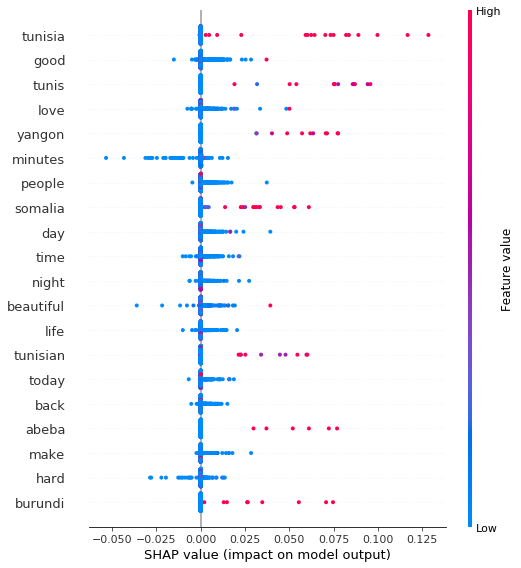

In [139]:
shap.summary_plot(shap_values500, X_test.iloc[10000:10500,:])

In [146]:
somalia_all = test_df.loc[test_df['COUNTRY'] == 'SOM']
somalia_500 = somalia_all.iloc[0:500, feat_index:]
somalia_500

,00am,00pm,02pm,04pm,06pm,0km,0km gt,0km pressure,0km visibility,0kmh,1009mb,100faces,1010mb,1011mb,1012mb,1013mb,1014mb,1015mb,1015mb falling,1015mb rising,1015mb steady,1016mb,1017mb,1018mb,1019mb,1020mb,1021mb,1024mb,10am,10k,10km,10km gt,10km pressure,10km visibility,10pm,10th,11am,11km,11km gt,11km pressure,11km visibility,11pm,11th,12pm,12th,13km,13km gt,13km pressure,13km visibility,13th,...,youknowigotit,youknowigotit leamakhoul,youknowigotit queen,young,young man,young people,young thug,younger,youngest,youre,youth,youths,youtube,youtube artiste,youu,youuu,yow,yr,yrs,yu,yuh,yum,yummy,yup,za,zam,zam blockade4or,zamalek,zambezi,zambia,zambiadecides,zambian,zambians,zanzibar,zardari,zayn,zealand,zed,zesco,zidane,zim,zimbabwe,zlatan,zombie,zone,zoo,zra2014,zulu,zuma,️follow
1495,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3439,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4790,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6273,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8084,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77261,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
77336,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
77350,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
77375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [148]:
shap_values_som = explainer.shap_values(somalia_500, nsamples=500)
# shap.force_plot(explainer.expected_value, shap_values_som, somalia_500)

  0%|          | 0/500 [00:00<?, ?it/s]

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15893979 0.0797296  0.05332734 0.04012707 0.0322076  0.02692854
 0.02315829 0.02033105 0.01813248 0.016374   0.01493557 0.01373719
 0.01272347 0.01185484 0.01110228 0.01044403 0.00986346 0.00934761
 0.00888627 0.00847127 0.00809599 0.00775501 0.00744386 0.00715882
 0.00689675 0.00665501 0.00643133 0.00622379 0.00603072 0.00585066
 0.00568237 0.00552474 0.00537681 0.00523771 0.0051067  0.0049831
 0.00486631 0.0047558  0.00465108 0.00455173 0.00445734 0.00436757
 0.0042821  0.00420063 0.0041229  0.00404867 0.00397771 0.00390982
 0.00384481 0.00378252 0.00372278 0.00366545 0.0036104  0.00355749
 0.00350661 0.00345766 0.00341053 0.00336514 0.00332139 0.0032792
 0.0032385  0.00319922 0.00316129 0.00312465 0.00308924 0.003055
 0.00302189 0.00298986 0.00295886 0.00292884 0.00289978 0.00287162
 0.00284433 0.00281789 0.00279225 0.00276738 0.00274327 0.00271987
 0.00269717 0.00267514 0.00265375 0.00263299 0.00261283 0.00259325
 0.0025

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16067617 0.08061899 0.05393458 0.04059336 0.03258944 0.02725417
 0.02344385 0.02058663 0.01836482 0.01658779 0.01513425 0.01392333
 0.01289904 0.01202139 0.01126107 0.01059606 0.01000956 0.00948849
 0.00902251 0.00860337 0.00822437 0.00788005 0.00756588 0.0072781
 0.00701355 0.00676953 0.00654379 0.00633435 0.00613954 0.00595789
 0.00578813 0.00562916 0.00547998 0.00533975 0.00520769 0.00508312
 0.00496544 0.00485411 0.00474864 0.00464859 0.00455358 0.00446323
 0.00437722 0.00429527 0.00421711 0.00414248 0.00407116 0.00400296
 0.00393767 0.00387513 0.00381518 0.00375766 0.00370245 0.00364942
 0.00359844 0.00354942 0.00350225 0.00345683 0.00341308 0.00337091
 0.00333026 0.00329104 0.0032532  0.00321666 0.00318138 0.00314729
 0.00311434 0.00308249 0.00305169 0.00302189 0.00299306 0.00296515
 0.00293814 0.00291198 0.00288664 0.00286209 0.00283831 0.00281527
 0.00279293 0.00277128 0.00275029 0.00272993 0.0027102  0.00269106
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15910659 0.07981498 0.0533856  0.04017178 0.03224419 0.02695973
 0.02318562 0.0203555  0.0181547  0.01639443 0.01495455 0.01375496
 0.01274022 0.01187072 0.01111741 0.01045851 0.00987737 0.00936102
 0.00889923 0.00848383 0.00810819 0.00776689 0.00745545 0.00717014
 0.00690783 0.00666587 0.00644199 0.00623426 0.00604102 0.00586081
 0.00569238 0.00553462 0.00538656 0.00524735 0.00511624 0.00499254
 0.00487567 0.00476507 0.00466028 0.00456086 0.00446641 0.00437658
 0.00429105 0.00420953 0.00413176 0.00405748 0.00398649 0.00391856
 0.00385353 0.00379121 0.00373145 0.0036741  0.00361903 0.0035661
 0.00351521 0.00346625 0.00341912 0.00337371 0.00332996 0.00328777
 0.00324707 0.00320779 0.00316987 0.00313323 0.00309783 0.00306361
 0.00303051 0.00299849 0.0029675  0.0029375  0.00290845 0.00288031
 0.00285305 0.00282663 0.00280101 0.00277617 0.00275208 0.00272872
 0.00270605 0.00268404 0.00266269 0.00264196 0.00262183 0.00260229
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16004725 0.08029489 0.053712   0.04042149 0.03244794 0.02713287
 0.02333694 0.02049048 0.018277   0.01650662 0.01505848 0.01385204
 0.01283152 0.01195709 0.01119952 0.01053692 0.00995252 0.00943329
 0.00896895 0.00855126 0.00817357 0.00783041 0.00751729 0.00723046
 0.00696676 0.00672353 0.00649849 0.0062897  0.00609547 0.00591436
 0.00574509 0.00558656 0.00543779 0.00529792 0.00516619 0.00504193
 0.00492453 0.00481345 0.00470821 0.00460836 0.00451353 0.00442334
 0.00433748 0.00425566 0.0041776  0.00410306 0.00403183 0.00396369
 0.00389845 0.00383595 0.00377602 0.00371852 0.00366331 0.00361027
 0.00355928 0.00351022 0.00346301 0.00341754 0.00337374 0.0033315
 0.00329077 0.00325147 0.00321354 0.0031769  0.00314151 0.00310731
 0.00307424 0.00304225 0.00301131 0.00298137 0.00295239 0.00292432
 0.00289714 0.0028708  0.00284528 0.00282055 0.00279658 0.00277333
 0.00275078 0.00272892 0.0027077  0.00268712 0.00266715 0.00264777
 0.0

INFO: num_paired_subset_sizes = 164
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 329.99999999999994
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  1.21384121e-02  0.00000000e+00
  3.00096485e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.54830068e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.08697083e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -4.02153365e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.68411641e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15630739 0.07838356 0.05240985 0.03942368 0.03163253 0.0264389
 0.02272956 0.01994791 0.01778472 0.01605446 0.01463906 0.0134598
 0.0124622  0.01160732 0.01086663 0.01021872 0.00964721 0.00913937
 0.00868516 0.00827652 0.00790696 0.00757114 0.00726466 0.00698386
 0.00672566 0.00648744 0.006267   0.00606242 0.00587207 0.00569453
 0.00552856 0.00537307 0.00522711 0.00508984 0.00496052 0.00483849
 0.00472316 0.00461399 0.00451052 0.00441232 0.004319   0.00423022
 0.00414567 0.00406504 0.00398809 0.00391457 0.00384427 0.00377699
 0.00371253 0.00365074 0.00359146 0.00353454 0.00347985 0.00342726
 0.00337668 0.00332797 0.00328106 0.00323584 0.00319224 0.00315017
 0.00310955 0.00307032 0.00303242 0.00299577 0.00296033 0.00292604
 0.00289285 0.00286071 0.00282958 0.00279941 0.00277017 0.00274181
 0.00271431 0.00268762 0.00266171 0.00263657 0.00261215 0.00258842
 0.00256538 0.00254298 0.00252121 0.00250004 0.00247945 0.00245943
 0.00

INFO: num_paired_subset_sizes = 210
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 422.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.00368590e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.89501929e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.85904296e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.20751369e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.14542865e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.04100962e-03
  0.00000000e+00 -2.27635231e-05  1.23777758e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 142
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 285.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.63727909e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.61397828e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  5.83641337e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.85955731e-03 -3.43326610e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.09681034e-03  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15757513 0.07902999 0.05284927 0.03975967 0.03190652 0.02667159
 0.02293281 0.02012911 0.01794881 0.01620489 0.01477833 0.01358981
 0.01258439 0.01172284 0.01097639 0.01032345 0.00974753 0.00923579
 0.00877811 0.00836637 0.00799401 0.00765566 0.0073469  0.00706401
 0.00680391 0.00656395 0.00634191 0.00613587 0.00594417 0.00576538
 0.00559824 0.00544168 0.00529473 0.00515654 0.00502637 0.00490354
 0.00478746 0.00467761 0.00457349 0.00447469 0.00438082 0.00429152
 0.00420648 0.0041254  0.00404803 0.00397412 0.00390346 0.00383583
 0.00377107 0.00370899 0.00364944 0.00359227 0.00353736 0.00348457
 0.00343379 0.00338492 0.00333785 0.00329249 0.00324877 0.00320659
 0.00316588 0.00312657 0.00308859 0.00305189 0.00301641 0.00298209
 0.00294888 0.00291673 0.0028856  0.00285545 0.00282623 0.0027979
 0.00277044 0.0027438  0.00271796 0.00269289 0.00266855 0.00264491
 0.00262196 0.00259967 0.00257801 0.00255697 0.00253651 0.00251663
 0.0

INFO: num_paired_subset_sizes = 185
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 371.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.30290348e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.10101481e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -1.95680210e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.32702629e-03  0.00000000e+00 -4.78264924e-03
  2.58405072e-03  0.00000000e+00  0.00000000e+00  7.69867145e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.64080669e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.98554915e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 196
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 393.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.00000000e+00  1.66719707e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.42844625e-03  0.00000000e+00  3.69074278e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.83359270e-02  1.74404550e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.70120279e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -5.31594223e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.34532888e-03  0.00000000e+00  3.46714571e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.57544950e-03  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 205
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 412.00000000000006
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.00330045
  0.          0.00180651  0.          0.          0.          0.0145782
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.         -0.00139798  0.
  0.          0.          0.          0.          0.00029474  0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00173426 -0.0021699   0.00211692  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00769508  0.          0.          0.00243367  0.
 -0.0008939   0.00161897  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.0063674
  0.          0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15828676 0.07939543 0.05309939 0.03995219 0.03206452 0.02680663
 0.02305147 0.02023552 0.01804572 0.01629423 0.0148615  0.01366785
 0.01265812 0.01179289 0.01104326 0.01038757 0.00980923 0.00929536
 0.00883578 0.00842235 0.00804848 0.00770877 0.00739877 0.00711477
 0.00685365 0.00661278 0.00638989 0.00618308 0.00599067 0.00581123
 0.0056435  0.00548639 0.00533894 0.00520028 0.00506968 0.00494646
 0.00483002 0.00471983 0.00461542 0.00451633 0.0044222  0.00433267
 0.00424741 0.00416614 0.00408859 0.00401452 0.00394371 0.00387596
 0.00381108 0.0037489  0.00368926 0.00363202 0.00357704 0.0035242
 0.00347338 0.00342447 0.00337738 0.00333202 0.00328829 0.00324612
 0.00320542 0.00316614 0.0031282  0.00309154 0.0030561  0.00302184
 0.00298869 0.00295661 0.00292556 0.00289549 0.00286636 0.00283813
 0.00281077 0.00278425 0.00275852 0.00273357 0.00270936 0.00268586
 0.00266305 0.00264091 0.0026194  0.00259852 0.00257823 0.00255851
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15828676 0.07939543 0.05309939 0.03995219 0.03206452 0.02680663
 0.02305147 0.02023552 0.01804572 0.01629423 0.0148615  0.01366785
 0.01265812 0.01179289 0.01104326 0.01038757 0.00980923 0.00929536
 0.00883578 0.00842235 0.00804848 0.00770877 0.00739877 0.00711477
 0.00685365 0.00661278 0.00638989 0.00618308 0.00599067 0.00581123
 0.0056435  0.00548639 0.00533894 0.00520028 0.00506968 0.00494646
 0.00483002 0.00471983 0.00461542 0.00451633 0.0044222  0.00433267
 0.00424741 0.00416614 0.00408859 0.00401452 0.00394371 0.00387596
 0.00381108 0.0037489  0.00368926 0.00363202 0.00357704 0.0035242
 0.00347338 0.00342447 0.00337738 0.00333202 0.00328829 0.00324612
 0.00320542 0.00316614 0.0031282  0.00309154 0.0030561  0.00302184
 0.00298869 0.00295661 0.00292556 0.00289549 0.00286636 0.00283813
 0.00281077 0.00278425 0.00275852 0.00273357 0.00270936 0.00268586
 0.00266305 0.00264091 0.0026194  0.00259852 0.00257823 0.00255851
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16287946 0.08174705 0.05470446 0.04118435 0.03307323 0.02766663
 0.02380546 0.0209102  0.01865889 0.01685834 0.01538563 0.0141588
 0.01312112 0.01223205 0.01146189 0.01078833 0.01019434 0.00966665
 0.00919481 0.00877043 0.00838675 0.00803821 0.00772023 0.007429
 0.00716131 0.00691445 0.0066861  0.00647429 0.0062773  0.00609366
 0.00592208 0.00576143 0.00561071 0.00546907 0.00533571 0.00520995
 0.00509118 0.00497885 0.00487246 0.00477158 0.0046758  0.00458476
 0.00449812 0.00441561 0.00433693 0.00426185 0.00419013 0.00412157
 0.00405598 0.00399317 0.003933   0.00387531 0.00381996 0.00376682
 0.00371577 0.00366672 0.00361954 0.00357416 0.00353047 0.0034884
 0.00344787 0.00340881 0.00337114 0.00333482 0.00329977 0.00326594
 0.00323328 0.00320174 0.00317127 0.00314184 0.00311339 0.00308589
 0.00305931 0.0030336  0.00300875 0.0029847  0.00296144 0.00293895
 0.00291718 0.00289612 0.00287574 0.00285603 0.00283695 0.0028185
 0.00280

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16141642 0.08099853 0.05419396 0.04079274 0.03275286 0.02739366
 0.02356629 0.02069632 0.01846461 0.0166797  0.01521973 0.01400348
 0.0129747  0.01209323 0.01132961 0.01066174 0.01007273 0.00954944
 0.0090815  0.00866061 0.00828005 0.00793432 0.00761888 0.00732994
 0.00706434 0.00681938 0.00659277 0.00638254 0.006187   0.00600469
 0.00583433 0.0056748  0.00552511 0.00538441 0.00525192 0.00512696
 0.00500892 0.00489726 0.00479149 0.00469116 0.0045959  0.00450532
 0.00441911 0.00433698 0.00425865 0.00418387 0.00411243 0.00404411
 0.00397872 0.0039161  0.00385608 0.00379851 0.00374326 0.0036902
 0.00363921 0.00359018 0.00354301 0.00349761 0.00345388 0.00341176
 0.00337115 0.00333199 0.00329421 0.00325775 0.00322255 0.00318856
 0.00315571 0.00312397 0.00309329 0.00306362 0.00303492 0.00300716
 0.00298029 0.00295429 0.00292912 0.00290475 0.00288115 0.00285829
 0.00283615 0.0028147  0.00279392 0.00277379 0.00275428 0.00273537
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15532235 0.07788056 0.05206746 0.03916153 0.03141848 0.02625687
 0.02257038 0.01980583 0.01765592 0.01593625 0.0145295  0.01335742
 0.01236587 0.01151617 0.01077995 0.01013593 0.00956784 0.00906302
 0.0086115  0.00820527 0.00783787 0.00750401 0.0071993  0.00692011
 0.00666338 0.00642651 0.0062073  0.00600386 0.00581456 0.00563798
 0.0054729  0.00531823 0.00517304 0.00503648 0.00490783 0.00478641
 0.00467165 0.00456301 0.00446004 0.0043623  0.00426941 0.00418103
 0.00409684 0.00401657 0.00393994 0.00386672 0.0037967  0.00372967
 0.00366545 0.00360388 0.0035448  0.00348807 0.00343355 0.00338113
 0.00333068 0.00328211 0.00323531 0.0031902  0.00314669 0.0031047
 0.00306415 0.00302499 0.00298713 0.00295053 0.00291512 0.00288085
 0.00284767 0.00281553 0.0027844  0.00275422 0.00272495 0.00269657
 0.00266903 0.0026423  0.00261634 0.00259114 0.00256665 0.00254286
 0.00251974 0.00249726 0.0024754  0.00245413 0.00243345 0.00241332
 0.0

INFO: num_paired_subset_sizes = 165
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 332.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.01152532  0.          0.          0.          0.00083399  0.00228329
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00124039
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00420148  0.          0.
  0.00054224  0.00217569  0.          0.          0.          0.
  0.          0.00353075  0.00805076  0.          0.          0.
  0.          0.          0.          0.          0.          0.00141261
  0.          0.          0.00439216  0.          0.          0.00532426
  0.          0.          0.          0.          0.00335887  0.
  0.          0.          0.          0.          0.          0.
  0.00781952  0.          0.          0.         

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15836425 0.0794335  0.05312431 0.03997053 0.03207891 0.02681838
 0.02306134 0.02024397 0.01805307 0.01630068 0.01486723 0.01367298
 0.01266273 0.01179705 0.01104704 0.01039101 0.00981237 0.00929824
 0.00883841 0.00842476 0.00805069 0.0077108  0.00740064 0.00711648
 0.00685522 0.00661421 0.0063912  0.00618427 0.00599175 0.00581221
 0.00564438 0.00548718 0.00533964 0.0052009  0.00507022 0.00494693
 0.00483042 0.00472016 0.00461567 0.00451653 0.00442233 0.00433274
 0.00424742 0.00416609 0.00408849 0.00401437 0.00394351 0.0038757
 0.00381078 0.00374855 0.00368886 0.00363157 0.00357655 0.00352367
 0.0034728  0.00342386 0.00337673 0.00333132 0.00328755 0.00324534
 0.0032046  0.00316528 0.0031273  0.00309061 0.00305513 0.00302083
 0.00298765 0.00295553 0.00292444 0.00289434 0.00286517 0.00283691
 0.00280952 0.00278296 0.0027572  0.00273221 0.00270796 0.00268443
 0.00266158 0.0026394  0.00261786 0.00259694 0.00257662 0.00255687
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15828676 0.07939543 0.05309939 0.03995219 0.03206452 0.02680663
 0.02305147 0.02023552 0.01804572 0.01629423 0.0148615  0.01366785
 0.01265812 0.01179289 0.01104326 0.01038757 0.00980923 0.00929536
 0.00883578 0.00842235 0.00804848 0.00770877 0.00739877 0.00711477
 0.00685365 0.00661278 0.00638989 0.00618308 0.00599067 0.00581123
 0.0056435  0.00548639 0.00533894 0.00520028 0.00506968 0.00494646
 0.00483002 0.00471983 0.00461542 0.00451633 0.0044222  0.00433267
 0.00424741 0.00416614 0.00408859 0.00401452 0.00394371 0.00387596
 0.00381108 0.0037489  0.00368926 0.00363202 0.00357704 0.0035242
 0.00347338 0.00342447 0.00337738 0.00333202 0.00328829 0.00324612
 0.00320542 0.00316614 0.0031282  0.00309154 0.0030561  0.00302184
 0.00298869 0.00295661 0.00292556 0.00289549 0.00286636 0.00283813
 0.00281077 0.00278425 0.00275852 0.00273357 0.00270936 0.00268586
 0.00266305 0.00264091 0.0026194  0.00259852 0.00257823 0.00255851
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14733363 0.07381327 0.04930687 0.03705397 0.02970246 0.02480165
 0.02130125 0.01867609 0.01663444 0.01500124 0.0136651  0.01255175
 0.01160978 0.01080247 0.01010288 0.00949082 0.00895084 0.00847093
 0.0080416  0.00765527 0.0073058  0.00698816 0.00669819 0.00643245
 0.00618801 0.00596243 0.00575361 0.00555976 0.00537932 0.00521096
 0.0050535  0.00490593 0.00476734 0.00463695 0.00451405 0.00439802
 0.0042883  0.00418439 0.00408585 0.00399227 0.00390329 0.00381858
 0.00373785 0.00366082 0.00358725 0.00351692 0.0034496  0.00338513
 0.00332331 0.00326401 0.00320705 0.00315232 0.00309969 0.00304903
 0.00300025 0.00295324 0.0029079  0.00286416 0.00282193 0.00278113
 0.0027417  0.00270357 0.00266667 0.00263096 0.00259637 0.00256285
 0.00253037 0.00249886 0.00246829 0.00243863 0.00240982 0.00238184
 0.00235465 0.00232822 0.00230252 0.00227752 0.00225319 0.00222951
 0.00220646 0.002184   0.00216213 0.00214081 0.00212003 0.00209977
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15464959 0.07753723 0.05183389 0.0389828  0.03127263 0.02613292
 0.02246204 0.01970918 0.01756835 0.01585593 0.01445508 0.01328792
 0.01230052 0.01145436 0.0107212  0.01007984 0.00951409 0.00901135
 0.00856167 0.0081571  0.00779118 0.00745866 0.00715517 0.00687708
 0.00662136 0.00638542 0.00616706 0.0059644  0.00577582 0.00559991
 0.00543545 0.00528135 0.00513669 0.00500063 0.00487243 0.00475144
 0.00463707 0.00452881 0.00442618 0.00432877 0.00423618 0.00414808
 0.00406416 0.00398413 0.00390773 0.00383472 0.0037649  0.00369805
 0.00363401 0.0035726  0.00351367 0.00345707 0.00340268 0.00335037
 0.00330004 0.00325156 0.00320485 0.00315982 0.00311639 0.00307446
 0.00303397 0.00299486 0.00295705 0.00292048 0.00288511 0.00285086
 0.00281771 0.00278559 0.00275446 0.00272428 0.00269502 0.00266662
 0.00263907 0.00261232 0.00258635 0.00256112 0.00253661 0.00251278
 0.00248962 0.00246709 0.00244519 0.00242387 0.00240313 0.00238294
 0.

INFO: num_paired_subset_sizes = 182
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 365.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.98113345e-03  0.00000000e+00  0.00000000e+00  2.83390002e-03
  0.00000000e+00  5.88869949e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  6.25828653e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.10172787e-03  0.00000000e+00
  0.00000000e+00  9.74635223e-03  0.00000000e+00  1.90080466e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.04204754e-03  2.73428019e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  5.58705004e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: phi = [ 0.         -0.00062351  0.          0.          0.          0.
  0.00751357  0.          0.          0.          0.          0.
  0.          0.00098297  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00291325
  0.          0.00069113  0.00041032  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00419798  0.          0.          0.          0.
  0.00330606  0.          0.          0.00107997  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00057821  0.00203162  0.          0.
  0.          0.          0.          0.          0.00490426  0.
  0.          0.00612892  0.          0.          0.          0.
  0.          0.          0.          0.          0.00690816  0.
  0.          0.          0.          0.          0.          0.00115203
  0.          0.          0.          0.          0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15438725 0.07740339 0.05174287 0.03891318 0.03121583 0.02608466
 0.02241987 0.01967158 0.01753429 0.01582469 0.01442616 0.01326092
 0.01227513 0.01143036 0.01069838 0.01005807 0.00949323 0.0089913
 0.00854234 0.00813841 0.00777308 0.00744108 0.00713806 0.00686042
 0.00660509 0.00636951 0.00615148 0.00594913 0.00576083 0.00558519
 0.00542096 0.00526709 0.00512264 0.00498677 0.00485875 0.00473793
 0.00462372 0.00451561 0.00441311 0.00431583 0.00422336 0.00413537
 0.00405155 0.00397162 0.00389531 0.00382239 0.00375264 0.00368588
 0.0036219  0.00356056 0.00350168 0.00344514 0.0033908  0.00333854
 0.00328825 0.00323981 0.00319314 0.00314815 0.00310474 0.00306284
 0.00302238 0.00298329 0.0029455  0.00290895 0.00287359 0.00283936
 0.00280621 0.0027741  0.00274298 0.0027128  0.00268354 0.00265515
 0.0026276  0.00260084 0.00257487 0.00254963 0.00252511 0.00250127
 0.00247809 0.00245556 0.00243363 0.0024123  0.00239154 0.00237133
 0.0

INFO: phi = [ 0.          0.          0.00387231  0.          0.          0.
  0.00117753  0.00327342  0.          0.          0.00341382  0.
  0.          0.00154934  0.          0.          0.          0.
  0.          0.00416577  0.          0.          0.          0.
  0.          0.          0.         -0.00307927  0.          0.
  0.          0.00264536  0.          0.          0.          0.
  0.          0.          0.          0.          0.00703033  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00319699  0.00454914
  0.00536819  0.00399724  0.00222084  0.          0.          0.00382851
  0.00244382  0.00561113  0.          0.00256766  0.00359069  0.
  0.          0.          0.          0.          0.01041389  0.
  0.00696742  0.00712038 -0.00030843  0.          0.          0.
  0.          0.          0.          0.          0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15623283 0.07834416 0.05238216 0.03940183 0.03161417 0.02642286
 0.02271517 0.01993475 0.01777252 0.01604301 0.01462822 0.01344947
 0.01245229 0.01159778 0.01085739 0.01020974 0.00963847 0.00913083
 0.0086768  0.00826832 0.0078989  0.0075632  0.00725683 0.00697613
 0.00671801 0.00647988 0.0062595  0.00605499 0.0058647  0.00568721
 0.00552128 0.00536582 0.0052199  0.00508266 0.00495337 0.00483136
 0.00471605 0.0046069  0.00450344 0.00440525 0.00431195 0.00422317
 0.00413862 0.004058   0.00398104 0.00390752 0.00383722 0.00376993
 0.00370547 0.00364367 0.00358437 0.00352744 0.00347274 0.00342014
 0.00336954 0.00332082 0.00327388 0.00322865 0.00318502 0.00314293
 0.00310229 0.00306304 0.00302511 0.00298844 0.00295297 0.00291865
 0.00288543 0.00285326 0.0028221  0.0027919  0.00276262 0.00273423
 0.00270669 0.00267997 0.00265403 0.00262884 0.00260439 0.00258062
 0.00255754 0.0025351  0.00251329 0.00249208 0.00247145 0.00245138
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15696668 0.07871903 0.05263742 0.03959734 0.03177386 0.0265587
 0.022834   0.02004085 0.01786874 0.01613135 0.01471012 0.01352602
 0.01252434 0.01166597 0.01092226 0.01027172 0.0096979  0.00918803
 0.00873199 0.00832173 0.00795069 0.00761355 0.00730586 0.00702396
 0.00676476 0.00652563 0.00630434 0.00609898 0.00590792 0.00572971
 0.00556312 0.00540706 0.00526057 0.00512281 0.00499304 0.00487058
 0.00475484 0.0046453  0.00454148 0.00444296 0.00434933 0.00426027
 0.00417544 0.00409457 0.00401738 0.00394365 0.00387314 0.00380567
 0.00374104 0.00367908 0.00361964 0.00356258 0.00350775 0.00345505
 0.00340434 0.00335553 0.00330852 0.00326322 0.00321953 0.00317739
 0.0031367  0.00309742 0.00305946 0.00302277 0.00298729 0.00295296
 0.00291974 0.00288758 0.00285643 0.00282625 0.00279699 0.00276863
 0.00274113 0.00271445 0.00268856 0.00266343 0.00263903 0.00261533
 0.00259231 0.00256994 0.00254821 0.00252708 0.00250654 0.00248657
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15704429 0.07876009 0.05266632 0.03962017 0.03179306 0.02657549
 0.02284908 0.02005465 0.01788155 0.01614337 0.01472151 0.01353689
 0.01253476 0.01167602 0.010932   0.01028118 0.00970713 0.00919704
 0.00874082 0.00833039 0.00795922 0.00762194 0.00731415 0.00703215
 0.00677285 0.00653364 0.00631228 0.00610687 0.00591575 0.00573749
 0.00557086 0.00541476 0.00526823 0.00513044 0.00500064 0.00487816
 0.00476241 0.00465285 0.00454902 0.00445048 0.00435686 0.00426779
 0.00418296 0.00410209 0.00402491 0.00395118 0.00388068 0.00381321
 0.00374859 0.00368664 0.00362722 0.00357017 0.00351536 0.00346267
 0.00341199 0.0033632  0.00331621 0.00327093 0.00322727 0.00318515
 0.0031445  0.00310524 0.00306731 0.00303065 0.0029952  0.00296091
 0.00292772 0.00289559 0.00286448 0.00283433 0.00280512 0.0027768
 0.00274933 0.00272269 0.00269684 0.00267175 0.0026474  0.00262375
 0.00260077 0.00257846 0.00255677 0.00253569 0.0025152  0.00249528
 0.0

INFO: num_paired_subset_sizes = 149
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 300.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.0048996   0.          0.          0.          0.00269559  0.
  0.          0.          0.          0.00092811  0.          0.
  0.          0.00503756  0.          0.          0.          0.
  0.          0.00058912  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00456635  0.          0.          0.          0.          0.
  0.00319095  0.          0.          0.          0.          0.
  0.          0.          0.00459279  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00480745  0.          0.          0.          0.
  0.          0.          0.01245977  0.00368912  0.          0.
  0.          0.          0.00440274  0.          0.          0.
  0.          0.00924862  0.          0.          0.          0.
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14791026 0.07410668 0.0495059  0.03720582 0.02982603 0.02490638
 0.02139252 0.01875729 0.01670781 0.01506836 0.01372711 0.0126095
 0.01166394 0.01085356 0.01015131 0.00953694 0.00899492 0.0085132
 0.00808226 0.00769448 0.0073437  0.00702488 0.00673383 0.00646711
 0.00622177 0.00599537 0.00578579 0.00559123 0.00541014 0.00524117
 0.00508315 0.00493505 0.00479598 0.00466513 0.0045418  0.00442536
 0.00431526 0.004211   0.00411212 0.00401823 0.00392895 0.00384397
 0.00376297 0.0036857  0.00361189 0.00354133 0.00347381 0.00340913
 0.00334713 0.00328764 0.00323052 0.00317563 0.00312284 0.00307204
 0.00302312 0.00297598 0.00293052 0.00288666 0.00284432 0.00280342
 0.00276389 0.00272566 0.00268868 0.00265288 0.00261821 0.00258462
 0.00255207 0.00252049 0.00248987 0.00246014 0.00243128 0.00240325
 0.00237601 0.00234954 0.00232379 0.00229876 0.0022744  0.00225069
 0.00222761 0.00220513 0.00218323 0.00216189 0.00214109 0.00212081
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15696668 0.07871903 0.05263742 0.03959734 0.03177386 0.0265587
 0.022834   0.02004085 0.01786874 0.01613135 0.01471012 0.01352602
 0.01252434 0.01166597 0.01092226 0.01027172 0.0096979  0.00918803
 0.00873199 0.00832173 0.00795069 0.00761355 0.00730586 0.00702396
 0.00676476 0.00652563 0.00630434 0.00609898 0.00590792 0.00572971
 0.00556312 0.00540706 0.00526057 0.00512281 0.00499304 0.00487058
 0.00475484 0.0046453  0.00454148 0.00444296 0.00434933 0.00426027
 0.00417544 0.00409457 0.00401738 0.00394365 0.00387314 0.00380567
 0.00374104 0.00367908 0.00361964 0.00356258 0.00350775 0.00345505
 0.00340434 0.00335553 0.00330852 0.00326322 0.00321953 0.00317739
 0.0031367  0.00309742 0.00305946 0.00302277 0.00298729 0.00295296
 0.00291974 0.00288758 0.00285643 0.00282625 0.00279699 0.00276863
 0.00274113 0.00271445 0.00268856 0.00266343 0.00263903 0.00261533
 0.00259231 0.00256994 0.00254821 0.00252708 0.00250654 0.00248657
 0.0

INFO: num_paired_subset_sizes = 204
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 409.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00312328  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00609107  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00802863  0.          0.          0.          0.
  0.          0.          0.          0.          0.00663328  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00650806  0.00434767  0.          0.          0.          0.
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15074495 0.07554776 0.05048257 0.03795039 0.03043142 0.02541904
 0.02183902 0.01915421 0.01706621 0.01539599 0.0140296  0.01289109
 0.01192786 0.01110237 0.01038706 0.00976128 0.00920922 0.00871861
 0.00827973 0.00788484 0.00752764 0.007203   0.00690667 0.00663512
 0.00638536 0.0061549  0.00594157 0.00574355 0.00555926 0.00538732
 0.00522654 0.00507586 0.00493439 0.00480129 0.00467586 0.00455745
 0.00444551 0.00433951 0.00423899 0.00414356 0.00405284 0.00396649
 0.0038842  0.00380571 0.00373075 0.00365911 0.00359055 0.00352491
 0.00346198 0.00340163 0.00334368 0.00328801 0.00323448 0.00318298
 0.0031334  0.00308563 0.00303958 0.00299516 0.00295229 0.00291089
 0.00287089 0.00283222 0.00279482 0.00275862 0.00272358 0.00268965
 0.00265676 0.00262488 0.00259397 0.00256397 0.00253486 0.0025066
 0.00247915 0.00245248 0.00242656 0.00240136 0.00237685 0.002353
 0.0023298  0.00230721 0.00228522 0.0022638  0.00224293 0.0022226
 0.0022

INFO: num_paired_subset_sizes = 195
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 391.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.00330546  0.          0.00767871  0.0229672
  0.          0.00595257  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00094799
  0.          0.00039086  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00503333  0.          0.         -0.0007841   0.00686039  0.
  0.          0.          0.00143067  0.          0.          0.
  0.00267816  0.          0.          0.          0.00530699  0.
  0.          0.          0.          0.00318206  0.          0.00121837
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.   

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15666968 0.07856729 0.05253408 0.03951817 0.03170919 0.02650368
 0.02278587 0.01999787 0.01782975 0.01609555 0.01467693 0.01349499
 0.01249513 0.01163832 0.01089596 0.01024659 0.00967379 0.00916482
 0.0087096  0.00830006 0.00792967 0.00759311 0.00728596 0.00700454
 0.00674578 0.00650705 0.00628613 0.00608112 0.00589036 0.00571244
 0.00554612 0.0053903  0.00524404 0.00510649 0.00497691 0.00485463
 0.00473907 0.00462969 0.00452601 0.00442762 0.00433413 0.00424518
 0.00416046 0.00407969 0.0040026  0.00392895 0.00385852 0.00379112
 0.00372656 0.00366466 0.00360528 0.00354827 0.00349349 0.00344083
 0.00339016 0.00334139 0.00329441 0.00324913 0.00320547 0.00316334
 0.00312268 0.0030834  0.00304545 0.00300877 0.00297329 0.00293897
 0.00290575 0.00287358 0.00284242 0.00281223 0.00278297 0.0027546
 0.00272708 0.00270037 0.00267446 0.00264931 0.00262488 0.00260116
 0.00257811 0.00255571 0.00253394 0.00251278 0.0024922  0.00247219
 0.0

INFO: num_paired_subset_sizes = 189
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 380.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.00627298  0.0092321   0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00755475
  0.          0.00977702  0.          0.          0.          0.
  0.          0.          0.          0.00501484  0.          0.00758652
  0.          0.00448987  0.          0.          0.00115196  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00648254
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00238023  0.00907296  0.00287454  0.
  0.          0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14357466 0.07190738 0.04801855 0.03607434 0.02890797 0.02413053
 0.02071819 0.01815904 0.01616868 0.01457648 0.01327384 0.01218838
 0.01126998 0.01048284 0.00980071 0.0092039  0.00867735 0.00820936
 0.00779067 0.0074139  0.00707305 0.00676323 0.00648039 0.00622115
 0.00598269 0.00576261 0.00555887 0.00536971 0.00519362 0.00502931
 0.00487563 0.00473158 0.00459629 0.00446899 0.00434899 0.00423568
 0.00412852 0.00402703 0.00393077 0.00383934 0.0037524  0.00366962
 0.00359072 0.00351542 0.00344349 0.00337471 0.00330888 0.00324582
 0.00318535 0.00312732 0.00307158 0.00301801 0.00296648 0.00291688
 0.0028691  0.00282304 0.00277862 0.00273576 0.00269436 0.00265436
 0.00261569 0.00257828 0.00254208 0.00250703 0.00247308 0.00244017
 0.00240826 0.0023773  0.00234726 0.00231809 0.00228976 0.00226224
 0.00223548 0.00220947 0.00218416 0.00215953 0.00213556 0.00211222
 0.00208949 0.00206734 0.00204575 0.0020247  0.00200418 0.00198416
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16122873 0.08090228 0.05412817 0.04074215 0.03271139 0.02735826
 0.02353521 0.02066846 0.01843927 0.01665635 0.01519801 0.01398311
 0.01295547 0.01207497 0.01131218 0.01064504 0.01005666 0.00953394
 0.00906649 0.00864604 0.00826588 0.0079205  0.00760538 0.00731674
 0.0070514  0.00680668 0.00658029 0.00637026 0.0061749  0.00599276
 0.00582255 0.00566316 0.0055136  0.00537302 0.00524063 0.00511577
 0.00499782 0.00488625 0.00478055 0.0046803  0.00458509 0.00449457
 0.00440841 0.00432632 0.00424803 0.00417329 0.00410188 0.00403359
 0.00396823 0.00390563 0.00384562 0.00378807 0.00373282 0.00367977
 0.00362878 0.00357975 0.00353258 0.00348717 0.00344344 0.0034013
 0.00336068 0.0033215  0.0032837  0.00324722 0.003212   0.00317798
 0.00314511 0.00311334 0.00308262 0.00305292 0.00302418 0.00299638
 0.00296947 0.00294343 0.00291821 0.0028938  0.00287015 0.00284724
 0.00282505 0.00280354 0.00278271 0.00276252 0.00274295 0.00272398
 0.0

INFO: num_paired_subset_sizes = 161
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 323.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00155615  0.          0.          0.          0.          0.
  0.          0.00171782  0.02083964  0.0089682   0.          0.
  0.          0.          0.          0.          0.          0.01413394
  0.          0.          0.          0.          0.          0.
  0.          0.00653395  0.          0.          0.          0.00435055
  0.0003219   0.          0.          0.          0.          0.00499913
  0.          0.          0.00554841  0.          0.          0.
  0.          0.          0.          0.          0.00366758  0.
  0.00487509  0.          0.          0.          0.00276429  0.00572916
  0.          0.          0.          0.          0.00928174  0.
  0.          0.          0.          0.          0.          0.00508065
  0.          0.002787    0.          0.          0.          0.
  0.0041059

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15910659 0.07981498 0.0533856  0.04017178 0.03224419 0.02695973
 0.02318562 0.0203555  0.0181547  0.01639443 0.01495455 0.01375496
 0.01274022 0.01187072 0.01111741 0.01045851 0.00987737 0.00936102
 0.00889923 0.00848383 0.00810819 0.00776689 0.00745545 0.00717014
 0.00690783 0.00666587 0.00644199 0.00623426 0.00604102 0.00586081
 0.00569238 0.00553462 0.00538656 0.00524735 0.00511624 0.00499254
 0.00487567 0.00476507 0.00466028 0.00456086 0.00446641 0.00437658
 0.00429105 0.00420953 0.00413176 0.00405748 0.00398649 0.00391856
 0.00385353 0.00379121 0.00373145 0.0036741  0.00361903 0.0035661
 0.00351521 0.00346625 0.00341912 0.00337371 0.00332996 0.00328777
 0.00324707 0.00320779 0.00316987 0.00313323 0.00309783 0.00306361
 0.00303051 0.00299849 0.0029675  0.0029375  0.00290845 0.00288031
 0.00285305 0.00282663 0.00280101 0.00277617 0.00275208 0.00272872
 0.00270605 0.00268404 0.00266269 0.00264196 0.00262183 0.00260229
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15235493 0.07636649 0.05103764 0.03837368 0.03077569 0.02571069
 0.0220931  0.01938016 0.01727031 0.01558263 0.01420198 0.01305161
 0.01207837 0.01124432 0.01052161 0.00988936 0.00933162 0.00883597
 0.00839261 0.00799369 0.00763286 0.00730494 0.00700562 0.00673134
 0.00647909 0.00624634 0.0060309  0.00583094 0.00564485 0.00547123
 0.0053089  0.00515679 0.00501396 0.00487961 0.004753   0.0046335
 0.00452052 0.00441355 0.00431213 0.00421585 0.00412432 0.00403722
 0.00395422 0.00387506 0.00379947 0.00372722 0.00365811 0.00359193
 0.00352851 0.00346768 0.00340929 0.0033532  0.00329928 0.00324741
 0.00319747 0.00314938 0.00310301 0.0030583  0.00301516 0.0029735
 0.00293325 0.00289436 0.00285674 0.00282035 0.00278513 0.00275102
 0.00271798 0.00268596 0.00265491 0.00262479 0.00259557 0.00256721
 0.00253967 0.00251292 0.00248692 0.00246166 0.0024371  0.00241321
 0.00238997 0.00236736 0.00234535 0.00232392 0.00230305 0.00228272
 0.00

INFO: num_paired_subset_sizes = 214
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 429.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.00410285  0.          0.          0.01721589  0.00143373
  0.01730904  0.          0.005295    0.          0.          0.
  0.          0.          0.          0.          0.00285842  0.
  0.          0.          0.          0.          0.          0.
  0.00261497  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00139859  0.          0.          0.          0.          0.00708783
  0.          0.          0.         -0.00031558  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14859844 0.07445564 0.04974181 0.03738523 0.02997155 0.02502932
 0.02149935 0.01885204 0.01679318 0.01514622 0.01379884 0.01267614
 0.01172627 0.0109122  0.01020676 0.0095896  0.00904512 0.00856123
 0.00812834 0.00773882 0.00738647 0.00706622 0.00677388 0.00650597
 0.00625954 0.00603214 0.00582163 0.00562622 0.00544434 0.00527464
 0.00511593 0.00496719 0.00482752 0.00469611 0.00457226 0.00445533
 0.00434477 0.00424007 0.00414078 0.0040465  0.00395686 0.00387153
 0.00379021 0.00371262 0.00363852 0.00356768 0.00349989 0.00343497
 0.00337273 0.00331301 0.00325568 0.00320058 0.0031476  0.00309661
 0.00304752 0.00300021 0.00295459 0.00291058 0.00286809 0.00282705
 0.00278739 0.00274904 0.00271194 0.00267603 0.00264126 0.00260757
 0.00257491 0.00254325 0.00251253 0.00248273 0.00245379 0.00242568
 0.00239837 0.00237183 0.00234603 0.00232094 0.00229652 0.00227276
 0.00224963 0.00222711 0.00220516 0.00218379 0.00216295 0.00214264
 0.

INFO: num_paired_subset_sizes = 286
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 573.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00845904  0.          0.00968468  0.00783289  0.00154028  0.
  0.00307039  0.          0.          0.          0.         -0.01032689
  0.          0.          0.          0.          0.00033004  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00138093  0.          0.          0.          0.          0.
  0.00886305  0.          0.          0.          0.          0.
  0.          0.          0.   

INFO: num_paired_subset_sizes = 207
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 414.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.0021815   0.          0.
  0.         -0.00094512  0.          0.00704237  0.          0.
  0.          0.          0.0040149   0.          0.          0.
  0.          0.          0.          0.00712963  0.          0.
  0.          0.          0.          0.00322859  0.          0.
  0.          0.          0.          0.00403969  0.          0.
  0.          0.          0.00088488  0.          0.          0.
  0.00816018  0.          0.          0.          0.          0.
  0.          0.          0.00188246  0.00205357  0.00723995  0.
  0.00304838  0.          0.          0.00322858  0.          0.00611615
  0.          0.          0.  

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14661066 0.07344684 0.04905927 0.03686576 0.02954988 0.0246728
 0.02118934 0.01857689 0.0165451  0.01491979 0.01359009 0.01248211
 0.01154467 0.01074124 0.01004501 0.00943588 0.00889848 0.00842086
 0.00799358 0.00760909 0.00726128 0.00694514 0.00665654 0.00639205
 0.00614876 0.00592424 0.00571639 0.00552344 0.00534384 0.00517625
 0.00501952 0.00487263 0.00473467 0.00460487 0.00448253 0.00436702
 0.00425779 0.00415434 0.00405624 0.00396307 0.00387448 0.00379014
 0.00370976 0.00363307 0.00355981 0.00348977 0.00342274 0.00335853
 0.00329698 0.00323791 0.00318119 0.00312668 0.00307426 0.0030238
 0.00297521 0.00292838 0.00288322 0.00283964 0.00279756 0.00275692
 0.00271763 0.00267964 0.00264287 0.00260728 0.00257281 0.00253941
 0.00250703 0.00247563 0.00244516 0.00241559 0.00238687 0.00235897
 0.00233186 0.00230551 0.00227988 0.00225495 0.00223069 0.00220707
 0.00218407 0.00216167 0.00213985 0.00211858 0.00209784 0.00207762
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15300841 0.07670037 0.05126503 0.03854787 0.03091798 0.02583173
 0.02219899 0.0194747  0.01735605 0.01566133 0.01427494 0.0131198
 0.01214254 0.01130504 0.01057936 0.00994453 0.00938452 0.00888685
 0.00844169 0.00804117 0.0076789  0.00734967 0.00704917 0.00677381
 0.00652058 0.00628692 0.00607065 0.00586993 0.00568313 0.00550887
 0.00534593 0.00519325 0.00504991 0.00491507 0.00478802 0.00466809
 0.00455472 0.00444739 0.00434563 0.00424903 0.0041572  0.00406982
 0.00398656 0.00390715 0.00383133 0.00375888 0.00368956 0.0036232
 0.00355961 0.00349861 0.00344007 0.00338384 0.00332979 0.00327779
 0.00322775 0.00317954 0.00313309 0.00308829 0.00304506 0.00300333
 0.00296302 0.00292406 0.00288639 0.00284996 0.00281469 0.00278055
 0.00274748 0.00271543 0.00268436 0.00265423 0.002625   0.00259663
 0.00256909 0.00254234 0.00251635 0.0024911  0.00246655 0.00244269
 0.00241947 0.00239689 0.00237491 0.00235351 0.00233268 0.0023124
 0.002

INFO: num_paired_subset_sizes = 276
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 553.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.00690494  0.
  0.          0.          0.          0.          0.          0.
  0.01659863  0.          0.          0.          0.          0.
  0.          0.          0.00549735  0.          0.          0.
  0.          0.          0.00450475  0.          0.          0.
  0.          0.          0.00694637  0.          0.01307052  0.
  0.00490414  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.001176    0.00571075  0.          0.00485236  0.          0.
  0.00494607  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0

INFO: num_paired_subset_sizes = 267
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 535.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  6.21172897e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.33391426e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.61166198e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15270743 0.07654604 0.05115956 0.03846681 0.03085155 0.02577504
 0.02214926 0.01943016 0.01731554 0.01562405 0.01424029 0.01308733
 0.01211191 0.01127598 0.01055166 0.00991801 0.00935903 0.00886229
 0.00841794 0.00801815 0.00765653 0.00732789 0.00702793 0.00675306
 0.00650027 0.00626702 0.00605113 0.00585075 0.00566426 0.00549029
 0.00532763 0.0051752  0.00503209 0.00489747 0.00477061 0.00465087
 0.00453767 0.0044305  0.00432889 0.00423242 0.00414072 0.00405346
 0.00397031 0.00389101 0.00381529 0.00374292 0.00367369 0.0036074
 0.00354388 0.00348295 0.00342447 0.0033683  0.0033143  0.00326235
 0.00321234 0.00316418 0.00311776 0.00307299 0.00302979 0.00298808
 0.00294779 0.00290885 0.0028712  0.00283477 0.00279952 0.00276538
 0.00273231 0.00270026 0.00266919 0.00263906 0.00260982 0.00258145
 0.00255389 0.00252713 0.00250113 0.00247587 0.0024513  0.00242741
 0.00240418 0.00238157 0.00235956 0.00233814 0.00231728 0.00229696
 0.0

INFO: num_paired_subset_sizes = 204
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 409.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -1.91804043e-03  0.00000000e+00  8.22565792e-03
  2.48498118e-03  0.00000000e+00  0.00000000e+00  1.08645448e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.50197825e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.34732099e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.96329835e-02  8.05296252e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.50769679e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 191
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 384.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.00776169  0.
  0.          0.          0.          0.00115087  0.00429988  0.
  0.01069315  0.01815967  0.          0.          0.          0.
  0.          0.00470697  0.          0.          0.         -0.00040489
  0.          0.          0.          0.          0.          0.00393328
  0.          0.          0.          0.          0.         -0.00118781
  0.          0.          0.          0.          0.          0.00452093
  0.          0.          0.          0.00023184  0.00365279  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.         -0.00375861  0.
  0.          0.          0.          0.00944263  0.          0.00588867
  0.          0.          0.          0.          0.0072824   0.
  0.          0.          

INFO: num_paired_subset_sizes = 374
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 750.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 9.38646952e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  7.15166893e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.36363363e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.04841682e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.79666742e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.91654861e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.02448418e-03  0.00000000e+00  0.00000000e+00
  3.40261374e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.28513081e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15032517 0.07533419 0.05033772 0.03783988 0.03034149 0.02534284
 0.0217726  0.01909512 0.01701283 0.01534715 0.01398448 0.01284906
 0.01188844 0.01106518 0.0103518  0.0097277  0.00917713 0.00868783
 0.00825013 0.00785628 0.00750003 0.00717625 0.0068807  0.00660985
 0.00636075 0.00613088 0.0059181  0.00572059 0.00553677 0.00536526
 0.00520489 0.00505459 0.00491347 0.0047807  0.00465557 0.00453746
 0.00442578 0.00432003 0.00421976 0.00412455 0.00403403 0.00394788
 0.00386578 0.00378746 0.00371267 0.00364118 0.00357278 0.00350727
 0.00344448 0.00338424 0.00332642 0.00327085 0.00321743 0.00316603
 0.00311654 0.00306886 0.00302289 0.00297855 0.00293575 0.00289442
 0.00285448 0.00281587 0.00277853 0.00274238 0.00270739 0.0026735
 0.00264066 0.00260882 0.00257794 0.00254798 0.0025189  0.00249067
 0.00246324 0.0024366  0.00241069 0.00238551 0.00236102 0.00233718
 0.00231399 0.00229141 0.00226943 0.00224802 0.00222715 0.00220682
 0.0

INFO: num_paired_subset_sizes = 122
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 245.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999998
INFO: phi = [ 0.00000000e+00  5.79606019e-04  0.00000000e+00  2.42276594e-03
  0.00000000e+00  0.00000000e+00  3.23179812e-03  1.80638990e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.87614431e-03  0.00000000e+00
  0.00000000e+00 -2.36426892e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.26280410e-03  1.72471152e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.78407358e-03  0.00000000e+00
  0.00000000e+00  8.48419342e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.86132212e-03  0.00000000e+00  0.00

INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00276911  0.          0.          0.          0.
  0.          0.          0.01555042  0.          0.          0.
  0.          0.          0.          0.00140636  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00956964  0.          0.          0.          0.          0.
  0.00145888  0.          0.01271023  0.          0.0035713   0.
 -0.00023427  0.          0.          0.          0.          0.01706529
  0.          0.02396624  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00394975  0.          0.          0.          0.          0.
  0. 

INFO: num_paired_subset_sizes = 150
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 302.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.         -0.0048705   0.          0.          0.
  0.          0.         -0.00340495  0.          0.          0.
  0.          0.          0.0015561   0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00553354  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00201962
  0.          0.          0.         -0.00013533  0.00590399  0.
  0.          0.          0.00206361  0.          0.01029165  0.
  0.01451872  0.0063409   0.          0.          0.          0.
  0.00890799  0.          0.          0.000202    0.          0.01053365
  0.          0.          0.          0.          0.00347576  0.01008038
  0.          0.          0.00652124  0.          0.     

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14859844 0.07445564 0.04974181 0.03738523 0.02997155 0.02502932
 0.02149935 0.01885204 0.01679318 0.01514622 0.01379884 0.01267614
 0.01172627 0.0109122  0.01020676 0.0095896  0.00904512 0.00856123
 0.00812834 0.00773882 0.00738647 0.00706622 0.00677388 0.00650597
 0.00625954 0.00603214 0.00582163 0.00562622 0.00544434 0.00527464
 0.00511593 0.00496719 0.00482752 0.00469611 0.00457226 0.00445533
 0.00434477 0.00424007 0.00414078 0.0040465  0.00395686 0.00387153
 0.00379021 0.00371262 0.00363852 0.00356768 0.00349989 0.00343497
 0.00337273 0.00331301 0.00325568 0.00320058 0.0031476  0.00309661
 0.00304752 0.00300021 0.00295459 0.00291058 0.00286809 0.00282705
 0.00278739 0.00274904 0.00271194 0.00267603 0.00264126 0.00260757
 0.00257491 0.00254325 0.00251253 0.00248273 0.00245379 0.00242568
 0.00239837 0.00237183 0.00234603 0.00232094 0.00229652 0.00227276
 0.00224963 0.00222711 0.00220516 0.00218379 0.00216295 0.00214264
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15637731 0.07841795 0.05243239 0.0394403  0.03164559 0.02644958
 0.02273854 0.01995561 0.01779143 0.01606037 0.01464432 0.01346451
 0.01246644 0.01161117 0.01087013 0.01022191 0.00965013 0.00914206
 0.00868763 0.0082788  0.00790906 0.00757307 0.00726645 0.00698551
 0.00672718 0.00648884 0.00626829 0.00606361 0.00587317 0.00569553
 0.00552947 0.0053739  0.00522786 0.00509052 0.00496114 0.00483904
 0.00472364 0.00461441 0.00451088 0.00441263 0.00431926 0.00423043
 0.00414582 0.00406514 0.00398815 0.00391458 0.00384424 0.00377691
 0.00371241 0.00365058 0.00359126 0.0035343  0.00347957 0.00342695
 0.00337633 0.00332759 0.00328064 0.00323539 0.00319175 0.00314965
 0.003109   0.00306974 0.00303181 0.00299513 0.00295966 0.00292534
 0.00289212 0.00285995 0.00282879 0.00279859 0.00276932 0.00274093
 0.0027134  0.00268668 0.00266075 0.00263557 0.00261112 0.00258738
 0.0025643  0.00254187 0.00252008 0.00249888 0.00247827 0.00245822
 0.

INFO: num_paired_subset_sizes = 258
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 518.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.86398253e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.94022291e-03
  0.00000000e+00  2.26231056e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.36298661e-03  0.00000000e+00  5.71887449e-03  7.29227739e-03
  0.00000000e+00  1.43739989e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  5.93776055e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14869249 0.07450343 0.04977418 0.03740989 0.02999159 0.02504628
 0.02151412 0.01886516 0.01680502 0.01515704 0.01380882 0.01268543
 0.01173497 0.0109204  0.01021453 0.00959698 0.00905218 0.00856798
 0.00813484 0.00774508 0.00739252 0.00707207 0.00677955 0.00651148
 0.00626491 0.00603737 0.00582674 0.00563121 0.00544922 0.00527942
 0.00512062 0.0049718  0.00483205 0.00470056 0.00457664 0.00445965
 0.00434902 0.00424426 0.00414492 0.00405059 0.0039609  0.00387552
 0.00379416 0.00371653 0.00364239 0.00357151 0.00350369 0.00343873
 0.00337646 0.00331672 0.00325935 0.00320423 0.00315122 0.00310021
 0.00305109 0.00300376 0.00295812 0.00291409 0.00287159 0.00283053
 0.00279085 0.00275249 0.00271537 0.00267945 0.00264466 0.00261096
 0.00257829 0.00254662 0.00251589 0.00248608 0.00245713 0.00242901
 0.0024017  0.00237515 0.00234934 0.00232424 0.00229982 0.00227605
 0.00225292 0.00223039 0.00220844 0.00218706 0.00216622 0.00214591
 0.

INFO: num_paired_subset_sizes = 249
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 500.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.0006188   0.          0.          0.          0.          0.
  0.01046869  0.          0.          0.          0.01373275  0.
  0.          0.          0.          0.          0.0066727   0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00751259  0.          0.          0.          0.00548805  0.
  0.          0.          0.00805054  0.          0.          0.
  0.          0.          0.          0.          0.          0.00477941
  0.          0.          0.          0.          0.          0.01673579
  0.          0.         -0.00057172  0.          0.          0.
  0.          0.          0.00909303  0.          0.          0.
  0.          0.          0.          0.          0.          0.


INFO: num_paired_subset_sizes = 261
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 524.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.30988477e-02  1.07459358e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.87000663e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.16551299e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.64139400e-03  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14540518 0.07283526 0.04864561 0.03655103 0.02929448 0.02445694
 0.0210017  0.01841039 0.01639504 0.01478286 0.0134639  0.01236485
 0.01143496 0.01063799 0.00994735 0.0093431  0.00881    0.0083362
 0.00791232 0.00753089 0.00718584 0.0068722  0.00658588 0.00632347
 0.00608209 0.00585933 0.0056531  0.00546165 0.00528344 0.00511714
 0.00496162 0.00481584 0.00467894 0.00455013 0.00442871 0.00431406
 0.00420565 0.00410297 0.00400559 0.00391311 0.00382517 0.00374144
 0.00366164 0.00358549 0.00351276 0.00344321 0.00337665 0.00331289
 0.00325176 0.0031931  0.00313676 0.00308262 0.00303054 0.00298042
 0.00293214 0.00288561 0.00284073 0.00279743 0.00275562 0.00271522
 0.00267617 0.0026384  0.00260185 0.00256647 0.00253219 0.00249898
 0.00246678 0.00243555 0.00240524 0.00237582 0.00234724 0.00231949
 0.00229251 0.00226628 0.00224077 0.00221595 0.0021918  0.00216828
 0.00214538 0.00212307 0.00210133 0.00208014 0.00205948 0.00203933
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14150081 0.07085728 0.04730965 0.035536   0.02847194 0.02376267
 0.02039901 0.01787634 0.01591434 0.01434481 0.0130607  0.01199067
 0.01108532 0.01030934 0.00963688 0.00904852 0.00852942 0.00806803
 0.00765525 0.00728378 0.00694772 0.00664224 0.00636336 0.00610775
 0.00587262 0.0056556  0.00545468 0.00526814 0.00509449 0.00493244
 0.00478087 0.0046388  0.00450536 0.00437979 0.00426141 0.00414964
 0.00404393 0.0039438  0.00384882 0.00375862 0.00367283 0.00359114
 0.00351328 0.00343897 0.00336798 0.00330009 0.00323511 0.00317286
 0.00311316 0.00305586 0.00300083 0.00294793 0.00289705 0.00284806
 0.00280087 0.00275538 0.0027115  0.00266914 0.00262824 0.00258872
 0.0025505  0.00251353 0.00247775 0.0024431  0.00240953 0.00237699
 0.00234543 0.00231482 0.00228511 0.00225625 0.00222823 0.00220099
 0.00217451 0.00214876 0.00212371 0.00209933 0.0020756  0.00205249
 0.00202997 0.00200803 0.00198664 0.00196578 0.00194544 0.0019256
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15184057 0.07610545 0.05086102 0.03823926 0.03066657 0.02561842
 0.02201287 0.01930893 0.01720609 0.015524   0.01414792 0.01300135
 0.01203132 0.01120001 0.01047968 0.00984951 0.00929359 0.00879956
 0.00835764 0.00796001 0.00760035 0.00727348 0.00697513 0.00670173
 0.00645028 0.00621826 0.00600351 0.00580417 0.00561866 0.00544559
 0.00528376 0.00513211 0.00498972 0.00485578 0.00472955 0.00461041
 0.00449776 0.00439111 0.00428999 0.00419398 0.00410272 0.00401586
 0.0039331  0.00385415 0.00377878 0.00370673 0.0036378  0.0035718
 0.00350854 0.00344787 0.00338963 0.00333368 0.00327989 0.00322814
 0.00317833 0.00313034 0.00308409 0.00303947 0.00299642 0.00295485
 0.00291469 0.00287587 0.00283834 0.00280201 0.00276686 0.00273281
 0.00269983 0.00266786 0.00263686 0.00260679 0.00257761 0.00254928
 0.00252178 0.00249506 0.0024691  0.00244386 0.00241932 0.00239546
 0.00237224 0.00234964 0.00232764 0.00230623 0.00228537 0.00226504
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14636243 0.07332088 0.04897405 0.0368009  0.02949723 0.02462829
 0.02115064 0.01854254 0.01651414 0.01489153 0.01356404 0.01245789
 0.01152201 0.0107199  0.01002482 0.0094167  0.00888019 0.00840335
 0.00797678 0.00759291 0.00724567 0.00693004 0.00664191 0.00637785
 0.00613495 0.00591079 0.00570328 0.00551063 0.00533132 0.005164
 0.00500751 0.00486085 0.00472311 0.00459351 0.00447136 0.00435602
 0.00424696 0.00414367 0.00404572 0.00395269 0.00386423 0.00378002
 0.00369976 0.00362317 0.00355002 0.00348009 0.00341315 0.00334904
 0.00328757 0.00322858 0.00317194 0.00311751 0.00306515 0.00301476
 0.00296623 0.00291946 0.00287436 0.00283084 0.00278882 0.00274822
 0.00270898 0.00267103 0.00263431 0.00259876 0.00256433 0.00253097
 0.00249863 0.00246726 0.00243682 0.00240728 0.00237859 0.00235072
 0.00232363 0.00229731 0.0022717  0.00224679 0.00222255 0.00219895
 0.00217598 0.0021536  0.00213179 0.00211053 0.00208981 0.0020696
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14472218 0.07248893 0.04841149 0.03637299 0.02915008 0.02433496
 0.02089572 0.0183164  0.01631037 0.01470564 0.01339277 0.01229878
 0.01137318 0.01057987 0.0098924  0.00929093 0.00876027 0.00828863
 0.00786669 0.007487   0.00714351 0.00683129 0.00654627 0.00628504
 0.00604475 0.00582298 0.00561768 0.00542708 0.00524966 0.00508411
 0.00492926 0.00478413 0.00464783 0.00451958 0.00439869 0.00428454
 0.00417659 0.00407435 0.00397739 0.0038853  0.00379773 0.00371435
 0.00363488 0.00355905 0.00348661 0.00341735 0.00335106 0.00328756
 0.00322667 0.00316824 0.00311213 0.00305819 0.00300632 0.00295639
 0.00290829 0.00286194 0.00281723 0.00277409 0.00273243 0.00269217
 0.00265326 0.00261563 0.00257921 0.00254394 0.00250979 0.00247668
 0.00244459 0.00241346 0.00238324 0.00235391 0.00232543 0.00229776
 0.00227086 0.00224471 0.00221927 0.00219452 0.00217043 0.00214698
 0.00212414 0.00210188 0.0020802  0.00205906 0.00203844 0.00201834
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16085864 0.08071252 0.05399848 0.04064248 0.03262969 0.02728852
 0.02347399 0.02061363 0.01838938 0.0166104  0.01515528 0.01394304
 0.01291764 0.01203905 0.01127791 0.0106122  0.01002508 0.00950346
 0.009037   0.00861743 0.00823804 0.00789337 0.00757889 0.00729083
 0.00702601 0.00678176 0.0065558  0.00634617 0.00615118 0.00596936
 0.00579946 0.00564034 0.00549104 0.00535069 0.00521852 0.00509386
 0.00497609 0.00486468 0.00475913 0.00465902 0.00456393 0.00447353
 0.00438747 0.00430548 0.00422727 0.0041526  0.00408125 0.00401302
 0.00394771 0.00388515 0.00382517 0.00376765 0.00371242 0.00365938
 0.0036084  0.00355937 0.0035122  0.00346678 0.00342304 0.00338088
 0.00334023 0.00330103 0.0032632  0.00322668 0.00319142 0.00315735
 0.00312443 0.0030926  0.00306183 0.00303206 0.00300326 0.00297538
 0.0029484  0.00292228 0.00289698 0.00287248 0.00284874 0.00282573
 0.00280344 0.00278184 0.0027609  0.0027406  0.00272092 0.00270183
 0.

INFO: num_paired_subset_sizes = 218
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 436.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.59091720e-03
  0.00000000e+00  2.25601153e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.86839828e-03  1.69200585e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.48114727e-03  8.76176106e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.16216260e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 188
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 377.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.37637344e-03  0.00000000e+00  0.00000000e+00
  5.13880924e-03  0.00000000e+00  3.12096888e-04  0.00000000e+00
  5.99148303e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.88765162e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.21465565e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.16918354e-03  1.90333053e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.22180490e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.44807958e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  6.18500049e-05  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 180
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 362.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.00489462  0.01077309  0.          0.
  0.          0.          0.          0.          0.00561096  0.
  0.          0.00569192  0.          0.03244805  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.0056666   0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00573266  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00249443  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00361265  0.          0.
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15400068 0.07720623 0.05160881 0.03881066 0.03113221 0.02601363
 0.02235782 0.01961626 0.01748418 0.01577876 0.01438363 0.01322121
 0.01223782 0.01139508 0.01066487 0.01002609 0.0094626  0.00896186
 0.00851397 0.00811099 0.00774651 0.00741529 0.00711298 0.00683597
 0.00658123 0.00634618 0.00612865 0.00592675 0.00573887 0.00556361
 0.00539974 0.00524621 0.00510206 0.00496648 0.00483873 0.00471816
 0.00460418 0.00449628 0.00439399 0.00429689 0.00420461 0.00411678
 0.00403312 0.00395333 0.00387716 0.00380436 0.00373474 0.00366808
 0.00360421 0.00354296 0.00348418 0.00342772 0.00337346 0.00332127
 0.00327104 0.00322267 0.00317606 0.00313111 0.00308775 0.0030459
 0.00300548 0.00296642 0.00292866 0.00289214 0.0028568  0.00282259
 0.00278946 0.00275737 0.00272625 0.00269609 0.00266683 0.00263844
 0.00261089 0.00258414 0.00255815 0.00253291 0.00250837 0.00248452
 0.00246133 0.00243878 0.00241683 0.00239548 0.0023747  0.00235446
 0.0

INFO: num_paired_subset_sizes = 362
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 725.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [3.89206537e-04 6.71062897e-04 0.00000000e+00 0.00000000e+00
 1.32150420e-03 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 7.09529034e-04 2.75886340e-03
 0.00000000e+00 6.80978702e-03 5.66497749e-03 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.43892149e-04
 1.02198346e-02 8.96305752e-03 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 3.20154854e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14234215 0.0712828  0.04759659 0.03575366 0.02864804 0.02391108
 0.02052764 0.01799015 0.01601663 0.01443788 0.01314625 0.01206995
 0.01115929 0.01037878 0.00970238 0.00911058 0.00858845 0.00812438
 0.00770919 0.00733556 0.00699756 0.00669031 0.00640982 0.00615273
 0.00591624 0.00569797 0.0054959  0.00530829 0.00513365 0.00497068
 0.00481825 0.00467537 0.00454117 0.00441489 0.00429585 0.00418345
 0.00407714 0.00397646 0.00388095 0.00379025 0.00370398 0.00362185
 0.00354356 0.00346884 0.00339747 0.00332921 0.00326388 0.00320129
 0.00314128 0.00308368 0.00302835 0.00297518 0.00292402 0.00287478
 0.00282734 0.00278162 0.00273751 0.00269495 0.00265384 0.00261411
 0.00257571 0.00253856 0.0025026  0.00246778 0.00243405 0.00240135
 0.00236965 0.00233889 0.00230903 0.00228005 0.00225189 0.00222453
 0.00219794 0.00217207 0.00214691 0.00212242 0.00209859 0.00207538
 0.00205276 0.00203073 0.00200925 0.00198831 0.00196789 0.00194797
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14966259 0.07499649 0.05010827 0.03766453 0.03019859 0.02522154
 0.02166671 0.01900079 0.01692746 0.01526895 0.01391212 0.01278157
 0.01182506 0.01100532 0.01029497 0.00967352 0.00912528 0.00863804
 0.00820217 0.00780998 0.00745521 0.00713278 0.00683845 0.00656872
 0.00632063 0.0060917  0.00587979 0.00568307 0.00549999 0.00532916
 0.00516942 0.00501971 0.00487913 0.00474688 0.00462223 0.00450456
 0.0043933  0.00428795 0.00418804 0.00409318 0.00400299 0.00391715
 0.00383534 0.00375729 0.00368275 0.0036115  0.00354333 0.00347803
 0.00341544 0.0033554  0.00329775 0.00324236 0.00318909 0.00313784
 0.00308849 0.00304094 0.0029951  0.00295087 0.00290818 0.00286695
 0.00282711 0.00278859 0.00275133 0.00271527 0.00268035 0.00264652
 0.00261374 0.00258196 0.00255113 0.00252122 0.00249218 0.00246398
 0.00243659 0.00240997 0.0023841  0.00235894 0.00233446 0.00231064
 0.00228746 0.00226489 0.00224291 0.0022215  0.00220064 0.0021803
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14893118 0.07462539 0.04985725 0.03747352 0.03004357 0.0250905
 0.02155279 0.01889969 0.01683633 0.01518578 0.01383546 0.01271032
 0.01175839 0.01094255 0.01023559 0.0096171  0.00907146 0.00858653
 0.00815272 0.00776237 0.00740927 0.00708835 0.00679539 0.00652692
 0.00627999 0.00605211 0.00584117 0.00564536 0.00546311 0.00529306
 0.00513404 0.00498501 0.00484506 0.0047134  0.0045893  0.00447215
 0.00436138 0.00425648 0.00415701 0.00406255 0.00397275 0.00388726
 0.00380579 0.00372807 0.00365384 0.00358288 0.00351498 0.00344994
 0.0033876  0.00332779 0.00327037 0.00321518 0.00316212 0.00311106
 0.00306189 0.00301451 0.00296883 0.00292476 0.00288222 0.00284113
 0.00280142 0.00276302 0.00272588 0.00268993 0.00265512 0.0026214
 0.00258871 0.00255702 0.00252627 0.00249644 0.00246748 0.00243935
 0.00241203 0.00238547 0.00235966 0.00233455 0.00231012 0.00228635
 0.00226322 0.00224068 0.00221874 0.00219736 0.00217653 0.00215621
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14227822 0.07125044 0.04757474 0.03573707 0.02863461 0.02389975
 0.02051781 0.01798145 0.0160088  0.01443075 0.01313969 0.01206387
 0.01115361 0.01037344 0.00969734 0.00910581 0.0085839  0.00812003
 0.00770503 0.00733157 0.00699371 0.0066866  0.00640622 0.00614925
 0.00591286 0.00569469 0.0054927  0.00530518 0.00513061 0.00496771
 0.00481534 0.00467252 0.00453838 0.00441216 0.00429317 0.00418081
 0.00407455 0.0039739  0.00387844 0.00378777 0.00370155 0.00361945
 0.00354119 0.0034665  0.00339516 0.00332693 0.00326163 0.00319906
 0.00313907 0.00308149 0.00302619 0.00297303 0.0029219  0.00287268
 0.00282526 0.00277955 0.00273546 0.00269291 0.00265182 0.00261211
 0.00257372 0.00253658 0.00250063 0.00246583 0.00243211 0.00239942
 0.00236773 0.00233698 0.00230714 0.00227816 0.00225001 0.00222266
 0.00219608 0.00217022 0.00214507 0.00212059 0.00209676 0.00207355
 0.00205095 0.00202892 0.00200745 0.00198652 0.0019661  0.00194618
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15337415 0.07688678 0.05139169 0.03864467 0.03099688 0.02589871
 0.02225746 0.0195268  0.0174032  0.01570453 0.01431492 0.0131571
 0.01217757 0.01133814 0.01061079 0.0099745  0.00941321 0.00891441
 0.00846824 0.00806681 0.00770372 0.00737376 0.00707259 0.00679662
 0.00654283 0.00630866 0.00609193 0.00589077 0.00570357 0.00552894
 0.00536566 0.00521266 0.00506902 0.00493391 0.0048066  0.00468643
 0.00457284 0.00446529 0.00436334 0.00426655 0.00417455 0.00408701
 0.0040036  0.00392405 0.0038481  0.00377551 0.00370608 0.00363961
 0.00357591 0.00351482 0.00345619 0.00339988 0.00334574 0.00329368
 0.00324356 0.00319529 0.00314878 0.00310392 0.00306065 0.00301887
 0.00297851 0.00293952 0.00290182 0.00286535 0.00283005 0.00279588
 0.00276279 0.00273072 0.00269963 0.00266949 0.00264024 0.00261187
 0.00258432 0.00255756 0.00253158 0.00250633 0.00248178 0.00245792
 0.00243471 0.00241213 0.00239017 0.00236878 0.00234797 0.0023277
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13961626 0.06990402 0.04666678 0.0350483  0.02807731 0.02343008
 0.0201107  0.01762123 0.01568504 0.01413615 0.01286892 0.01181294
 0.01091946 0.01015366 0.00949    0.00890934 0.00839702 0.00794165
 0.00753425 0.00716762 0.00683594 0.00653443 0.00625916 0.00600686
 0.00577477 0.00556055 0.00536222 0.00517808 0.00500665 0.00484668
 0.00469704 0.00455678 0.00442504 0.00430106 0.00418418 0.00407382
 0.00396943 0.00387056 0.00377677 0.00368769 0.00360297 0.0035223
 0.00344539 0.00337199 0.00330187 0.00323482 0.00317063 0.00310912
 0.00305014 0.00299354 0.00293916 0.00288689 0.00283661 0.00278819
 0.00274156 0.00269659 0.00265322 0.00261136 0.00257092 0.00253185
 0.00249406 0.00245751 0.00242213 0.00238786 0.00235466 0.00232248
 0.00229126 0.00226098 0.00223158 0.00220304 0.0021753  0.00214835
 0.00212215 0.00209666 0.00207186 0.00204773 0.00202423 0.00200134
 0.00197904 0.00195731 0.00193613 0.00191547 0.00189531 0.00187565
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14976268 0.07504737 0.05014276 0.03769083 0.03021997 0.02523965
 0.02168249 0.01901481 0.01694012 0.01528053 0.01392282 0.01279152
 0.01183439 0.01101411 0.01030331 0.00968145 0.00913286 0.0086453
 0.00820916 0.00781671 0.00746172 0.00713908 0.00684456 0.00657466
 0.00632642 0.00609735 0.0058853  0.00568846 0.00550526 0.00533434
 0.00517449 0.0050247  0.00488404 0.0047517  0.00462698 0.00450924
 0.00439792 0.0042925  0.00419254 0.00409762 0.00400738 0.00392149
 0.00383963 0.00376154 0.00368697 0.00361568 0.00354747 0.00348214
 0.00341952 0.00335944 0.00330176 0.00324634 0.00319305 0.00314178
 0.0030924  0.00304483 0.00299897 0.00295472 0.00291202 0.00287077
 0.00283091 0.00279237 0.0027551  0.00271902 0.00268409 0.00265025
 0.00261746 0.00258567 0.00255483 0.00252491 0.00249586 0.00246766
 0.00244026 0.00241363 0.00238775 0.00236258 0.0023381  0.00231428
 0.0022911  0.00226852 0.00224654 0.00222512 0.00220426 0.00218392
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16298547 0.08180377 0.0547448  0.04121652 0.03310052 0.02769068
 0.02382722 0.02093026 0.01867764 0.01687605 0.01540251 0.01417499
 0.01313674 0.01224719 0.01147662 0.01080272 0.01020843 0.00968048
 0.00920842 0.00878385 0.0084     0.00805131 0.00773321 0.00744187
 0.00717409 0.00692715 0.00669873 0.00648686 0.00628983 0.00610615
 0.00593454 0.00577387 0.00562314 0.00548148 0.00534812 0.00522237
 0.0051036  0.00499129 0.00488492 0.00478406 0.00468831 0.00459729
 0.0045107  0.00442822 0.00434959 0.00427455 0.00420288 0.00413437
 0.00406884 0.00400609 0.00394598 0.00388835 0.00383307 0.00378
 0.00372903 0.00368005 0.00363295 0.00358764 0.00354404 0.00350206
 0.00346161 0.00342264 0.00338507 0.00334884 0.00331389 0.00328016
 0.00324761 0.00321617 0.00318582 0.00315649 0.00312816 0.00310078
 0.00307432 0.00304873 0.003024   0.00300008 0.00297696 0.00295459
 0.00293296 0.00291204 0.0028918  0.00287223 0.0028533  0.002835
 0.00281

INFO: num_paired_subset_sizes = 269
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 540.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00 -5.32952660e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.23384342e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.56051309e-03 -3.24265364e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.73346070e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.90

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14033142 0.07026566 0.0469106  0.03523321 0.02822689 0.02355611
 0.02021992 0.01771785 0.01577186 0.01421513 0.01294149 0.01188018
 0.01098219 0.01021252 0.00954552 0.00896194 0.00844704 0.00798939
 0.00757995 0.00721148 0.00687813 0.00657511 0.00629847 0.00604491
 0.00581166 0.00559638 0.00539707 0.00521201 0.00503974 0.00487898
 0.00472861 0.00458766 0.00445527 0.00433068 0.00421324 0.00410234
 0.00399745 0.00389809 0.00380386 0.00371434 0.00362922 0.00354816
 0.00347089 0.00339714 0.00332669 0.00325932 0.00319482 0.00313303
 0.00307378 0.00301691 0.00296229 0.00290977 0.00285926 0.00281063
 0.00276378 0.00271861 0.00267505 0.00263299 0.00259238 0.00255313
 0.00251518 0.00247847 0.00244293 0.00240852 0.00237518 0.00234286
 0.00231151 0.0022811  0.00225158 0.00222292 0.00219507 0.00216801
 0.0021417  0.00211611 0.00209121 0.00206698 0.00204339 0.00202042
 0.00199804 0.00197622 0.00195496 0.00193422 0.00191399 0.00189426
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14795422 0.07412839 0.0495202  0.03721641 0.02983439 0.02491325
 0.02139834 0.01876231 0.01671221 0.01507226 0.0137306  0.01261266
 0.01166681 0.01085618 0.01015372 0.00953915 0.00899697 0.0085151
 0.00808403 0.00769613 0.00734524 0.00702632 0.00673519 0.00646838
 0.00622297 0.00599649 0.00578684 0.00559222 0.00541107 0.00524205
 0.00508398 0.00493584 0.00479672 0.00466582 0.00454245 0.00442598
 0.00431585 0.00421155 0.00411264 0.00401871 0.00392941 0.00384439
 0.00376337 0.00368607 0.00361224 0.00354165 0.0034741  0.0034094
 0.00334738 0.00328787 0.00323073 0.00317582 0.00312301 0.00307219
 0.00302325 0.00297609 0.00293062 0.00288674 0.00284438 0.00280346
 0.00276392 0.00272568 0.00268868 0.00265287 0.00261819 0.00258458
 0.00255201 0.00252043 0.00248979 0.00246005 0.00243117 0.00240313
 0.00237588 0.00234939 0.00232364 0.00229859 0.00227422 0.0022505
 0.0022274  0.00220491 0.002183   0.00216165 0.00214084 0.00212056
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14296346 0.07159777 0.04780946 0.03591549 0.02877927 0.02402191
 0.02062391 0.0180755  0.0160935  0.01450797 0.01321079 0.01212988
 0.01121532 0.01043146 0.00975218 0.00915785 0.0086335  0.00816745
 0.0077505  0.00737529 0.00703585 0.00672731 0.00644563 0.00618746
 0.00594998 0.0057308  0.00552788 0.00533949 0.00516413 0.00500048
 0.00484742 0.00470395 0.0045692  0.00444241 0.00432288 0.00421003
 0.00410329 0.0040022  0.00390631 0.00381524 0.00372864 0.00364618
 0.00356758 0.00349257 0.00342092 0.0033524  0.00328682 0.00322399
 0.00316375 0.00310593 0.0030504  0.00299703 0.00294568 0.00289626
 0.00284865 0.00280276 0.0027585  0.00271578 0.00267452 0.00263466
 0.00259612 0.00255884 0.00252276 0.00248783 0.00245398 0.00242118
 0.00238937 0.00235851 0.00232857 0.00229949 0.00227125 0.0022438
 0.00221713 0.00219119 0.00216595 0.0021414  0.00211749 0.00209422
 0.00207154 0.00204945 0.00202792 0.00200693 0.00198645 0.00196648
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14381804 0.07203028 0.0481013  0.03613702 0.02895862 0.02417315
 0.02075508 0.01819163 0.01619794 0.01460306 0.01329824 0.01221097
 0.01129103 0.01050257 0.0098193  0.00922149 0.00869407 0.0082253
 0.00780591 0.00742851 0.0070871  0.00677677 0.00649346 0.00623379
 0.00599494 0.0057745  0.00557042 0.00538095 0.00520458 0.00503999
 0.00488606 0.00474178 0.00460627 0.00447876 0.00435857 0.00424508
 0.00413775 0.00403609 0.00393968 0.0038481  0.00376102 0.00367812
 0.00359909 0.00352367 0.00345163 0.00338275 0.00331682 0.00325365
 0.00319309 0.00313497 0.00307915 0.0030255  0.00297389 0.00292421
 0.00287636 0.00283024 0.00278575 0.00274282 0.00270136 0.00266131
 0.00262258 0.00258512 0.00254887 0.00251377 0.00247977 0.00244681
 0.00241486 0.00238386 0.00235378 0.00232457 0.0022962  0.00226864
 0.00224185 0.0022158  0.00219046 0.0021658  0.0021418  0.00211843
 0.00209567 0.00207349 0.00205188 0.00203081 0.00201026 0.00199021
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14733363 0.07381327 0.04930687 0.03705397 0.02970246 0.02480165
 0.02130125 0.01867609 0.01663444 0.01500124 0.0136651  0.01255175
 0.01160978 0.01080247 0.01010288 0.00949082 0.00895084 0.00847093
 0.0080416  0.00765527 0.0073058  0.00698816 0.00669819 0.00643245
 0.00618801 0.00596243 0.00575361 0.00555976 0.00537932 0.00521096
 0.0050535  0.00490593 0.00476734 0.00463695 0.00451405 0.00439802
 0.0042883  0.00418439 0.00408585 0.00399227 0.00390329 0.00381858
 0.00373785 0.00366082 0.00358725 0.00351692 0.0034496  0.00338513
 0.00332331 0.00326401 0.00320705 0.00315232 0.00309969 0.00304903
 0.00300025 0.00295324 0.0029079  0.00286416 0.00282193 0.00278113
 0.0027417  0.00270357 0.00266667 0.00263096 0.00259637 0.00256285
 0.00253037 0.00249886 0.00246829 0.00243863 0.00240982 0.00238184
 0.00235465 0.00232822 0.00230252 0.00227752 0.00225319 0.00222951
 0.00220646 0.002184   0.00216213 0.00214081 0.00212003 0.00209977
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1544504  0.07743448 0.05176327 0.03892823 0.03122768 0.02609436
 0.02242804 0.0196786  0.01754041 0.0158301  0.01443097 0.01326524
 0.01227904 0.0114339  0.01070162 0.01006103 0.00949595 0.00899381
 0.00854465 0.00814055 0.00777505 0.00744291 0.00713976 0.00686199
 0.00660655 0.00637086 0.00615274 0.0059503  0.00576191 0.00558618
 0.00542188 0.00526794 0.00512342 0.00498749 0.00485941 0.00473853
 0.00462426 0.00451609 0.00441355 0.00431621 0.0042237  0.00413567
 0.0040518  0.00397183 0.00389548 0.00382252 0.00375273 0.00368593
 0.00362192 0.00356054 0.00350163 0.00344506 0.00339069 0.0033384
 0.00328807 0.00323961 0.00319291 0.00314788 0.00310445 0.00306252
 0.00302203 0.00298291 0.0029451  0.00290852 0.00287313 0.00283888
 0.00280571 0.00277357 0.00274242 0.00271223 0.00268294 0.00265453
 0.00262695 0.00260018 0.00257417 0.00254891 0.00252437 0.00250051
 0.00247731 0.00245475 0.00243281 0.00241145 0.00239067 0.00237044
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14595681 0.07311507 0.04883483 0.03669497 0.02941126 0.02455563
 0.02108747 0.01848648 0.01646361 0.01484542 0.01352154 0.0124184
 0.01148506 0.01068513 0.00999193 0.00938544 0.00885038 0.00837483
 0.00794939 0.00756656 0.00722024 0.00690546 0.00661809 0.00635473
 0.00611248 0.00588891 0.00568194 0.0054898  0.00531095 0.00514406
 0.00498798 0.0048417  0.00470431 0.00457505 0.0044532  0.00433816
 0.00422937 0.00412634 0.00402863 0.00393583 0.00384759 0.00376359
 0.00368352 0.00360712 0.00353414 0.00346437 0.00339759 0.00333363
 0.0032723  0.00321345 0.00315694 0.00310263 0.00305039 0.00300011
 0.00295169 0.00290502 0.00286001 0.00281658 0.00277465 0.00273413
 0.00269497 0.0026571  0.00262045 0.00258497 0.00255061 0.00251731
 0.00248502 0.00245371 0.00242333 0.00239383 0.00236519 0.00233737
 0.00231033 0.00228404 0.00225848 0.00223361 0.0022094  0.00218584
 0.00216289 0.00214054 0.00211876 0.00209753 0.00207683 0.00205665
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14733363 0.07381327 0.04930687 0.03705397 0.02970246 0.02480165
 0.02130125 0.01867609 0.01663444 0.01500124 0.0136651  0.01255175
 0.01160978 0.01080247 0.01010288 0.00949082 0.00895084 0.00847093
 0.0080416  0.00765527 0.0073058  0.00698816 0.00669819 0.00643245
 0.00618801 0.00596243 0.00575361 0.00555976 0.00537932 0.00521096
 0.0050535  0.00490593 0.00476734 0.00463695 0.00451405 0.00439802
 0.0042883  0.00418439 0.00408585 0.00399227 0.00390329 0.00381858
 0.00373785 0.00366082 0.00358725 0.00351692 0.0034496  0.00338513
 0.00332331 0.00326401 0.00320705 0.00315232 0.00309969 0.00304903
 0.00300025 0.00295324 0.0029079  0.00286416 0.00282193 0.00278113
 0.0027417  0.00270357 0.00266667 0.00263096 0.00259637 0.00256285
 0.00253037 0.00249886 0.00246829 0.00243863 0.00240982 0.00238184
 0.00235465 0.00232822 0.00230252 0.00227752 0.00225319 0.00222951
 0.00220646 0.002184   0.00216213 0.00214081 0.00212003 0.00209977
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14855281 0.07443311 0.04972698 0.03737425 0.02996288 0.02502219
 0.02149333 0.01884684 0.01678862 0.01514219 0.01379523 0.01267288
 0.01172331 0.01090949 0.01020428 0.00958731 0.00904301 0.00855927
 0.00812652 0.00773713 0.00738489 0.00706474 0.00677249 0.00650466
 0.00625832 0.00603099 0.00582055 0.00562521 0.00544338 0.00527374
 0.00511508 0.0049664  0.00482677 0.00469541 0.0045716  0.00445471
 0.00434418 0.00423952 0.00414027 0.00404602 0.00395641 0.00387111
 0.00378982 0.00371226 0.00363818 0.00356737 0.00349961 0.00343471
 0.00337249 0.0033128  0.00325548 0.00320041 0.00314745 0.00309648
 0.0030474  0.00300011 0.00295451 0.00291052 0.00286805 0.00282703
 0.00278738 0.00274905 0.00271196 0.00267607 0.00264131 0.00260763
 0.00257499 0.00254335 0.00251264 0.00248285 0.00245392 0.00242583
 0.00239854 0.00237201 0.00234622 0.00232114 0.00229673 0.00227299
 0.00224987 0.00222735 0.00220543 0.00218406 0.00216324 0.00214294
 0.

INFO: num_paired_subset_sizes = 208
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 416.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.00038192  0.          0.
  0.          0.          0.          0.          0.          0.00818764
  0.          0.0062354   0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00209945  0.          0.          0.          0.
  0.          0.          0.00509447  0.00351945  0.          0.
  0.          0.          0.          0.          0.0009366   0.
 -0.00061069  0.          0.          0.          0.          0.
  0.          0.          0.00229475  0.          0.          0.
  0.          0.          0.00916283  0.          0.          0.
  0.          0.          0.  

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15518582 0.07781087 0.05202003 0.03912524 0.03138886 0.02623169
 0.02254837 0.01978619 0.01763812 0.01591992 0.01451437 0.01334329
 0.01235258 0.0115036  0.010768   0.01012451 0.0095569  0.00905251
 0.00860136 0.00819546 0.00782836 0.00749477 0.00719031 0.00691134
 0.00665482 0.00641813 0.0061991  0.00599582 0.00580666 0.00563022
 0.00546526 0.00531071 0.00516563 0.00502917 0.0049006  0.00477927
 0.00466459 0.00455603 0.00445313 0.00435545 0.00426262 0.0041743
 0.00409017 0.00400994 0.00393336 0.00386018 0.0037902  0.00372321
 0.00365903 0.00359749 0.00353844 0.00348173 0.00342724 0.00337484
 0.00332441 0.00327586 0.00322908 0.00318398 0.00314049 0.00309851
 0.00305798 0.00301882 0.00298097 0.00294437 0.00290897 0.00287471
 0.00284153 0.0028094  0.00277826 0.00274808 0.00271882 0.00269043
 0.00266289 0.00263615 0.00261019 0.00258498 0.00256049 0.00253669
 0.00251356 0.00249107 0.0024692  0.00244792 0.00242722 0.00240708
 0.0

INFO: num_paired_subset_sizes = 236
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 473.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.14914909e-03  1.00522217e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.06373791e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.26972701e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.46367265e-03  0.00000000e+00  1.96255183e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 252
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 505.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.00878246  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.01453181  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.01017604  0.          0.          0.          0.          0.
  0.          0.          0.          0.00860589  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00555545
  0.          0.          0.          0.          0.          0.
  0.          0.00419865  0.          0.          0.         -0.00062217
 -0.00025339  0.         -0.00500407  0.          0.          0.
  0.          0.          0.          0.01041463  

INFO: num_paired_subset_sizes = 270
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 540.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00019726  0.          0.          0.         -0.00491693  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01783952  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.01716176
  0.          0.          0.01661355  0.          0.          0.
  0.          0.         -0.00295485  0.      

INFO: num_paired_subset_sizes = 379
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 758.9999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00254901  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.01582177  0.
  0.          0.          0.          0.          0.          0.00794139
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.   

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15294635 0.07666776 0.05124223 0.03852996 0.03090301 0.02581871
 0.02218736 0.0194641  0.01734625 0.01565217 0.0142663  0.01311159
 0.01213469 0.0112975  0.01057208 0.00993748 0.00937766 0.00888017
 0.00843517 0.00803478 0.00767263 0.00734351 0.00704311 0.00676784
 0.00651469 0.0062811  0.0060649  0.00586423 0.00567749 0.00550327
 0.00534038 0.00518775 0.00504444 0.00490964 0.00478261 0.00466271
 0.00454936 0.00444205 0.00434031 0.00424372 0.00415191 0.00406454
 0.00398129 0.00390189 0.00382609 0.00375364 0.00368433 0.00361797
 0.00355437 0.00349338 0.00343484 0.00337861 0.00332455 0.00327256
 0.00322251 0.0031743  0.00312783 0.00308303 0.00303979 0.00299805
 0.00295773 0.00291877 0.00288109 0.00284464 0.00280936 0.00277521
 0.00274212 0.00271006 0.00267897 0.00264883 0.00261958 0.0025912
 0.00256364 0.00253687 0.00251087 0.0024856  0.00246103 0.00243715
 0.00241391 0.0023913  0.0023693  0.00234789 0.00232703 0.00230672
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14648509 0.07338259 0.04901545 0.03683214 0.02952238 0.02464939
 0.02116883 0.01855856 0.01652846 0.0149045  0.01357591 0.01246884
 0.01153218 0.01072941 0.01003375 0.00942512 0.00888816 0.00841093
 0.007984   0.00759982 0.00725229 0.0069364  0.00664803 0.00638375
 0.00614065 0.00591631 0.00570863 0.00551582 0.00533636 0.0051689
 0.00501229 0.0048655  0.00472765 0.00459795 0.0044757  0.00436027
 0.00425112 0.00414775 0.00404971 0.00395661 0.00386808 0.0037838
 0.00370347 0.00362683 0.00355362 0.00348362 0.00341664 0.00335247
 0.00329095 0.00323192 0.00317524 0.00312076 0.00306836 0.00301794
 0.00296937 0.00292256 0.00287742 0.00283387 0.00279182 0.00275119
 0.00271192 0.00267394 0.00263719 0.00260162 0.00256716 0.00253378
 0.00250141 0.00247002 0.00243956 0.00240999 0.00238128 0.00235339
 0.00232629 0.00229994 0.00227432 0.00224939 0.00222513 0.00220152
 0.00217853 0.00215613 0.00213431 0.00211304 0.0020923  0.00207208
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16150714 0.08104301 0.05422302 0.04081408 0.03276956 0.02740727
 0.02357768 0.02070604 0.01847304 0.01668708 0.01522626 0.01400929
 0.01297991 0.01209791 0.01133383 0.01066557 0.0100762  0.0095526
 0.00908437 0.00866322 0.00828242 0.00793647 0.00762083 0.00733171
 0.00706594 0.00682081 0.00659405 0.00638368 0.00618801 0.00600558
 0.0058351  0.00567545 0.00552566 0.00538485 0.00525226 0.00512721
 0.00500908 0.00489734 0.00479148 0.00469108 0.00459573 0.00450508
 0.0044188  0.00433659 0.00425819 0.00418335 0.00411184 0.00404345
 0.00397801 0.00391532 0.00385524 0.00379761 0.0037423  0.00368918
 0.00363813 0.00358905 0.00354182 0.00349637 0.00345259 0.00341041
 0.00336975 0.00333053 0.0032927  0.00325619 0.00322094 0.00318689
 0.003154   0.0031222  0.00309147 0.00306175 0.003033   0.00300518
 0.00297827 0.00295221 0.00292699 0.00290257 0.00287892 0.00285601
 0.00283381 0.00281231 0.00279148 0.0027713  0.00275173 0.00273278
 0.0

INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 5.24552539e-03  0.00000000e+00  0.00000000e+00  6.26215389e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.83134449e-03  0.00000000e+00  0.00000000e+00 -2.10520809e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.71195714e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.93442338e-04  0.00000000e+00
  1.25740823e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  8.67186002e-03  8.29851426e-03
  0.00000000e+00  0.00000000e+00  2.28158104e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.6036

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1488358  0.07457691 0.0498244  0.03744849 0.03002322 0.02507327
 0.02153779 0.01888636 0.01682429 0.01517478 0.01382531 0.01270087
 0.01174954 0.01093421 0.01022769 0.00960958 0.00906428 0.00857964
 0.00814611 0.007756   0.00740312 0.00708239 0.00678961 0.0065213
 0.00627452 0.00604678 0.00583597 0.00564027 0.00545813 0.00528818
 0.00512925 0.00498031 0.00484044 0.00470885 0.00458483 0.00446774
 0.00435703 0.00425219 0.00415277 0.00405837 0.00396862 0.00388318
 0.00380175 0.00372407 0.00364988 0.00357896 0.00351109 0.00344609
 0.00338378 0.003324   0.0032666  0.00321145 0.00315841 0.00310737
 0.00305823 0.00301087 0.00296521 0.00292116 0.00287863 0.00283756
 0.00279787 0.00275949 0.00272236 0.00268642 0.00265162 0.00261791
 0.00258524 0.00255356 0.00252282 0.002493   0.00246405 0.00243593
 0.00240861 0.00238206 0.00235625 0.00233115 0.00230673 0.00228297
 0.00225983 0.00223731 0.00221537 0.00219399 0.00217316 0.00215285
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13784315 0.06900794 0.04606302 0.03459066 0.02770734 0.02311853
 0.01984087 0.01738268 0.01547081 0.01394135 0.01269002 0.01164728
 0.010765   0.01000879 0.00935343 0.00878003 0.00827411 0.00782443
 0.00742211 0.00706004 0.00673248 0.00643472 0.00616287 0.0059137
 0.00568447 0.0054729  0.00527702 0.00509515 0.00492583 0.00476782
 0.00462002 0.00448147 0.00435134 0.00422887 0.00411341 0.00400439
 0.00390127 0.00380359 0.00371093 0.00362292 0.00353921 0.0034595
 0.00338351 0.00331099 0.0032417  0.00317543 0.003112   0.00305122
 0.00299293 0.00293698 0.00288323 0.00283157 0.00278186 0.00273401
 0.0026879  0.00264345 0.00260057 0.00255918 0.00251919 0.00248056
 0.00244319 0.00240704 0.00237205 0.00233816 0.00230532 0.00227348
 0.00224261 0.00221265 0.00218356 0.00215532 0.00212787 0.0021012
 0.00207527 0.00205005 0.0020255  0.00200161 0.00197835 0.00195569
 0.00193361 0.0019121  0.00189112 0.00187065 0.00185069 0.00183122
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14579731 0.07303415 0.04878011 0.03665333 0.02937748 0.02452708
 0.02106265 0.01846446 0.01644376 0.01482731 0.01350485 0.0124029
 0.01147055 0.01067148 0.00997902 0.00937318 0.00883869 0.00836364
 0.00793866 0.00755623 0.00721027 0.00689582 0.00660876 0.00634567
 0.00610367 0.00588033 0.00567358 0.00548164 0.00530297 0.00513626
 0.00498034 0.0048342  0.00469695 0.00456782 0.0044461  0.00433117
 0.00422249 0.00411956 0.00402194 0.00392924 0.00384108 0.00375716
 0.00367717 0.00360084 0.00352793 0.00345823 0.00339151 0.00332761
 0.00326633 0.00320754 0.00315108 0.00309681 0.00304462 0.00299439
 0.00294601 0.00289938 0.00285441 0.00281102 0.00276912 0.00272864
 0.00268951 0.00265167 0.00261505 0.00257959 0.00254526 0.00251198
 0.00247972 0.00244843 0.00241807 0.00238859 0.00235997 0.00233217
 0.00230515 0.00227888 0.00225333 0.00222847 0.00220428 0.00218073
 0.0021578  0.00213546 0.00211369 0.00209247 0.00207178 0.00205161
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13906167 0.06962342 0.0464775  0.03490466 0.02796106 0.02333208
 0.02002573 0.01754604 0.01561744 0.01407461 0.01281235 0.0117605
 0.01087052 0.01010771 0.00944665 0.00886825 0.00835793 0.00790434
 0.00749852 0.00713331 0.00680291 0.00650257 0.00622837 0.00597704
 0.00574584 0.00553245 0.00533488 0.00515145 0.00498068 0.00482132
 0.00467225 0.00453252 0.00440128 0.00427777 0.00416134 0.00405139
 0.00394739 0.00384889 0.00375545 0.0036667  0.0035823  0.00350192
 0.0034253  0.00335217 0.00328231 0.0032155  0.00315154 0.00309026
 0.00303149 0.00297509 0.00292091 0.00286882 0.00281872 0.00277048
 0.002724   0.0026792  0.00263597 0.00259425 0.00255396 0.00251502
 0.00247736 0.00244093 0.00240567 0.00237152 0.00233843 0.00230635
 0.00227524 0.00224505 0.00221575 0.00218729 0.00215965 0.00213278
 0.00210666 0.00208125 0.00205653 0.00203246 0.00200904 0.00198622
 0.00196399 0.00194232 0.00192119 0.00190059 0.0018805  0.00186089
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15027198 0.07530636 0.05031834 0.03782472 0.03032886 0.02533189
 0.02176285 0.01908627 0.01700466 0.01533954 0.01397732 0.01284227
 0.01188197 0.01105898 0.01034583 0.00972193 0.00917153 0.00868238
 0.00824481 0.00785109 0.00749495 0.00717126 0.0068758  0.00660503
 0.006356   0.0061262  0.00591348 0.00571603 0.00553225 0.00536079
 0.00520046 0.0050502  0.00490911 0.00477637 0.00465128 0.00453318
 0.00442153 0.0043158  0.00421555 0.00412036 0.00402986 0.00394372
 0.00386164 0.00378333 0.00370855 0.00363707 0.00356868 0.00350318
 0.00344039 0.00338016 0.00332234 0.00326678 0.00321336 0.00316196
 0.00311247 0.00306479 0.00301883 0.00297448 0.00293168 0.00289035
 0.00285041 0.00281179 0.00277445 0.0027383  0.00270331 0.00266941
 0.00263656 0.00260471 0.00257383 0.00254386 0.00251477 0.00248653
 0.0024591  0.00243244 0.00240653 0.00238134 0.00235683 0.00233299
 0.00230979 0.0022872  0.0022652  0.00224377 0.0022229  0.00220255
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14809138 0.07419868 0.0495682  0.03725328 0.02986458 0.024939
 0.02142091 0.01878251 0.01673057 0.01508914 0.01374628 0.01262734
 0.01168065 0.0108693  0.01016622 0.00955111 0.00900844 0.00852615
 0.00809471 0.00770647 0.00735528 0.00703608 0.0067447  0.00647766
 0.00623205 0.00600538 0.00579556 0.00560077 0.00541948 0.00525032
 0.00509212 0.00494385 0.00480462 0.00467363 0.00455016 0.0044336
 0.00432338 0.004219   0.00412002 0.00402603 0.00393666 0.00385158
 0.0037705  0.00369315 0.00361927 0.00354863 0.00348104 0.0034163
 0.00335424 0.00329469 0.00323752 0.00318257 0.00312974 0.00307889
 0.00302992 0.00298274 0.00293724 0.00289334 0.00285096 0.00281003
 0.00277047 0.00273221 0.0026952  0.00265937 0.00262468 0.00259106
 0.00255848 0.00252689 0.00249624 0.00246649 0.00243761 0.00240957
 0.00238231 0.00235582 0.00233007 0.00230502 0.00228064 0.00225692
 0.00223383 0.00221134 0.00218943 0.00216808 0.00214728 0.00212699
 0.0021

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14711848 0.07370461 0.04923371 0.03699855 0.02965768 0.02476397
 0.02126862 0.01864727 0.01660857 0.01497772 0.01364351 0.01253177
 0.01159115 0.010785   0.01008642 0.00947524 0.00893603 0.00845681
 0.0080281  0.00764232 0.00729335 0.00697616 0.0066866  0.00642124
 0.00617715 0.00595189 0.00574336 0.00554978 0.0053696  0.00520147
 0.00504423 0.00489687 0.00475847 0.00462826 0.00450553 0.00438966
 0.00428009 0.00417632 0.00407791 0.00398446 0.0038956  0.00381101
 0.00373039 0.00365346 0.00357999 0.00350974 0.00344252 0.00337813
 0.0033164  0.00325716 0.00320029 0.00314563 0.00309306 0.00304246
 0.00299374 0.00294679 0.00290151 0.00285782 0.00281564 0.00277489
 0.00273551 0.00269742 0.00266057 0.0026249  0.00259035 0.00255687
 0.00252442 0.00249295 0.00246242 0.00243278 0.00240401 0.00237605
 0.00234889 0.00232249 0.00229682 0.00227184 0.00224754 0.00222388
 0.00220085 0.00217842 0.00215656 0.00213526 0.0021145  0.00209426
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14729124 0.07379232 0.04929307 0.03704375 0.02969439 0.02479501
 0.02129563 0.01867124 0.01663019 0.01499747 0.01366172 0.01254869
 0.011607   0.01079993 0.01010054 0.00948866 0.00894885 0.00846908
 0.00803988 0.00765367 0.0073043  0.00698675 0.00669687 0.00643121
 0.00618685 0.00596134 0.00575258 0.00555879 0.0053784  0.00521009
 0.00505268 0.00490516 0.00476661 0.00463626 0.0045134  0.00439741
 0.00428772 0.00418384 0.00408533 0.00399178 0.00390283 0.00381816
 0.00373745 0.00366045 0.0035869  0.00351659 0.0034493  0.00338485
 0.00332305 0.00326377 0.00320683 0.00315212 0.00309951 0.00304887
 0.0030001  0.0029531  0.00290779 0.00286406 0.00282184 0.00278106
 0.00274165 0.00270353 0.00266665 0.00263095 0.00259637 0.00256287
 0.0025304  0.0024989  0.00246835 0.00243869 0.0024099  0.00238193
 0.00235475 0.00232833 0.00230264 0.00227765 0.00225334 0.00222967
 0.00220663 0.00218418 0.00216232 0.00214101 0.00212024 0.00209999
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15063905 0.07549388 0.05044602 0.03792251 0.03040872 0.02539981
 0.02182225 0.01913929 0.01705273 0.01538366 0.01401821 0.01288047
 0.01191791 0.01109298 0.01037816 0.0097528  0.00920112 0.00871083
 0.00827225 0.00787762 0.00752066 0.00719624 0.00690011 0.00662873
 0.00637914 0.00614882 0.00593564 0.00573775 0.00555357 0.00538174
 0.00522106 0.00507048 0.00492909 0.00479608 0.00467073 0.00455239
 0.00444051 0.00433458 0.00423413 0.00413875 0.00404808 0.00396178
 0.00387954 0.00380109 0.00372618 0.00365457 0.00358605 0.00352044
 0.00345755 0.00339722 0.00333931 0.00328366 0.00323016 0.00317869
 0.00312913 0.00308138 0.00303535 0.00299095 0.0029481  0.00290672
 0.00286673 0.00282807 0.00279069 0.00275451 0.00271948 0.00268555
 0.00265268 0.00262081 0.0025899  0.00255992 0.00253082 0.00250256
 0.00247512 0.00244845 0.00242253 0.00239734 0.00237283 0.00234899
 0.00232579 0.0023032  0.00228121 0.00225979 0.00223893 0.0022186
 0.0

INFO: num_paired_subset_sizes = 265
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 531.9999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.00957984  0.          0.          0.
  0.          0.          0.          0.          0.00567002  0.00219538
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00645482  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00255876  0.          0.          0.          0.
  0.00418566  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.01050582  0.          0.          0.
  0.          0.00247234  0.         -0.00381625  0.          0.
  0.          0.          0.   

INFO: num_paired_subset_sizes = 401
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 804.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.01023171  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.01534601  0.          0.
  0.          0.          0.          0.          0.00039692  0.
  0.          0.00738122  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00592716  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01604088  0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14628051 0.07327931 0.04894592 0.0367795  0.02947986 0.02461361
 0.02113787 0.01853121 0.01650392 0.01488221 0.01355545 0.01244991
 0.01151454 0.01071287 0.01001817 0.00941038 0.00887416 0.00839758
 0.00797124 0.00758758 0.00724052 0.00692507 0.00663709 0.00637317
 0.0061304  0.00590636 0.00569896 0.00550642 0.00532719 0.00515996
 0.00500356 0.00485697 0.0047193  0.00458977 0.00446768 0.00435241
 0.0042434  0.00414016 0.00404225 0.00394927 0.00386086 0.00377669
 0.00369647 0.00361992 0.00354681 0.0034769  0.00341    0.00334591
 0.00328447 0.00322552 0.0031689  0.00311449 0.00306216 0.00301179
 0.00296328 0.00291653 0.00287145 0.00282795 0.00278594 0.00274536
 0.00270614 0.00266821 0.0026315  0.00259597 0.00256155 0.0025282
 0.00249587 0.00246451 0.00243408 0.00240455 0.00237587 0.00234801
 0.00232093 0.00229461 0.00226902 0.00224411 0.00221988 0.00219629
 0.00217332 0.00215094 0.00212914 0.00210789 0.00208718 0.00206697
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14306301 0.07164782 0.04784301 0.03594079 0.02879961 0.02403896
 0.0206386  0.01808843 0.01610505 0.01451842 0.01322034 0.01213868
 0.01122349 0.01043909 0.00975934 0.0091646  0.00863988 0.00817351
 0.00775628 0.00738081 0.00704113 0.00673238 0.00645051 0.00619216
 0.00595451 0.00573518 0.00553213 0.00534361 0.00516812 0.00500436
 0.0048512  0.00470763 0.00457279 0.00444591 0.0043263  0.00421337
 0.00410656 0.0040054  0.00390945 0.00381832 0.00373166 0.00364914
 0.00357049 0.00349543 0.00342373 0.00335517 0.00328954 0.00322667
 0.00316638 0.00310853 0.00305296 0.00299955 0.00294817 0.00289872
 0.00285108 0.00280516 0.00276087 0.00271812 0.00267684 0.00263695
 0.00259838 0.00256108 0.00252498 0.00249002 0.00245615 0.00242333
 0.0023915  0.00236062 0.00233066 0.00230156 0.0022733  0.00224584
 0.00221915 0.00219319 0.00216794 0.00214337 0.00211945 0.00209616
 0.00207347 0.00205137 0.00202982 0.00200882 0.00198833 0.00196835
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.17053979 0.08569624 0.05741792 0.04328093 0.03480051 0.02914838
 0.02511245 0.02208666 0.01973431 0.01785338 0.01631532 0.01503443
 0.01395136 0.01302375 0.0122205  0.01151831 0.01089936 0.01034979
 0.00985864 0.00941717 0.00901828 0.00865619 0.00832609 0.00802399
 0.00774655 0.00749093 0.00725471 0.00703582 0.00683247 0.00664312
 0.00646642 0.00630119 0.0061464  0.00600114 0.00586458 0.00573603
 0.00561482 0.0055004  0.00539224 0.00528989 0.00519292 0.00510097
 0.00501368 0.00493074 0.00485188 0.00477683 0.00470535 0.00463724
 0.0045723  0.00451033 0.00445117 0.00439468 0.0043407  0.0042891
 0.00423976 0.00419258 0.00414743 0.00410423 0.00406288 0.0040233
 0.00398541 0.00394914 0.00391441 0.00388117 0.00384935 0.00381891
 0.00378977 0.00376191 0.00373526 0.00370979 0.00368546 0.00366223
 0.00364007 0.00361893 0.00359879 0.00357963 0.0035614  0.0035441
 0.00352768 0.00351214 0.00349745 0.00348359 0.00347054 0.00345828
 0.003

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1434368  0.07183754 0.04797138 0.0360385  0.02887893 0.02410602
 0.02069691 0.01814018 0.01615171 0.01456101 0.0132596  0.01217517
 0.01125763 0.01047123 0.00978974 0.00919349 0.00866744 0.00819989
 0.00778159 0.00740517 0.00706464 0.00675511 0.00647253 0.00621353
 0.00597529 0.00575542 0.00555186 0.00536287 0.00518695 0.00502279
 0.00486924 0.00472533 0.00459016 0.00446297 0.00434308 0.00422987
 0.00412281 0.00402141 0.00392523 0.00383388 0.00374702 0.00366431
 0.00358547 0.00351024 0.00343838 0.00336966 0.00330388 0.00324087
 0.00318045 0.00312247 0.00306678 0.00301325 0.00296176 0.0029122
 0.00286446 0.00281844 0.00277406 0.00273122 0.00268986 0.00264989
 0.00261125 0.00257387 0.0025377  0.00250267 0.00246874 0.00243586
 0.00240397 0.00237304 0.00234301 0.00231387 0.00228556 0.00225805
 0.00223131 0.00220531 0.00218002 0.00215541 0.00213146 0.00210813
 0.00208541 0.00206327 0.0020417  0.00202066 0.00200015 0.00198014
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1368494  0.06850587 0.04572482 0.03433439 0.02750021 0.02294416
 0.01968989 0.01724924 0.015351   0.01383244 0.01259003 0.01155471
 0.01067871 0.00992787 0.00927718 0.00870785 0.00820552 0.00775903
 0.00735956 0.00700005 0.00667481 0.00637915 0.00610922 0.0058618
 0.00563419 0.00542411 0.0052296  0.005049   0.00488087 0.00472396
 0.00457719 0.00443961 0.00431038 0.00418876 0.00407411 0.00396583
 0.00386342 0.00376642 0.00367439 0.00358698 0.00350385 0.00342468
 0.00334921 0.00327718 0.00320836 0.00314254 0.00307953 0.00301916
 0.00296126 0.00290568 0.0028523  0.00280097 0.00275159 0.00270405
 0.00265825 0.00261409 0.00257149 0.00253036 0.00249064 0.00245225
 0.00241512 0.00237921 0.00234443 0.00231076 0.00227812 0.00224649
 0.0022158  0.00218603 0.00215712 0.00212905 0.00210177 0.00207526
 0.00204949 0.00202441 0.00200002 0.00197627 0.00195314 0.00193061
 0.00190866 0.00188727 0.00186641 0.00184606 0.00182622 0.00180685
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14755375 0.07392562 0.04938331 0.03711246 0.02975019 0.02484221
 0.02133669 0.01870771 0.01666308 0.0150275  0.01368942 0.01257445
 0.01163112 0.01082264 0.01012204 0.0095091  0.00896835 0.00848776
 0.00805782 0.00767094 0.00732098 0.00700289 0.00671251 0.0064464
 0.00620162 0.00597573 0.00576663 0.00557251 0.00539183 0.00522323
 0.00506557 0.0049178  0.00477903 0.00464847 0.00452541 0.00440922
 0.00429936 0.00419532 0.00409665 0.00400296 0.00391387 0.00382906
 0.00374823 0.00367112 0.00359746 0.00352704 0.00345965 0.0033951
 0.00333322 0.00327385 0.00321684 0.00316205 0.00310936 0.00305865
 0.00300982 0.00296276 0.00291738 0.0028736  0.00283133 0.0027905
 0.00275103 0.00271287 0.00267594 0.0026402  0.00260559 0.00257205
 0.00253954 0.00250801 0.00247742 0.00244774 0.00241891 0.00239092
 0.00236371 0.00233727 0.00231156 0.00228655 0.00226221 0.00223853
 0.00221547 0.00219301 0.00217113 0.00214981 0.00212902 0.00210876
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15511571 0.07777389 0.05199409 0.0391048  0.03137172 0.02621674
 0.02253497 0.01977396 0.01762679 0.0159093  0.01450433 0.01333373
 0.01234343 0.01149478 0.01075947 0.01011624 0.00954885 0.00904465
 0.00859367 0.00818793 0.00782096 0.00748748 0.00718313 0.00690426
 0.00664782 0.00641121 0.00619224 0.00598902 0.00579992 0.00562353
 0.00545862 0.00530411 0.00515906 0.00502264 0.0048941  0.00477279
 0.00465813 0.00454959 0.0044467  0.00434904 0.00425622 0.00416791
 0.00408378 0.00400356 0.00392698 0.00385381 0.00378382 0.00371683
 0.00365265 0.0035911  0.00353205 0.00347533 0.00342083 0.00336842
 0.00331798 0.00326942 0.00322263 0.00317752 0.003134   0.00309201
 0.00305146 0.00301228 0.00297441 0.0029378  0.00290237 0.00286809
 0.00283489 0.00280273 0.00277157 0.00274137 0.00271208 0.00268366
 0.00265609 0.00262933 0.00260334 0.0025781  0.00255358 0.00252975
 0.00250658 0.00248406 0.00246215 0.00244085 0.00242011 0.00239993
 0.

INFO: num_paired_subset_sizes = 249
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 499.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.         -0.00062513  0.          0.          0.00982619  0.
  0.          0.         -0.00393973  0.          0.          0.
  0.00729271  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00374469  0.          0.          0.          0.          0.
  0.          0.          0.01042697  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 

INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.00762991  0.          0.          0.
  0.          0.          0.02310218  0.          0.007885    0.00593013
  0.          0.          0.00458131  0.          0.0022878   0.
  0.          0.          0.         -0.00027646  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00478592  0.
  0.          0.          0.00476703  0.          0.          0.
  0.          0.          0.          0.00714913  0.          0.00646186
  0.         -0.00084728  0.          0.0061226   0.          0.
  0.          0.          0.          0.00589718  0.          0.
  0.          0.          0.          0.          0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14746579 0.07388095 0.04935307 0.03708943 0.02973149 0.02482639
 0.02132293 0.01869549 0.01665205 0.01501743 0.01368013 0.01256582
 0.01162303 0.01081502 0.01011484 0.00950225 0.00896181 0.00848149
 0.0080518  0.00766515 0.00731538 0.00699747 0.00670727 0.0064413
 0.00619667 0.0059709  0.00576192 0.0055679  0.00538732 0.00521882
 0.00506124 0.00491356 0.00477486 0.00464437 0.00452138 0.00440526
 0.00429545 0.00419147 0.00409285 0.00399921 0.00391017 0.0038254
 0.00374462 0.00366754 0.00359392 0.00352353 0.00345618 0.00339166
 0.00332981 0.00327046 0.00321348 0.00315872 0.00310605 0.00305537
 0.00300655 0.00295952 0.00291416 0.00287039 0.00282814 0.00278733
 0.00274788 0.00270973 0.00267282 0.00263709 0.00260249 0.00256896
 0.00253647 0.00250495 0.00247437 0.0024447  0.00241588 0.0023879
 0.0023607  0.00233427 0.00230856 0.00228356 0.00225923 0.00223555
 0.0022125  0.00219004 0.00216817 0.00214685 0.00212607 0.00210581
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15218296 0.07627982 0.0509794  0.03832966 0.0307402  0.02568087
 0.02206735 0.01935744 0.01724996 0.01556417 0.01418506 0.01303598
 0.01206383 0.0112307  0.0105088  0.00987726 0.00932014 0.00882504
 0.00838217 0.00798369 0.00762326 0.0072957  0.00699672 0.00672274
 0.00647077 0.00623827 0.00602307 0.00582333 0.00563744 0.00546402
 0.00530186 0.00514991 0.00500724 0.00487303 0.00474656 0.00462718
 0.00451433 0.00440747 0.00430616 0.00420998 0.00411855 0.00403153
 0.00394863 0.00386954 0.00379403 0.00372187 0.00365282 0.00358671
 0.00352336 0.00346259 0.00340426 0.00334822 0.00329436 0.00324253
 0.00319265 0.0031446  0.00309828 0.00305361 0.00301051 0.00296889
 0.00292868 0.00288982 0.00285224 0.00281589 0.00278069 0.00274662
 0.0027136  0.00268161 0.00265059 0.0026205  0.0025913  0.00256296
 0.00253544 0.00250871 0.00248274 0.0024575  0.00243296 0.00240909
 0.00238587 0.00236327 0.00234128 0.00231986 0.00229901 0.00227869
 0.

INFO: num_paired_subset_sizes = 404
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 809.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00286427  0.          0.          0.
  0.          0.          0.          0.          0.          0.00113934
  0.01628778  0.          0.00456197  0.          0.          0.
  0.0072486   0.          0.          0.00321262  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00901315  0.          0.         -0.00494934  0.
  0.          0.          0.00502247  0.00170713  0.00454961  0.
  0.          0.          0.00606296  0.          0.         -0.00247546
  0.          0.          0.00317103  0.          0.          0.
  0.01014163  0.          0.          0.          0.          0.
  0.          0.          0.          0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14571813 0.07299399 0.04875294 0.03663267 0.02936071 0.02451291
 0.02105034 0.01845354 0.01643392 0.01481833 0.01349658 0.01239521
 0.01146336 0.01066471 0.00997261 0.0093671  0.00883289 0.00835809
 0.00793333 0.0075511  0.00720533 0.00689104 0.00660413 0.00634118
 0.0060993  0.00587608 0.00566944 0.00547759 0.00529902 0.00513239
 0.00497655 0.00483048 0.00469331 0.00456424 0.00444258 0.00432771
 0.00421908 0.0041162  0.00401863 0.00392597 0.00383786 0.00375398
 0.00367402 0.00359773 0.00352486 0.00345519 0.0033885  0.00332463
 0.00326338 0.00320461 0.00314818 0.00309394 0.00304177 0.00299156
 0.0029432  0.00289659 0.00285164 0.00280826 0.00276638 0.00272592
 0.0026868  0.00264898 0.00261237 0.00257693 0.00254261 0.00250934
 0.00247709 0.00244582 0.00241546 0.002386   0.00235739 0.0023296
 0.00230258 0.00227632 0.00225078 0.00222593 0.00220175 0.0021782
 0.00215528 0.00213294 0.00211118 0.00208997 0.00206928 0.00204911
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14521171 0.07273667 0.04857865 0.03649987 0.02925279 0.02442157
 0.02097083 0.0183829  0.01637018 0.01476009 0.01344284 0.01234522
 0.01141653 0.01062059 0.00993084 0.00932737 0.00879496 0.00832176
 0.00789843 0.00751748 0.00717286 0.00685962 0.00657366 0.00631158
 0.0060705  0.00584802 0.00564205 0.00545083 0.00527284 0.00510675
 0.00495141 0.00480582 0.00466908 0.00454042 0.00441914 0.00430463
 0.00419635 0.00409379 0.00399652 0.00390414 0.0038163  0.00373267
 0.00365296 0.0035769  0.00350424 0.00343477 0.00336828 0.00330459
 0.00324352 0.00318492 0.00312864 0.00307455 0.00302253 0.00297245
 0.00292422 0.00287773 0.0028329  0.00278964 0.00274786 0.0027075
 0.00266849 0.00263075 0.00259423 0.00255888 0.00252463 0.00249144
 0.00245927 0.00242806 0.00239777 0.00236837 0.00233982 0.00231208
 0.00228512 0.0022589  0.00223341 0.0022086  0.00218446 0.00216096
 0.00213807 0.00211577 0.00209404 0.00207286 0.0020522  0.00203206
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14981431 0.07507436 0.05016154 0.03770551 0.03023219 0.02525023
 0.02169191 0.01902337 0.016948   0.01528787 0.01392972 0.01279806
 0.01184063 0.01102009 0.01030906 0.00968701 0.00913825 0.00865054
 0.00821427 0.0078217  0.0074666  0.00714386 0.00684926 0.00657929
 0.00633098 0.00610183 0.00588973 0.00569284 0.00550959 0.00533862
 0.00517874 0.0050289  0.00488821 0.00475584 0.00463109 0.00451333
 0.00440198 0.00429654 0.00419656 0.00410162 0.00401137 0.00392546
 0.00384359 0.00376548 0.0036909  0.0036196  0.00355138 0.00348604
 0.00342341 0.00336333 0.00330565 0.00325022 0.00319693 0.00314565
 0.00309628 0.0030487  0.00300284 0.0029586  0.00291589 0.00287464
 0.00283479 0.00279625 0.00275898 0.0027229  0.00268798 0.00265414
 0.00262136 0.00258957 0.00255874 0.00252882 0.00249978 0.00247158
 0.00244419 0.00241758 0.0023917  0.00236654 0.00234207 0.00231826
 0.00229508 0.00227252 0.00225055 0.00222914 0.00220829 0.00218796
 0.

INFO: num_paired_subset_sizes = 192
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 385.00000000000006
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.01067164  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00546553  0.          0.00764478  0.00124046  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00589125
  0.          0.00737825  0.          0.          0.          0.
  0.          0.          0.          0.00618817  0.          0.
  0.01263579  0.          0.          0.          0.00298785  0.
  0.          0.          0.          0.          0.          0.00796135
  0.00424888  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         -0.00064315
  0.          0.          0. 

INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  7.30575845e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  7.21507220e-03  1.94159250e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15253206 0.07645766 0.05110016 0.0384219  0.03081534 0.02574462
 0.02212297 0.01940698 0.01729477 0.0156052  0.01422302 0.01307137
 0.01209706 0.01126208 0.01053858 0.00990565 0.0093473  0.00885112
 0.00840728 0.00800793 0.00764673 0.00731846 0.00701883 0.00674427
 0.00649176 0.00625877 0.00604312 0.00584296 0.00565669 0.00548291
 0.00532042 0.00516816 0.00502521 0.00489073 0.00476402 0.00464441
 0.00453133 0.00442427 0.00432277 0.00422641 0.00413481 0.00404764
 0.00396458 0.00388536 0.00380972 0.00373743 0.00366827 0.00360205
 0.00353859 0.00347773 0.00341931 0.00336319 0.00330924 0.00325735
 0.00320739 0.00315928 0.0031129  0.00306817 0.00302502 0.00298335
 0.0029431  0.00290419 0.00286658 0.00283018 0.00279496 0.00276086
 0.00272782 0.0026958  0.00266475 0.00263464 0.00260543 0.00257708
 0.00254955 0.00252281 0.00249683 0.00247158 0.00244704 0.00242317
 0.00239995 0.00237736 0.00235537 0.00233396 0.00231311 0.00229281
 0.

INFO: num_paired_subset_sizes = 304
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 609.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.01127978  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00182934
  0.010161    0.          0.          0.          0.          0.
  0.          0.          0.00377467  0.          0.         -0.00061654
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00308182
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

INFO: num_paired_subset_sizes = 273
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 548.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.51991882e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -2.71386521e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.60611236e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14509809 0.07267953 0.04854032 0.03647096 0.02922953 0.02440206
 0.02095402 0.0183681  0.01635694 0.01474811 0.01343188 0.01233511
 0.01140715 0.01061182 0.00992261 0.00931961 0.00878761 0.00831478
 0.00789177 0.00751112 0.00716677 0.00685377 0.00656803 0.00630615
 0.00606526 0.00584295 0.00563714 0.00544607 0.00526821 0.00510225
 0.00494703 0.00480155 0.00466491 0.00453635 0.00441517 0.00430075
 0.00419254 0.00409006 0.00399287 0.00390056 0.00381279 0.00372922
 0.00364957 0.00357356 0.00350096 0.00343154 0.0033651  0.00330146
 0.00324043 0.00318188 0.00312564 0.00307159 0.0030196  0.00296956
 0.00292137 0.00287492 0.00283012 0.00278688 0.00274514 0.00270481
 0.00266582 0.00262811 0.00259162 0.00255629 0.00252207 0.0024889
 0.00245675 0.00242556 0.00239529 0.00236591 0.00233738 0.00230966
 0.00228272 0.00225652 0.00223105 0.00220626 0.00218213 0.00215864
 0.00213577 0.00211348 0.00209177 0.0020706  0.00204996 0.00202983
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14385398 0.0720489  0.04811415 0.03614698 0.02896685 0.02418023
 0.02076134 0.01819728 0.01620311 0.01460785 0.01330272 0.01221519
 0.01129503 0.01050639 0.00982296 0.00922501 0.00869746 0.00822858
 0.0078091  0.00743162 0.00709013 0.00677972 0.00649635 0.00623663
 0.00599772 0.00577723 0.0055731  0.00538359 0.00520718 0.00504257
 0.0048886  0.00474429 0.00460875 0.00448122 0.004361   0.00424749
 0.00414014 0.00403846 0.00394203 0.00385044 0.00376334 0.00368042
 0.00360138 0.00352595 0.0034539  0.003385   0.00331906 0.00325589
 0.00319531 0.00313718 0.00308136 0.0030277  0.00297608 0.0029264
 0.00287854 0.00283241 0.00278792 0.00274499 0.00270352 0.00266346
 0.00262473 0.00258727 0.00255102 0.00251591 0.00248191 0.00244895
 0.00241699 0.00238599 0.00235591 0.0023267  0.00229833 0.00227077
 0.00224398 0.00221793 0.00219259 0.00216793 0.00214393 0.00212057
 0.0020978  0.00207563 0.00205401 0.00203294 0.0020124  0.00199235
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13725714 0.06871176 0.04586343 0.03443937 0.02758501 0.02301551
 0.01975164 0.01730379 0.01539995 0.01387692 0.01263084 0.01159247
 0.01071389 0.00996085 0.00930824 0.00873724 0.00823344 0.00778563
 0.00738499 0.00702444 0.00669824 0.00640172 0.006131   0.00588286
 0.00565458 0.00544389 0.00524881 0.00506769 0.00489908 0.00474171
 0.00459452 0.00445654 0.00432694 0.00420497 0.00408999 0.0039814
 0.0038787  0.00378142 0.00368913 0.00360147 0.0035181  0.00343871
 0.00336303 0.00329079 0.00322178 0.00315578 0.00309259 0.00303205
 0.00297399 0.00291826 0.00286473 0.00281326 0.00276375 0.00271607
 0.00267015 0.00262587 0.00258315 0.00254191 0.00250208 0.00246359
 0.00242637 0.00239035 0.00235549 0.00232172 0.002289   0.00225729
 0.00222652 0.00219667 0.00216769 0.00213954 0.0021122  0.00208562
 0.00205978 0.00203464 0.00201018 0.00198638 0.00196319 0.00194061
 0.00191861 0.00189716 0.00187625 0.00185586 0.00183596 0.00181655
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14768545 0.0739919  0.04942779 0.03714604 0.02977723 0.0248649
 0.02135626 0.01872494 0.0166785  0.01504147 0.0137022  0.01258625
 0.01164208 0.01083289 0.01013167 0.00951819 0.00897696 0.00849594
 0.00806562 0.0076784  0.00732813 0.00700976 0.00671913 0.00645278
 0.0062078  0.00598171 0.00577242 0.00557813 0.00539729 0.00522855
 0.00507075 0.00492285 0.00478396 0.00465328 0.00453012 0.00441383
 0.00430388 0.00419975 0.004101   0.00400722 0.00391806 0.00383318
 0.00375228 0.00367509 0.00360138 0.0035309  0.00346345 0.00339885
 0.00333692 0.00327749 0.00322043 0.0031656  0.00311287 0.00306212
 0.00301324 0.00296615 0.00292073 0.00287691 0.00283461 0.00279374
 0.00275425 0.00271605 0.0026791  0.00264333 0.00260869 0.00257512
 0.00254259 0.00251104 0.00248043 0.00245072 0.00242187 0.00239386
 0.00236663 0.00234017 0.00231444 0.00228941 0.00226506 0.00224136
 0.00221828 0.0021958  0.00217391 0.00215257 0.00213177 0.00211149
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1451353  0.07269793 0.04855246 0.03647995 0.02923664 0.02440793
 0.02095898 0.01837239 0.01636071 0.01475146 0.01343489 0.01233783
 0.01140962 0.01061409 0.00992469 0.00932154 0.0087894  0.00831644
 0.00789332 0.00751257 0.00716813 0.00685504 0.00656923 0.00630728
 0.00606633 0.00584395 0.00563809 0.00544697 0.00526906 0.00510306
 0.00494779 0.00480227 0.0046656  0.004537   0.00441579 0.00430133
 0.0041931  0.00409059 0.00399337 0.00390104 0.00381324 0.00372964
 0.00364997 0.00357394 0.00350132 0.00343188 0.00336542 0.00330176
 0.00324072 0.00318214 0.00312589 0.00307182 0.00301982 0.00296977
 0.00292155 0.00287509 0.00283028 0.00278703 0.00274527 0.00270493
 0.00266593 0.0026282  0.0025917  0.00255636 0.00252213 0.00248895
 0.00245679 0.00242559 0.00239531 0.00236592 0.00233738 0.00230965
 0.0022827  0.00225649 0.00223101 0.00220621 0.00218207 0.00215858
 0.00213569 0.0021134  0.00209168 0.0020705  0.00204985 0.00202971
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14532787 0.07279605 0.0486191  0.03653086 0.02927812 0.02444312
 0.02098969 0.01839974 0.01638544 0.01477411 0.01345583 0.01235735
 0.01142795 0.01063139 0.00994111 0.00933718 0.00880436 0.0083308
 0.00790714 0.00752591 0.00718103 0.00686755 0.00658138 0.0063191
 0.00607785 0.0058552  0.00564908 0.00545772 0.0052796  0.00511339
 0.00495794 0.00481224 0.0046754  0.00454665 0.00442529 0.0043107
 0.00420234 0.00409972 0.00400238 0.00390994 0.00382204 0.00373836
 0.00365859 0.00358248 0.00350978 0.00344027 0.00337374 0.00331001
 0.0032489  0.00319027 0.00313395 0.00307983 0.00302778 0.00297768
 0.00292942 0.00288291 0.00283805 0.00279477 0.00275297 0.00271259
 0.00267356 0.0026358  0.00259927 0.0025639  0.00252964 0.00249644
 0.00246425 0.00243302 0.00240273 0.00237332 0.00234475 0.002317
 0.00229004 0.00226381 0.00223831 0.0022135  0.00218935 0.00216585
 0.00214295 0.00212065 0.00209891 0.00207773 0.00205707 0.00203693
 0.00201

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15812693 0.07931366 0.05304364 0.03990942 0.03202954 0.02677684
 0.02302537 0.02021219 0.01802454 0.01627475 0.01484342 0.01365094
 0.01264218 0.01177778 0.01102887 0.01037381 0.00979602 0.00928264
 0.00882349 0.00841044 0.00803691 0.00769752 0.0073878  0.00710406
 0.00684317 0.00660251 0.00637982 0.00617318 0.00598094 0.00580165
 0.00563406 0.00547708 0.00532974 0.0051912  0.0050607  0.00493757
 0.00482122 0.00471111 0.00460677 0.00450776 0.00441369 0.00432421
 0.00423901 0.00415778 0.00408028 0.00400625 0.00393548 0.00386777
 0.00380292 0.00374076 0.00368115 0.00362393 0.00356897 0.00351615
 0.00346535 0.00341646 0.00336938 0.00332402 0.0032803  0.00323813
 0.00319744 0.00315815 0.00312021 0.00308355 0.00304811 0.00301384
 0.00298069 0.0029486  0.00291754 0.00288746 0.00285831 0.00283007
 0.0028027  0.00277615 0.00275041 0.00272544 0.0027012  0.00267768
 0.00265485 0.00263268 0.00261115 0.00259024 0.00256992 0.00255017
 0.

INFO: num_paired_subset_sizes = 230
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 462.0000000000001
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.         -0.00173319  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01053811  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00583952  0.          0.          0.         -0.00143579  0.
  0.00961498  0.          0.          0.          0.          0.
 -0.00281049  0.008815    0.          0.00503728  0.          0.0071011
  0.          0.         -0.00194961  0.00806345  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0078

INFO: num_paired_subset_sizes = 359
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 719.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.33092833e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.41572070e-03
  0.00000000e+00  0.00000000e+00  6.62310356e-03  0.00000000e+00
  1.23128427e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  5.89844362e-03
  6.28122327e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.62082032e-03
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15016891 0.07525395 0.0502828  0.03779762 0.03030682 0.02531321
 0.02174657 0.0190718  0.01699159 0.01532759 0.01396628 0.01283199
 0.01187233 0.01104988 0.01033721 0.00971372 0.00916369 0.00867486
 0.00823758 0.00784412 0.00748821 0.00716473 0.00686946 0.00659887
 0.00635    0.00612034 0.00590776 0.00571043 0.00552677 0.00535542
 0.00519518 0.00504502 0.00490402 0.00477136 0.00464634 0.00452832
 0.00441673 0.00431107 0.00421088 0.00411574 0.0040253  0.00393921
 0.00385717 0.0037789  0.00370417 0.00363272 0.00356436 0.0034989
 0.00343615 0.00337595 0.00331815 0.00326262 0.00320923 0.00315786
 0.00310839 0.00306073 0.00301479 0.00297046 0.00292768 0.00288636
 0.00284644 0.00280784 0.00277051 0.00273437 0.00269939 0.00266551
 0.00263267 0.00260083 0.00256996 0.00254    0.00251092 0.00248269
 0.00245526 0.00242861 0.0024027  0.00237751 0.00235301 0.00232918
 0.00230598 0.00228339 0.0022614  0.00223997 0.0022191  0.00219875
 0.0

INFO: num_paired_subset_sizes = 79
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 160.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  4.79283782e-03  0.00000000e+00  4.80328478e-03
  0.00000000e+00  0.00000000e+00  2.80632980e-03  3.54205901e-03
  0.00000000e+00  5.35359641e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.82252233e-03
  6.29999453e-06  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  9.30749419e-03  4.41426518e-03  6.98229223e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.68055104e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.46141751e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.90294123e-03  5.71118323e-03  2.07139591e-03  0.00000000e+00
  0.00000000e+00 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1415306  0.07087204 0.0473194  0.03554324 0.02847767 0.02376741
 0.02040302 0.01787982 0.0159174  0.01434753 0.01306315 0.01199289
 0.01108734 0.0103112  0.0096386  0.00905011 0.00853089 0.00806941
 0.00765654 0.00728499 0.00694886 0.00664331 0.00636437 0.00610871
 0.00587352 0.00565645 0.00545549 0.00526891 0.00509522 0.00493314
 0.00478154 0.00463943 0.00450596 0.00438036 0.00426196 0.00415016
 0.00404443 0.00394428 0.00384928 0.00375905 0.00367325 0.00359154
 0.00351366 0.00343933 0.00336833 0.00330043 0.00323543 0.00317316
 0.00311345 0.00305614 0.0030011  0.00294818 0.00289728 0.00284829
 0.00280108 0.00275558 0.00271169 0.00266933 0.00262841 0.00258888
 0.00255065 0.00251368 0.00247789 0.00244323 0.00240965 0.0023771
 0.00234554 0.00231492 0.00228519 0.00225633 0.0022283  0.00220106
 0.00217457 0.00214882 0.00212376 0.00209937 0.00207563 0.00205251
 0.00202999 0.00200804 0.00198665 0.00196579 0.00194544 0.00192559
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15306701 0.07672924 0.05128399 0.03856187 0.030929   0.02584077
 0.02220661 0.01948126 0.01736177 0.01566639 0.01427945 0.01312386
 0.01214621 0.01130838 0.01058241 0.00994733 0.00938709 0.00888922
 0.00844389 0.0080432  0.00768078 0.00735142 0.0070508  0.00677532
 0.00652199 0.00628823 0.00607187 0.00587106 0.00568419 0.00550985
 0.00534684 0.0051941  0.0050507  0.0049158  0.00478869 0.00466871
 0.00455529 0.00444791 0.0043461  0.00424945 0.00415759 0.00407016
 0.00398686 0.00390742 0.00383156 0.00375907 0.00368972 0.00362333
 0.0035597  0.00349867 0.0034401  0.00338384 0.00332976 0.00327774
 0.00322766 0.00317943 0.00313295 0.00308812 0.00304487 0.00300312
 0.00296278 0.0029238  0.00288611 0.00284965 0.00281437 0.0027802
 0.00274711 0.00271503 0.00268394 0.00265379 0.00262454 0.00259615
 0.00256859 0.00254182 0.00251582 0.00249055 0.00246598 0.00244209
 0.00241886 0.00239626 0.00237426 0.00235285 0.002332   0.00231169
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15095868 0.07565652 0.05055636 0.03800669 0.03047724 0.02545788
 0.02187287 0.01918433 0.01709344 0.0154209  0.01405262 0.01291253
 0.01194798 0.01112135 0.01040506 0.00977842 0.00922561 0.00873433
 0.00829486 0.00789943 0.00754175 0.00721668 0.00691995 0.00664804
 0.00639795 0.00616718 0.00595357 0.0057553  0.00557077 0.00539861
 0.00523762 0.00508675 0.0049451  0.00481184 0.00468625 0.0045677
 0.00445561 0.00434948 0.00424885 0.00415331 0.00406248 0.00397603
 0.00389365 0.00381507 0.00374003 0.0036683  0.00359967 0.00353396
 0.00347097 0.00341055 0.00335254 0.00329682 0.00324324 0.00319169
 0.00314206 0.00309425 0.00304816 0.0030037  0.00296079 0.00291935
 0.00287932 0.00284062 0.00280319 0.00276697 0.00273191 0.00269795
 0.00266504 0.00263314 0.00260221 0.0025722  0.00254308 0.0025148
 0.00248734 0.00246066 0.00243473 0.00240952 0.002385   0.00236115
 0.00233794 0.00231535 0.00229336 0.00227194 0.00225107 0.00223074
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15602058 0.07823706 0.05231011 0.03934729 0.03157015 0.02638583
 0.02268314 0.01990647 0.01774715 0.01601997 0.01460708 0.01342991
 0.01243407 0.0115807  0.01084131 0.01019453 0.00962401 0.00911706
 0.00866362 0.00825569 0.00788675 0.0075515  0.00724554 0.0069652
 0.00670743 0.0064696  0.00624952 0.00604527 0.00585523 0.00567796
 0.00551225 0.005357   0.00521126 0.0050742  0.00494507 0.00482322
 0.00470805 0.00459903 0.00449571 0.00439764 0.00430445 0.00421578
 0.00413133 0.00405081 0.00397395 0.00390051 0.00383029 0.00376308
 0.00369869 0.00363697 0.00357774 0.00352087 0.00346623 0.00341369
 0.00336314 0.00331448 0.0032676  0.00322241 0.00317883 0.00313678
 0.00309618 0.00305697 0.00301908 0.00298244 0.00294701 0.00291272
 0.00287953 0.00284739 0.00281626 0.00278608 0.00275683 0.00272846
 0.00270094 0.00267424 0.00264832 0.00262315 0.00259871 0.00257497
 0.00255189 0.00252947 0.00250767 0.00248647 0.00246585 0.0024458
 0.00

INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 392.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999998
INFO: phi = [ 0.00797311  0.          0.00504744  0.          0.          0.
  0.          0.          0.01800213  0.          0.          0.00169451
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00199166  0.          0.          0.          0.          0.
  0.00483632  0.          0.          0.          0.00445415  0.
  0.          0.          0.          0.00420141  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.01373479  0.00109924  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00390488  0.
  

INFO: num_paired_subset_sizes = 473
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 946.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 9.31379361e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.89119666e-03  0.00000000e+00  0.00000000e+00
  1.71933999e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  5.46922774e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.48756492e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.34910486e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.05401981e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15106653 0.07571141 0.0505936  0.03803511 0.03050037 0.02547749
 0.02188997 0.01919954 0.01710719 0.01543348 0.01406424 0.01292336
 0.01195814 0.01113094 0.01041416 0.00978708 0.0092339  0.00874228
 0.00830251 0.00790681 0.00754889 0.00722359 0.00692667 0.00665457
 0.00640432 0.00617339 0.00595965 0.00576124 0.00557659 0.00540432
 0.00524322 0.00509226 0.00495052 0.00481717 0.00469151 0.00457288
 0.00446073 0.00435454 0.00425384 0.00415824 0.00406736 0.00398086
 0.00389843 0.0038198  0.00374472 0.00367296 0.00360429 0.00353854
 0.00347552 0.00341507 0.00335703 0.00330128 0.00324767 0.0031961
 0.00314645 0.00309861 0.0030525  0.00300802 0.0029651  0.00292365
 0.0028836  0.00284488 0.00280744 0.0027712  0.00273613 0.00270216
 0.00266924 0.00263733 0.00260639 0.00257638 0.00254724 0.00251896
 0.00249149 0.00246481 0.00243887 0.00241366 0.00238914 0.00236528
 0.00234207 0.00231948 0.00229749 0.00227607 0.0022552  0.00223487
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14800058 0.07415255 0.04953696 0.03722948 0.02984525 0.02492264
 0.02140668 0.01876987 0.01671916 0.01507872 0.01373667 0.0126184
 0.01167227 0.0108614  0.01015874 0.009544   0.00900166 0.00851966
 0.00808846 0.00770046 0.00734947 0.00703046 0.00673925 0.00647237
 0.00622689 0.00600036 0.00579065 0.00559598 0.00541479 0.00524573
 0.00508762 0.00493944 0.00480029 0.00466936 0.00454597 0.00442947
 0.00431931 0.00421499 0.00411606 0.00402211 0.00393279 0.00384776
 0.00376672 0.00368941 0.00361556 0.00354497 0.00347741 0.0034127
 0.00335067 0.00329115 0.00323401 0.00317909 0.00312628 0.00307545
 0.00302651 0.00297934 0.00293387 0.00288999 0.00284763 0.00280671
 0.00276716 0.00272892 0.00269192 0.00265611 0.00262143 0.00258783
 0.00255526 0.00252368 0.00249304 0.0024633  0.00243443 0.00240639
 0.00237915 0.00235267 0.00232692 0.00230187 0.00227751 0.00225379
 0.0022307  0.00220822 0.00218632 0.00216497 0.00214417 0.00212389
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14424533 0.0722468  0.04824758 0.03624818 0.02904871 0.02424922
 0.02082113 0.01825017 0.01625064 0.0146511  0.01334246 0.01225201
 0.01132939 0.01053864 0.00985338 0.00925383 0.00872488 0.00825475
 0.00783415 0.00745566 0.00711327 0.00680204 0.00651792 0.00625751
 0.00601798 0.00579691 0.00559225 0.00540224 0.00522537 0.00506032
 0.00490596 0.00476127 0.00462539 0.00449752 0.004377   0.00426319
 0.00415557 0.00405364 0.00395696 0.00386514 0.00377782 0.00369469
 0.00361545 0.00353984 0.00346761 0.00339854 0.00333244 0.00326911
 0.00320839 0.00315012 0.00309416 0.00304037 0.00298864 0.00293884
 0.00289087 0.00284463 0.00280004 0.002757   0.00271545 0.0026753
 0.00263648 0.00259893 0.0025626  0.00252742 0.00249334 0.00246031
 0.00242829 0.00239722 0.00236708 0.00233781 0.00230939 0.00228177
 0.00225492 0.00222882 0.00220343 0.00217873 0.00215468 0.00213127
 0.00210847 0.00208625 0.0020646  0.00204349 0.00202291 0.00200283
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15063905 0.07549388 0.05044602 0.03792251 0.03040872 0.02539981
 0.02182225 0.01913929 0.01705273 0.01538366 0.01401821 0.01288047
 0.01191791 0.01109298 0.01037816 0.0097528  0.00920112 0.00871083
 0.00827225 0.00787762 0.00752066 0.00719624 0.00690011 0.00662873
 0.00637914 0.00614882 0.00593564 0.00573775 0.00555357 0.00538174
 0.00522106 0.00507048 0.00492909 0.00479608 0.00467073 0.00455239
 0.00444051 0.00433458 0.00423413 0.00413875 0.00404808 0.00396178
 0.00387954 0.00380109 0.00372618 0.00365457 0.00358605 0.00352044
 0.00345755 0.00339722 0.00333931 0.00328366 0.00323016 0.00317869
 0.00312913 0.00308138 0.00303535 0.00299095 0.0029481  0.00290672
 0.00286673 0.00282807 0.00279069 0.00275451 0.00271948 0.00268555
 0.00265268 0.00262081 0.0025899  0.00255992 0.00253082 0.00250256
 0.00247512 0.00244845 0.00242253 0.00239734 0.00237283 0.00234899
 0.00232579 0.0023032  0.00228121 0.00225979 0.00223893 0.0022186
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1505338  0.07544032 0.0504097  0.03789479 0.03038617 0.0253807
 0.02180559 0.01912447 0.01703934 0.01537141 0.01400689 0.01286993
 0.01190802 0.01108365 0.01036931 0.00974438 0.00919306 0.00870311
 0.00826482 0.00787046 0.00751374 0.00718953 0.00689359 0.00662239
 0.00637296 0.0061428  0.00592975 0.00573199 0.00554793 0.00537621
 0.00521563 0.00506515 0.00492384 0.00479091 0.00466564 0.00454738
 0.00443556 0.00432969 0.0042293  0.00413398 0.00404336 0.00395711
 0.00387492 0.00379651 0.00372164 0.00365007 0.00358159 0.00351601
 0.00345316 0.00339286 0.00333497 0.00327936 0.00322588 0.00317443
 0.0031249  0.00307717 0.00303116 0.00298678 0.00294395 0.00290258
 0.00286261 0.00282397 0.0027866  0.00275043 0.00271541 0.0026815
 0.00264863 0.00261678 0.00258588 0.0025559  0.00252681 0.00249856
 0.00247112 0.00244446 0.00241855 0.00239336 0.00236885 0.00234502
 0.00232182 0.00229923 0.00227725 0.00225583 0.00223496 0.00221463
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13801093 0.06909248 0.04611981 0.03463359 0.02774194 0.02314759
 0.01986597 0.01740481 0.01549062 0.01395932 0.01270648 0.01166248
 0.01077913 0.01002201 0.00936587 0.00879177 0.00828525 0.00783503
 0.00743222 0.00706972 0.00674177 0.00644365 0.00617147 0.005922
 0.0056925  0.00548068 0.00528456 0.00510247 0.00493296 0.00477476
 0.00462678 0.00448807 0.00435778 0.00423517 0.00411957 0.00401042
 0.00390718 0.00380938 0.00371662 0.0036285  0.00354469 0.00346489
 0.00338881 0.0033162  0.00324683 0.00318049 0.00311698 0.00305613
 0.00299778 0.00294176 0.00288796 0.00283623 0.00278647 0.00273856
 0.0026924  0.0026479  0.00260497 0.00256353 0.0025235  0.00248482
 0.00244742 0.00241123 0.0023762  0.00234227 0.00230939 0.00227752
 0.00224661 0.00221662 0.0021875  0.00215923 0.00213175 0.00210505
 0.00207909 0.00205384 0.00202927 0.00200536 0.00198207 0.00195939
 0.00193729 0.00191575 0.00189474 0.00187426 0.00185428 0.00183478
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14457421 0.07241392 0.04836079 0.03633445 0.02911883 0.02430856
 0.02087279 0.01829607 0.01629206 0.01468895 0.01337739 0.0122845
 0.01135983 0.01056732 0.00988054 0.00927966 0.00874954 0.00827837
 0.00785685 0.00747752 0.00713438 0.00682247 0.00653773 0.00627675
 0.0060367  0.00581515 0.00561005 0.00541963 0.00524239 0.00507699
 0.0049223  0.00477731 0.00464114 0.004513   0.00439223 0.00427819
 0.00417034 0.0040682  0.00397132 0.00387932 0.00379183 0.00370853
 0.00362913 0.00355337 0.003481   0.0034118  0.00334557 0.00328212
 0.00322129 0.00316291 0.00310684 0.00305295 0.00300112 0.00295123
 0.00290318 0.00285686 0.00281219 0.00276908 0.00272745 0.00268724
 0.00264835 0.00261075 0.00257436 0.00253912 0.00250499 0.00247191
 0.00243984 0.00240873 0.00237854 0.00234923 0.00232076 0.00229311
 0.00226623 0.00224009 0.00221467 0.00218994 0.00216586 0.00214242
 0.0021196  0.00209735 0.00207568 0.00205455 0.00203395 0.00201385
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15235493 0.07636649 0.05103764 0.03837368 0.03077569 0.02571069
 0.0220931  0.01938016 0.01727031 0.01558263 0.01420198 0.01305161
 0.01207837 0.01124432 0.01052161 0.00988936 0.00933162 0.00883597
 0.00839261 0.00799369 0.00763286 0.00730494 0.00700562 0.00673134
 0.00647909 0.00624634 0.0060309  0.00583094 0.00564485 0.00547123
 0.0053089  0.00515679 0.00501396 0.00487961 0.004753   0.0046335
 0.00452052 0.00441355 0.00431213 0.00421585 0.00412432 0.00403722
 0.00395422 0.00387506 0.00379947 0.00372722 0.00365811 0.00359193
 0.00352851 0.00346768 0.00340929 0.0033532  0.00329928 0.00324741
 0.00319747 0.00314938 0.00310301 0.0030583  0.00301516 0.0029735
 0.00293325 0.00289436 0.00285674 0.00282035 0.00278513 0.00275102
 0.00271798 0.00268596 0.00265491 0.00262479 0.00259557 0.00256721
 0.00253967 0.00251292 0.00248692 0.00246166 0.0024371  0.00241321
 0.00238997 0.00236736 0.00234535 0.00232392 0.00230305 0.00228272
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1517825  0.076075   0.05083977 0.0382226  0.03065266 0.02560634
 0.02200208 0.01929913 0.01719703 0.01551554 0.01413995 0.01299379
 0.0120241  0.01119308 0.01047299 0.00984304 0.00928731 0.00879344
 0.00835167 0.00795417 0.00759463 0.00726786 0.0069696  0.00669629
 0.00644492 0.00621297 0.00599828 0.005799   0.00561354 0.00544052
 0.00527873 0.00512712 0.00498477 0.00485085 0.00472466 0.00460554
 0.00449292 0.00438629 0.00428519 0.0041892  0.00409795 0.0040111
 0.00392835 0.00384942 0.00377405 0.00370201 0.00363309 0.0035671
 0.00350384 0.00344318 0.00338494 0.00332899 0.0032752  0.00322345
 0.00317363 0.00312564 0.00307939 0.00303477 0.00299171 0.00295014
 0.00290997 0.00287115 0.0028336  0.00279727 0.00276211 0.00272805
 0.00269506 0.00266308 0.00263207 0.00260199 0.0025728  0.00254446
 0.00251694 0.00249021 0.00246423 0.00243898 0.00241443 0.00239055
 0.00236731 0.0023447  0.00232269 0.00230125 0.00228037 0.00226003
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14773107 0.07401567 0.04944427 0.03715889 0.0297879  0.02487412
 0.02136445 0.01873236 0.01668532 0.01504781 0.01370815 0.01259188
 0.01164744 0.01083801 0.01013659 0.00952294 0.00898155 0.0085004
 0.00806996 0.00768264 0.00733227 0.00701381 0.00672311 0.00645669
 0.00621163 0.00598549 0.00577615 0.00558181 0.00540092 0.00523214
 0.0050743  0.00492637 0.00478745 0.00465674 0.00453355 0.00441724
 0.00430726 0.00420311 0.00410433 0.00401054 0.00392136 0.00383646
 0.00375555 0.00367835 0.00360462 0.00353413 0.00346668 0.00340207
 0.00334012 0.00328069 0.00322363 0.00316879 0.00311605 0.0030653
 0.00301642 0.00296932 0.0029239  0.00288008 0.00283777 0.00279691
 0.00275741 0.00271921 0.00268226 0.00264649 0.00261185 0.00257829
 0.00254575 0.0025142  0.00248359 0.00245389 0.00242505 0.00239703
 0.00236981 0.00234335 0.00231763 0.0022926  0.00226826 0.00224456
 0.00222149 0.00219902 0.00217713 0.0021558  0.002135   0.00211473
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14517433 0.07271819 0.04856646 0.03649083 0.02924564 0.02441568
 0.02096585 0.01837859 0.01636639 0.01475673 0.01343983 0.01234249
 0.01141405 0.01061831 0.00992874 0.00932543 0.00879316 0.00832009
 0.00789687 0.00751602 0.0071715  0.00685834 0.00657246 0.00631044
 0.00606944 0.00584701 0.00564109 0.00544993 0.00527199 0.00510594
 0.00495065 0.00480509 0.00466839 0.00453977 0.00441852 0.00430405
 0.00419579 0.00409326 0.00399602 0.00390367 0.00381585 0.00373225
 0.00365256 0.00357652 0.00350388 0.00343443 0.00336796 0.00330429
 0.00324324 0.00318465 0.00312839 0.00307432 0.00302231 0.00297225
 0.00292403 0.00287756 0.00283274 0.00278949 0.00274773 0.00270738
 0.00266838 0.00263066 0.00259415 0.00255881 0.00252457 0.0024914
 0.00245923 0.00242803 0.00239775 0.00236836 0.00233982 0.00231209
 0.00228514 0.00225894 0.00223345 0.00220866 0.00218452 0.00216103
 0.00213815 0.00211585 0.00209413 0.00207296 0.00205231 0.00203218
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1448332  0.07254477 0.04844893 0.03640124 0.02917281 0.02435401
 0.02091214 0.01833086 0.0163233  0.01471734 0.01340347 0.01230865
 0.01138234 0.01058843 0.00990043 0.0092985  0.00876744 0.00829545
 0.00787318 0.0074932  0.00714945 0.006837   0.00655176 0.00629033
 0.00604986 0.00582792 0.00562247 0.00543172 0.00525417 0.00508849
 0.00493353 0.00478829 0.00465189 0.00452354 0.00440256 0.00428832
 0.0041803  0.00407798 0.00398094 0.00388879 0.00380115 0.00371771
 0.00363819 0.0035623  0.00348981 0.0034205  0.00335416 0.00329061
 0.00322967 0.0031712  0.00311505 0.00306108 0.00300916 0.00295919
 0.00291107 0.00286468 0.00281994 0.00277676 0.00273507 0.00269479
 0.00265585 0.00261819 0.00258175 0.00254646 0.00251228 0.00247915
 0.00244703 0.00241588 0.00238565 0.0023563  0.00232779 0.0023001
 0.00227318 0.00224701 0.00222156 0.00219679 0.00217269 0.00214922
 0.00212636 0.0021041  0.0020824  0.00206124 0.00204062 0.0020205
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14431766 0.07228346 0.04827234 0.036267   0.02906397 0.0242621
 0.02083232 0.01826009 0.01625957 0.01465924 0.01334996 0.01225897
 0.01133589 0.01054475 0.00985916 0.00925932 0.0087301  0.00825974
 0.00783894 0.00746027 0.00711771 0.00680633 0.00652207 0.00626154
 0.00602189 0.00580071 0.00559595 0.00540585 0.0052289  0.00506378
 0.00490934 0.00476459 0.00462864 0.00450071 0.00438013 0.00426627
 0.0041586  0.00405662 0.00395989 0.00386803 0.00378068 0.00369751
 0.00361823 0.00354259 0.00347033 0.00340123 0.0033351  0.00327174
 0.003211   0.0031527  0.00309672 0.00304291 0.00299115 0.00294133
 0.00289334 0.00284708 0.00280247 0.00275942 0.00271785 0.00267768
 0.00263885 0.00260129 0.00256494 0.00252975 0.00249565 0.00246261
 0.00243058 0.0023995  0.00236935 0.00234007 0.00231163 0.00228401
 0.00225715 0.00223104 0.00220565 0.00218093 0.00215688 0.00213346
 0.00211065 0.00208843 0.00206677 0.00204566 0.00202507 0.00200499
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15006646 0.07520184 0.05024748 0.03777068 0.03028491 0.02529465
 0.0217304  0.01905741 0.0169786  0.01531571 0.0139553  0.01282177
 0.01186275 0.01104085 0.01032865 0.00970557 0.0091559  0.0086674
 0.0082304  0.00783719 0.00748152 0.00715825 0.00686317 0.00659275
 0.00634404 0.00611453 0.00590208 0.00570488 0.00552134 0.00535009
 0.00518995 0.00503988 0.00489896 0.00476639 0.00464145 0.0045235
 0.00441197 0.00430637 0.00420624 0.00411116 0.00402076 0.00393472
 0.00385273 0.00377451 0.00369981 0.00362841 0.00356009 0.00349466
 0.00343194 0.00337177 0.003314   0.0032585  0.00320514 0.00315379
 0.00310434 0.00305671 0.00301078 0.00296648 0.00292371 0.00288241
 0.00284251 0.00280392 0.0027666  0.00273048 0.00269552 0.00266164
 0.00262882 0.00259699 0.00256612 0.00253617 0.0025071  0.00247888
 0.00245146 0.00242481 0.00239891 0.00237373 0.00234923 0.0023254
 0.0023022  0.00227962 0.00225763 0.00223621 0.00221533 0.00219499
 0.002

INFO: num_paired_subset_sizes = 193
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 388.00000000000006
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.15376644e-03
  0.00000000e+00  0.00000000e+00  7.63666842e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.22078734e-03 -2.38765045e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  9.09904455e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.11888631e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.68478873e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.0

INFO: num_paired_subset_sizes = 218
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 438.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  4.22897831e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.91265183e-02
  1.13178255e-02  0.00000000e+00  0.00000000e+00  7.41009893e-03
  6.12033756e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.18984075e-03  0.00000000e+00  5.74381488e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.16726258e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.97354904e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.94817008e-03
  2.65161830e-03  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 206
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 414.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00596838  0.00986327  0.
 -0.00192162  0.          0.00726551  0.          0.          0.
  0.00701778  0.          0.          0.          0.          0.00181319
  0.          0.          0.          0.00659128  0.          0.
  0.          0.          0.          0.00821801  0.00323236  0.
  0.          0.          0.          0.          0.          0.
  0.00753296  0.          0.          0.          0.          0.
  0.          0.01311755  0.          0.          0.          0.
  0.          0.          0.0094098   0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00327078  0.          0.          0.          0.      

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14215112 0.0711861  0.04753132 0.0357041  0.02860791 0.02387724
 0.02049828 0.01796415 0.01599324 0.01441659 0.01312666 0.01205178
 0.01114232 0.01036284 0.00968734 0.00909632 0.00857487 0.00811141
 0.00769676 0.00732363 0.00698606 0.00667921 0.00639909 0.00614233
 0.00590615 0.00568816 0.00548636 0.00529899 0.00512457 0.00496181
 0.00480957 0.00466687 0.00453284 0.00440673 0.00428784 0.00417558
 0.0040694  0.00396884 0.00387346 0.00378286 0.00369671 0.00361468
 0.00353648 0.00346186 0.00339057 0.0033224  0.00325715 0.00319463
 0.00313468 0.00307715 0.0030219  0.00296878 0.00291769 0.0028685
 0.00282112 0.00277545 0.00273139 0.00268887 0.00264781 0.00260813
 0.00256977 0.00253265 0.00249674 0.00246195 0.00242826 0.0023956
 0.00236392 0.0023332  0.00230337 0.00227442 0.00224629 0.00221896
 0.00219239 0.00216655 0.00214141 0.00211695 0.00209313 0.00206994
 0.00204735 0.00202534 0.00200388 0.00198296 0.00196255 0.00194265
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14532787 0.07279605 0.0486191  0.03653086 0.02927812 0.02444312
 0.02098969 0.01839974 0.01638544 0.01477411 0.01345583 0.01235735
 0.01142795 0.01063139 0.00994111 0.00933718 0.00880436 0.0083308
 0.00790714 0.00752591 0.00718103 0.00686755 0.00658138 0.0063191
 0.00607785 0.0058552  0.00564908 0.00545772 0.0052796  0.00511339
 0.00495794 0.00481224 0.0046754  0.00454665 0.00442529 0.0043107
 0.00420234 0.00409972 0.00400238 0.00390994 0.00382204 0.00373836
 0.00365859 0.00358248 0.00350978 0.00344027 0.00337374 0.00331001
 0.0032489  0.00319027 0.00313395 0.00307983 0.00302778 0.00297768
 0.00292942 0.00288291 0.00283805 0.00279477 0.00275297 0.00271259
 0.00267356 0.0026358  0.00259927 0.0025639  0.00252964 0.00249644
 0.00246425 0.00243302 0.00240273 0.00237332 0.00234475 0.002317
 0.00229004 0.00226381 0.00223831 0.0022135  0.00218935 0.00216585
 0.00214295 0.00212065 0.00209891 0.00207773 0.00205707 0.00203693
 0.00201

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14822732 0.07426711 0.04961413 0.03728795 0.02989251 0.02496243
 0.02144113 0.01880032 0.0167465  0.01510358 0.0137595  0.01263954
 0.01169199 0.01087989 0.01017617 0.0095605  0.00901735 0.00853462
 0.00810278 0.0077142  0.00736269 0.0070432  0.00675156 0.00648428
 0.00623844 0.00601157 0.00580155 0.0056066  0.00542514 0.00525583
 0.00509749 0.00494909 0.00480974 0.00467862 0.00455505 0.00443838
 0.00432807 0.0042236  0.00412453 0.00403045 0.003941   0.00385585
 0.0037747  0.00369728 0.00362333 0.00355264 0.00348499 0.0034202
 0.00335808 0.00329848 0.00324126 0.00318627 0.00313339 0.0030825
 0.00303349 0.00298626 0.00294073 0.0028968  0.00285438 0.00281341
 0.00277382 0.00273553 0.00269849 0.00266263 0.00262791 0.00259427
 0.00256167 0.00253005 0.00249937 0.0024696  0.0024407  0.00241263
 0.00238536 0.00235885 0.00233307 0.002308   0.00228361 0.00225988
 0.00223677 0.00221426 0.00219234 0.00217097 0.00215015 0.00212985
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14131969 0.07076562 0.04724781 0.03548907 0.02843395 0.02373064
 0.02037123 0.01785175 0.01589223 0.01432468 0.0130422  0.01197351
 0.0110693  0.0102943  0.00962268 0.00903506 0.00851661 0.0080558
 0.00764353 0.00727253 0.00693689 0.0066318  0.00635326 0.00609797
 0.00586312 0.00564637 0.0054457  0.00525939 0.00508596 0.00492411
 0.00477272 0.00463082 0.00449754 0.00437213 0.0042539  0.00414226
 0.00403667 0.00393666 0.0038418  0.0037517  0.00366602 0.00358443
 0.00350665 0.00343243 0.00336152 0.00329372 0.00322881 0.00316663
 0.003107   0.00304977 0.0029948  0.00294196 0.00289113 0.0028422
 0.00279506 0.00274962 0.00270579 0.00266348 0.00262262 0.00258314
 0.00254496 0.00250803 0.00247229 0.00243768 0.00240414 0.00237164
 0.00234011 0.00230953 0.00227984 0.00225102 0.00222302 0.00219581
 0.00216936 0.00214363 0.00211861 0.00209425 0.00207054 0.00204745
 0.00202495 0.00200303 0.00198166 0.00196082 0.0019405  0.00192067
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15478219 0.07760488 0.0518799  0.03901801 0.03130136 0.02615733
 0.02248337 0.01972821 0.01758558 0.01587173 0.01446972 0.01330159
 0.01231338 0.01146652 0.01073275 0.01009086 0.00952465 0.00902151
 0.00857146 0.00816656 0.00780035 0.00746756 0.00716383 0.00688553
 0.00662961 0.00639348 0.00617496 0.00597214 0.00578342 0.00560738
 0.00544279 0.00528859 0.00514382 0.00500766 0.00487937 0.00475829
 0.00464385 0.00453551 0.00443282 0.00433533 0.00424269 0.00415454
 0.00407056 0.00399048 0.00391403 0.00384099 0.00377112 0.00370424
 0.00364016 0.00357872 0.00351976 0.00346314 0.00340872 0.00335639
 0.00330603 0.00325753 0.00321081 0.00316576 0.00312231 0.00308037
 0.00303987 0.00300074 0.00296292 0.00292635 0.00289097 0.00285672
 0.00282356 0.00279143 0.0027603  0.00273012 0.00270086 0.00267247
 0.00264492 0.00261817 0.0025922  0.00256697 0.00254247 0.00251865
 0.00249549 0.00247297 0.00245107 0.00242977 0.00240904 0.00238886
 0.

INFO: num_paired_subset_sizes = 258
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 516.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999998
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.30534233e-03  0.00000000e+00
  0.00000000e+00  8.13174431e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  6.54836033e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.71791872e-03  5.22069505e-03  0.00000000e+00
  4.63490005e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -2.31347953e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.80203489e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14552094 0.07289349 0.04868466 0.03658049 0.02931819 0.02447682
 0.02101884 0.01842548 0.01640853 0.01479508 0.01347507 0.01237515
 0.01144453 0.01064693 0.00995574 0.00935102 0.0088175  0.00834332
 0.00791911 0.00753738 0.00719205 0.00687817 0.00659162 0.00632901
 0.00608744 0.0058645  0.00565812 0.00546651 0.00528816 0.00512174
 0.00496609 0.00482021 0.0046832  0.00455428 0.00443277 0.00431804
 0.00420954 0.00410678 0.00400933 0.00391677 0.00382876 0.00374497
 0.00366511 0.00358891 0.00351611 0.00344652 0.0033799  0.0033161
 0.00325492 0.00319621 0.00313983 0.00308565 0.00303353 0.00298337
 0.00293506 0.00288849 0.00284358 0.00280025 0.0027584  0.00271798
 0.0026789  0.0026411  0.00260453 0.00256912 0.00253482 0.00250158
 0.00246936 0.0024381  0.00240777 0.00237833 0.00234974 0.00232196
 0.00229497 0.00226872 0.00224319 0.00221836 0.00219419 0.00217065
 0.00214774 0.00212541 0.00210366 0.00208245 0.00206178 0.00204161
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14183779 0.0710275  0.04742429 0.03562286 0.02854213 0.02382176
 0.02045016 0.01792155 0.01595492 0.01438169 0.01309457 0.01202202
 0.01111454 0.01033674 0.0096627  0.00907296 0.00855264 0.00809017
 0.00767642 0.00730409 0.00696725 0.00666106 0.00638153 0.00612532
 0.00588965 0.00567212 0.00547074 0.00528377 0.00510972 0.0049473
 0.00479538 0.00465299 0.00451924 0.00439338 0.00427474 0.00416271
 0.00405676 0.00395641 0.00386122 0.00377081 0.00368483 0.00360296
 0.00352492 0.00345045 0.0033793  0.00331127 0.00324615 0.00318376
 0.00312393 0.00306651 0.00301136 0.00295835 0.00290735 0.00285826
 0.00281097 0.00276538 0.00272141 0.00267897 0.00263798 0.00259837
 0.00256008 0.00252304 0.00248718 0.00245246 0.00241882 0.00238622
 0.0023546  0.00232393 0.00229416 0.00226525 0.00223717 0.00220988
 0.00218335 0.00215755 0.00213246 0.00210803 0.00208426 0.0020611
 0.00203854 0.00201656 0.00199514 0.00197425 0.00195387 0.00193399
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15006646 0.07520184 0.05024748 0.03777068 0.03028491 0.02529465
 0.0217304  0.01905741 0.0169786  0.01531571 0.0139553  0.01282177
 0.01186275 0.01104085 0.01032865 0.00970557 0.0091559  0.0086674
 0.0082304  0.00783719 0.00748152 0.00715825 0.00686317 0.00659275
 0.00634404 0.00611453 0.00590208 0.00570488 0.00552134 0.00535009
 0.00518995 0.00503988 0.00489896 0.00476639 0.00464145 0.0045235
 0.00441197 0.00430637 0.00420624 0.00411116 0.00402076 0.00393472
 0.00385273 0.00377451 0.00369981 0.00362841 0.00356009 0.00349466
 0.00343194 0.00337177 0.003314   0.0032585  0.00320514 0.00315379
 0.00310434 0.00305671 0.00301078 0.00296648 0.00292371 0.00288241
 0.00284251 0.00280392 0.0027666  0.00273048 0.00269552 0.00266164
 0.00262882 0.00259699 0.00256612 0.00253617 0.0025071  0.00247888
 0.00245146 0.00242481 0.00239891 0.00237373 0.00234923 0.0023254
 0.0023022  0.00227962 0.00225763 0.00223621 0.00221533 0.00219499
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15471363 0.07756875 0.05185457 0.03899806 0.03128464 0.02614275
 0.02247031 0.01971629 0.01757455 0.0158614  0.01445996 0.0132923
 0.01230447 0.01145795 0.01072447 0.01008283 0.00951684 0.00901388
 0.008564   0.00815925 0.00779317 0.0074605  0.00715687 0.00687867
 0.00662283 0.00638678 0.00616832 0.00596557 0.0057769  0.00560091
 0.00543637 0.0052822  0.00513747 0.00500134 0.00487308 0.00475203
 0.00463761 0.00452929 0.00442661 0.00432914 0.00423651 0.00414837
 0.0040644  0.00398432 0.00390788 0.00383484 0.00376497 0.00369809
 0.00363401 0.00357257 0.0035136  0.00345697 0.00340255 0.00335021
 0.00329984 0.00325133 0.00320459 0.00315954 0.00311607 0.00307411
 0.0030336  0.00299446 0.00295662 0.00292003 0.00288463 0.00285036
 0.00281717 0.00278503 0.00275388 0.00272367 0.00269438 0.00266597
 0.00263839 0.00261162 0.00258563 0.00256037 0.00253583 0.00251199
 0.0024888  0.00246625 0.00244432 0.00242299 0.00240222 0.00238201
 0.0

INFO: num_paired_subset_sizes = 231
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 464.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.00677102  0.          0.
  0.          0.          0.          0.          0.          0.
  0.01076603  0.          0.         -0.00418154  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.         -0.00173067  0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00114628  0.          0.          0.          0.          0.
  0.01285188  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00703204  0.          0.          0.
  0.          0.          0.          0.00655449  0.          0.
  0.         -0.00307431  0.00147263  0.          0.0042581   0.
  0.          0.00875398  0.          0.00535388  0.          0.
  0.          0.

INFO: num_paired_subset_sizes = 367
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 736.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.09349997e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.53359173e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  9.06629795e-03  3.05219793e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.37480711e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.13664282e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15184057 0.07610545 0.05086102 0.03823926 0.03066657 0.02561842
 0.02201287 0.01930893 0.01720609 0.015524   0.01414792 0.01300135
 0.01203132 0.01120001 0.01047968 0.00984951 0.00929359 0.00879956
 0.00835764 0.00796001 0.00760035 0.00727348 0.00697513 0.00670173
 0.00645028 0.00621826 0.00600351 0.00580417 0.00561866 0.00544559
 0.00528376 0.00513211 0.00498972 0.00485578 0.00472955 0.00461041
 0.00449776 0.00439111 0.00428999 0.00419398 0.00410272 0.00401586
 0.0039331  0.00385415 0.00377878 0.00370673 0.0036378  0.0035718
 0.00350854 0.00344787 0.00338963 0.00333368 0.00327989 0.00322814
 0.00317833 0.00313034 0.00308409 0.00303947 0.00299642 0.00295485
 0.00291469 0.00287587 0.00283834 0.00280201 0.00276686 0.00273281
 0.00269983 0.00266786 0.00263686 0.00260679 0.00257761 0.00254928
 0.00252178 0.00249506 0.0024691  0.00244386 0.00241932 0.00239546
 0.00237224 0.00234964 0.00232764 0.00230623 0.00228537 0.00226504
 0.0

INFO: num_paired_subset_sizes = 369
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 739.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.05728258e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  5.61231017e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.48090990e-05  0.00000000e+00  3.91422616e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15318849 0.07679114 0.05132604 0.038594   0.03095519 0.02586299
 0.02222601 0.01949853 0.0173774  0.01568071 0.01429271 0.01313622
 0.01215782 0.01131935 0.01059282 0.00995725 0.00939659 0.00889835
 0.00845268 0.00805169 0.007689   0.00735939 0.00705854 0.00678287
 0.00652935 0.00629542 0.00607891 0.00587795 0.00569094 0.00551648
 0.00535336 0.00520051 0.00505701 0.00492202 0.00479482 0.00467477
 0.00456127 0.00445382 0.00435195 0.00425524 0.00416331 0.00407583
 0.00399248 0.00391299 0.00383709 0.00376456 0.00369517 0.00362874
 0.00356507 0.00350402 0.00344542 0.00338913 0.00333502 0.00328297
 0.00323287 0.00318462 0.00313812 0.00309327 0.00305001 0.00300823
 0.00296788 0.00292889 0.00289119 0.00285472 0.00281942 0.00278525
 0.00275214 0.00272007 0.00268897 0.00265881 0.00262956 0.00260116
 0.0025736  0.00254683 0.00252082 0.00249555 0.00247099 0.0024471
 0.00242387 0.00240127 0.00237927 0.00235786 0.00233702 0.00231672
 0.0

INFO: num_paired_subset_sizes = 197
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 396.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.         -0.00507944  0.00558149
  0.          0.          0.          0.          0.         -0.00378883
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00022641  0.          0.
  0.          0.          0.          0.          0.          0.00229193
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00825344  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00655793
  0.          0.00475132  0.          0.          0.          0.
  0.00212047  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.         

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15306701 0.07672924 0.05128399 0.03856187 0.030929   0.02584077
 0.02220661 0.01948126 0.01736177 0.01566639 0.01427945 0.01312386
 0.01214621 0.01130838 0.01058241 0.00994733 0.00938709 0.00888922
 0.00844389 0.0080432  0.00768078 0.00735142 0.0070508  0.00677532
 0.00652199 0.00628823 0.00607187 0.00587106 0.00568419 0.00550985
 0.00534684 0.0051941  0.0050507  0.0049158  0.00478869 0.00466871
 0.00455529 0.00444791 0.0043461  0.00424945 0.00415759 0.00407016
 0.00398686 0.00390742 0.00383156 0.00375907 0.00368972 0.00362333
 0.0035597  0.00349867 0.0034401  0.00338384 0.00332976 0.00327774
 0.00322766 0.00317943 0.00313295 0.00308812 0.00304487 0.00300312
 0.00296278 0.0029238  0.00288611 0.00284965 0.00281437 0.0027802
 0.00274711 0.00271503 0.00268394 0.00265379 0.00262454 0.00259615
 0.00256859 0.00254182 0.00251582 0.00249055 0.00246598 0.00244209
 0.00241886 0.00239626 0.00237426 0.00235285 0.002332   0.00231169
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14764218 0.07397052 0.04941371 0.03713561 0.02976899 0.02485812
 0.02135053 0.01872    0.01667417 0.01503763 0.01369876 0.01258314
 0.01163925 0.0108303  0.0101293  0.009516   0.00897493 0.00849406
 0.00806387 0.00767677 0.0073266  0.00700833 0.00671779 0.00645153
 0.00620661 0.0059806  0.00577137 0.00557714 0.00539636 0.00522767
 0.00506992 0.00492207 0.00478322 0.00465259 0.00452946 0.00441322
 0.0043033  0.0041992  0.00410048 0.00400674 0.0039176  0.00383275
 0.00375188 0.00367472 0.00360103 0.00353057 0.00346315 0.00339857
 0.00333666 0.00327726 0.00322022 0.00316541 0.00311269 0.00306196
 0.00301311 0.00296603 0.00292063 0.00287683 0.00283454 0.00279369
 0.00275421 0.00271603 0.00267909 0.00264333 0.00260871 0.00257515
 0.00254263 0.00251109 0.0024805  0.0024508  0.00242197 0.00239396
 0.00236675 0.0023403  0.00231458 0.00228956 0.00226522 0.00224153
 0.00221846 0.002196   0.00217412 0.00215279 0.002132   0.00211173
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14556091 0.07291424 0.04869902 0.03659165 0.02932743 0.02448478
 0.02102589 0.01843185 0.01641438 0.0148005  0.01348015 0.01237995
 0.01144908 0.01065128 0.00995991 0.00935504 0.00882138 0.00834709
 0.00792277 0.00754094 0.00719553 0.00688157 0.00659495 0.00633227
 0.00609065 0.00586766 0.00566122 0.00546957 0.00529118 0.00512472
 0.00496904 0.00482312 0.00468608 0.00455714 0.0044356  0.00432084
 0.00421232 0.00410955 0.00401207 0.0039195  0.00383148 0.00374767
 0.00366779 0.00359157 0.00351877 0.00344916 0.00338254 0.00331872
 0.00325753 0.00319882 0.00314243 0.00308824 0.00303612 0.00298595
 0.00293763 0.00289106 0.00284615 0.00280281 0.00276096 0.00272053
 0.00268145 0.00264365 0.00260708 0.00257166 0.00253736 0.00250413
 0.0024719  0.00244064 0.00241031 0.00238087 0.00235228 0.0023245
 0.00229751 0.00227126 0.00224574 0.0022209  0.00219674 0.00217321
 0.00215029 0.00212797 0.00210622 0.00208502 0.00206434 0.00204418
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14661066 0.07344684 0.04905927 0.03686576 0.02954988 0.0246728
 0.02118934 0.01857689 0.0165451  0.01491979 0.01359009 0.01248211
 0.01154467 0.01074124 0.01004501 0.00943588 0.00889848 0.00842086
 0.00799358 0.00760909 0.00726128 0.00694514 0.00665654 0.00639205
 0.00614876 0.00592424 0.00571639 0.00552344 0.00534384 0.00517625
 0.00501952 0.00487263 0.00473467 0.00460487 0.00448253 0.00436702
 0.00425779 0.00415434 0.00405624 0.00396307 0.00387448 0.00379014
 0.00370976 0.00363307 0.00355981 0.00348977 0.00342274 0.00335853
 0.00329698 0.00323791 0.00318119 0.00312668 0.00307426 0.0030238
 0.00297521 0.00292838 0.00288322 0.00283964 0.00279756 0.00275692
 0.00271763 0.00267964 0.00264287 0.00260728 0.00257281 0.00253941
 0.00250703 0.00247563 0.00244516 0.00241559 0.00238687 0.00235897
 0.00233186 0.00230551 0.00227988 0.00225495 0.00223069 0.00220707
 0.00218407 0.00216167 0.00213985 0.00211858 0.00209784 0.00207762
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13798719 0.06908071 0.04611203 0.0346278  0.02773735 0.02314379
 0.01986274 0.01740201 0.01548816 0.01395712 0.0127045  0.01166068
 0.01077749 0.0100205  0.00936447 0.00879048 0.00828404 0.00783389
 0.00743116 0.00706872 0.00674083 0.00644276 0.00617063 0.0059212
 0.00569175 0.00547996 0.00528388 0.00510182 0.00493233 0.00477416
 0.00462621 0.00448753 0.00435726 0.00423467 0.0041191  0.00400996
 0.00390674 0.00380896 0.00371621 0.00362811 0.00354432 0.00346453
 0.00338847 0.00331587 0.00324652 0.00318019 0.00311669 0.00305585
 0.0029975  0.0029415  0.00288771 0.00283599 0.00278624 0.00273833
 0.00269218 0.00264769 0.00260477 0.00256334 0.00252332 0.00248465
 0.00244725 0.00241107 0.00237604 0.00234212 0.00230925 0.00227739
 0.00224648 0.00221649 0.00218738 0.00215911 0.00213165 0.00210495
 0.002079   0.00205375 0.00202919 0.00200527 0.00198199 0.00195932
 0.00193722 0.00191568 0.00189469 0.00187421 0.00185423 0.00183474
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14081712 0.07051105 0.04707589 0.03535846 0.02832812 0.02364133
 0.02029371 0.01778307 0.01583042 0.01426836 0.01299037 0.01192543
 0.01102437 0.01025208 0.00958281 0.00899723 0.00848058 0.00802138
 0.00761054 0.00724082 0.00690634 0.0066023  0.00632473 0.00607031
 0.00583628 0.00562027 0.00542029 0.00523461 0.00506176 0.00490046
 0.00474959 0.00460817 0.00447534 0.00435034 0.00423251 0.00412124
 0.00401601 0.00391633 0.00382178 0.00373198 0.00364657 0.00356525
 0.00348773 0.00341375 0.00334307 0.00327548 0.00321078 0.0031488
 0.00308936 0.00303231 0.00297751 0.00292483 0.00287416 0.00282538
 0.00277838 0.00273308 0.00268938 0.0026472  0.00260646 0.0025671
 0.00252903 0.00249221 0.00245657 0.00242205 0.00238861 0.0023562
 0.00232476 0.00229426 0.00226466 0.00223591 0.00220799 0.00218085
 0.00215447 0.00212881 0.00210385 0.00207955 0.0020559  0.00203286
 0.00201042 0.00198855 0.00196723 0.00194644 0.00192616 0.00190638
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14746579 0.07388095 0.04935307 0.03708943 0.02973149 0.02482639
 0.02132293 0.01869549 0.01665205 0.01501743 0.01368013 0.01256582
 0.01162303 0.01081502 0.01011484 0.00950225 0.00896181 0.00848149
 0.0080518  0.00766515 0.00731538 0.00699747 0.00670727 0.0064413
 0.00619667 0.0059709  0.00576192 0.0055679  0.00538732 0.00521882
 0.00506124 0.00491356 0.00477486 0.00464437 0.00452138 0.00440526
 0.00429545 0.00419147 0.00409285 0.00399921 0.00391017 0.0038254
 0.00374462 0.00366754 0.00359392 0.00352353 0.00345618 0.00339166
 0.00332981 0.00327046 0.00321348 0.00315872 0.00310605 0.00305537
 0.00300655 0.00295952 0.00291416 0.00287039 0.00282814 0.00278733
 0.00274788 0.00270973 0.00267282 0.00263709 0.00260249 0.00256896
 0.00253647 0.00250495 0.00247437 0.0024447  0.00241588 0.0023879
 0.0023607  0.00233427 0.00230856 0.00228356 0.00225923 0.00223555
 0.0022125  0.00219004 0.00216817 0.00214685 0.00212607 0.00210581
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14464802 0.07245134 0.04838608 0.03635368 0.02913442 0.02432173
 0.02088422 0.01830621 0.01630119 0.01469727 0.01338506 0.01229163
 0.01136649 0.01057358 0.00988645 0.00928528 0.00875489 0.00828349
 0.00786176 0.00748225 0.00713893 0.00682687 0.00654199 0.00628089
 0.00604071 0.00581906 0.00561385 0.00542335 0.00524601 0.00508054
 0.00492577 0.00478071 0.00464447 0.00451628 0.00439545 0.00428135
 0.00417346 0.00407127 0.00397435 0.0038823  0.00379477 0.00371143
 0.003632   0.0035562  0.0034838  0.00341457 0.00334831 0.00328483
 0.00322397 0.00316557 0.00310948 0.00305557 0.00300371 0.0029538
 0.00290573 0.00285939 0.0028147  0.00277158 0.00272993 0.0026897
 0.0026508  0.00261318 0.00257677 0.00254152 0.00250738 0.00247429
 0.0024422  0.00241108 0.00238088 0.00235156 0.00232309 0.00229542
 0.00226854 0.00224239 0.00221696 0.00219222 0.00216814 0.00214469
 0.00212186 0.00209961 0.00207793 0.0020568  0.00203619 0.00201609
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14357466 0.07190738 0.04801855 0.03607434 0.02890797 0.02413053
 0.02071819 0.01815904 0.01616868 0.01457648 0.01327384 0.01218838
 0.01126998 0.01048284 0.00980071 0.0092039  0.00867735 0.00820936
 0.00779067 0.0074139  0.00707305 0.00676323 0.00648039 0.00622115
 0.00598269 0.00576261 0.00555887 0.00536971 0.00519362 0.00502931
 0.00487563 0.00473158 0.00459629 0.00446899 0.00434899 0.00423568
 0.00412852 0.00402703 0.00393077 0.00383934 0.0037524  0.00366962
 0.00359072 0.00351542 0.00344349 0.00337471 0.00330888 0.00324582
 0.00318535 0.00312732 0.00307158 0.00301801 0.00296648 0.00291688
 0.0028691  0.00282304 0.00277862 0.00273576 0.00269436 0.00265436
 0.00261569 0.00257828 0.00254208 0.00250703 0.00247308 0.00244017
 0.00240826 0.0023773  0.00234726 0.00231809 0.00228976 0.00226224
 0.00223548 0.00220947 0.00218416 0.00215953 0.00213556 0.00211222
 0.00208949 0.00206734 0.00204575 0.0020247  0.00200418 0.00198416
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15498071 0.07770501 0.05194724 0.03906895 0.03134247 0.02619188
 0.02251325 0.01975458 0.01760923 0.01589321 0.01448942 0.0133198
 0.01233033 0.0114824  0.0107477  0.01010501 0.00953808 0.0090343
 0.00858369 0.00817828 0.00781161 0.00747841 0.0071743  0.00689565
 0.00663941 0.00640299 0.00618419 0.00598113 0.00579218 0.00561592
 0.00545113 0.00529673 0.00515179 0.00501547 0.00488702 0.0047658
 0.00465122 0.00454275 0.00443993 0.00434234 0.00424958 0.00416133
 0.00407725 0.00399708 0.00392055 0.00384742 0.00377747 0.00371052
 0.00364637 0.00358486 0.00352583 0.00346915 0.00341467 0.00336228
 0.00331187 0.00326332 0.00321655 0.00317145 0.00312796 0.00308597
 0.00304544 0.00300627 0.00296841 0.0029318  0.00289639 0.00286211
 0.00282891 0.00279676 0.0027656  0.0027354  0.00270611 0.00267769
 0.00265012 0.00262335 0.00259736 0.00257212 0.00254759 0.00252375
 0.00250058 0.00247805 0.00245613 0.00243482 0.00241407 0.00239388
 0.002

INFO: num_paired_subset_sizes = 209
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 419.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.87220442e-03
  0.00000000e+00  4.14391957e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  8.99688792e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -6.26310419e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -6.59891984e-04  0.00

INFO: num_paired_subset_sizes = 239
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 478.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.00224536  0.          0.00152886  0.          0.          0.
  0.          0.          0.          0.          0.          0.00330093
  0.          0.          0.02395158  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00129136  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00200055  0.          0.
  0.          0.          0.          0.00132537  0.          0.
  0.00354325  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00239901  0.0039379   0.          0.         -0.00085722
  0.          0.          0.          0.          0.          0.
  0.          0.          0.         

INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 482.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  2.54796499e-03  1.43662168e-03
  0.00000000e+00  4.94954634e-03  0.00000000e+00  0.00000000e+00
  4.58654512e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.34820255e-03  5.18485014e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.74841837e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.08802723e-03  0.00000000e+00  0.00000000e+00  1.30535193e-03
  1.10237985e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.49938724e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.000000

INFO: num_paired_subset_sizes = 254
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 510.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.01607410e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.47008663e-03  2.07651382e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.13728383e-02  0.00000000e+00  1.40645895e-02
  0.00000000e+00  3.38354537e-03  0.00000000e+00  2.27697189e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.56561503e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.04500551e-04  0.00000000e+00 -5.25309298e-03  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15545991 0.07795078 0.05211524 0.0391981  0.03144834 0.02628225
 0.02259257 0.01982563 0.01767386 0.01595272 0.01454475 0.01337167
 0.01237928 0.01152885 0.01079201 0.01014744 0.00957887 0.00907364
 0.00862174 0.00821517 0.00784747 0.00751333 0.00720837 0.00692896
 0.00667202 0.00643496 0.00621558 0.00601198 0.00582253 0.00564582
 0.00548061 0.00532583 0.00518053 0.00504387 0.00491512 0.00479362
 0.00467877 0.00457007 0.00446702 0.00436922 0.00427627 0.00418783
 0.00410359 0.00402327 0.00394659 0.00387333 0.00380327 0.0037362
 0.00367195 0.00361035 0.00355124 0.00349448 0.00343994 0.00338749
 0.00333702 0.00328843 0.00324162 0.00319649 0.00315296 0.00311096
 0.0030704  0.00303123 0.00299336 0.00295675 0.00292134 0.00288707
 0.00285388 0.00282175 0.00279061 0.00276043 0.00273117 0.00270278
 0.00267525 0.00264852 0.00262257 0.00259738 0.0025729  0.00254911
 0.002526   0.00250353 0.00248168 0.00246043 0.00243975 0.00241964
 0.0

INFO: num_paired_subset_sizes = 342
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 685.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.00209073  0.          0.          0.
  0.01097066  0.          0.          0.          0.          0.
  0.         -0.00246905  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.         -0.0016122   0.00144942  0.
  0.          0.          0.00485688  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00221465  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0

INFO: num_paired_subset_sizes = 246
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 494.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.00255215  0.00633724  0.
  0.          0.          0.          0.00313607  0.00261402  0.
  0.00609454  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00133669  0.
  0.          0.          0.00360586  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00370276  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00128715  0.          0.          0.          0.          0.
  0.00042826  0.          0.          0.          0.          0.00243974
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.      

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14841187 0.07436085 0.04967761 0.03733632 0.02993181 0.02499568
 0.02147007 0.01882603 0.0167697  0.01512478 0.01377905 0.01265773
 0.01170902 0.01089595 0.01019137 0.00957496 0.00903115 0.00854784
 0.00811548 0.00772643 0.0073745  0.00705463 0.00676264 0.00649505
 0.00624892 0.00602178 0.00581153 0.00561634 0.00543467 0.00526517
 0.00510664 0.00495808 0.00481857 0.00468731 0.00456359 0.0044468
 0.00433636 0.00423177 0.0041326  0.00403842 0.00394887 0.00386363
 0.0037824  0.00370489 0.00363087 0.0035601  0.00349239 0.00342753
 0.00336535 0.00330569 0.00324841 0.00319337 0.00314044 0.0030895
 0.00304045 0.00299318 0.0029476  0.00290363 0.00286118 0.00282018
 0.00278055 0.00274223 0.00270516 0.00266928 0.00263453 0.00260087
 0.00256823 0.00253659 0.0025059  0.00247611 0.00244719 0.0024191
 0.00239181 0.00236529 0.0023395  0.00231442 0.00229001 0.00226626
 0.00224314 0.00222063 0.00219869 0.00217732 0.0021565  0.00213619
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14874095 0.07452871 0.04979175 0.0374236  0.03000299 0.02505615
 0.02152288 0.01887311 0.01681233 0.01516385 0.01381522 0.01269148
 0.01174074 0.01092592 0.01021984 0.00960211 0.00905714 0.00857281
 0.00813954 0.00774967 0.007397   0.00707646 0.00678387 0.00651572
 0.00626908 0.00604148 0.00583079 0.00563521 0.00545318 0.00528333
 0.0051245  0.00497564 0.00483585 0.00470434 0.00458038 0.00446337
 0.00435272 0.00424794 0.00414858 0.00405422 0.00396452 0.00387912
 0.00379774 0.0037201  0.00364595 0.00357507 0.00350723 0.00344227
 0.00337999 0.00332024 0.00326287 0.00320774 0.00315473 0.00310371
 0.00305459 0.00300725 0.00296161 0.00291758 0.00287508 0.00283402
 0.00279434 0.00275598 0.00271886 0.00268294 0.00264816 0.00261446
 0.00258179 0.00255012 0.0025194  0.00248959 0.00246064 0.00243253
 0.00240522 0.00237868 0.00235288 0.00232778 0.00230337 0.00227961
 0.00225648 0.00223396 0.00221202 0.00219065 0.00216982 0.00214951
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14981431 0.07507436 0.05016154 0.03770551 0.03023219 0.02525023
 0.02169191 0.01902337 0.016948   0.01528787 0.01392972 0.01279806
 0.01184063 0.01102009 0.01030906 0.00968701 0.00913825 0.00865054
 0.00821427 0.0078217  0.0074666  0.00714386 0.00684926 0.00657929
 0.00633098 0.00610183 0.00588973 0.00569284 0.00550959 0.00533862
 0.00517874 0.0050289  0.00488821 0.00475584 0.00463109 0.00451333
 0.00440198 0.00429654 0.00419656 0.00410162 0.00401137 0.00392546
 0.00384359 0.00376548 0.0036909  0.0036196  0.00355138 0.00348604
 0.00342341 0.00336333 0.00330565 0.00325022 0.00319693 0.00314565
 0.00309628 0.0030487  0.00300284 0.0029586  0.00291589 0.00287464
 0.00283479 0.00279625 0.00275898 0.0027229  0.00268798 0.00265414
 0.00262136 0.00258957 0.00255874 0.00252882 0.00249978 0.00247158
 0.00244419 0.00241758 0.0023917  0.00236654 0.00234207 0.00231826
 0.00229508 0.00227252 0.00225055 0.00222914 0.00220829 0.00218796
 0.

INFO: num_paired_subset_sizes = 241
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 482.99999999999994
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  3.03798909e-03  0.00000000e+00  9.56820078e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.21229686e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.49037220e-02  1.63824191e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.47364438e-03
  8.15673936e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.84670962e-03  0.00000000e+00  0.00000000e+00  4.17939649e-03
  0.00000000e+00  2.04048579e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.87651651e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.41687124e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0

INFO: num_paired_subset_sizes = 356
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 714.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  4.40931465e-03  2.20365348e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.52647970e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.74718807e-02
  0.00000000e+00  0.00000000e+00  5.54488553e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.90573458e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  6.73954535e-03 -1.04643232e-03  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14162273 0.07091898 0.04735128 0.0355676  0.02849752 0.02378425
 0.02041772 0.0178929  0.01592923 0.01435837 0.01307317 0.01200224
 0.01109611 0.01031948 0.00964645 0.00905759 0.00853805 0.00807627
 0.00766314 0.00729136 0.00695502 0.00664929 0.00637017 0.00611435
 0.00587902 0.00566182 0.00546073 0.00527404 0.00510024 0.00493806
 0.00478637 0.00464418 0.00451063 0.00438495 0.00426649 0.00415462
 0.00404882 0.00394861 0.00385356 0.00376328 0.00367743 0.00359568
 0.00351775 0.00344338 0.00337234 0.0033044  0.00323937 0.00317706
 0.00311732 0.00305998 0.00300491 0.00295197 0.00290104 0.00285202
 0.00280479 0.00275927 0.00271535 0.00267297 0.00263204 0.00259248
 0.00255424 0.00251725 0.00248144 0.00244676 0.00241317 0.00238061
 0.00234903 0.0023184  0.00228866 0.00225979 0.00223175 0.00220449
 0.002178   0.00215223 0.00212717 0.00210277 0.00207902 0.00205589
 0.00203336 0.00201141 0.00199001 0.00196914 0.00194879 0.00192893
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14111044 0.07065944 0.04717598 0.0354344  0.02838958 0.02369313
 0.02033862 0.01782282 0.01586615 0.01430088 0.01302026 0.01195313
 0.01105023 0.01027636 0.00960571 0.00901894 0.00850123 0.00804109
 0.00762942 0.00725894 0.00692379 0.00661913 0.00634099 0.00608606
 0.00585155 0.00563511 0.00543472 0.00524868 0.00507548 0.00491386
 0.00476269 0.00462099 0.00448789 0.00436265 0.00424458 0.00413309
 0.00402765 0.00392778 0.00383305 0.00374307 0.0036575  0.00357602
 0.00349835 0.00342423 0.00335341 0.0032857  0.00322088 0.00315877
 0.00309922 0.00304206 0.00298716 0.00293439 0.00288362 0.00283475
 0.00278767 0.00274229 0.00269851 0.00265625 0.00261544 0.00257601
 0.00253788 0.00250099 0.00246529 0.00243071 0.00239722 0.00236475
 0.00233326 0.00230271 0.00227305 0.00224426 0.00221629 0.00218911
 0.00216269 0.00213699 0.00211198 0.00208765 0.00206396 0.00204089
 0.00201842 0.00199651 0.00197516 0.00195434 0.00193404 0.00191422
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14677822 0.07353189 0.04911682 0.03690956 0.02958543 0.02470287
 0.02121549 0.01860009 0.01656603 0.01493889 0.0136077  0.01249848
 0.01155999 0.01075566 0.01005865 0.00944885 0.00891085 0.00843271
 0.00800495 0.00762004 0.00727184 0.00695535 0.00666644 0.00640166
 0.00615811 0.00593334 0.00572527 0.00553211 0.00535232 0.00518455
 0.00502765 0.0048806  0.0047425  0.00461257 0.0044901  0.00437447
 0.00426512 0.00416157 0.00406337 0.0039701  0.00388143 0.00379701
 0.00371654 0.00363977 0.00356644 0.00349634 0.00342924 0.00336497
 0.00330336 0.00324424 0.00318747 0.00313291 0.00308043 0.00302993
 0.0029813  0.00293442 0.00288922 0.00284561 0.0028035  0.00276282
 0.0027235  0.00268548 0.00264868 0.00261307 0.00257857 0.00254514
 0.00251274 0.00248132 0.00245082 0.00242123 0.00239249 0.00236458
 0.00233745 0.00231108 0.00228544 0.00226049 0.00223622 0.00221259
 0.00218958 0.00216717 0.00214533 0.00212405 0.00210331 0.00208308
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15464959 0.07753723 0.05183389 0.0389828  0.03127263 0.02613292
 0.02246204 0.01970918 0.01756835 0.01585593 0.01445508 0.01328792
 0.01230052 0.01145436 0.0107212  0.01007984 0.00951409 0.00901135
 0.00856167 0.0081571  0.00779118 0.00745866 0.00715517 0.00687708
 0.00662136 0.00638542 0.00616706 0.0059644  0.00577582 0.00559991
 0.00543545 0.00528135 0.00513669 0.00500063 0.00487243 0.00475144
 0.00463707 0.00452881 0.00442618 0.00432877 0.00423618 0.00414808
 0.00406416 0.00398413 0.00390773 0.00383472 0.0037649  0.00369805
 0.00363401 0.0035726  0.00351367 0.00345707 0.00340268 0.00335037
 0.00330004 0.00325156 0.00320485 0.00315982 0.00311639 0.00307446
 0.00303397 0.00299486 0.00295705 0.00292048 0.00288511 0.00285086
 0.00281771 0.00278559 0.00275446 0.00272428 0.00269502 0.00266662
 0.00263907 0.00261232 0.00258635 0.00256112 0.00253661 0.00251278
 0.00248962 0.00246709 0.00244519 0.00242387 0.00240313 0.00238294
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15206809 0.07622132 0.05093968 0.03829933 0.03071549 0.02565991
 0.02204906 0.01934116 0.01723523 0.01555068 0.01417259 0.01302435
 0.01205291 0.0112204  0.01049902 0.00986794 0.00931123 0.00881648
 0.00837393 0.00797574 0.00761557 0.00728824 0.00698947 0.00671568
 0.00646389 0.00623155 0.0060165  0.00581689 0.00563113 0.00545782
 0.00529577 0.00514393 0.00500135 0.00486723 0.00474084 0.00462154
 0.00450876 0.00440197 0.00430072 0.0042046  0.00411323 0.00402626
 0.0039434  0.00386437 0.0037889  0.00371677 0.00364777 0.0035817
 0.00351837 0.00345764 0.00339934 0.00334333 0.00328949 0.00323769
 0.00318783 0.0031398  0.0030935  0.00304885 0.00300577 0.00296416
 0.00292397 0.00288513 0.00284756 0.00281122 0.00277604 0.00274197
 0.00270896 0.00267698 0.00264596 0.00261588 0.00258669 0.00255835
 0.00253084 0.00250412 0.00247815 0.00245291 0.00242836 0.0024045
 0.00238127 0.00235868 0.00233668 0.00231527 0.00229441 0.00227409
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14841187 0.07436085 0.04967761 0.03733632 0.02993181 0.02499568
 0.02147007 0.01882603 0.0167697  0.01512478 0.01377905 0.01265773
 0.01170902 0.01089595 0.01019137 0.00957496 0.00903115 0.00854784
 0.00811548 0.00772643 0.0073745  0.00705463 0.00676264 0.00649505
 0.00624892 0.00602178 0.00581153 0.00561634 0.00543467 0.00526517
 0.00510664 0.00495808 0.00481857 0.00468731 0.00456359 0.0044468
 0.00433636 0.00423177 0.0041326  0.00403842 0.00394887 0.00386363
 0.0037824  0.00370489 0.00363087 0.0035601  0.00349239 0.00342753
 0.00336535 0.00330569 0.00324841 0.00319337 0.00314044 0.0030895
 0.00304045 0.00299318 0.0029476  0.00290363 0.00286118 0.00282018
 0.00278055 0.00274223 0.00270516 0.00266928 0.00263453 0.00260087
 0.00256823 0.00253659 0.0025059  0.00247611 0.00244719 0.0024191
 0.00239181 0.00236529 0.0023395  0.00231442 0.00229001 0.00226626
 0.00224314 0.00222063 0.00219869 0.00217732 0.0021565  0.00213619
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15189552 0.07613255 0.05087882 0.03825242 0.03067694 0.02562693
 0.02202004 0.01931511 0.01721148 0.01552877 0.01415218 0.01300519
 0.0120348  0.01120318 0.01048257 0.00985217 0.00929604 0.00880182
 0.00835973 0.00796195 0.00760216 0.00727516 0.00697669 0.00670319
 0.00645164 0.00621953 0.0060047  0.00580528 0.0056197  0.00544656
 0.00528466 0.00513295 0.00499051 0.00485651 0.00473023 0.00461103
 0.00449834 0.00439165 0.00429048 0.00419443 0.00410313 0.00401623
 0.00393344 0.00385446 0.00377904 0.00370696 0.003638   0.00357197
 0.00350869 0.00344799 0.00338972 0.00333374 0.00327992 0.00322815
 0.00317831 0.0031303  0.00308402 0.00303939 0.00299631 0.00295472
 0.00291454 0.0028757  0.00283814 0.0028018  0.00276662 0.00273255
 0.00269955 0.00266756 0.00263654 0.00260645 0.00257726 0.00254891
 0.00252139 0.00249466 0.00246868 0.00244342 0.00241887 0.00239498
 0.00237175 0.00234913 0.00232712 0.00230569 0.00228481 0.00226447
 0.

INFO: num_paired_subset_sizes = 208
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 416.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.0043611   0.          0.          0.          0.
  0.00495752  0.          0.          0.          0.          0.
  0.          0.         -0.00424538  0.00790699  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.0017419   0.00821565  0.
  0.          0.          0.00652594  0.          0.          0.
  0.00328463  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.0051548   0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14897781 0.07464841 0.0498724  0.03748474 0.03005242 0.02509777
 0.02155894 0.01890499 0.01684097 0.01518989 0.01383915 0.01271364
 0.01176141 0.01094531 0.01023812 0.00961943 0.00907361 0.00858852
 0.00815457 0.0077641  0.00741089 0.00708985 0.0067968  0.00652824
 0.00628123 0.00605327 0.00584227 0.00564639 0.00546408 0.00529397
 0.0051349  0.00498581 0.00484582 0.00471411 0.00458997 0.00447277
 0.00436196 0.00425703 0.00415752 0.00406303 0.00397319 0.00388768
 0.00380618 0.00372843 0.00365417 0.00358318 0.00351526 0.0034502
 0.00338783 0.003328   0.00327055 0.00321535 0.00316226 0.00311118
 0.00306199 0.0030146  0.0029689  0.00292481 0.00288225 0.00284114
 0.00280141 0.002763   0.00272584 0.00268988 0.00265505 0.00262131
 0.00258861 0.0025569  0.00252615 0.0024963  0.00246732 0.00243918
 0.00241184 0.00238528 0.00235945 0.00233432 0.00230989 0.0022861
 0.00226295 0.00224041 0.00221846 0.00219706 0.00217622 0.00215589
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14330013 0.0717683  0.04792461 0.03600297 0.02885014 0.02408172
 0.02067582 0.0181215  0.01613489 0.01454568 0.0132455  0.01216208
 0.0112454  0.01045974 0.00977888 0.00918319 0.00865763 0.00819051
 0.0077726  0.00739653 0.00705631 0.00674707 0.00646475 0.00620599
 0.00596797 0.00574829 0.00554492 0.00535611 0.00518035 0.00501633
 0.00486293 0.00471914 0.00458409 0.00445702 0.00433723 0.00422412
 0.00411716 0.00401584 0.00391975 0.00382848 0.00374169 0.00365906
 0.00358029 0.00350512 0.00343332 0.00336466 0.00329894 0.00323598
 0.00317561 0.00311768 0.00306203 0.00300855 0.0029571  0.00290758
 0.00285988 0.0028139  0.00276955 0.00272675 0.00268541 0.00264547
 0.00260686 0.00256951 0.00253337 0.00249837 0.00246446 0.0024316
 0.00239973 0.00236882 0.00233882 0.0023097  0.00228141 0.00225392
 0.0022272  0.00220121 0.00217594 0.00215134 0.0021274  0.00210409
 0.00208139 0.00205926 0.0020377  0.00201667 0.00199617 0.00197617
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13945586 0.06982293 0.04661212 0.03500685 0.02804379 0.02340184
 0.02008624 0.0175996  0.01566561 0.01411847 0.01285267 0.01179789
 0.01090542 0.01014049 0.00947758 0.00889757 0.00838583 0.00793099
 0.00752404 0.00715783 0.00682651 0.00652534 0.00625038 0.00599836
 0.00576653 0.00555255 0.00535444 0.0051705  0.00499927 0.00483947
 0.00469    0.0045499  0.0044183  0.00429446 0.00417771 0.00406746
 0.00396319 0.00386443 0.00377074 0.00368175 0.00359712 0.00351654
 0.00343971 0.0033664  0.00329635 0.00322937 0.00316524 0.00310381
 0.00304489 0.00298834 0.00293402 0.00288181 0.00283157 0.00278321
 0.00273662 0.0026917  0.00264838 0.00260655 0.00256616 0.00252712
 0.00248938 0.00245286 0.00241751 0.00238328 0.00235011 0.00231796
 0.00228677 0.00225652 0.00222715 0.00219863 0.00217092 0.00214399
 0.00211781 0.00209235 0.00206758 0.00204346 0.00201998 0.00199712
 0.00197484 0.00195313 0.00193196 0.00191132 0.00189118 0.00187153
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15532235 0.07788056 0.05206746 0.03916153 0.03141848 0.02625687
 0.02257038 0.01980583 0.01765592 0.01593625 0.0145295  0.01335742
 0.01236587 0.01151617 0.01077995 0.01013593 0.00956784 0.00906302
 0.0086115  0.00820527 0.00783787 0.00750401 0.0071993  0.00692011
 0.00666338 0.00642651 0.0062073  0.00600386 0.00581456 0.00563798
 0.0054729  0.00531823 0.00517304 0.00503648 0.00490783 0.00478641
 0.00467165 0.00456301 0.00446004 0.0043623  0.00426941 0.00418103
 0.00409684 0.00401657 0.00393994 0.00386672 0.0037967  0.00372967
 0.00366545 0.00360388 0.0035448  0.00348807 0.00343355 0.00338113
 0.00333068 0.00328211 0.00323531 0.0031902  0.00314669 0.0031047
 0.00306415 0.00302499 0.00298713 0.00295053 0.00291512 0.00288085
 0.00284767 0.00281553 0.0027844  0.00275422 0.00272495 0.00269657
 0.00266903 0.0026423  0.00261634 0.00259114 0.00256665 0.00254286
 0.00251974 0.00249726 0.0024754  0.00245413 0.00243345 0.00241332
 0.0

INFO: num_paired_subset_sizes = 375
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 752.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.00275348  0.          0.          0.
  0.          0.          0.          0.          0.00319566  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00484402  0.
  0.          0.00464974  0.00765952  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.         -0.00349325  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.         -0.00619425  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1485049  0.07440811 0.04970962 0.03736071 0.02995162 0.02501245
 0.02148467 0.018839   0.0167814  0.01513547 0.01378892 0.01266691
 0.01171762 0.01090405 0.01019904 0.00958225 0.00903811 0.00855451
 0.00812189 0.00773261 0.00738047 0.00706041 0.00676824 0.00650049
 0.00625422 0.00602694 0.00581656 0.00562127 0.00543949 0.00526988
 0.00511127 0.00496262 0.00482303 0.00469169 0.00456791 0.00445105
 0.00434055 0.00423591 0.00413667 0.00404245 0.00395285 0.00386757
 0.00378629 0.00370874 0.00363468 0.00356388 0.00349613 0.00343123
 0.00336902 0.00330934 0.00325203 0.00319696 0.003144   0.00309304
 0.00304397 0.00299668 0.00295108 0.00290709 0.00286462 0.0028236
 0.00278396 0.00274562 0.00270854 0.00267264 0.00263788 0.0026042
 0.00257156 0.00253991 0.0025092  0.0024794  0.00245047 0.00242238
 0.00239508 0.00236855 0.00234275 0.00231766 0.00229325 0.0022695
 0.00224637 0.00222385 0.00220192 0.00218054 0.00215971 0.0021394
 0.0021

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14976268 0.07504737 0.05014276 0.03769083 0.03021997 0.02523965
 0.02168249 0.01901481 0.01694012 0.01528053 0.01392282 0.01279152
 0.01183439 0.01101411 0.01030331 0.00968145 0.00913286 0.0086453
 0.00820916 0.00781671 0.00746172 0.00713908 0.00684456 0.00657466
 0.00632642 0.00609735 0.0058853  0.00568846 0.00550526 0.00533434
 0.00517449 0.0050247  0.00488404 0.0047517  0.00462698 0.00450924
 0.00439792 0.0042925  0.00419254 0.00409762 0.00400738 0.00392149
 0.00383963 0.00376154 0.00368697 0.00361568 0.00354747 0.00348214
 0.00341952 0.00335944 0.00330176 0.00324634 0.00319305 0.00314178
 0.0030924  0.00304483 0.00299897 0.00295472 0.00291202 0.00287077
 0.00283091 0.00279237 0.0027551  0.00271902 0.00268409 0.00265025
 0.00261746 0.00258567 0.00255483 0.00252491 0.00249586 0.00246766
 0.00244026 0.00241363 0.00238775 0.00236258 0.0023381  0.00231428
 0.0022911  0.00226852 0.00224654 0.00222512 0.00220426 0.00218392
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14981431 0.07507436 0.05016154 0.03770551 0.03023219 0.02525023
 0.02169191 0.01902337 0.016948   0.01528787 0.01392972 0.01279806
 0.01184063 0.01102009 0.01030906 0.00968701 0.00913825 0.00865054
 0.00821427 0.0078217  0.0074666  0.00714386 0.00684926 0.00657929
 0.00633098 0.00610183 0.00588973 0.00569284 0.00550959 0.00533862
 0.00517874 0.0050289  0.00488821 0.00475584 0.00463109 0.00451333
 0.00440198 0.00429654 0.00419656 0.00410162 0.00401137 0.00392546
 0.00384359 0.00376548 0.0036909  0.0036196  0.00355138 0.00348604
 0.00342341 0.00336333 0.00330565 0.00325022 0.00319693 0.00314565
 0.00309628 0.0030487  0.00300284 0.0029586  0.00291589 0.00287464
 0.00283479 0.00279625 0.00275898 0.0027229  0.00268798 0.00265414
 0.00262136 0.00258957 0.00255874 0.00252882 0.00249978 0.00247158
 0.00244419 0.00241758 0.0023917  0.00236654 0.00234207 0.00231826
 0.00229508 0.00227252 0.00225055 0.00222914 0.00220829 0.00218796
 0.

INFO: num_paired_subset_sizes = 347
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 696.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 4.99669414e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.55663408e-03
  0.00000000e+00  0.00000000e+00  1.68508432e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.46769515e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14131969 0.07076562 0.04724781 0.03548907 0.02843395 0.02373064
 0.02037123 0.01785175 0.01589223 0.01432468 0.0130422  0.01197351
 0.0110693  0.0102943  0.00962268 0.00903506 0.00851661 0.0080558
 0.00764353 0.00727253 0.00693689 0.0066318  0.00635326 0.00609797
 0.00586312 0.00564637 0.0054457  0.00525939 0.00508596 0.00492411
 0.00477272 0.00463082 0.00449754 0.00437213 0.0042539  0.00414226
 0.00403667 0.00393666 0.0038418  0.0037517  0.00366602 0.00358443
 0.00350665 0.00343243 0.00336152 0.00329372 0.00322881 0.00316663
 0.003107   0.00304977 0.0029948  0.00294196 0.00289113 0.0028422
 0.00279506 0.00274962 0.00270579 0.00266348 0.00262262 0.00258314
 0.00254496 0.00250803 0.00247229 0.00243768 0.00240414 0.00237164
 0.00234011 0.00230953 0.00227984 0.00225102 0.00222302 0.00219581
 0.00216936 0.00214363 0.00211861 0.00209425 0.00207054 0.00204745
 0.00202495 0.00200303 0.00198166 0.00196082 0.0019405  0.00192067
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15117504 0.07576664 0.05063107 0.03806372 0.03052365 0.02549723
 0.02190717 0.01921486 0.01712103 0.01544615 0.01407595 0.01293427
 0.01196838 0.0111406  0.01042332 0.00979581 0.00924224 0.00875028
 0.00831021 0.00791424 0.00755607 0.00723056 0.00693343 0.00666115
 0.00641073 0.00617965 0.00596577 0.00576723 0.00558246 0.00541007
 0.00524887 0.00509782 0.00495598 0.00482255 0.00469681 0.00457811
 0.00446589 0.00435963 0.00425888 0.00416322 0.00407228 0.00398573
 0.00390326 0.00382458 0.00374946 0.00367765 0.00360895 0.00354317
 0.00348011 0.00341963 0.00336156 0.00330578 0.00325215 0.00320055
 0.00315088 0.00310302 0.00305689 0.00301239 0.00296945 0.00292798
 0.00288791 0.00284918 0.00281172 0.00277548 0.00274039 0.00270641
 0.00267348 0.00264157 0.00261062 0.00258059 0.00255145 0.00252316
 0.00249569 0.002469   0.00244306 0.00241784 0.00239332 0.00236946
 0.00234625 0.00232366 0.00230166 0.00228024 0.00225937 0.00223904
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14350558 0.07187238 0.04799491 0.03605638 0.02889342 0.02411825
 0.02070753 0.01814959 0.01616018 0.01456873 0.01326671 0.01218176
 0.01126379 0.01047702 0.00979521 0.00919868 0.00867238 0.00820461
 0.00778612 0.00740952 0.00706884 0.00675916 0.00647645 0.00621733
 0.00597898 0.005759   0.00555535 0.00536628 0.00519028 0.00502604
 0.00487243 0.00472845 0.00459322 0.00446597 0.00434602 0.00423277
 0.00412566 0.00402421 0.00392799 0.0038366  0.0037497  0.00366696
 0.00358809 0.00351282 0.00344093 0.00337218 0.00330638 0.00324334
 0.00318289 0.00312489 0.00306917 0.00301562 0.00296412 0.00291453
 0.00286677 0.00282074 0.00277634 0.00273348 0.0026921  0.00265212
 0.00261346 0.00257607 0.00253988 0.00250485 0.0024709  0.002438
 0.00240611 0.00237516 0.00234513 0.00231597 0.00228765 0.00226014
 0.00223339 0.00220738 0.00218208 0.00215747 0.0021335  0.00211017
 0.00208744 0.0020653  0.00204372 0.00202267 0.00200216 0.00198214
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14951487 0.0749221  0.05005833 0.03762681 0.03016819 0.02519602
 0.02164469 0.01898138 0.01691008 0.0152532  0.0138977  0.01276826
 0.01181269 0.01099374 0.01028409 0.00966325 0.00911554 0.00862878
 0.00819334 0.00780152 0.0074471  0.00712498 0.00683093 0.00656146
 0.00631362 0.00608491 0.0058732  0.00567667 0.00549376 0.0053231
 0.00516351 0.00501395 0.00487351 0.00474138 0.00461685 0.00449929
 0.00438814 0.00428288 0.00418307 0.0040883  0.00399819 0.00391243
 0.00383069 0.00375272 0.00367825 0.00360707 0.00353895 0.00347372
 0.00341119 0.0033512  0.0032936  0.00323826 0.00318504 0.00313383
 0.00308453 0.00303702 0.00299122 0.00294703 0.00290438 0.00286318
 0.00282338 0.00278489 0.00274766 0.00271163 0.00267674 0.00264294
 0.00261019 0.00257843 0.00254763 0.00251774 0.00248872 0.00246055
 0.00243318 0.00240658 0.00238073 0.00235558 0.00233113 0.00230733
 0.00228416 0.00226161 0.00223965 0.00221825 0.0021974  0.00217708
 0.0

INFO: num_paired_subset_sizes = 211
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 424.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.97338976e-04  0.00000000e+00  2.04791065e-03  0.00000000e+00
  6.18426210e-03  0.00000000e+00  0.00000000e+00 -9.85293529e-05
  8.79192492e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.48856795e-03
  0.00000000e+00 -5.18484204e-05  0.00000000e+00  6.71029071e-03
 

INFO: num_paired_subset_sizes = 380
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 761.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.00048053  0.          0.          0.
  0.          0.          0.          0.00977305  0.          0.
  0.          0.          0.00859146  0.          0.          0.03105379
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01044157  0.          0.          0.01020258  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00220092  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.      

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14791026 0.07410668 0.0495059  0.03720582 0.02982603 0.02490638
 0.02139252 0.01875729 0.01670781 0.01506836 0.01372711 0.0126095
 0.01166394 0.01085356 0.01015131 0.00953694 0.00899492 0.0085132
 0.00808226 0.00769448 0.0073437  0.00702488 0.00673383 0.00646711
 0.00622177 0.00599537 0.00578579 0.00559123 0.00541014 0.00524117
 0.00508315 0.00493505 0.00479598 0.00466513 0.0045418  0.00442536
 0.00431526 0.004211   0.00411212 0.00401823 0.00392895 0.00384397
 0.00376297 0.0036857  0.00361189 0.00354133 0.00347381 0.00340913
 0.00334713 0.00328764 0.00323052 0.00317563 0.00312284 0.00307204
 0.00302312 0.00297598 0.00293052 0.00288666 0.00284432 0.00280342
 0.00276389 0.00272566 0.00268868 0.00265288 0.00261821 0.00258462
 0.00255207 0.00252049 0.00248987 0.00246014 0.00243128 0.00240325
 0.00237601 0.00234954 0.00232379 0.00229876 0.0022744  0.00225069
 0.00222761 0.00220513 0.00218323 0.00216189 0.00214109 0.00212081
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14859844 0.07445564 0.04974181 0.03738523 0.02997155 0.02502932
 0.02149935 0.01885204 0.01679318 0.01514622 0.01379884 0.01267614
 0.01172627 0.0109122  0.01020676 0.0095896  0.00904512 0.00856123
 0.00812834 0.00773882 0.00738647 0.00706622 0.00677388 0.00650597
 0.00625954 0.00603214 0.00582163 0.00562622 0.00544434 0.00527464
 0.00511593 0.00496719 0.00482752 0.00469611 0.00457226 0.00445533
 0.00434477 0.00424007 0.00414078 0.0040465  0.00395686 0.00387153
 0.00379021 0.00371262 0.00363852 0.00356768 0.00349989 0.00343497
 0.00337273 0.00331301 0.00325568 0.00320058 0.0031476  0.00309661
 0.00304752 0.00300021 0.00295459 0.00291058 0.00286809 0.00282705
 0.00278739 0.00274904 0.00271194 0.00267603 0.00264126 0.00260757
 0.00257491 0.00254325 0.00251253 0.00248273 0.00245379 0.00242568
 0.00239837 0.00237183 0.00234603 0.00232094 0.00229652 0.00227276
 0.00224963 0.00222711 0.00220516 0.00218379 0.00216295 0.00214264
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1494162  0.07487193 0.05002433 0.03760088 0.03014711 0.02517817
 0.02162914 0.01896756 0.0168976  0.01524179 0.01388717 0.01275845
 0.01180349 0.01098507 0.01027588 0.00965543 0.00910807 0.00862162
 0.00818645 0.00779489 0.00744069 0.00711877 0.00682491 0.00655561
 0.00630792 0.00607935 0.00586777 0.00567136 0.00548856 0.00531801
 0.00515851 0.00500904 0.00486868 0.00473663 0.00461217 0.00449468
 0.00438359 0.0042784  0.00417864 0.00408392 0.00399387 0.00390815
 0.00382646 0.00374853 0.0036741  0.00360296 0.00353488 0.00346967
 0.00340718 0.00334722 0.00328965 0.00323433 0.00318114 0.00312996
 0.00308068 0.00303319 0.00298741 0.00294324 0.00290061 0.00285943
 0.00281964 0.00278117 0.00274395 0.00270793 0.00267306 0.00263927
 0.00260653 0.00257478 0.00254399 0.00251411 0.0024851  0.00245694
 0.00242957 0.00240298 0.00237714 0.002352   0.00232755 0.00230375
 0.00228059 0.00225804 0.00223608 0.00221469 0.00219384 0.00217352
 0.

INFO: num_paired_subset_sizes = 178
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 357.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.00665365  0.          0.          0.
  0.00470871  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00484493  0.          0.
  0.          0.          0.          0.          0.00381109  0.
  0.          0.          0.0044262   0.          0.          0.
  0.          0.00329953  0.          0.          0.          0.
  0.          0.00399409  0.00451446  0.          0.          0.
  0.          0.01405336  0.00558992  0.          0.          0.
  0.          0.         -0.00251739  0.          0.          0.
  0.          0.00394182  0.00553623  0.          0.          0.
  0.          0.          0.          0.00221473  0.          0.
 -0.00088583  0.0003427  -0.00027532  

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14266576 0.07144665 0.04770719 0.03583764 0.02871606 0.02396846
 0.02057742 0.01803424 0.01605629 0.01447401 0.01317948 0.01210077
 0.01118807 0.01040582 0.00972792 0.0091348  0.0086115  0.0081464
 0.00773029 0.00735584 0.00701708 0.00670916 0.00642805 0.00617039
 0.00593338 0.00571464 0.00551213 0.00532411 0.00514909 0.00498576
 0.004833   0.00468981 0.00455532 0.00442877 0.00430948 0.00419684
 0.00409031 0.00398941 0.0038937  0.00380281 0.00371636 0.00363406
 0.0035556  0.00348073 0.00340921 0.00334082 0.00327536 0.00321264
 0.0031525  0.00309479 0.00303935 0.00298607 0.00293482 0.00288548
 0.00283795 0.00279214 0.00274795 0.0027053  0.00266411 0.00262431
 0.00258584 0.00254862 0.00251259 0.00247771 0.00244392 0.00241117
 0.0023794  0.00234859 0.00231869 0.00228965 0.00226145 0.00223404
 0.0022074  0.0021815  0.0021563  0.00213177 0.0021079  0.00208465
 0.002062   0.00203994 0.00201843 0.00199746 0.00197701 0.00195706
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15451795 0.07747007 0.05178821 0.03894786 0.03124413 0.0261087
 0.02244087 0.01969031 0.01755125 0.01584025 0.01444056 0.01327437
 0.01228778 0.01144231 0.01070974 0.01006891 0.00950362 0.00900128
 0.00855197 0.00814771 0.00778209 0.00744983 0.00714658 0.00686871
 0.00661319 0.00637743 0.00615924 0.00595673 0.00576829 0.00559251
 0.00542817 0.00527419 0.00512963 0.00499367 0.00486556 0.00474465
 0.00463037 0.00452218 0.00441962 0.00432226 0.00422974 0.0041417
 0.00405782 0.00397784 0.00390149 0.00382852 0.00375874 0.00369193
 0.00362792 0.00356655 0.00350764 0.00345108 0.00339671 0.00334443
 0.00329411 0.00324566 0.00319897 0.00315395 0.00311053 0.00306862
 0.00302815 0.00298904 0.00295124 0.00291468 0.00287931 0.00284508
 0.00281192 0.00277981 0.00274868 0.00271851 0.00268924 0.00266085
 0.0026333  0.00260655 0.00258057 0.00255534 0.00253082 0.00250699
 0.00248382 0.00246129 0.00243937 0.00241805 0.0023973  0.0023771
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14410164 0.07217398 0.04819838 0.03621079 0.02901841 0.02422363
 0.02079891 0.01823048 0.0162329  0.01463493 0.01332758 0.0122382
 0.01131648 0.0105265  0.00984191 0.00924295 0.00871451 0.00824483
 0.00782464 0.00744652 0.00710446 0.00679353 0.00650968 0.00624952
 0.00601022 0.00578936 0.00558489 0.00539507 0.00521836 0.00505347
 0.00489926 0.00475471 0.00461895 0.0044912  0.00437078 0.00425709
 0.00414956 0.00404772 0.00395113 0.00385939 0.00377216 0.0036891
 0.00360993 0.00353439 0.00346222 0.00339322 0.00332717 0.0032639
 0.00320323 0.00314501 0.0030891  0.00303535 0.00298366 0.0029339
 0.00288597 0.00283978 0.00279522 0.00275222 0.00271069 0.00267057
 0.00263179 0.00259427 0.00255797 0.00252281 0.00248876 0.00245575
 0.00242375 0.00239271 0.00236259 0.00233334 0.00230493 0.00227733
 0.00225051 0.00222442 0.00219905 0.00217436 0.00215033 0.00212693
 0.00210415 0.00208194 0.0020603  0.00203921 0.00201864 0.00199857
 0.0019

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13983277 0.07001349 0.04674058 0.03510426 0.02812257 0.02346821
 0.02014374 0.01765046 0.0157113  0.01416003 0.01289086 0.01183327
 0.01093842 0.01017145 0.00950678 0.00892523 0.00841213 0.00795608
 0.00754806 0.00718087 0.00684868 0.00654672 0.00627103 0.00601835
 0.00578591 0.00557137 0.00537274 0.00518832 0.00501664 0.00485643
 0.00470657 0.0045661  0.00443416 0.00431    0.00419295 0.00408242
 0.00397788 0.00387886 0.00378494 0.00369573 0.00361088 0.00353009
 0.00345307 0.00337957 0.00330935 0.0032422  0.00317792 0.00311633
 0.00305726 0.00300058 0.00294613 0.00289378 0.00284343 0.00279495
 0.00274825 0.00270322 0.00265979 0.00261787 0.00257738 0.00253825
 0.00250042 0.00246382 0.00242839 0.00239408 0.00236083 0.00232861
 0.00229736 0.00226703 0.0022376  0.00220901 0.00218125 0.00215426
 0.00212802 0.00210251 0.00207768 0.00205352 0.00202999 0.00200708
 0.00198475 0.001963   0.00194179 0.0019211  0.00190093 0.00188124
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13942882 0.069809   0.04660257 0.03499948 0.02803773 0.02339665
 0.02008167 0.0175955  0.01566187 0.01411502 0.01284946 0.01179487
 0.01090257 0.01013778 0.009475   0.0088951  0.00838345 0.00792868
 0.00752182 0.00715567 0.00682441 0.0065233  0.00624839 0.00599641
 0.00576462 0.00555068 0.0053526  0.0051687  0.0049975  0.00483773
 0.00468828 0.0045482  0.00441662 0.0042928  0.00417607 0.00406585
 0.00396159 0.00386285 0.00376917 0.0036802  0.00359559 0.00351501
 0.0034382  0.00336489 0.00329486 0.00322788 0.00316377 0.00310234
 0.00304343 0.00298689 0.00293258 0.00288037 0.00283015 0.00278179
 0.00273521 0.0026903  0.00264697 0.00260516 0.00256477 0.00252574
 0.00248799 0.00245148 0.00241614 0.00238191 0.00234874 0.00231659
 0.00228541 0.00225516 0.00222579 0.00219728 0.00216957 0.00214265
 0.00211647 0.00209101 0.00206623 0.00204212 0.00201865 0.00199578
 0.0019735  0.00195179 0.00193063 0.00190998 0.00188985 0.0018702
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14579731 0.07303415 0.04878011 0.03665333 0.02937748 0.02452708
 0.02106265 0.01846446 0.01644376 0.01482731 0.01350485 0.0124029
 0.01147055 0.01067148 0.00997902 0.00937318 0.00883869 0.00836364
 0.00793866 0.00755623 0.00721027 0.00689582 0.00660876 0.00634567
 0.00610367 0.00588033 0.00567358 0.00548164 0.00530297 0.00513626
 0.00498034 0.0048342  0.00469695 0.00456782 0.0044461  0.00433117
 0.00422249 0.00411956 0.00402194 0.00392924 0.00384108 0.00375716
 0.00367717 0.00360084 0.00352793 0.00345823 0.00339151 0.00332761
 0.00326633 0.00320754 0.00315108 0.00309681 0.00304462 0.00299439
 0.00294601 0.00289938 0.00285441 0.00281102 0.00276912 0.00272864
 0.00268951 0.00265167 0.00261505 0.00257959 0.00254526 0.00251198
 0.00247972 0.00244843 0.00241807 0.00238859 0.00235997 0.00233217
 0.00230515 0.00227888 0.00225333 0.00222847 0.00220428 0.00218073
 0.0021578  0.00213546 0.00211369 0.00209247 0.00207178 0.00205161
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14131969 0.07076562 0.04724781 0.03548907 0.02843395 0.02373064
 0.02037123 0.01785175 0.01589223 0.01432468 0.0130422  0.01197351
 0.0110693  0.0102943  0.00962268 0.00903506 0.00851661 0.0080558
 0.00764353 0.00727253 0.00693689 0.0066318  0.00635326 0.00609797
 0.00586312 0.00564637 0.0054457  0.00525939 0.00508596 0.00492411
 0.00477272 0.00463082 0.00449754 0.00437213 0.0042539  0.00414226
 0.00403667 0.00393666 0.0038418  0.0037517  0.00366602 0.00358443
 0.00350665 0.00343243 0.00336152 0.00329372 0.00322881 0.00316663
 0.003107   0.00304977 0.0029948  0.00294196 0.00289113 0.0028422
 0.00279506 0.00274962 0.00270579 0.00266348 0.00262262 0.00258314
 0.00254496 0.00250803 0.00247229 0.00243768 0.00240414 0.00237164
 0.00234011 0.00230953 0.00227984 0.00225102 0.00222302 0.00219581
 0.00216936 0.00214363 0.00211861 0.00209425 0.00207054 0.00204745
 0.00202495 0.00200303 0.00198166 0.00196082 0.0019405  0.00192067
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14599598 0.07313444 0.0488476  0.03670443 0.02941874 0.02456179
 0.02109268 0.01849098 0.01646756 0.01484893 0.01352469 0.01242125
 0.01148765 0.0106875  0.00999411 0.00938746 0.00885225 0.00837656
 0.00795101 0.00756807 0.00722165 0.00690678 0.00661934 0.0063559
 0.00611358 0.00588995 0.00568292 0.00549073 0.00531183 0.00514489
 0.00498877 0.00484244 0.00470502 0.00457571 0.00445383 0.00433876
 0.00422994 0.00412688 0.00402913 0.00393631 0.00384805 0.00376401
 0.00368392 0.0036075  0.0035345  0.00346471 0.00339791 0.00333392
 0.00327258 0.00321371 0.00315718 0.00310285 0.00305059 0.0030003
 0.00295186 0.00290518 0.00286016 0.00281671 0.00277476 0.00273424
 0.00269506 0.00265718 0.00262052 0.00258502 0.00255065 0.00251733
 0.00248504 0.00245371 0.00242332 0.00239382 0.00236516 0.00233733
 0.00231028 0.00228398 0.00225841 0.00223353 0.00220931 0.00218574
 0.00216278 0.00214042 0.00211863 0.0020974  0.00207669 0.0020565
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15616343 0.07831002 0.05235978 0.03938534 0.03160121 0.02641226
 0.02270626 0.0199271  0.01776586 0.01603714 0.014623   0.01344479
 0.01244807 0.01159395 0.01085391 0.01020657 0.00963556 0.00912816
 0.00867434 0.00826606 0.00789681 0.00756127 0.00725505 0.00697449
 0.0067165  0.00647848 0.00625821 0.0060538  0.00586361 0.00568621
 0.00552036 0.00536499 0.00521914 0.00508198 0.00495276 0.00483081
 0.00471556 0.00460647 0.00450307 0.00440494 0.00431168 0.00422296
 0.00413846 0.00405788 0.00398098 0.0039075  0.00383724 0.00376999
 0.00370557 0.00364381 0.00358456 0.00352766 0.003473   0.00342044
 0.00336987 0.00332118 0.00327429 0.00322908 0.00318549 0.00314343
 0.00310282 0.0030636  0.00302571 0.00298907 0.00295363 0.00291934
 0.00288615 0.00285401 0.00282288 0.0027927  0.00276346 0.00273509
 0.00270758 0.00268088 0.00265497 0.00262981 0.00260538 0.00258165
 0.00255859 0.00253618 0.00251439 0.00249321 0.00247261 0.00245257
 0.

INFO: num_paired_subset_sizes = 190
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 381.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  2.29834707e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.82497097e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.74125966e-03  0.00000000e+00
  0.00000000e+00 -4.33560607e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0

INFO: num_paired_subset_sizes = 318
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 638.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.0122888   0.          0.          0.          0.          0.
  0.          0.          0.01407814  0.          0.          0.
  0.01666646  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00480579  0.          0.00090344  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00498797  0.          0.          0.          0.
  0.00737851  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00536674
  0.          0.          0.          0.      

INFO: num_paired_subset_sizes = 237
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 475.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.87542439e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.75231251e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.07736710e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.31468694e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -1.81474152e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.81594485e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.26563404e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 275
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 550.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.0072586   0.          0.          0.
  0.          0.          0.          0.          0.0072783   0.
  0.          0.          0.          0.          0.          0.
  0.          0.00028716  0.          0.          0.          0.
  0.          0.          0.00620856  0.          0.         -0.00022355
  0.00263176  0.          0.          0.00207582  0.          0.
  0.          0.00474611  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.01041644  0.          0.          0.          0.          0.
  0.00135777  0.          0.   

INFO: num_paired_subset_sizes = 250
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 502.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.00982177  0.          0.          0.00554774  0.          0.02655019
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00261465  0.0121623   0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00041904  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00350506  0.
  0.          0.          0.   

INFO: num_paired_subset_sizes = 322
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 645.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.16133474e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.11519428e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.78520097e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.06585962e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.50698514e-03  0.00000000e+00  7.85222705e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14782043 0.07406105 0.049475   0.03718229 0.02980691 0.0248902
 0.02137845 0.01874479 0.01669653 0.01505806 0.0137176  0.01260066
 0.01165567 0.01084576 0.01014393 0.00952991 0.00898821 0.00850678
 0.00807609 0.00768854 0.00733797 0.00701933 0.00672845 0.00646188
 0.00621669 0.00599041 0.00578095 0.0055865  0.00540551 0.00523664
 0.00507871 0.00493069 0.0047917  0.00466092 0.00453766 0.00442129
 0.00431125 0.00420704 0.00410821 0.00401437 0.00392514 0.0038402
 0.00375925 0.00368201 0.00360824 0.00353772 0.00347023 0.00340559
 0.00334361 0.00328416 0.00322706 0.0031722  0.00311943 0.00306866
 0.00301976 0.00297263 0.0029272  0.00288336 0.00284103 0.00280015
 0.00276063 0.00272242 0.00268546 0.00264967 0.00261502 0.00258144
 0.0025489  0.00251734 0.00248672 0.002457   0.00242815 0.00240013
 0.0023729  0.00234643 0.0023207  0.00229567 0.00227131 0.00224761
 0.00222453 0.00220206 0.00218016 0.00215883 0.00213803 0.00211776
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14931809 0.07482206 0.04999052 0.03757511 0.03012616 0.02516043
 0.02161369 0.01895382 0.01688519 0.01523045 0.0138767  0.0127487
 0.01179436 0.01097646 0.01026772 0.00964766 0.00910065 0.00861451
 0.00817962 0.0077883  0.00743432 0.0071126  0.00681892 0.00654979
 0.00630225 0.00607382 0.00586237 0.00566609 0.0054834  0.00531295
 0.00515355 0.00500416 0.00486389 0.00473191 0.00460753 0.00449011
 0.00437908 0.00427395 0.00417425 0.00407958 0.00398958 0.00390391
 0.00382226 0.00374437 0.00366999 0.00359888 0.00353083 0.00346567
 0.0034032  0.00334327 0.00328573 0.00323044 0.00317728 0.00312612
 0.00307686 0.00302939 0.00298363 0.00293948 0.00289687 0.00285571
 0.00281593 0.00277748 0.00274027 0.00270427 0.00266941 0.00263563
 0.0026029  0.00257117 0.00254038 0.00251051 0.00248152 0.00245336
 0.002426   0.00239942 0.00237358 0.00234844 0.002324   0.00230021
 0.00227705 0.00225451 0.00223255 0.00221116 0.00219031 0.00216999
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14399548 0.0721206  0.04816259 0.03618379 0.02899669 0.02420543
 0.02078322 0.01821667 0.01622056 0.01462376 0.01331737 0.01222878
 0.01130774 0.01051834 0.00983425 0.00923572 0.00870767 0.00823834
 0.00781846 0.00744061 0.00709879 0.00678809 0.00650445 0.00624448
 0.00600535 0.00578465 0.00558034 0.00539065 0.00521407 0.0050493
 0.0048952  0.00475075 0.00461509 0.00448744 0.00436711 0.00425349
 0.00414604 0.00404427 0.00394775 0.00385608 0.00376891 0.00368591
 0.0036068  0.00353131 0.00345919 0.00339024 0.00332424 0.00326101
 0.00320038 0.00314221 0.00308633 0.00303263 0.00298097 0.00293124
 0.00288335 0.00283718 0.00279266 0.00274969 0.00270819 0.0026681
 0.00262934 0.00259185 0.00255557 0.00252044 0.00248641 0.00245342
 0.00242144 0.00239042 0.00236032 0.00233109 0.0023027  0.00227512
 0.00224831 0.00222225 0.00219689 0.00217222 0.0021482  0.00212482
 0.00210205 0.00207986 0.00205823 0.00203715 0.00201659 0.00199654
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14475855 0.07250693 0.04842335 0.03638179 0.02915704 0.02434069
 0.02090057 0.0183206  0.01631406 0.01470892 0.01339571 0.01230144
 0.0113756  0.01058209 0.00989445 0.00929282 0.00876203 0.00829027
 0.00786822 0.00748842 0.00714484 0.00683255 0.00654745 0.00628615
 0.0060458  0.00582397 0.00561862 0.00542797 0.0052505  0.0050849
 0.00493002 0.00478485 0.00464851 0.00452022 0.0043993  0.00428512
 0.00417714 0.00407488 0.00397788 0.00388577 0.00379817 0.00371478
 0.00363528 0.00355943 0.00348697 0.00341769 0.00335138 0.00328786
 0.00322696 0.00316851 0.00311238 0.00305843 0.00300654 0.00295659
 0.00290848 0.00286212 0.00281739 0.00277424 0.00273256 0.0026923
 0.00265338 0.00261573 0.0025793  0.00254402 0.00250986 0.00247674
 0.00244464 0.00241349 0.00238327 0.00235393 0.00232544 0.00229775
 0.00227085 0.00224469 0.00221924 0.00219448 0.00217038 0.00214692
 0.00212407 0.00210181 0.00208012 0.00205897 0.00203835 0.00201823
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15368276 0.07704306 0.0514972  0.03872481 0.03106181 0.0259535
 0.02230502 0.01956894 0.01744112 0.01573909 0.01434673 0.01318662
 0.01220516 0.01136408 0.01063529 0.00999775 0.00943536 0.00893559
 0.00848855 0.00808634 0.00772255 0.00739194 0.00709019 0.0068137
 0.00655942 0.0063248  0.00610766 0.00590612 0.00571857 0.00554361
 0.00538002 0.00522675 0.00508284 0.00494748 0.00481994 0.00469955
 0.00458575 0.00447802 0.00437588 0.00427892 0.00418676 0.00409907
 0.00401551 0.00393583 0.00385975 0.00378705 0.0037175  0.00365092
 0.00358712 0.00352593 0.00346721 0.00341081 0.00335659 0.00330445
 0.00325426 0.00320592 0.00315934 0.00311442 0.00307108 0.00302925
 0.00298884 0.00294979 0.00291204 0.00287553 0.00284019 0.00280598
 0.00277285 0.00274075 0.00270963 0.00267945 0.00265018 0.00262178
 0.0025942  0.00256743 0.00254142 0.00251615 0.00249159 0.00246771
 0.00244449 0.0024219  0.00239992 0.00237853 0.0023577  0.00233743
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14729124 0.07379232 0.04929307 0.03704375 0.02969439 0.02479501
 0.02129563 0.01867124 0.01663019 0.01499747 0.01366172 0.01254869
 0.011607   0.01079993 0.01010054 0.00948866 0.00894885 0.00846908
 0.00803988 0.00765367 0.0073043  0.00698675 0.00669687 0.00643121
 0.00618685 0.00596134 0.00575258 0.00555879 0.0053784  0.00521009
 0.00505268 0.00490516 0.00476661 0.00463626 0.0045134  0.00439741
 0.00428772 0.00418384 0.00408533 0.00399178 0.00390283 0.00381816
 0.00373745 0.00366045 0.0035869  0.00351659 0.0034493  0.00338485
 0.00332305 0.00326377 0.00320683 0.00315212 0.00309951 0.00304887
 0.0030001  0.0029531  0.00290779 0.00286406 0.00282184 0.00278106
 0.00274165 0.00270353 0.00266665 0.00263095 0.00259637 0.00256287
 0.0025304  0.0024989  0.00246835 0.00243869 0.0024099  0.00238193
 0.00235475 0.00232833 0.00230264 0.00227765 0.00225334 0.00222967
 0.00220663 0.00218418 0.00216232 0.00214101 0.00212024 0.00209999
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13932301 0.06975551 0.04656652 0.03497215 0.02801563 0.02337804
 0.02006554 0.01758124 0.01564906 0.01410337 0.01283876 0.01178496
 0.01089333 0.01012911 0.00946682 0.00888735 0.00837609 0.00792166
 0.0075151  0.00714922 0.00681821 0.00651732 0.00624261 0.00599082
 0.0057592  0.00554542 0.00534749 0.00516372 0.00499264 0.00483299
 0.00468366 0.00454367 0.00441219 0.00428846 0.00417182 0.00406167
 0.00395749 0.00385882 0.00376521 0.0036763  0.00359175 0.00351123
 0.00343447 0.00336122 0.00329123 0.00322431 0.00316024 0.00309885
 0.00303998 0.00298348 0.00292921 0.00287704 0.00282684 0.00277852
 0.00273197 0.00268709 0.0026438  0.00260201 0.00256164 0.00252264
 0.00248492 0.00244843 0.00241311 0.0023789  0.00234576 0.00231363
 0.00228247 0.00225224 0.00222289 0.00219439 0.0021667  0.00213979
 0.00211363 0.00208818 0.00206343 0.00203933 0.00201587 0.00199301
 0.00197075 0.00194905 0.0019279  0.00190727 0.00188714 0.00186751
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14494668 0.07260276 0.04848843 0.03643149 0.02919752 0.02437503
 0.02093053 0.01834727 0.01633817 0.01473099 0.01341612 0.01232047
 0.01139346 0.01059894 0.00991043 0.00930805 0.00877659 0.00830424
 0.00788166 0.00750139 0.00715739 0.0068447  0.00655926 0.00629764
 0.00605699 0.00583489 0.00562929 0.00543841 0.00526073 0.00509493
 0.00493986 0.00479452 0.00465802 0.00452958 0.00440852 0.00429421
 0.00418611 0.00408372 0.00398662 0.0038944  0.00380671 0.00372322
 0.00364364 0.0035677  0.00349517 0.00342581 0.00335943 0.00329585
 0.00323488 0.00317637 0.00312018 0.00306618 0.00301424 0.00296424
 0.00291609 0.00286967 0.00282491 0.00278171 0.00274    0.0026997
 0.00266075 0.00262307 0.0025866  0.0025513  0.00251711 0.00248397
 0.00245183 0.00242067 0.00239043 0.00236107 0.00233255 0.00230485
 0.00227793 0.00225175 0.00222629 0.00220151 0.0021774  0.00215393
 0.00213107 0.00210879 0.00208709 0.00206593 0.0020453  0.00202518
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14428225 0.07226594 0.04826079 0.03625843 0.02905719 0.02425651
 0.02082758 0.01825599 0.01625597 0.01465604 0.01334709 0.01225637
 0.01133353 0.01054258 0.00985716 0.00925747 0.00872839 0.00825815
 0.00783745 0.00745888 0.0071164  0.0068051  0.00652091 0.00626045
 0.00602086 0.00579974 0.00559503 0.00540498 0.00522808 0.005063
 0.0049086  0.00476388 0.00462797 0.00450008 0.00437952 0.0042657
 0.00415805 0.0040561  0.0039594  0.00386757 0.00378024 0.00369709
 0.00361783 0.00354221 0.00346997 0.00340089 0.00333477 0.00327144
 0.00321071 0.00315243 0.00309646 0.00304267 0.00299092 0.00294111
 0.00289314 0.0028469  0.0028023  0.00275926 0.0027177  0.00267755
 0.00263873 0.00260118 0.00256484 0.00252966 0.00249558 0.00246255
 0.00243052 0.00239945 0.00236931 0.00234004 0.00231161 0.002284
 0.00225715 0.00223105 0.00220566 0.00218096 0.00215691 0.0021335
 0.0021107  0.00208849 0.00206684 0.00204573 0.00202515 0.00200507
 0.001985

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.138907   0.06954525 0.04642483 0.03486474 0.02792878 0.02330489
 0.02000219 0.01752522 0.01559874 0.01405761 0.01279673 0.01174604
 0.01085703 0.01009506 0.00943472 0.00885696 0.00834719 0.0078941
 0.00748873 0.00712392 0.00679388 0.00649386 0.00621996 0.00596891
 0.00573796 0.00552479 0.00532744 0.0051442  0.00497362 0.00481443
 0.00466552 0.00452594 0.00439484 0.00427146 0.00415515 0.00404532
 0.00394144 0.00384304 0.0037497  0.00366104 0.00357672 0.00349643
 0.00341989 0.00334684 0.00327705 0.0032103  0.00314641 0.00308519
 0.00302649 0.00297014 0.00291602 0.00286398 0.00281393 0.00276573
 0.00271931 0.00267455 0.00263137 0.00258969 0.00254943 0.00251053
 0.00247291 0.00243651 0.00240128 0.00236717 0.00233411 0.00230206
 0.00227098 0.00224082 0.00221154 0.00218311 0.00215549 0.00212865
 0.00210255 0.00207717 0.00205247 0.00202843 0.00200502 0.00198222
 0.00196001 0.00193836 0.00191725 0.00189667 0.00187659 0.00185699
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1505338  0.07544032 0.0504097  0.03789479 0.03038617 0.0253807
 0.02180559 0.01912447 0.01703934 0.01537141 0.01400689 0.01286993
 0.01190802 0.01108365 0.01036931 0.00974438 0.00919306 0.00870311
 0.00826482 0.00787046 0.00751374 0.00718953 0.00689359 0.00662239
 0.00637296 0.0061428  0.00592975 0.00573199 0.00554793 0.00537621
 0.00521563 0.00506515 0.00492384 0.00479091 0.00466564 0.00454738
 0.00443556 0.00432969 0.0042293  0.00413398 0.00404336 0.00395711
 0.00387492 0.00379651 0.00372164 0.00365007 0.00358159 0.00351601
 0.00345316 0.00339286 0.00333497 0.00327936 0.00322588 0.00317443
 0.0031249  0.00307717 0.00303116 0.00298678 0.00294395 0.00290258
 0.00286261 0.00282397 0.0027866  0.00275043 0.00271541 0.0026815
 0.00264863 0.00261678 0.00258588 0.0025559  0.00252681 0.00249856
 0.00247112 0.00244446 0.00241855 0.00239336 0.00236885 0.00234502
 0.00232182 0.00229923 0.00227725 0.00225583 0.00223496 0.00221463
 0.00

INFO: num_paired_subset_sizes = 351
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 703.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 1.38238416e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.22764848e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.88755197e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.56080250e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.93485896e-03
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15090349 0.07562762 0.05053621 0.03799092 0.03046408 0.02544647
 0.0218627  0.01917509 0.01708491 0.01541295 0.01404513 0.01290543
 0.0119412  0.01111485 0.0103988  0.00977236 0.00921974 0.00872861
 0.00828928 0.00789398 0.00753641 0.00721144 0.0069148  0.00664297
 0.00639296 0.00616225 0.00594871 0.00575049 0.00556601 0.00539389
 0.00523294 0.00508212 0.0049405  0.00480727 0.00468171 0.00456319
 0.00445112 0.00434502 0.00424441 0.00414888 0.00405807 0.00397163
 0.00388927 0.00381069 0.00373566 0.00366395 0.00359533 0.00352962
 0.00346664 0.00340622 0.00334822 0.0032925  0.00323892 0.00318737
 0.00313774 0.00308993 0.00304384 0.00299938 0.00295647 0.00291503
 0.00287499 0.00283628 0.00279885 0.00276262 0.00272755 0.00269359
 0.00266067 0.00262877 0.00259783 0.00256781 0.00253867 0.00251039
 0.00248291 0.00245622 0.00243028 0.00240506 0.00238053 0.00235667
 0.00233345 0.00231084 0.00228884 0.0022674  0.00224652 0.00222617
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15253206 0.07645766 0.05110016 0.0384219  0.03081534 0.02574462
 0.02212297 0.01940698 0.01729477 0.0156052  0.01422302 0.01307137
 0.01209706 0.01126208 0.01053858 0.00990565 0.0093473  0.00885112
 0.00840728 0.00800793 0.00764673 0.00731846 0.00701883 0.00674427
 0.00649176 0.00625877 0.00604312 0.00584296 0.00565669 0.00548291
 0.00532042 0.00516816 0.00502521 0.00489073 0.00476402 0.00464441
 0.00453133 0.00442427 0.00432277 0.00422641 0.00413481 0.00404764
 0.00396458 0.00388536 0.00380972 0.00373743 0.00366827 0.00360205
 0.00353859 0.00347773 0.00341931 0.00336319 0.00330924 0.00325735
 0.00320739 0.00315928 0.0031129  0.00306817 0.00302502 0.00298335
 0.0029431  0.00290419 0.00286658 0.00283018 0.00279496 0.00276086
 0.00272782 0.0026958  0.00266475 0.00263464 0.00260543 0.00257708
 0.00254955 0.00252281 0.00249683 0.00247158 0.00244704 0.00242317
 0.00239995 0.00237736 0.00235537 0.00233396 0.00231311 0.00229281
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15387363 0.07714144 0.05156476 0.03877698 0.03110475 0.0259903
 0.02233745 0.01959809 0.01746774 0.01576368 0.01436967 0.01320819
 0.01222558 0.01138351 0.01065388 0.0100156  0.00945256 0.00895222
 0.00850467 0.00810201 0.00773781 0.00740684 0.00710476 0.00682796
 0.00657341 0.00633854 0.00612117 0.00591942 0.00573168 0.00555655
 0.0053928  0.00523937 0.00509533 0.00495985 0.00483218 0.00471169
 0.00459779 0.00448997 0.00438774 0.00429071 0.00419848 0.00411071
 0.0040271  0.00394736 0.00387123 0.00379848 0.00372889 0.00366227
 0.00359843 0.00353722 0.00347846 0.00342204 0.0033678  0.00331564
 0.00326543 0.00321708 0.00317048 0.00312556 0.00308221 0.00304038
 0.00299997 0.00296092 0.00292317 0.00288666 0.00285133 0.00281713
 0.00278401 0.00275191 0.00272081 0.00269065 0.00266139 0.002633
 0.00260545 0.0025787  0.00255271 0.00252746 0.00250293 0.00247908
 0.00245588 0.00243332 0.00241137 0.00239001 0.00236922 0.00234898
 0.002

INFO: num_paired_subset_sizes = 281
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 564.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0049368   0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00308632
  0.          0.          0.          0.          0.00521789  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.008135    0.          0.
  0.          0.          0.          0.          0.          0.
  0.00141383  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00777361  0.          0.      

INFO: num_paired_subset_sizes = 199
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 399.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.00656726  0.          0.          0.          0.
  0.          0.02455112  0.02635099  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00070196  0.          0.00487429  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.0005237   0.          0.          0.          0.          0.
  0.          0.          0.00678436  0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14966259 0.07499649 0.05010827 0.03766453 0.03019859 0.02522154
 0.02166671 0.01900079 0.01692746 0.01526895 0.01391212 0.01278157
 0.01182506 0.01100532 0.01029497 0.00967352 0.00912528 0.00863804
 0.00820217 0.00780998 0.00745521 0.00713278 0.00683845 0.00656872
 0.00632063 0.0060917  0.00587979 0.00568307 0.00549999 0.00532916
 0.00516942 0.00501971 0.00487913 0.00474688 0.00462223 0.00450456
 0.0043933  0.00428795 0.00418804 0.00409318 0.00400299 0.00391715
 0.00383534 0.00375729 0.00368275 0.0036115  0.00354333 0.00347803
 0.00341544 0.0033554  0.00329775 0.00324236 0.00318909 0.00313784
 0.00308849 0.00304094 0.0029951  0.00295087 0.00290818 0.00286695
 0.00282711 0.00278859 0.00275133 0.00271527 0.00268035 0.00264652
 0.00261374 0.00258196 0.00255113 0.00252122 0.00249218 0.00246398
 0.00243659 0.00240997 0.0023841  0.00235894 0.00233446 0.00231064
 0.00228746 0.00226489 0.00224291 0.0022215  0.00220064 0.0021803
 0.0

INFO: num_paired_subset_sizes = 214
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 429.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.00378652  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.01112912
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         -0.00110481
  0.          0.00578168  0.          0.          0.         -0.00264537
  0.          0.00174781  0.          0.          0.          0.
  0.          0.00057749  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0

INFO: num_paired_subset_sizes = 310
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 621.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.01303385  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00420773  0.          0.          0.00734853  0.          0.
  0.          0.          0.          0.          0.          0.00504118
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00989953  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00610742  0.          0.
  0.          0.          0.004

INFO: num_paired_subset_sizes = 268
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 537.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  9.56220965e-04  0.00000000e+00  2.57064659e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.99862552e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.96963775e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -9.75701951e-04  0.00000000e+00  0.00000000e+00  1.22370235e-03
  0.00000000e+00  0.00000000e+00 -1.17150370e-03  2.96984026e-03
  6.92931087e-03  1.35581750e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14364404 0.07194252 0.04804229 0.03609238 0.02892259 0.02414287
 0.02072891 0.01816854 0.01617723 0.01458427 0.01328101 0.01219504
 0.0112762  0.01048869 0.00980623 0.00920914 0.00868234 0.00821413
 0.00779524 0.00741829 0.00707729 0.00676732 0.00648435 0.00622499
 0.00598642 0.00576624 0.0055624  0.00537315 0.00519699 0.0050326
 0.00487885 0.00473473 0.00459938 0.00447202 0.00435197 0.00423861
 0.0041314  0.00402986 0.00393356 0.00384209 0.00375511 0.0036723
 0.00359336 0.00351803 0.00344607 0.00337726 0.00331141 0.00324831
 0.00318782 0.00312976 0.003074   0.00302041 0.00296886 0.00291924
 0.00287144 0.00282537 0.00278093 0.00273804 0.00269663 0.00265661
 0.00261793 0.00258051 0.0025443  0.00250923 0.00247526 0.00244234
 0.00241042 0.00237945 0.0023494  0.00232022 0.00229189 0.00226435
 0.00223759 0.00221156 0.00218625 0.00216161 0.00213763 0.00211429
 0.00209155 0.00206939 0.00204779 0.00202674 0.00200621 0.00198618
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13755916 0.06886449 0.04596641 0.03451748 0.0276482  0.02306875
 0.01979778 0.0173446  0.01543662 0.01391028 0.0126615  0.01162088
 0.01074039 0.00998572 0.0093317  0.00875946 0.00825457 0.0078058
 0.00740429 0.00704296 0.00671606 0.0064189  0.0061476  0.00589893
 0.00567016 0.00545902 0.00526353 0.00508202 0.00491304 0.00475535
 0.00460784 0.00446957 0.00433969 0.00421747 0.00410224 0.00399343
 0.00389051 0.00379303 0.00370055 0.00361271 0.00352917 0.00344961
 0.00337377 0.00330139 0.00323223 0.00316609 0.00310278 0.00304212
 0.00298394 0.0029281  0.00287446 0.00282289 0.00277327 0.00272551
 0.00267949 0.00263512 0.00259232 0.002551   0.0025111  0.00247253
 0.00243523 0.00239915 0.00236422 0.00233039 0.00229761 0.00226583
 0.00223501 0.0022051  0.00217607 0.00214787 0.00212048 0.00209385
 0.00206796 0.00204278 0.00201828 0.00199443 0.00197121 0.00194859
 0.00192655 0.00190506 0.00188412 0.00186369 0.00184376 0.00182431
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14367809 0.07195938 0.04805341 0.03610063 0.02892912 0.02414826
 0.02073347 0.01817248 0.0161807  0.01458735 0.01328378 0.01219754
 0.01127848 0.01049078 0.00980816 0.00921092 0.008684   0.00821567
 0.00779669 0.00741965 0.00707855 0.00676851 0.00648547 0.00622605
 0.00598742 0.00576718 0.00556329 0.005374   0.00519779 0.00503336
 0.00487957 0.00473542 0.00460004 0.00447264 0.00435256 0.00423917
 0.00413194 0.00403037 0.00393404 0.00384255 0.00375555 0.00367272
 0.00359376 0.00351841 0.00344643 0.0033776  0.00331173 0.00324862
 0.00318811 0.00313004 0.00307426 0.00302065 0.00296909 0.00291945
 0.00287164 0.00282556 0.00278111 0.00273821 0.00269678 0.00265676
 0.00261806 0.00258063 0.00254441 0.00250933 0.00247535 0.00244242
 0.00241049 0.00237951 0.00234945 0.00232027 0.00229192 0.00226438
 0.0022376  0.00221157 0.00218625 0.00216161 0.00213762 0.00211426
 0.00209152 0.00206935 0.00204775 0.00202669 0.00200615 0.00198612
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14729124 0.07379232 0.04929307 0.03704375 0.02969439 0.02479501
 0.02129563 0.01867124 0.01663019 0.01499747 0.01366172 0.01254869
 0.011607   0.01079993 0.01010054 0.00948866 0.00894885 0.00846908
 0.00803988 0.00765367 0.0073043  0.00698675 0.00669687 0.00643121
 0.00618685 0.00596134 0.00575258 0.00555879 0.0053784  0.00521009
 0.00505268 0.00490516 0.00476661 0.00463626 0.0045134  0.00439741
 0.00428772 0.00418384 0.00408533 0.00399178 0.00390283 0.00381816
 0.00373745 0.00366045 0.0035869  0.00351659 0.0034493  0.00338485
 0.00332305 0.00326377 0.00320683 0.00315212 0.00309951 0.00304887
 0.0030001  0.0029531  0.00290779 0.00286406 0.00282184 0.00278106
 0.00274165 0.00270353 0.00266665 0.00263095 0.00259637 0.00256287
 0.0025304  0.0024989  0.00246835 0.00243869 0.0024099  0.00238193
 0.00235475 0.00232833 0.00230264 0.00227765 0.00225334 0.00222967
 0.00220663 0.00218418 0.00216232 0.00214101 0.00212024 0.00209999
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13518344 0.06766519 0.04515921 0.0339063  0.02715462 0.02265356
 0.01943856 0.01702735 0.015152   0.01365175 0.0124243  0.01140146
 0.010536   0.00979421 0.00915134 0.00858885 0.00809255 0.00765142
 0.00725674 0.00690155 0.0065802  0.00628808 0.00602137 0.00577691
 0.00555202 0.00534443 0.00515224 0.00497379 0.00480766 0.00465261
 0.00450758 0.00437163 0.00424392 0.00412374 0.00401043 0.00390343
 0.00380223 0.00370636 0.00361541 0.00352902 0.00344686 0.00336861
 0.00329402 0.00322282 0.00315479 0.00308973 0.00302745 0.00296777
 0.00291053 0.0028556  0.00280282 0.00275208 0.00270326 0.00265625
 0.00261097 0.0025673  0.00252518 0.00248451 0.00244523 0.00240727
 0.00237056 0.00233503 0.00230064 0.00226734 0.00223506 0.00220377
 0.00217341 0.00214396 0.00211536 0.00208759 0.00206061 0.00203438
 0.00200887 0.00198406 0.00195992 0.00193642 0.00191353 0.00189124
 0.00186951 0.00184834 0.00182769 0.00180755 0.0017879  0.00176872
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14791026 0.07410668 0.0495059  0.03720582 0.02982603 0.02490638
 0.02139252 0.01875729 0.01670781 0.01506836 0.01372711 0.0126095
 0.01166394 0.01085356 0.01015131 0.00953694 0.00899492 0.0085132
 0.00808226 0.00769448 0.0073437  0.00702488 0.00673383 0.00646711
 0.00622177 0.00599537 0.00578579 0.00559123 0.00541014 0.00524117
 0.00508315 0.00493505 0.00479598 0.00466513 0.0045418  0.00442536
 0.00431526 0.004211   0.00411212 0.00401823 0.00392895 0.00384397
 0.00376297 0.0036857  0.00361189 0.00354133 0.00347381 0.00340913
 0.00334713 0.00328764 0.00323052 0.00317563 0.00312284 0.00307204
 0.00302312 0.00297598 0.00293052 0.00288666 0.00284432 0.00280342
 0.00276389 0.00272566 0.00268868 0.00265288 0.00261821 0.00258462
 0.00255207 0.00252049 0.00248987 0.00246014 0.00243128 0.00240325
 0.00237601 0.00234954 0.00232379 0.00229876 0.0022744  0.00225069
 0.00222761 0.00220513 0.00218323 0.00216189 0.00214109 0.00212081
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14319767 0.07171602 0.04788906 0.03597577 0.02882795 0.02406287
 0.02065935 0.01810681 0.01612159 0.01453349 0.01323422 0.01215155
 0.01123551 0.01045039 0.00977001 0.00917472 0.00864952 0.00818272
 0.0077651  0.00738929 0.00704931 0.00674027 0.00645814 0.00619956
 0.0059617  0.00574217 0.00553893 0.00535024 0.0051746  0.00501069
 0.00485739 0.00471369 0.00457873 0.00445174 0.00433203 0.004219
 0.0041121  0.00401085 0.00391481 0.0038236  0.00373687 0.00365428
 0.00357556 0.00350044 0.00342868 0.00336006 0.00329438 0.00323145
 0.00317112 0.00311321 0.0030576  0.00300415 0.00295273 0.00290323
 0.00285555 0.0028096  0.00276527 0.00272249 0.00268118 0.00264126
 0.00260267 0.00256533 0.00252921 0.00249422 0.00246033 0.00242748
 0.00239563 0.00236473 0.00233474 0.00230563 0.00227735 0.00224987
 0.00222316 0.00219719 0.00217192 0.00214733 0.0021234  0.0021001
 0.00207739 0.00205528 0.00203372 0.0020127  0.0019922  0.00197221
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14360857 0.07192416 0.04802962 0.03608255 0.02891448 0.02413589
 0.02072274 0.01816297 0.01617214 0.01457955 0.0132766  0.01219088
 0.01127226 0.01048493 0.00980263 0.00920568 0.008679   0.0082109
 0.00779211 0.00741524 0.00707431 0.00676442 0.00648151 0.00622221
 0.00598369 0.00576355 0.00555976 0.00537055 0.00519443 0.00503007
 0.00487635 0.00473227 0.00459695 0.00446961 0.00434958 0.00423624
 0.00412906 0.00402754 0.00393125 0.0038398  0.00375284 0.00367004
 0.00359111 0.0035158  0.00344385 0.00337505 0.00330921 0.00324612
 0.00318564 0.00312759 0.00307184 0.00301825 0.00296671 0.00291709
 0.0028693  0.00282324 0.0027788  0.00273592 0.00269451 0.0026545
 0.00261582 0.00257841 0.00254219 0.00250713 0.00247317 0.00244025
 0.00240833 0.00237736 0.00234731 0.00231814 0.0022898  0.00226226
 0.0022355  0.00220948 0.00218416 0.00215953 0.00213555 0.0021122
 0.00208946 0.0020673  0.00204571 0.00202465 0.00200412 0.00198409
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14168405 0.07095002 0.04737223 0.03558349 0.02851039 0.0237951
 0.02042713 0.01790124 0.01593673 0.01436519 0.01307945 0.01200805
 0.01110154 0.01032458 0.00965126 0.00906215 0.00854239 0.00808042
 0.00766711 0.00729517 0.00695869 0.00665283 0.0063736  0.00611767
 0.00588224 0.00566495 0.00546378 0.00527701 0.00510314 0.00494089
 0.00478914 0.00464689 0.00451328 0.00438756 0.00426904 0.00415713
 0.00405129 0.00395104 0.00385595 0.00376563 0.00367974 0.00359796
 0.00352    0.0034456  0.00337453 0.00330657 0.00324151 0.00317918
 0.00311941 0.00306205 0.00300696 0.002954   0.00290305 0.00285401
 0.00280677 0.00276123 0.0027173  0.0026749  0.00263395 0.00259438
 0.00255613 0.00251912 0.0024833  0.00244861 0.00241501 0.00238243
 0.00235085 0.0023202  0.00229046 0.00226157 0.00223352 0.00220626
 0.00217975 0.00215398 0.00212891 0.0021045  0.00208075 0.00205761
 0.00203508 0.00201311 0.00199171 0.00197083 0.00195048 0.00193061
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14768545 0.0739919  0.04942779 0.03714604 0.02977723 0.0248649
 0.02135626 0.01872494 0.0166785  0.01504147 0.0137022  0.01258625
 0.01164208 0.01083289 0.01013167 0.00951819 0.00897696 0.00849594
 0.00806562 0.0076784  0.00732813 0.00700976 0.00671913 0.00645278
 0.0062078  0.00598171 0.00577242 0.00557813 0.00539729 0.00522855
 0.00507075 0.00492285 0.00478396 0.00465328 0.00453012 0.00441383
 0.00430388 0.00419975 0.004101   0.00400722 0.00391806 0.00383318
 0.00375228 0.00367509 0.00360138 0.0035309  0.00346345 0.00339885
 0.00333692 0.00327749 0.00322043 0.0031656  0.00311287 0.00306212
 0.00301324 0.00296615 0.00292073 0.00287691 0.00283461 0.00279374
 0.00275425 0.00271605 0.0026791  0.00264333 0.00260869 0.00257512
 0.00254259 0.00251104 0.00248043 0.00245072 0.00242187 0.00239386
 0.00236663 0.00234017 0.00231444 0.00228941 0.00226506 0.00224136
 0.00221828 0.0021958  0.00217391 0.00215257 0.00213177 0.00211149
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15587881 0.07816466 0.05226082 0.03930955 0.03153933 0.02635962
 0.02266022 0.01988601 0.0177286  0.01600294 0.0145913  0.01341517
 0.01242019 0.01156757 0.01082882 0.0101826  0.00961257 0.00910605
 0.00865301 0.00824542 0.00787679 0.00754182 0.00723611 0.00695601
 0.00669845 0.00646082 0.00624091 0.00603682 0.00584693 0.00566981
 0.00550422 0.00534909 0.00520346 0.0050665  0.00493747 0.0048157
 0.00470061 0.00459168 0.00448842 0.00439042 0.00429729 0.00420868
 0.00412428 0.00404381 0.00396699 0.0038936  0.00382342 0.00375625
 0.00369189 0.0036302  0.003571   0.00351416 0.00345954 0.00340703
 0.0033565  0.00330785 0.00326098 0.00321581 0.00317224 0.00313021
 0.00308962 0.00305041 0.00301253 0.0029759  0.00294047 0.00290619
 0.002873   0.00284086 0.00280972 0.00277955 0.00275029 0.00272192
 0.00269439 0.00266768 0.00264176 0.00261658 0.00259213 0.00256837
 0.00254529 0.00252285 0.00250104 0.00247983 0.00245919 0.00243912
 0.0

INFO: num_paired_subset_sizes = 211
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 424.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [-3.02686994e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.26523348e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  9.70600909e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.97114724e-03
  4.80782432e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  7.59901647e-04  0.00000000e+00
  0.00000000e+00 -4.40192497e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.18742174e-03  0.00000000e+00
 

INFO: num_paired_subset_sizes = 251
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 503.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.91742017e-03  0.00000000e+00
  1.81759849e-03  0.00000000e+00  2.23389762e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.00652739e-03
  0.00000000e+00  0.00000000e+00  8.89605546e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.71465229e-03  0.00000000e+00
  0.00000000e+00 -1.66785113e-03  0.00000000e+00  0.00000000e+00
 -5.80297091e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  7.46906763e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1414094  0.0708107  0.04727802 0.03551183 0.02845225 0.02374597
 0.02038444 0.01786337 0.01590261 0.01433406 0.01305077 0.01198142
 0.01107663 0.01030114 0.0096291  0.00904111 0.00852233 0.00806123
 0.0076487  0.00727746 0.00694161 0.00663633 0.00635762 0.00610216
 0.00586717 0.00565029 0.00544949 0.00526306 0.00508952 0.00492757
 0.00477609 0.0046341  0.00450074 0.00437524 0.00425694 0.00414523
 0.00403958 0.00393951 0.00384459 0.00375443 0.00366869 0.00358705
 0.00350923 0.00343496 0.00336401 0.00329616 0.00323122 0.003169
 0.00310933 0.00305207 0.00299706 0.00294419 0.00289333 0.00284437
 0.0027972  0.00275173 0.00270787 0.00266554 0.00262466 0.00258515
 0.00254696 0.00251    0.00247424 0.0024396  0.00240605 0.00237352
 0.00234198 0.00231138 0.00228168 0.00225284 0.00222482 0.0021976
 0.00217113 0.00214539 0.00212035 0.00209598 0.00207225 0.00204914
 0.00202664 0.0020047  0.00198332 0.00196247 0.00194213 0.00192229
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14720463 0.07374835 0.04926331 0.03702109 0.02967598 0.02477945
 0.02128209 0.01865922 0.01661935 0.01498757 0.01365259 0.01254021
 0.01159905 0.01079244 0.01009346 0.00948193 0.00894242 0.00846293
 0.00803397 0.00764798 0.00729881 0.00698144 0.00669172 0.00642621
 0.00618198 0.0059566  0.00574796 0.00555427 0.00537399 0.00520577
 0.00504844 0.004901   0.00476253 0.00463225 0.00450945 0.00439352
 0.00428389 0.00418007 0.00408161 0.00398811 0.0038992  0.00381457
 0.00373391 0.00365694 0.00358343 0.00351315 0.0034459  0.00338147
 0.00331971 0.00326045 0.00320355 0.00314886 0.00309627 0.00304565
 0.00299691 0.00294993 0.00290464 0.00286093 0.00281873 0.00277796
 0.00273856 0.00270046 0.0026636  0.00262791 0.00259335 0.00255986
 0.0025274  0.00249592 0.00246537 0.00243573 0.00240694 0.00237898
 0.00235181 0.0023254  0.00229972 0.00227474 0.00225043 0.00222677
 0.00220373 0.00218129 0.00215943 0.00213813 0.00211736 0.00209711
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14532787 0.07279605 0.0486191  0.03653086 0.02927812 0.02444312
 0.02098969 0.01839974 0.01638544 0.01477411 0.01345583 0.01235735
 0.01142795 0.01063139 0.00994111 0.00933718 0.00880436 0.0083308
 0.00790714 0.00752591 0.00718103 0.00686755 0.00658138 0.0063191
 0.00607785 0.0058552  0.00564908 0.00545772 0.0052796  0.00511339
 0.00495794 0.00481224 0.0046754  0.00454665 0.00442529 0.0043107
 0.00420234 0.00409972 0.00400238 0.00390994 0.00382204 0.00373836
 0.00365859 0.00358248 0.00350978 0.00344027 0.00337374 0.00331001
 0.0032489  0.00319027 0.00313395 0.00307983 0.00302778 0.00297768
 0.00292942 0.00288291 0.00283805 0.00279477 0.00275297 0.00271259
 0.00267356 0.0026358  0.00259927 0.0025639  0.00252964 0.00249644
 0.00246425 0.00243302 0.00240273 0.00237332 0.00234475 0.002317
 0.00229004 0.00226381 0.00223831 0.0022135  0.00218935 0.00216585
 0.00214295 0.00212065 0.00209891 0.00207773 0.00205707 0.00203693
 0.00201

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1414094  0.0708107  0.04727802 0.03551183 0.02845225 0.02374597
 0.02038444 0.01786337 0.01590261 0.01433406 0.01305077 0.01198142
 0.01107663 0.01030114 0.0096291  0.00904111 0.00852233 0.00806123
 0.0076487  0.00727746 0.00694161 0.00663633 0.00635762 0.00610216
 0.00586717 0.00565029 0.00544949 0.00526306 0.00508952 0.00492757
 0.00477609 0.0046341  0.00450074 0.00437524 0.00425694 0.00414523
 0.00403958 0.00393951 0.00384459 0.00375443 0.00366869 0.00358705
 0.00350923 0.00343496 0.00336401 0.00329616 0.00323122 0.003169
 0.00310933 0.00305207 0.00299706 0.00294419 0.00289333 0.00284437
 0.0027972  0.00275173 0.00270787 0.00266554 0.00262466 0.00258515
 0.00254696 0.00251    0.00247424 0.0024396  0.00240605 0.00237352
 0.00234198 0.00231138 0.00228168 0.00225284 0.00222482 0.0021976
 0.00217113 0.00214539 0.00212035 0.00209598 0.00207225 0.00204914
 0.00202664 0.0020047  0.00198332 0.00196247 0.00194213 0.00192229
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14189996 0.07105897 0.04744553 0.03563897 0.02855518 0.02383276
 0.0204597  0.01793    0.01596252 0.01438861 0.01310093 0.01202792
 0.01112005 0.01034192 0.00966758 0.00907759 0.00855705 0.00809438
 0.00768046 0.00730796 0.00697097 0.00666466 0.00638501 0.00612869
 0.00589292 0.0056753  0.00547384 0.00528679 0.00511266 0.00495018
 0.00479819 0.00465574 0.00452193 0.00439603 0.00427734 0.00416526
 0.00405927 0.00395887 0.00386364 0.0037732  0.00368718 0.00360528
 0.00352721 0.00345271 0.00338153 0.00331347 0.00324832 0.00318591
 0.00312606 0.00306862 0.00301344 0.00296041 0.0029094  0.00286028
 0.00281298 0.00276737 0.00272338 0.00268093 0.00263992 0.0026003
 0.002562   0.00252494 0.00248907 0.00245434 0.00242069 0.00238807
 0.00235645 0.00232576 0.00229598 0.00226706 0.00223897 0.00221167
 0.00218514 0.00215933 0.00213423 0.0021098  0.00208601 0.00206285
 0.00204029 0.0020183  0.00199687 0.00197597 0.00195559 0.0019357
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16049539 0.08052633 0.05387128 0.04054473 0.03254959 0.02722017
 0.02341402 0.02055992 0.01834052 0.01656542 0.01511345 0.01390383
 0.01288064 0.01200393 0.0112444  0.0105801  0.00999422 0.00947369
 0.00900819 0.00858948 0.00821086 0.00786689 0.00755303 0.00726553
 0.00700123 0.00675745 0.00653192 0.00632268 0.00612804 0.00594656
 0.00577695 0.00561812 0.00546907 0.00532895 0.00519699 0.00507252
 0.00495494 0.00484369 0.00473829 0.00463832 0.00454336 0.00445307
 0.00436712 0.00428522 0.00420709 0.0041325  0.00406122 0.00399304
 0.00392778 0.00386526 0.00380533 0.00374783 0.00369263 0.00363961
 0.00358864 0.00353962 0.00349245 0.00344702 0.00340327 0.0033611
 0.00332044 0.00328121 0.00324335 0.0032068  0.0031715  0.00313739
 0.00310442 0.00307255 0.00304172 0.00301189 0.00298303 0.00295509
 0.00292805 0.00290185 0.00287648 0.00285189 0.00282807 0.00280498
 0.0027826  0.0027609  0.00273986 0.00271946 0.00269968 0.00268049
 0.0

INFO: num_paired_subset_sizes = 425
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 852.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.0136385   0.          0.
  0.          0.          0.          0.00605376  0.          0.
  0.          0.01235631  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00707422
  0.          0.          0.          0.          0.00787084  0.
  0.          0.          0.          0.          0.00219256  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00709679  0.          0.          0.          0.005843

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14893118 0.07462539 0.04985725 0.03747352 0.03004357 0.0250905
 0.02155279 0.01889969 0.01683633 0.01518578 0.01383546 0.01271032
 0.01175839 0.01094255 0.01023559 0.0096171  0.00907146 0.00858653
 0.00815272 0.00776237 0.00740927 0.00708835 0.00679539 0.00652692
 0.00627999 0.00605211 0.00584117 0.00564536 0.00546311 0.00529306
 0.00513404 0.00498501 0.00484506 0.0047134  0.0045893  0.00447215
 0.00436138 0.00425648 0.00415701 0.00406255 0.00397275 0.00388726
 0.00380579 0.00372807 0.00365384 0.00358288 0.00351498 0.00344994
 0.0033876  0.00332779 0.00327037 0.00321518 0.00316212 0.00311106
 0.00306189 0.00301451 0.00296883 0.00292476 0.00288222 0.00284113
 0.00280142 0.00276302 0.00272588 0.00268993 0.00265512 0.0026214
 0.00258871 0.00255702 0.00252627 0.00249644 0.00246748 0.00243935
 0.00241203 0.00238547 0.00235966 0.00233455 0.00231012 0.00228635
 0.00226322 0.00224068 0.00221874 0.00219736 0.00217653 0.00215621
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14951487 0.0749221  0.05005833 0.03762681 0.03016819 0.02519602
 0.02164469 0.01898138 0.01691008 0.0152532  0.0138977  0.01276826
 0.01181269 0.01099374 0.01028409 0.00966325 0.00911554 0.00862878
 0.00819334 0.00780152 0.0074471  0.00712498 0.00683093 0.00656146
 0.00631362 0.00608491 0.0058732  0.00567667 0.00549376 0.0053231
 0.00516351 0.00501395 0.00487351 0.00474138 0.00461685 0.00449929
 0.00438814 0.00428288 0.00418307 0.0040883  0.00399819 0.00391243
 0.00383069 0.00375272 0.00367825 0.00360707 0.00353895 0.00347372
 0.00341119 0.0033512  0.0032936  0.00323826 0.00318504 0.00313383
 0.00308453 0.00303702 0.00299122 0.00294703 0.00290438 0.00286318
 0.00282338 0.00278489 0.00274766 0.00271163 0.00267674 0.00264294
 0.00261019 0.00257843 0.00254763 0.00251774 0.00248872 0.00246055
 0.00243318 0.00240658 0.00238073 0.00235558 0.00233113 0.00230733
 0.00228416 0.00226161 0.00223965 0.00221825 0.0021974  0.00217708
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14105133 0.07062953 0.0471558  0.03541909 0.02837719 0.02368269
 0.02032957 0.0178148  0.01585895 0.01429432 0.01301423 0.01194755
 0.01104501 0.01027146 0.00960109 0.00901456 0.00849707 0.00803711
 0.00762561 0.00725529 0.00692027 0.00661573 0.00633771 0.00608288
 0.00584847 0.00563211 0.00543181 0.00524584 0.00507272 0.00491116
 0.00476004 0.0046184  0.00448536 0.00436016 0.00424215 0.0041307
 0.0040253  0.00392547 0.00383077 0.00374083 0.00365529 0.00357385
 0.00349621 0.00342211 0.00335132 0.00328363 0.00321884 0.00315676
 0.00309723 0.00304009 0.00298521 0.00293246 0.00288171 0.00283286
 0.00278579 0.00274043 0.00269666 0.00265442 0.00261363 0.00257421
 0.00253609 0.00249922 0.00246353 0.00242896 0.00239548 0.00236302
 0.00233154 0.002301   0.00227136 0.00224257 0.00221461 0.00218744
 0.00216102 0.00213533 0.00211034 0.00208601 0.00206233 0.00203927
 0.0020168  0.0019949  0.00197356 0.00195274 0.00193244 0.00191264
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15734734 0.078915   0.05277188 0.03970107 0.03185918 0.02663177
 0.02289834 0.02009866 0.01792148 0.01618006 0.01475554 0.01356872
 0.01256473 0.01170441 0.01095902 0.01030701 0.0097319  0.00922089
 0.00876385 0.00835269 0.00798086 0.00764299 0.00733465 0.00705216
 0.00679242 0.0065528  0.00633107 0.00612531 0.00593387 0.00575532
 0.00558842 0.00543207 0.00528532 0.00514732 0.00501732 0.00489465
 0.00477873 0.00466902 0.00456504 0.00446637 0.00437262 0.00428343
 0.0041985  0.00411752 0.00404025 0.00396643 0.00389586 0.00382832
 0.00376363 0.00370162 0.00364214 0.00358505 0.00353019 0.00347747
 0.00342675 0.00337793 0.00333091 0.00328561 0.00324192 0.00319979
 0.00315912 0.00311985 0.00308192 0.00304525 0.0030098  0.00297551
 0.00294233 0.00291021 0.00287911 0.00284898 0.00281978 0.00279148
 0.00276404 0.00273742 0.0027116  0.00268654 0.00266221 0.00263859
 0.00261566 0.00259338 0.00257173 0.00255069 0.00253025 0.00251037
 0.

INFO: num_paired_subset_sizes = 191
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 383.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -5.49453908e-04  2.06152767e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.23160847e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.19302178e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 286
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 573.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.00453747  0.          0.          0.          0.01125815
 -0.00179985  0.         -0.00490584  0.          0.01386494  0.03343001
  0.00255725  0.          0.          0.          0.          0.
  0.         -0.00090291  0.          0.          0.          0.01794276
  0.          0.          0.          0.          0.          0.016406
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00434324  0.
  0.          0.          0.          0.          0.          0.
  0.01338471 -0.00456748  0.          0.00836639  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.     

INFO: num_paired_subset_sizes = 233
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 468.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.          0.          0.00187717  0.          0.          0.
  0.          0.          0.          0.00292498  0.          0.
  0.          0.          0.          0.          0.00996427  0.
  0.          0.          0.          0.          0.00581562  0.
  0.          0.          0.          0.          0.          0.
  0.          0.00396859  0.          0.          0.          0.
  0.          0.00143741  0.          0.          0.00397696  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00381155  0.          0.
  0.00200931  0.          0.          0.          0.00485897  0.
  0.          0.          0.          0.          0.00122463  0.
 

INFO: num_paired_subset_sizes = 296
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 593.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.16589549e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.15787700e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.05374773e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -6.76103684e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14864662 0.07448078 0.04975927 0.03739886 0.02998288 0.02503912
 0.02150806 0.01885994 0.01680044 0.01515299 0.01380519 0.01268215
 0.011732   0.01091768 0.01021203 0.00959469 0.00905005 0.00856602
 0.00813301 0.00774338 0.00739092 0.00707058 0.00677816 0.00651017
 0.00626368 0.00603622 0.00582566 0.00563019 0.00544826 0.00527852
 0.00511977 0.004971   0.0048313  0.00469986 0.00457597 0.00445902
 0.00434844 0.00424371 0.00414441 0.00405011 0.00396045 0.0038751
 0.00379377 0.00371617 0.00364205 0.0035712  0.00350341 0.00343847
 0.00337622 0.0033165  0.00325916 0.00320406 0.00315107 0.00310008
 0.00305098 0.00300367 0.00295805 0.00291404 0.00287155 0.00283051
 0.00279085 0.0027525  0.0027154  0.00267949 0.00264472 0.00261103
 0.00257838 0.00254672 0.00251601 0.0024862  0.00245727 0.00242917
 0.00240187 0.00237533 0.00234954 0.00232445 0.00230004 0.00227628
 0.00225316 0.00223064 0.00220871 0.00218734 0.00216651 0.00214621
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14388847 0.07206597 0.04812541 0.03615534 0.02897346 0.02418568
 0.02076596 0.01820128 0.01620662 0.01461097 0.01330553 0.01221772
 0.01129734 0.01050851 0.00982491 0.00922682 0.00869914 0.00823014
 0.00781056 0.00743298 0.00709141 0.00678092 0.00649748 0.0062377
 0.00599873 0.00577818 0.00557401 0.00538445 0.005208   0.00504334
 0.00488933 0.00474499 0.00460941 0.00448185 0.0043616  0.00424805
 0.00414068 0.00403897 0.00394251 0.0038509  0.00376378 0.00368084
 0.00360177 0.00352633 0.00345426 0.00338534 0.00331938 0.00325619
 0.0031956  0.00313746 0.00308161 0.00302794 0.00297631 0.00292661
 0.00287874 0.0028326  0.0027881  0.00274515 0.00270367 0.0026636
 0.00262486 0.00258739 0.00255112 0.00251601 0.00248199 0.00244902
 0.00241706 0.00238605 0.00235596 0.00232674 0.00229836 0.00227079
 0.00224399 0.00221793 0.00219259 0.00216792 0.00214391 0.00212054
 0.00209777 0.00207558 0.00205396 0.00203289 0.00201233 0.00199228
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1488358  0.07457691 0.0498244  0.03744849 0.03002322 0.02507327
 0.02153779 0.01888636 0.01682429 0.01517478 0.01382531 0.01270087
 0.01174954 0.01093421 0.01022769 0.00960958 0.00906428 0.00857964
 0.00814611 0.007756   0.00740312 0.00708239 0.00678961 0.0065213
 0.00627452 0.00604678 0.00583597 0.00564027 0.00545813 0.00528818
 0.00512925 0.00498031 0.00484044 0.00470885 0.00458483 0.00446774
 0.00435703 0.00425219 0.00415277 0.00405837 0.00396862 0.00388318
 0.00380175 0.00372407 0.00364988 0.00357896 0.00351109 0.00344609
 0.00338378 0.003324   0.0032666  0.00321145 0.00315841 0.00310737
 0.00305823 0.00301087 0.00296521 0.00292116 0.00287863 0.00283756
 0.00279787 0.00275949 0.00272236 0.00268642 0.00265162 0.00261791
 0.00258524 0.00255356 0.00252282 0.002493   0.00246405 0.00243593
 0.00240861 0.00238206 0.00235625 0.00233115 0.00230673 0.00228297
 0.00225983 0.00223731 0.00221537 0.00219399 0.00217316 0.00215285
 0.0

INFO: num_paired_subset_sizes = 242
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 486.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.20103261e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  4.49168355e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.14994866e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.56293824e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.94462186e-03  0.00000000e+00  0.00000000e+00  4.91431328e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 268
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 538.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 2.73324618e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  9.83268166e-03  0.00000000e+00
  9.34739431e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  5.87074185e-03
  0.00000000e+00  0.00000000e+00  3.84576972e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14907398 0.07469728 0.04990551 0.03750998 0.03007293 0.02511514
 0.02157406 0.01891843 0.0168531  0.01520098 0.01384938 0.01272316
 0.01177033 0.01095372 0.01024609 0.00962701 0.00908085 0.00859546
 0.00816124 0.00777052 0.00741709 0.00709586 0.00680263 0.0065339
 0.00628674 0.00605865 0.00584751 0.00565152 0.0054691  0.00529889
 0.00513972 0.00499055 0.00485047 0.00471868 0.00459448 0.00447722
 0.00436634 0.00426135 0.00416178 0.00406724 0.00397735 0.00389179
 0.00381025 0.00373246 0.00365816 0.00358714 0.00351917 0.00345408
 0.00339168 0.00333182 0.00327434 0.00321911 0.003166   0.0031149
 0.00306569 0.00301827 0.00297255 0.00292844 0.00288586 0.00284474
 0.00280499 0.00276657 0.00272939 0.00269341 0.00265857 0.00262482
 0.00259211 0.00256039 0.00252962 0.00249977 0.00247078 0.00244263
 0.00241529 0.00238871 0.00236287 0.00233775 0.0023133  0.00228952
 0.00226636 0.00224381 0.00222185 0.00220046 0.00217961 0.00215928
 0.00

INFO: num_paired_subset_sizes = 273
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 547.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -7.23753276e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  7.54872169e-03  0.00000000e+00 -7.93224521e-04  1.62873589e-02
  0.00000000e+00  0.00000000e+00 -3.60474681e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.01994822e-03  2.56197531e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.16198452e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14791026 0.07410668 0.0495059  0.03720582 0.02982603 0.02490638
 0.02139252 0.01875729 0.01670781 0.01506836 0.01372711 0.0126095
 0.01166394 0.01085356 0.01015131 0.00953694 0.00899492 0.0085132
 0.00808226 0.00769448 0.0073437  0.00702488 0.00673383 0.00646711
 0.00622177 0.00599537 0.00578579 0.00559123 0.00541014 0.00524117
 0.00508315 0.00493505 0.00479598 0.00466513 0.0045418  0.00442536
 0.00431526 0.004211   0.00411212 0.00401823 0.00392895 0.00384397
 0.00376297 0.0036857  0.00361189 0.00354133 0.00347381 0.00340913
 0.00334713 0.00328764 0.00323052 0.00317563 0.00312284 0.00307204
 0.00302312 0.00297598 0.00293052 0.00288666 0.00284432 0.00280342
 0.00276389 0.00272566 0.00268868 0.00265288 0.00261821 0.00258462
 0.00255207 0.00252049 0.00248987 0.00246014 0.00243128 0.00240325
 0.00237601 0.00234954 0.00232379 0.00229876 0.0022744  0.00225069
 0.00222761 0.00220513 0.00218323 0.00216189 0.00214109 0.00212081
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14922055 0.07477247 0.04995691 0.03754949 0.03010533 0.02514279
 0.02159833 0.01894016 0.01687287 0.01521918 0.01386629 0.01273901
 0.01178528 0.0109679  0.01025961 0.00963995 0.00909328 0.00860744
 0.00817283 0.00778175 0.007428   0.00710647 0.00681298 0.00654401
 0.00629663 0.00606834 0.00585702 0.00566085 0.00547827 0.00530792
 0.00514862 0.00499932 0.00485913 0.00472723 0.00460292 0.00448557
 0.00437461 0.00426953 0.00416989 0.00407528 0.00398532 0.0038997
 0.0038181  0.00374025 0.0036659  0.00359483 0.00352682 0.00346169
 0.00339925 0.00333935 0.00328184 0.00322658 0.00317344 0.00312231
 0.00307307 0.00302563 0.00297989 0.00293576 0.00289316 0.00285202
 0.00281226 0.00277382 0.00273663 0.00270064 0.00266579 0.00263203
 0.00259931 0.00256758 0.00253681 0.00250695 0.00247796 0.00244981
 0.00242246 0.00239589 0.00237005 0.00234492 0.00232048 0.0022967
 0.00227355 0.002251   0.00222905 0.00220766 0.00218682 0.0021665
 0.002

INFO: num_paired_subset_sizes = 169
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 340.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.92325728e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  7.08754293e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  9.56711412e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.44612251e-03  0.00000000e+00
  4.38910815e-03  0.00000000e+00  0.00000000e+00  2.37138699e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.10645788e-03  0.00000000e+00  5.50838112e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0

INFO: num_paired_subset_sizes = 233
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 466.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  7.88484833e-03  0.00000000e+00  0.00000000e+00
  6.68048050e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.78449139e-03  0.00000000e+00  0.00000000e+00 -5.05544647e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.06802567e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.42101054e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 390
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 780.9999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.75218655e-03
  0.00000000e+00  0.00000000e+00  4.40513933e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.40324135e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13649621 0.06832756 0.0456048  0.03424351 0.02742681 0.02288241
 0.01963646 0.01720204 0.01530865 0.01379398 0.01255473 0.01152206
 0.01064829 0.00989937 0.00925033 0.00868245 0.0081814  0.00773604
 0.00733759 0.006979   0.00665458 0.00635967 0.00609042 0.00584363
 0.00561659 0.00540704 0.00521302 0.00503287 0.00486517 0.00470865
 0.00456225 0.00442501 0.0042961  0.00417479 0.00406042 0.00395242
 0.00385026 0.00375349 0.0036617  0.00357451 0.00349157 0.0034126
 0.00333732 0.00326546 0.00319681 0.00313115 0.00306829 0.00300807
 0.00295031 0.00289486 0.00284161 0.0027904  0.00274114 0.00269372
 0.00264802 0.00260397 0.00256146 0.00252044 0.00248081 0.0024425
 0.00240547 0.00236963 0.00233494 0.00230134 0.00226878 0.00223722
 0.0022066  0.00217689 0.00214805 0.00212004 0.00209283 0.00206638
 0.00204066 0.00201564 0.00199129 0.0019676  0.00194452 0.00192204
 0.00190014 0.00187879 0.00185797 0.00183767 0.00181786 0.00179853
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15032517 0.07533419 0.05033772 0.03783988 0.03034149 0.02534284
 0.0217726  0.01909512 0.01701283 0.01534715 0.01398448 0.01284906
 0.01188844 0.01106518 0.0103518  0.0097277  0.00917713 0.00868783
 0.00825013 0.00785628 0.00750003 0.00717625 0.0068807  0.00660985
 0.00636075 0.00613088 0.0059181  0.00572059 0.00553677 0.00536526
 0.00520489 0.00505459 0.00491347 0.0047807  0.00465557 0.00453746
 0.00442578 0.00432003 0.00421976 0.00412455 0.00403403 0.00394788
 0.00386578 0.00378746 0.00371267 0.00364118 0.00357278 0.00350727
 0.00344448 0.00338424 0.00332642 0.00327085 0.00321743 0.00316603
 0.00311654 0.00306886 0.00302289 0.00297855 0.00293575 0.00289442
 0.00285448 0.00281587 0.00277853 0.00274238 0.00270739 0.0026735
 0.00264066 0.00260882 0.00257794 0.00254798 0.0025189  0.00249067
 0.00246324 0.0024366  0.00241069 0.00238551 0.00236102 0.00233718
 0.00231399 0.00229141 0.00226943 0.00224802 0.00222715 0.00220682
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1387539  0.06946788 0.0463727  0.03482522 0.02789684 0.02327799
 0.01997889 0.01750462 0.01558024 0.01404079 0.01278129 0.01173174
 0.0108437  0.01008255 0.00942293 0.00884579 0.00833658 0.00788398
 0.00747904 0.00711463 0.00678495 0.00648526 0.00621165 0.00596086
 0.00573016 0.00551723 0.00532008 0.00513704 0.00496664 0.00480762
 0.00465887 0.00451944 0.00438847 0.00426523 0.00414904 0.00403932
 0.00393555 0.00383725 0.00374401 0.00365545 0.00357122 0.00349101
 0.00341455 0.00334157 0.00327185 0.00320518 0.00314135 0.00308019
 0.00302155 0.00296526 0.00291119 0.00285921 0.0028092  0.00276106
 0.00271467 0.00266996 0.00262682 0.00258518 0.00254497 0.0025061
 0.00246852 0.00243216 0.00239696 0.00236287 0.00232985 0.00229783
 0.00226677 0.00223664 0.0022074  0.00217899 0.0021514  0.00212458
 0.0020985  0.00207314 0.00204846 0.00202444 0.00200106 0.00197828
 0.00195608 0.00193445 0.00191336 0.0018928  0.00187273 0.00185316
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14648509 0.07338259 0.04901545 0.03683214 0.02952238 0.02464939
 0.02116883 0.01855856 0.01652846 0.0149045  0.01357591 0.01246884
 0.01153218 0.01072941 0.01003375 0.00942512 0.00888816 0.00841093
 0.007984   0.00759982 0.00725229 0.0069364  0.00664803 0.00638375
 0.00614065 0.00591631 0.00570863 0.00551582 0.00533636 0.0051689
 0.00501229 0.0048655  0.00472765 0.00459795 0.0044757  0.00436027
 0.00425112 0.00414775 0.00404971 0.00395661 0.00386808 0.0037838
 0.00370347 0.00362683 0.00355362 0.00348362 0.00341664 0.00335247
 0.00329095 0.00323192 0.00317524 0.00312076 0.00306836 0.00301794
 0.00296937 0.00292256 0.00287742 0.00283387 0.00279182 0.00275119
 0.00271192 0.00267394 0.00263719 0.00260162 0.00256716 0.00253378
 0.00250141 0.00247002 0.00243956 0.00240999 0.00238128 0.00235339
 0.00232629 0.00229994 0.00227432 0.00224939 0.00222513 0.00220152
 0.00217853 0.00215613 0.00213431 0.00211304 0.0020923  0.00207208
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14360857 0.07192416 0.04802962 0.03608255 0.02891448 0.02413589
 0.02072274 0.01816297 0.01617214 0.01457955 0.0132766  0.01219088
 0.01127226 0.01048493 0.00980263 0.00920568 0.008679   0.0082109
 0.00779211 0.00741524 0.00707431 0.00676442 0.00648151 0.00622221
 0.00598369 0.00576355 0.00555976 0.00537055 0.00519443 0.00503007
 0.00487635 0.00473227 0.00459695 0.00446961 0.00434958 0.00423624
 0.00412906 0.00402754 0.00393125 0.0038398  0.00375284 0.00367004
 0.00359111 0.0035158  0.00344385 0.00337505 0.00330921 0.00324612
 0.00318564 0.00312759 0.00307184 0.00301825 0.00296671 0.00291709
 0.0028693  0.00282324 0.0027788  0.00273592 0.00269451 0.0026545
 0.00261582 0.00257841 0.00254219 0.00250713 0.00247317 0.00244025
 0.00240833 0.00237736 0.00234731 0.00231814 0.0022898  0.00226226
 0.0022355  0.00220948 0.00218416 0.00215953 0.00213555 0.0021122
 0.00208946 0.0020673  0.00204571 0.00202465 0.00200412 0.00198409
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14035907 0.07027937 0.04691965 0.03523994 0.02823223 0.02356051
 0.02022366 0.01772109 0.01577471 0.01421767 0.01294378 0.01188225
 0.01098408 0.01021426 0.00954713 0.00896342 0.00844843 0.00799068
 0.00758116 0.00721261 0.0068792  0.00657612 0.00629943 0.00604581
 0.00581252 0.00559719 0.00539784 0.00521274 0.00504044 0.00487964
 0.00472924 0.00458826 0.00445584 0.00433123 0.00421376 0.00410284
 0.00399793 0.00389856 0.0038043  0.00371477 0.00362962 0.00354855
 0.00347126 0.0033975  0.00332703 0.00325964 0.00319514 0.00313333
 0.00307407 0.00301718 0.00296255 0.00291002 0.0028595  0.00281085
 0.00276399 0.00271882 0.00267524 0.00263318 0.00259256 0.0025533
 0.00251534 0.00247862 0.00244308 0.00240866 0.00237531 0.00234298
 0.00231163 0.00228121 0.00225168 0.00222301 0.00219516 0.00216809
 0.00214177 0.00211618 0.00209128 0.00206704 0.00204344 0.00202046
 0.00199807 0.00197626 0.00195499 0.00193424 0.00191401 0.00189427
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15318849 0.07679114 0.05132604 0.038594   0.03095519 0.02586299
 0.02222601 0.01949853 0.0173774  0.01568071 0.01429271 0.01313622
 0.01215782 0.01131935 0.01059282 0.00995725 0.00939659 0.00889835
 0.00845268 0.00805169 0.007689   0.00735939 0.00705854 0.00678287
 0.00652935 0.00629542 0.00607891 0.00587795 0.00569094 0.00551648
 0.00535336 0.00520051 0.00505701 0.00492202 0.00479482 0.00467477
 0.00456127 0.00445382 0.00435195 0.00425524 0.00416331 0.00407583
 0.00399248 0.00391299 0.00383709 0.00376456 0.00369517 0.00362874
 0.00356507 0.00350402 0.00344542 0.00338913 0.00333502 0.00328297
 0.00323287 0.00318462 0.00313812 0.00309327 0.00305001 0.00300823
 0.00296788 0.00292889 0.00289119 0.00285472 0.00281942 0.00278525
 0.00275214 0.00272007 0.00268897 0.00265881 0.00262956 0.00260116
 0.0025736  0.00254683 0.00252082 0.00249555 0.00247099 0.0024471
 0.00242387 0.00240127 0.00237927 0.00235786 0.00233702 0.00231672
 0.0

INFO: num_paired_subset_sizes = 240
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 482.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  7.71477091e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.93290592e-03  0.00000000e+00  0.00000000e+00  2.94888003e-03
  0.00000000e+00  0.00000000e+00  3.16368284e-03 -8.43835962e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.04117840e-03  3.09358259e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.86023132e-03  0.00000000e+00  5.73524417e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.44696628e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 296
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 593.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.13350830e-03
  0.00000000e+00 -1.43706076e-04  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.18055740e-03  9.08042895e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.82384377e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14286315 0.0715466  0.04777466 0.03588888 0.02875757 0.02400348
 0.02060781 0.01806115 0.01608051 0.01449606 0.01319977 0.0121196
 0.01120566 0.01042234 0.00974352 0.0091496  0.00862559 0.00815986
 0.00774319 0.00736823 0.00702902 0.00672068 0.00643919 0.0061812
 0.00594387 0.00572483 0.00552205 0.00533379 0.00515853 0.00499499
 0.00484203 0.00469865 0.00456399 0.00443728 0.00431783 0.00420504
 0.00409837 0.00399734 0.00390151 0.0038105  0.00372395 0.00364154
 0.00356299 0.00348802 0.00341641 0.00334793 0.00328239 0.0032196
 0.00315939 0.0031016  0.0030461  0.00299275 0.00294144 0.00289204
 0.00284446 0.00279859 0.00275435 0.00271165 0.00267042 0.00263058
 0.00259206 0.00255479 0.00251873 0.00248381 0.00244998 0.00241719
 0.0023854  0.00235455 0.00232462 0.00229555 0.00226732 0.00223989
 0.00221322 0.00218729 0.00216207 0.00213752 0.00211362 0.00209035
 0.00206769 0.0020456  0.00202407 0.00200309 0.00198262 0.00196265
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14874095 0.07452871 0.04979175 0.0374236  0.03000299 0.02505615
 0.02152288 0.01887311 0.01681233 0.01516385 0.01381522 0.01269148
 0.01174074 0.01092592 0.01021984 0.00960211 0.00905714 0.00857281
 0.00813954 0.00774967 0.007397   0.00707646 0.00678387 0.00651572
 0.00626908 0.00604148 0.00583079 0.00563521 0.00545318 0.00528333
 0.0051245  0.00497564 0.00483585 0.00470434 0.00458038 0.00446337
 0.00435272 0.00424794 0.00414858 0.00405422 0.00396452 0.00387912
 0.00379774 0.0037201  0.00364595 0.00357507 0.00350723 0.00344227
 0.00337999 0.00332024 0.00326287 0.00320774 0.00315473 0.00310371
 0.00305459 0.00300725 0.00296161 0.00291758 0.00287508 0.00283402
 0.00279434 0.00275598 0.00271886 0.00268294 0.00264816 0.00261446
 0.00258179 0.00255012 0.0025194  0.00248959 0.00246064 0.00243253
 0.00240522 0.00237868 0.00235288 0.00232778 0.00230337 0.00227961
 0.00225648 0.00223396 0.00221202 0.00219065 0.00216982 0.00214951
 0.

INFO: num_paired_subset_sizes = 411
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 822.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.00157728 -0.00048068 -0.00440246  0.          0.
  0.          0.00628776  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.01546409  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0130441   0.          0.          0.
  0.         -0.00090846  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.0131511
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.       

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1516702  0.07601783 0.05080097 0.03819298 0.03062854 0.02558589
 0.02198425 0.01928325 0.01718268 0.01550241 0.01412781 0.01298247
 0.01201348 0.01118306 0.01046348 0.00983398 0.00927865 0.00878513
 0.00834367 0.00794645 0.00758716 0.00726062 0.00696257 0.00668944
 0.00643825 0.00620645 0.00599191 0.00579277 0.00560743 0.00543452
 0.00527284 0.00512133 0.00497907 0.00484525 0.00471913 0.00460009
 0.00448754 0.00438097 0.00427993 0.00418401 0.00409281 0.00400602
 0.00392332 0.00384443 0.0037691  0.00369711 0.00362822 0.00356226
 0.00349905 0.00343841 0.0033802  0.00332428 0.00327052 0.00321879
 0.003169   0.00312103 0.0030748  0.0030302  0.00298716 0.0029456
 0.00290545 0.00286664 0.00282911 0.00279279 0.00275764 0.00272359
 0.00269061 0.00265864 0.00262764 0.00259756 0.00256838 0.00254005
 0.00251254 0.00248581 0.00245984 0.00243459 0.00241004 0.00238616
 0.00236292 0.00234031 0.0023183  0.00229686 0.00227598 0.00225564
 0.0

INFO: num_paired_subset_sizes = 154
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 310.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 5.93575482e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.52378911e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.44174226e-03
  5.09510725e-04  4.09399407e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  9.21562332e-04  0.00000000e+00  8.82706944e-03
  0.00000000e+00  0.00000000e+00  1.07448109e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  7.39433789e-03  0.00000000e+00
  6.03935436e-03

INFO: num_paired_subset_sizes = 318
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 637.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.01797172
  0.          0.          0.          0.          0.          0.
  0.          0.00514787  0.          0.          0.         -0.00347503
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00187623  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00983751  0.          0.          0.          0.          0.
  0.          0.01128643  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00932264
  0.          0.          0.          0.          0.          0.00349496
  0.          0.00328585  0.      

INFO: num_paired_subset_sizes = 307
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 615.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.00368497  0.          0.00524679  0.00385103
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00310444  0.
  0.          0.          0.          0.          0.00020861  0.
  0.          0.          0.          0.          0.          0.00321556
  0.          0.          0.          0.          0.          0.01356077
  0.          0.00553613  0.          0.          0.          0.
  0.          0.          0.00062208  0.          0.          0.
  0.          0.00392757  0.          0.          0.         -0.00108046
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00526109  0.      

INFO: num_paired_subset_sizes = 274
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 550.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.47308523e-03  1.28644834e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.63653961e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.62237946e-02
  0.00000000e+00  0.00000000e+00  4.16812628e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.84607525e-03
 -4.64010934e-04  0.00000000e+00  0.00000000e+00 -2.36270238e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.98829939e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.783

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15400068 0.07720623 0.05160881 0.03881066 0.03113221 0.02601363
 0.02235782 0.01961626 0.01748418 0.01577876 0.01438363 0.01322121
 0.01223782 0.01139508 0.01066487 0.01002609 0.0094626  0.00896186
 0.00851397 0.00811099 0.00774651 0.00741529 0.00711298 0.00683597
 0.00658123 0.00634618 0.00612865 0.00592675 0.00573887 0.00556361
 0.00539974 0.00524621 0.00510206 0.00496648 0.00483873 0.00471816
 0.00460418 0.00449628 0.00439399 0.00429689 0.00420461 0.00411678
 0.00403312 0.00395333 0.00387716 0.00380436 0.00373474 0.00366808
 0.00360421 0.00354296 0.00348418 0.00342772 0.00337346 0.00332127
 0.00327104 0.00322267 0.00317606 0.00313111 0.00308775 0.0030459
 0.00300548 0.00296642 0.00292866 0.00289214 0.0028568  0.00282259
 0.00278946 0.00275737 0.00272625 0.00269609 0.00266683 0.00263844
 0.00261089 0.00258414 0.00255815 0.00253291 0.00250837 0.00248452
 0.00246133 0.00243878 0.00241683 0.00239548 0.0023747  0.00235446
 0.0

INFO: num_paired_subset_sizes = 313
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 628.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.0057069   0.          0.          0.          0.
  0.          0.          0.          0.          0.01179998  0.01577161
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.01084714  0.          0.          0.          0.          0.
  0.          0.          0.00693539  0.          0.          0.
  0.          0.00254091  0.00436266  0.          0.          0.
  0.          0.          0.          0.         -0.00285103  0.
  0.          0.          0.          0.          0.          0.
  0.          0.00194658  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.    

INFO: num_paired_subset_sizes = 189
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 380.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000002
INFO: phi = [ 0.          0.          0.00901013  0.          0.          0.
  0.00570343  0.          0.          0.00476234  0.          0.
  0.          0.          0.          0.          0.          0.
  0.00916293  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00175746
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.0044945   0.          0.
  0.          0.00139171  0.00292461  0.          0.          0.00466256
  0.         -0.00010069  0.       

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14845952 0.07438571 0.04969487 0.03734978 0.029943   0.02500536
 0.02147867 0.01883383 0.01677688 0.01513145 0.01378532 0.01266366
 0.01171467 0.01090135 0.01019657 0.00957998 0.00903601 0.00855256
 0.00812008 0.00773092 0.00737889 0.00705893 0.00676686 0.00649919
 0.006253   0.0060258  0.00581549 0.00562025 0.00543854 0.00526899
 0.00511043 0.00496183 0.00482228 0.00469099 0.00456725 0.00445043
 0.00433996 0.00423536 0.00413616 0.00404196 0.0039524  0.00386715
 0.0037859  0.00370838 0.00363434 0.00356357 0.00349584 0.00343097
 0.00336878 0.00330912 0.00325183 0.00319679 0.00314385 0.00309291
 0.00304385 0.00299658 0.002951   0.00290703 0.00286458 0.00282357
 0.00278394 0.00274563 0.00270856 0.00267267 0.00263793 0.00260427
 0.00257164 0.00254    0.00250931 0.00247952 0.00245061 0.00242252
 0.00239524 0.00236872 0.00234293 0.00231786 0.00229346 0.00226972
 0.0022466  0.0022241  0.00220217 0.00218081 0.00215999 0.00213969
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14986335 0.07509856 0.05017746 0.03771729 0.03024148 0.02525787
 0.02169836 0.01902892 0.01695287 0.01529218 0.01393358 0.01280154
 0.01184378 0.01102297 0.0103117  0.00968944 0.00914049 0.00865262
 0.00821619 0.00782349 0.00746827 0.00714542 0.00685072 0.00658065
 0.00633225 0.00610303 0.00589085 0.0056939  0.00551058 0.00533955
 0.00517961 0.00502972 0.00488897 0.00475656 0.00463177 0.00451396
 0.00440257 0.00429709 0.00419707 0.0041021  0.00401181 0.00392586
 0.00384396 0.00376583 0.00369122 0.00361989 0.00355164 0.00348628
 0.00342362 0.00336352 0.00330581 0.00325036 0.00319705 0.00314575
 0.00309635 0.00304876 0.00300287 0.00295861 0.00291588 0.00287462
 0.00283474 0.00279619 0.0027589  0.00272281 0.00268786 0.00265401
 0.00262121 0.00258941 0.00255856 0.00252863 0.00249957 0.00247136
 0.00244396 0.00241732 0.00239144 0.00236626 0.00234178 0.00231795
 0.00229476 0.00227219 0.0022502  0.00222878 0.00220791 0.00218757
 0.

INFO: num_paired_subset_sizes = 408
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 816.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.27648143e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.32896741e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  6.68534047e-03  0.00000000e+00  0.00000000e+00
  2.73538936e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.89883341e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.73131842e-03  0.00000000e+00  9.20184073e-03
  0.00000000e+00  0.00000000e+00  5.01223631e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.69731216e-04
  0.00000000e+00  4.01008885e-03  0.00000000e+00  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14269916 0.07146392 0.04771909 0.03584686 0.02872366 0.02397499
 0.02058319 0.01803944 0.01606104 0.01447841 0.01318359 0.01210464
 0.01119174 0.01040931 0.00973126 0.00913801 0.0086146  0.00814939
 0.0077332  0.00735866 0.00701983 0.00671184 0.00643067 0.00617296
 0.00593591 0.00571711 0.00551456 0.0053265  0.00515145 0.00498809
 0.00483529 0.00469208 0.00455756 0.00443099 0.00431167 0.00419901
 0.00409246 0.00399154 0.00389582 0.00380491 0.00371845 0.00363613
 0.00355766 0.00348278 0.00341124 0.00334284 0.00327737 0.00321464
 0.00315449 0.00309677 0.00304133 0.00298804 0.00293678 0.00288743
 0.0028399  0.00279408 0.00274988 0.00270723 0.00266604 0.00262624
 0.00258776 0.00255053 0.0025145  0.00247962 0.00244582 0.00241307
 0.0023813  0.00235049 0.00232058 0.00229155 0.00226334 0.00223594
 0.00220929 0.00218339 0.00215818 0.00213366 0.00210979 0.00208654
 0.00206389 0.00204183 0.00202032 0.00199935 0.0019789  0.00195895
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15355792 0.07697943 0.05145396 0.03869176 0.03103486 0.02593062
 0.02228505 0.01955114 0.01742501 0.01572433 0.01433307 0.01317387
 0.01219318 0.01135276 0.01062455 0.00998751 0.00942555 0.00892616
 0.00847947 0.00807757 0.00771406 0.0073837  0.00708218 0.00680589
 0.0065518  0.00631736 0.00610038 0.00589898 0.00571157 0.00553674
 0.00537327 0.0052201  0.00507629 0.00494103 0.00481357 0.00469327
 0.00457955 0.00447188 0.00436981 0.00427292 0.00418082 0.00409317
 0.00400967 0.00393003 0.003854   0.00378134 0.00371184 0.00364529
 0.00358153 0.00352037 0.00346168 0.0034053  0.00335112 0.003299
 0.00324883 0.00320051 0.00315395 0.00310905 0.00306573 0.00302391
 0.00298352 0.00294448 0.00290675 0.00287024 0.00283492 0.00280071
 0.00276759 0.00273549 0.00270438 0.00267421 0.00264494 0.00261654
 0.00258896 0.00256219 0.00253618 0.00251091 0.00248635 0.00246247
 0.00243924 0.00241665 0.00239467 0.00237327 0.00235244 0.00233216
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14750862 0.07390211 0.04936701 0.03709975 0.02973964 0.0248331
 0.0213286  0.01870038 0.01665635 0.01502124 0.01368355 0.0125689
 0.01162584 0.01081759 0.01011719 0.00950442 0.00896382 0.00848336
 0.00805354 0.00766677 0.0073169  0.00699889 0.0067086  0.00644255
 0.00619784 0.00597201 0.00576296 0.00556888 0.00538825 0.0052197
 0.00506207 0.00491433 0.0047756  0.00464506 0.00452203 0.00440587
 0.00429603 0.00419201 0.00409337 0.00399969 0.00391062 0.00382583
 0.00374501 0.00366791 0.00359426 0.00352386 0.00345648 0.00339194
 0.00333007 0.0032707  0.0032137  0.00315891 0.00310623 0.00305553
 0.0030067  0.00295964 0.00291427 0.00287049 0.00282822 0.00278739
 0.00274793 0.00270976 0.00267284 0.0026371  0.00260248 0.00256894
 0.00253643 0.0025049  0.00247431 0.00244462 0.0024158  0.0023878
 0.00236059 0.00233414 0.00230843 0.00228342 0.00225908 0.00223539
 0.00221232 0.00218985 0.00216797 0.00214664 0.00212585 0.00210558
 0.0020

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14385398 0.0720489  0.04811415 0.03614698 0.02896685 0.02418023
 0.02076134 0.01819728 0.01620311 0.01460785 0.01330272 0.01221519
 0.01129503 0.01050639 0.00982296 0.00922501 0.00869746 0.00822858
 0.0078091  0.00743162 0.00709013 0.00677972 0.00649635 0.00623663
 0.00599772 0.00577723 0.0055731  0.00538359 0.00520718 0.00504257
 0.0048886  0.00474429 0.00460875 0.00448122 0.004361   0.00424749
 0.00414014 0.00403846 0.00394203 0.00385044 0.00376334 0.00368042
 0.00360138 0.00352595 0.0034539  0.003385   0.00331906 0.00325589
 0.00319531 0.00313718 0.00308136 0.0030277  0.00297608 0.0029264
 0.00287854 0.00283241 0.00278792 0.00274499 0.00270352 0.00266346
 0.00262473 0.00258727 0.00255102 0.00251591 0.00248191 0.00244895
 0.00241699 0.00238599 0.00235591 0.0023267  0.00229833 0.00227077
 0.00224398 0.00221793 0.00219259 0.00216793 0.00214393 0.00212057
 0.0020978  0.00207563 0.00205401 0.00203294 0.0020124  0.00199235
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15016891 0.07525395 0.0502828  0.03779762 0.03030682 0.02531321
 0.02174657 0.0190718  0.01699159 0.01532759 0.01396628 0.01283199
 0.01187233 0.01104988 0.01033721 0.00971372 0.00916369 0.00867486
 0.00823758 0.00784412 0.00748821 0.00716473 0.00686946 0.00659887
 0.00635    0.00612034 0.00590776 0.00571043 0.00552677 0.00535542
 0.00519518 0.00504502 0.00490402 0.00477136 0.00464634 0.00452832
 0.00441673 0.00431107 0.00421088 0.00411574 0.0040253  0.00393921
 0.00385717 0.0037789  0.00370417 0.00363272 0.00356436 0.0034989
 0.00343615 0.00337595 0.00331815 0.00326262 0.00320923 0.00315786
 0.00310839 0.00306073 0.00301479 0.00297046 0.00292768 0.00288636
 0.00284644 0.00280784 0.00277051 0.00273437 0.00269939 0.00266551
 0.00263267 0.00260083 0.00256996 0.00254    0.00251092 0.00248269
 0.00245526 0.00242861 0.0024027  0.00237751 0.00235301 0.00232918
 0.00230598 0.00228339 0.0022614  0.00223997 0.0022191  0.00219875
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14773107 0.07401567 0.04944427 0.03715889 0.0297879  0.02487412
 0.02136445 0.01873236 0.01668532 0.01504781 0.01370815 0.01259188
 0.01164744 0.01083801 0.01013659 0.00952294 0.00898155 0.0085004
 0.00806996 0.00768264 0.00733227 0.00701381 0.00672311 0.00645669
 0.00621163 0.00598549 0.00577615 0.00558181 0.00540092 0.00523214
 0.0050743  0.00492637 0.00478745 0.00465674 0.00453355 0.00441724
 0.00430726 0.00420311 0.00410433 0.00401054 0.00392136 0.00383646
 0.00375555 0.00367835 0.00360462 0.00353413 0.00346668 0.00340207
 0.00334012 0.00328069 0.00322363 0.00316879 0.00311605 0.0030653
 0.00301642 0.00296932 0.0029239  0.00288008 0.00283777 0.00279691
 0.00275741 0.00271921 0.00268226 0.00264649 0.00261185 0.00257829
 0.00254575 0.0025142  0.00248359 0.00245389 0.00242505 0.00239703
 0.00236981 0.00234335 0.00231763 0.0022926  0.00226826 0.00224456
 0.00222149 0.00219902 0.00217713 0.0021558  0.002135   0.00211473
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14367809 0.07195938 0.04805341 0.03610063 0.02892912 0.02414826
 0.02073347 0.01817248 0.0161807  0.01458735 0.01328378 0.01219754
 0.01127848 0.01049078 0.00980816 0.00921092 0.008684   0.00821567
 0.00779669 0.00741965 0.00707855 0.00676851 0.00648547 0.00622605
 0.00598742 0.00576718 0.00556329 0.005374   0.00519779 0.00503336
 0.00487957 0.00473542 0.00460004 0.00447264 0.00435256 0.00423917
 0.00413194 0.00403037 0.00393404 0.00384255 0.00375555 0.00367272
 0.00359376 0.00351841 0.00344643 0.0033776  0.00331173 0.00324862
 0.00318811 0.00313004 0.00307426 0.00302065 0.00296909 0.00291945
 0.00287164 0.00282556 0.00278111 0.00273821 0.00269678 0.00265676
 0.00261806 0.00258063 0.00254441 0.00250933 0.00247535 0.00244242
 0.00241049 0.00237951 0.00234945 0.00232027 0.00229192 0.00226438
 0.0022376  0.00221157 0.00218625 0.00216161 0.00213762 0.00211426
 0.00209152 0.00206935 0.00204775 0.00202669 0.00200615 0.00198612
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14266576 0.07144665 0.04770719 0.03583764 0.02871606 0.02396846
 0.02057742 0.01803424 0.01605629 0.01447401 0.01317948 0.01210077
 0.01118807 0.01040582 0.00972792 0.0091348  0.0086115  0.0081464
 0.00773029 0.00735584 0.00701708 0.00670916 0.00642805 0.00617039
 0.00593338 0.00571464 0.00551213 0.00532411 0.00514909 0.00498576
 0.004833   0.00468981 0.00455532 0.00442877 0.00430948 0.00419684
 0.00409031 0.00398941 0.0038937  0.00380281 0.00371636 0.00363406
 0.0035556  0.00348073 0.00340921 0.00334082 0.00327536 0.00321264
 0.0031525  0.00309479 0.00303935 0.00298607 0.00293482 0.00288548
 0.00283795 0.00279214 0.00274795 0.0027053  0.00266411 0.00262431
 0.00258584 0.00254862 0.00251259 0.00247771 0.00244392 0.00241117
 0.0023794  0.00234859 0.00231869 0.00228965 0.00226145 0.00223404
 0.0022074  0.0021815  0.0021563  0.00213177 0.0021079  0.00208465
 0.002062   0.00203994 0.00201843 0.00199746 0.00197701 0.00195706
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13953537 0.06986286 0.04663887 0.035027   0.02805999 0.0234154
 0.02009791 0.01760986 0.01567477 0.01412675 0.01286024 0.01180486
 0.01091189 0.01014652 0.00948324 0.0089029  0.00839087 0.00793576
 0.00752859 0.00716216 0.00683066 0.00652932 0.00625421 0.00600205
 0.00577008 0.00555598 0.00535776 0.00517372 0.00500239 0.0048425
 0.00469295 0.00455276 0.00442109 0.00429718 0.00418037 0.00407006
 0.00396573 0.00386691 0.00377317 0.00368414 0.00359946 0.00351883
 0.00344196 0.0033686  0.00329852 0.00323149 0.00316734 0.00310586
 0.00304691 0.00299033 0.00293599 0.00288374 0.00283348 0.00278509
 0.00273847 0.00269353 0.00265018 0.00260834 0.00256792 0.00252886
 0.0024911  0.00245456 0.00241919 0.00238494 0.00235176 0.00231959
 0.00228838 0.00225811 0.00222873 0.00220019 0.00217247 0.00214553
 0.00211933 0.00209386 0.00206907 0.00204494 0.00202145 0.00199857
 0.00197628 0.00195456 0.00193338 0.00191273 0.00189258 0.00187292
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15559849 0.07802153 0.05216339 0.03923496 0.03147843 0.02630784
 0.02261494 0.01984559 0.01769196 0.01596932 0.01456014 0.01338605
 0.0123928  0.01154165 0.01080417 0.01015905 0.00959    0.00908434
 0.00863206 0.00822516 0.00785715 0.00752274 0.00721753 0.00693789
 0.00668074 0.0064435  0.00622394 0.00602018 0.00583058 0.00565373
 0.0054884  0.0053335  0.00518809 0.00505134 0.00492249 0.0048009
 0.00468598 0.00457719 0.00447408 0.00437621 0.0042832  0.00419471
 0.00411041 0.00403004 0.00395332 0.00388001 0.00380991 0.00374281
 0.00367853 0.00361689 0.00355775 0.00350097 0.0034464  0.00339393
 0.00334344 0.00329483 0.003248   0.00320285 0.00315931 0.0031173
 0.00307673 0.00303755 0.00299967 0.00296306 0.00292764 0.00289336
 0.00286018 0.00282804 0.0027969  0.00276672 0.00273746 0.00270908
 0.00268155 0.00265483 0.00262888 0.00260369 0.00257922 0.00255545
 0.00253234 0.00250988 0.00248804 0.00246681 0.00244614 0.00242604
 0.00

INFO: num_paired_subset_sizes = 261
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 524.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.0051701   0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00361318  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00481649  0.          0.
  0.          0.          0.          0.          0.00400378  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00122091
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00599185  0.          0.
  0.          0.          0.          0.00112484  0.008461

INFO: num_paired_subset_sizes = 255
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 512.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000002
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.590

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15491575 0.07767303 0.05192626 0.03905348 0.0313303  0.02618192
 0.02250486 0.01974738 0.01760295 0.01588767 0.01448448 0.01331538
 0.01232634 0.01147877 0.0107444  0.01010198 0.00953531 0.00903175
 0.00858134 0.00817611 0.00780961 0.00747655 0.00717258 0.00689406
 0.00663793 0.00640162 0.00618293 0.00597996 0.00579109 0.00561492
 0.00545021 0.00529589 0.00515102 0.00501476 0.00488638 0.00476522
 0.00465069 0.00454228 0.00443952 0.00434197 0.00424927 0.00416106
 0.00407703 0.0039969  0.00392041 0.00384732 0.00377741 0.0037105
 0.00364638 0.00358491 0.00352592 0.00346927 0.00341482 0.00336247
 0.00331209 0.00326357 0.00321683 0.00317177 0.0031283  0.00308635
 0.00304584 0.0030067  0.00296887 0.00293229 0.0028969  0.00286264
 0.00282948 0.00279735 0.00276622 0.00273604 0.00270677 0.00267838
 0.00265083 0.00262409 0.00259812 0.0025729  0.0025484  0.00252458
 0.00250144 0.00247893 0.00245704 0.00243574 0.00241502 0.00239485
 0.0

INFO: num_paired_subset_sizes = 253
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 508.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.49786326e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.80460726e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.34940204e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  8.00154698e-03  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14827445 0.07429168 0.04963118 0.03730126 0.02990357 0.02497199
 0.02144963 0.01880802 0.01675359 0.01511017 0.01376568 0.01264539
 0.01169756 0.01088523 0.0101813  0.00956545 0.00902214 0.00853927
 0.00810731 0.00771862 0.00736701 0.00704743 0.00675571 0.00648836
 0.00624245 0.00601552 0.00580545 0.00561045 0.00542894 0.00525959
 0.00510121 0.00495278 0.00481339 0.00468225 0.00455865 0.00444195
 0.00433161 0.00422712 0.00412803 0.00403394 0.00394447 0.00385931
 0.00377814 0.00370071 0.00362675 0.00355604 0.00348838 0.00342358
 0.00336146 0.00330185 0.00324462 0.00318962 0.00313674 0.00308584
 0.00303683 0.0029896  0.00294407 0.00290013 0.00285772 0.00281675
 0.00277715 0.00273886 0.00270182 0.00266597 0.00263125 0.00259761
 0.00256501 0.00253339 0.00250272 0.00247295 0.00244406 0.00241599
 0.00238872 0.00236222 0.00233645 0.00231138 0.002287   0.00226327
 0.00224016 0.00221766 0.00219575 0.00217439 0.00215358 0.00213329
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13665004 0.0684054  0.04565732 0.03428337 0.02745908 0.02290961
 0.01966005 0.01722292 0.01532743 0.01381107 0.01257044 0.01153663
 0.01066189 0.00991214 0.00926238 0.00869387 0.00819226 0.00774642
 0.00734752 0.00698853 0.00666375 0.00636852 0.00609898 0.00585191
 0.00562463 0.00541484 0.00522061 0.00504027 0.00487238 0.0047157
 0.00456914 0.00443175 0.0043027  0.00418126 0.00406677 0.00395865
 0.00385638 0.00375951 0.00366762 0.00358033 0.00349731 0.00341826
 0.00334289 0.00327096 0.00320224 0.00313651 0.00307359 0.0030133
 0.00295548 0.00289998 0.00284667 0.00279541 0.0027461  0.00269863
 0.00265288 0.00260878 0.00256624 0.00252517 0.0024855  0.00244716
 0.00241009 0.00237422 0.00233949 0.00230586 0.00227327 0.00224168
 0.00221103 0.00218129 0.00215243 0.00212439 0.00209715 0.00207068
 0.00204493 0.00201989 0.00199552 0.00197181 0.00194871 0.00192621
 0.00190429 0.00188292 0.00186209 0.00184177 0.00182194 0.0018026
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14111044 0.07065944 0.04717598 0.0354344  0.02838958 0.02369313
 0.02033862 0.01782282 0.01586615 0.01430088 0.01302026 0.01195313
 0.01105023 0.01027636 0.00960571 0.00901894 0.00850123 0.00804109
 0.00762942 0.00725894 0.00692379 0.00661913 0.00634099 0.00608606
 0.00585155 0.00563511 0.00543472 0.00524868 0.00507548 0.00491386
 0.00476269 0.00462099 0.00448789 0.00436265 0.00424458 0.00413309
 0.00402765 0.00392778 0.00383305 0.00374307 0.0036575  0.00357602
 0.00349835 0.00342423 0.00335341 0.0032857  0.00322088 0.00315877
 0.00309922 0.00304206 0.00298716 0.00293439 0.00288362 0.00283475
 0.00278767 0.00274229 0.00269851 0.00265625 0.00261544 0.00257601
 0.00253788 0.00250099 0.00246529 0.00243071 0.00239722 0.00236475
 0.00233326 0.00230271 0.00227305 0.00224426 0.00221629 0.00218911
 0.00216269 0.00213699 0.00211198 0.00208765 0.00206396 0.00204089
 0.00201842 0.00199651 0.00197516 0.00195434 0.00193404 0.00191422
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15910659 0.07981498 0.0533856  0.04017178 0.03224419 0.02695973
 0.02318562 0.0203555  0.0181547  0.01639443 0.01495455 0.01375496
 0.01274022 0.01187072 0.01111741 0.01045851 0.00987737 0.00936102
 0.00889923 0.00848383 0.00810819 0.00776689 0.00745545 0.00717014
 0.00690783 0.00666587 0.00644199 0.00623426 0.00604102 0.00586081
 0.00569238 0.00553462 0.00538656 0.00524735 0.00511624 0.00499254
 0.00487567 0.00476507 0.00466028 0.00456086 0.00446641 0.00437658
 0.00429105 0.00420953 0.00413176 0.00405748 0.00398649 0.00391856
 0.00385353 0.00379121 0.00373145 0.0036741  0.00361903 0.0035661
 0.00351521 0.00346625 0.00341912 0.00337371 0.00332996 0.00328777
 0.00324707 0.00320779 0.00316987 0.00313323 0.00309783 0.00306361
 0.00303051 0.00299849 0.0029675  0.0029375  0.00290845 0.00288031
 0.00285305 0.00282663 0.00280101 0.00277617 0.00275208 0.00272872
 0.00270605 0.00268404 0.00266269 0.00264196 0.00262183 0.00260229
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14552094 0.07289349 0.04868466 0.03658049 0.02931819 0.02447682
 0.02101884 0.01842548 0.01640853 0.01479508 0.01347507 0.01237515
 0.01144453 0.01064693 0.00995574 0.00935102 0.0088175  0.00834332
 0.00791911 0.00753738 0.00719205 0.00687817 0.00659162 0.00632901
 0.00608744 0.0058645  0.00565812 0.00546651 0.00528816 0.00512174
 0.00496609 0.00482021 0.0046832  0.00455428 0.00443277 0.00431804
 0.00420954 0.00410678 0.00400933 0.00391677 0.00382876 0.00374497
 0.00366511 0.00358891 0.00351611 0.00344652 0.0033799  0.0033161
 0.00325492 0.00319621 0.00313983 0.00308565 0.00303353 0.00298337
 0.00293506 0.00288849 0.00284358 0.00280025 0.0027584  0.00271798
 0.0026789  0.0026411  0.00260453 0.00256912 0.00253482 0.00250158
 0.00246936 0.0024381  0.00240777 0.00237833 0.00234974 0.00232196
 0.00229497 0.00226872 0.00224319 0.00221836 0.00219419 0.00217065
 0.00214774 0.00212541 0.00210366 0.00208245 0.00206178 0.00204161
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15666968 0.07856729 0.05253408 0.03951817 0.03170919 0.02650368
 0.02278587 0.01999787 0.01782975 0.01609555 0.01467693 0.01349499
 0.01249513 0.01163832 0.01089596 0.01024659 0.00967379 0.00916482
 0.0087096  0.00830006 0.00792967 0.00759311 0.00728596 0.00700454
 0.00674578 0.00650705 0.00628613 0.00608112 0.00589036 0.00571244
 0.00554612 0.0053903  0.00524404 0.00510649 0.00497691 0.00485463
 0.00473907 0.00462969 0.00452601 0.00442762 0.00433413 0.00424518
 0.00416046 0.00407969 0.0040026  0.00392895 0.00385852 0.00379112
 0.00372656 0.00366466 0.00360528 0.00354827 0.00349349 0.00344083
 0.00339016 0.00334139 0.00329441 0.00324913 0.00320547 0.00316334
 0.00312268 0.0030834  0.00304545 0.00300877 0.00297329 0.00293897
 0.00290575 0.00287358 0.00284242 0.00281223 0.00278297 0.0027546
 0.00272708 0.00270037 0.00267446 0.00264931 0.00262488 0.00260116
 0.00257811 0.00255571 0.00253394 0.00251278 0.0024922  0.00247219
 0.0

INFO: num_paired_subset_sizes = 270
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 542.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.46652012e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.22685162e-03  0.00000000e+00  0.00000000e+00  1.49619636e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  6.60118626e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  9.87881779e-03  0.00000000e+00  9.75582684e-03  5.09567623e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.99444688e-05  8.76141634e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  6.69382500e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14385398 0.0720489  0.04811415 0.03614698 0.02896685 0.02418023
 0.02076134 0.01819728 0.01620311 0.01460785 0.01330272 0.01221519
 0.01129503 0.01050639 0.00982296 0.00922501 0.00869746 0.00822858
 0.0078091  0.00743162 0.00709013 0.00677972 0.00649635 0.00623663
 0.00599772 0.00577723 0.0055731  0.00538359 0.00520718 0.00504257
 0.0048886  0.00474429 0.00460875 0.00448122 0.004361   0.00424749
 0.00414014 0.00403846 0.00394203 0.00385044 0.00376334 0.00368042
 0.00360138 0.00352595 0.0034539  0.003385   0.00331906 0.00325589
 0.00319531 0.00313718 0.00308136 0.0030277  0.00297608 0.0029264
 0.00287854 0.00283241 0.00278792 0.00274499 0.00270352 0.00266346
 0.00262473 0.00258727 0.00255102 0.00251591 0.00248191 0.00244895
 0.00241699 0.00238599 0.00235591 0.0023267  0.00229833 0.00227077
 0.00224398 0.00221793 0.00219259 0.00216793 0.00214393 0.00212057
 0.0020978  0.00207563 0.00205401 0.00203294 0.0020124  0.00199235
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13791459 0.06904382 0.04608704 0.03460876 0.02772188 0.02313069
 0.01985134 0.01739188 0.01547902 0.01394878 0.0126968  0.01165352
 0.01077078 0.01001418 0.00935849 0.00878479 0.00827861 0.0078287
 0.00742617 0.00706392 0.00673619 0.00643827 0.00616628 0.00591698
 0.00568764 0.00547596 0.00527998 0.00509801 0.00492861 0.00477052
 0.00462264 0.00448402 0.00435382 0.00423129 0.00411578 0.00400669
 0.00390352 0.00380579 0.00371309 0.00362503 0.00354128 0.00346153
 0.0033855  0.00331294 0.00324361 0.00317732 0.00311385 0.00305304
 0.00299472 0.00293874 0.00288497 0.00283328 0.00278355 0.00273567
 0.00268954 0.00264506 0.00260216 0.00256075 0.00252075 0.00248209
 0.00244471 0.00240854 0.00237353 0.00233962 0.00230677 0.00227492
 0.00224402 0.00221405 0.00218495 0.00215669 0.00212923 0.00210255
 0.0020766  0.00205137 0.00202681 0.00200291 0.00197964 0.00195697
 0.00193488 0.00191335 0.00189236 0.00187189 0.00185192 0.00183243
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15525172 0.0778433  0.05204131 0.03914093 0.03140119 0.02624179
 0.02255686 0.01979349 0.01764448 0.01592553 0.01451936 0.01334777
 0.01235663 0.01150727 0.01077134 0.01012757 0.0095597  0.00905509
 0.00860373 0.00819766 0.00783039 0.00749664 0.00719204 0.00691295
 0.0066563  0.00641951 0.00620037 0.00599699 0.00580774 0.00563122
 0.00546618 0.00531156 0.0051664  0.00502987 0.00490124 0.00477985
 0.00466511 0.00455649 0.00445353 0.00435581 0.00426293 0.00417456
 0.00409038 0.00401011 0.00393348 0.00386027 0.00379024 0.00372321
 0.00365899 0.00359742 0.00353833 0.00348159 0.00342706 0.00337463
 0.00332417 0.00327558 0.00322877 0.00318365 0.00314012 0.00309811
 0.00305755 0.00301836 0.00298049 0.00294386 0.00290843 0.00287414
 0.00284094 0.00280878 0.00277762 0.00274741 0.00271812 0.00268971
 0.00266214 0.00263538 0.0026094  0.00258416 0.00255964 0.00253582
 0.00251266 0.00249015 0.00246825 0.00244695 0.00242623 0.00240607
 0.

INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 350.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 0.          0.          0.00114789  0.          0.          0.
  0.          0.          0.00528849  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.0014182
  0.          0.          0.          0.          0.00493749  0.
  0.          0.0073069   0.          0.          0.00240332  0.
  0.          0.          0.          0.          0.          0.00846122
  0.          0.          0.          0.0007194   0.          0.
  0.          0.          0.          0.          0.          0.00341665
  0.          0.          0.          0.          0.          0.
 -0.00094513  0.          0.          0.          0.          0.
  0.          0.          0.          0.00109789  0.          0.
  0.          0.          0.          0.          0.          0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13860234 0.06939129 0.04632109 0.03478612 0.02786522 0.02325137
 0.01995583 0.01748424 0.01556194 0.01402415 0.012766   0.01171759
 0.01083051 0.01007018 0.00941127 0.00883475 0.00832609 0.00787397
 0.00746947 0.00710545 0.00677611 0.00647674 0.00620343 0.00595291
 0.00572246 0.00550975 0.00531281 0.00512997 0.00495975 0.00480089
 0.0046523  0.00451302 0.00438219 0.00425907 0.004143   0.0040334
 0.00392974 0.00383154 0.0037384  0.00364992 0.00356578 0.00348566
 0.00340927 0.00333637 0.00326672 0.00320011 0.00313635 0.00307526
 0.00301667 0.00296044 0.00290642 0.00285449 0.00280454 0.00275644
 0.0027101  0.00266543 0.00262234 0.00258074 0.00254056 0.00250173
 0.00246418 0.00242786 0.0023927  0.00235864 0.00232564 0.00229366
 0.00226263 0.00223253 0.00220331 0.00217493 0.00214736 0.00212057
 0.00209451 0.00206917 0.00204452 0.00202052 0.00199715 0.00197439
 0.00195222 0.0019306  0.00190953 0.00188898 0.00186894 0.00184938
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.16996193 0.08539754 0.05721214 0.04312153 0.03466885 0.02903516
 0.02501234 0.02199634 0.01965155 0.01777663 0.01624345 0.01496658
 0.01388689 0.01296213 0.01216132 0.01146125 0.01084413 0.01029616
 0.00980642 0.00936618 0.00896839 0.00860726 0.00827802 0.00797669
 0.00769993 0.00744491 0.00720923 0.00699081 0.00678788 0.0065989
 0.00642252 0.00625758 0.00610303 0.00595797 0.00582159 0.00569317
 0.00557208 0.00545774 0.00534964 0.00524732 0.00515036 0.00505839
 0.00497107 0.00488807 0.00480914 0.00473399 0.00466241 0.00459417
 0.00452908 0.00446695 0.00440761 0.00435092 0.00429673 0.00424491
 0.00419533 0.00414788 0.00410246 0.00405897 0.00401732 0.00397742
 0.0039392  0.00390258 0.00386749 0.00383387 0.00380166 0.0037708
 0.00374124 0.00371294 0.00368583 0.00365989 0.00363508 0.00361134
 0.00358865 0.00356697 0.00354628 0.00352654 0.00350772 0.0034898
 0.00347276 0.00345657 0.0034412  0.00342665 0.00341289 0.0033999
 0.0033

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14548286 0.07287466 0.04867225 0.03657129 0.02931091 0.02447083
 0.02101376 0.01842109 0.01640468 0.01479166 0.013472   0.01237238
 0.011442   0.01064461 0.00995361 0.00934905 0.00881568 0.00834163
 0.00791753 0.0075359  0.00719067 0.00687687 0.0065904  0.00632786
 0.00608636 0.00586348 0.00565715 0.0054656  0.0052873  0.00512092
 0.00496532 0.00481947 0.0046825  0.00455362 0.00443214 0.00431744
 0.00420898 0.00410625 0.00400882 0.0039163  0.00382831 0.00374455
 0.00366471 0.00358852 0.00351576 0.00344618 0.00337959 0.0033158
 0.00325464 0.00319595 0.00313959 0.00308542 0.00303332 0.00298317
 0.00293487 0.00288832 0.00284343 0.00280011 0.00275828 0.00271787
 0.0026788  0.00264102 0.00260446 0.00256906 0.00253477 0.00250154
 0.00246933 0.00243809 0.00240777 0.00237834 0.00234975 0.00232199
 0.002295   0.00226876 0.00224325 0.00221842 0.00219426 0.00217073
 0.00214783 0.00212551 0.00210377 0.00208257 0.0020619  0.00204175
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14406669 0.07215669 0.04818697 0.03620233 0.02901171 0.02421811
 0.02079423 0.01822643 0.01622935 0.01463177 0.01332475 0.01223563
 0.01131414 0.01052435 0.00983993 0.00924112 0.00871281 0.00824325
 0.00782317 0.00744514 0.00710316 0.00679231 0.00650853 0.00624844
 0.0060092  0.00578839 0.00558398 0.0053942  0.00521755 0.0050527
 0.00489852 0.00475401 0.00461828 0.00449057 0.00437018 0.00425652
 0.00414902 0.00404721 0.00395064 0.00385893 0.00377172 0.00368868
 0.00360953 0.00353401 0.00346186 0.00339288 0.00332685 0.00326359
 0.00320294 0.00314474 0.00308884 0.00303511 0.00298343 0.00293369
 0.00288577 0.00283959 0.00279505 0.00275206 0.00271055 0.00267044
 0.00263166 0.00259416 0.00255786 0.00252272 0.00248868 0.00245568
 0.00242369 0.00239266 0.00236254 0.00233331 0.00230491 0.00227732
 0.0022505  0.00222443 0.00219906 0.00217438 0.00215036 0.00212697
 0.00210419 0.00208199 0.00206036 0.00203927 0.00201871 0.00199865
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14099245 0.07059974 0.04713571 0.03540385 0.02836485 0.02367229
 0.02032055 0.01780682 0.01585177 0.01428779 0.01300823 0.01194198
 0.01103982 0.01026659 0.00959649 0.0090102  0.00849292 0.00803315
 0.00762182 0.00725165 0.00691676 0.00661235 0.00633444 0.00607972
 0.0058454  0.00562913 0.00542891 0.00524301 0.00506996 0.00490847
 0.00475741 0.00461582 0.00448284 0.00435769 0.00423972 0.00412832
 0.00402296 0.00392317 0.00382851 0.0037386  0.0036531  0.00357168
 0.00349407 0.00342    0.00334925 0.00328158 0.00321681 0.00315475
 0.00309524 0.00303813 0.00298327 0.00293054 0.00287981 0.00283097
 0.00278393 0.00273858 0.00269483 0.0026526  0.00261182 0.00257241
 0.00253431 0.00249745 0.00246177 0.00242722 0.00239375 0.0023613
 0.00232983 0.0022993  0.00226967 0.0022409  0.00221294 0.00218578
 0.00215937 0.00213369 0.0021087  0.00208438 0.00206071 0.00203765
 0.00201519 0.0019933  0.00197196 0.00195116 0.00193086 0.00191106
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14116977 0.07068946 0.04719622 0.03544976 0.02840201 0.02370362
 0.02034771 0.01783086 0.01587338 0.01430746 0.01302631 0.01195874
 0.01105546 0.01028127 0.00961035 0.00902333 0.00850542 0.00804508
 0.00763324 0.00726262 0.00692732 0.00662254 0.00634429 0.00608925
 0.00585465 0.00563812 0.00543765 0.00525153 0.00507827 0.00491658
 0.00476534 0.00462358 0.00449044 0.00436514 0.00424703 0.0041355
 0.00403002 0.0039301  0.00383533 0.00374532 0.00365972 0.00357821
 0.0035005  0.00342635 0.00335551 0.00328777 0.00322292 0.0031608
 0.00310122 0.00304404 0.00298912 0.00293633 0.00288555 0.00283666
 0.00278956 0.00274416 0.00270036 0.00265809 0.00261727 0.00257782
 0.00253967 0.00250277 0.00246706 0.00243247 0.00239896 0.00236648
 0.00233498 0.00230442 0.00227476 0.00224596 0.00221798 0.00219079
 0.00216436 0.00213865 0.00211364 0.0020893  0.0020656  0.00204252
 0.00202004 0.00199813 0.00197677 0.00195595 0.00193564 0.00191582
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1382304  0.06920358 0.04619479 0.03469051 0.02778804 0.02318646
 0.01989969 0.01743467 0.01551748 0.01398377 0.01272897 0.01168333
 0.0107986  0.0100403  0.00938313 0.00880814 0.00830082 0.0078499
 0.00744647 0.0070834  0.00675494 0.00645636 0.00618376 0.0059339
 0.00570405 0.0054919  0.00529548 0.00511311 0.00494334 0.0047849
 0.0046367  0.00449777 0.00436728 0.00424449 0.00412872 0.0040194
 0.003916   0.00381806 0.00372516 0.00363691 0.00355298 0.00347306
 0.00339687 0.00332415 0.00325468 0.00318824 0.00312464 0.0030637
 0.00300526 0.00294917 0.00289528 0.00284348 0.00279365 0.00274567
 0.00269945 0.00265489 0.0026119  0.0025704  0.00253032 0.00249158
 0.00245413 0.00241789 0.00238281 0.00234884 0.00231592 0.002284
 0.00225305 0.00222302 0.00219387 0.00216555 0.00213805 0.00211131
 0.00208532 0.00206004 0.00203544 0.00201149 0.00198818 0.00196547
 0.00194334 0.00192178 0.00190075 0.00188024 0.00186024 0.00184072
 0.0018216

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14836673 0.07433856 0.04966294 0.03732545 0.02992323 0.02498863
 0.02146411 0.01882089 0.0167652  0.01512078 0.01377547 0.0126545
 0.01170609 0.01089327 0.01018891 0.00957269 0.00902905 0.0085459
 0.00811367 0.00772475 0.00737293 0.00705316 0.00676127 0.00649376
 0.00624771 0.00602064 0.00581045 0.00561533 0.00543372 0.00526427
 0.0051058  0.00495729 0.00481782 0.0046866  0.00456293 0.00444618
 0.00433577 0.00423123 0.00413208 0.00403794 0.00394842 0.00386321
 0.00378201 0.00370453 0.00363053 0.00355979 0.0034921  0.00342726
 0.00336511 0.00330547 0.00324821 0.00319319 0.00314028 0.00308936
 0.00304033 0.00299308 0.00294752 0.00290357 0.00286113 0.00282015
 0.00278053 0.00274223 0.00270518 0.00266931 0.00263458 0.00260092
 0.00256831 0.00253668 0.002506   0.00247623 0.00244732 0.00241924
 0.00239196 0.00236545 0.00233968 0.00231461 0.00229022 0.00226648
 0.00224337 0.00222086 0.00219894 0.00217759 0.00215677 0.00213647
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14981431 0.07507436 0.05016154 0.03770551 0.03023219 0.02525023
 0.02169191 0.01902337 0.016948   0.01528787 0.01392972 0.01279806
 0.01184063 0.01102009 0.01030906 0.00968701 0.00913825 0.00865054
 0.00821427 0.0078217  0.0074666  0.00714386 0.00684926 0.00657929
 0.00633098 0.00610183 0.00588973 0.00569284 0.00550959 0.00533862
 0.00517874 0.0050289  0.00488821 0.00475584 0.00463109 0.00451333
 0.00440198 0.00429654 0.00419656 0.00410162 0.00401137 0.00392546
 0.00384359 0.00376548 0.0036909  0.0036196  0.00355138 0.00348604
 0.00342341 0.00336333 0.00330565 0.00325022 0.00319693 0.00314565
 0.00309628 0.0030487  0.00300284 0.0029586  0.00291589 0.00287464
 0.00283479 0.00279625 0.00275898 0.0027229  0.00268798 0.00265414
 0.00262136 0.00258957 0.00255874 0.00252882 0.00249978 0.00247158
 0.00244419 0.00241758 0.0023917  0.00236654 0.00234207 0.00231826
 0.00229508 0.00227252 0.00225055 0.00222914 0.00220829 0.00218796
 0.

INFO: num_paired_subset_sizes = 197
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 394.99999999999994
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  5.74021584e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.17318359e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  3.92793739e-03 -1.47026025e-03
  7.05011314e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.57756443e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  7.39867835e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.23929157e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.8

INFO: num_paired_subset_sizes = 214
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 429.00000000000006
INFO: np.sum(self.kernelWeights) = 0.9999999999999999
INFO: phi = [ 2.39822550e-03  0.00000000e+00  0.00000000e+00  3.51937476e-04
  0.00000000e+00  3.72641815e-04  0.00000000e+00  0.00000000e+00
  1.73432332e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.77485086e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.82594297e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.82894777e-03  2.28014505e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.64567224e-03  0.00000000e+00  0.00

INFO: num_paired_subset_sizes = 197
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 396.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.33225291e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.60794326e-03  1.69408561e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.16961680e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.17507029e-03
  2.70730091e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.73466519e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 245
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 492.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00443865  0.00061398  0.          0.          0.          0.
  0.          0.01260088  0.          0.00640482  0.00405827  0.
  0.          0.00370215  0.00218293  0.          0.01254637  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00380231
  0.          0.00600168  0.          0.          0.          0.
  0.00741921  0.          0.          0.          0.          0.
  0.          0.          0.00586272  0.          0.          0.
  0.          0.00056276  0.00451135  0.          0.00588008  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00449445  0.
  0.          0.00391465  0.          0.          0.      

INFO: num_paired_subset_sizes = 231
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 463.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  2.05500118e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.36312487e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  6.42582919e-03 -7.43605313e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  9.08824552e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.75099783e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.44372527e-03
  7.15930077e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
 

INFO: num_paired_subset_sizes = 239
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 479.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.00337729  0.          0.          0.
  0.          0.          0.          0.          0.01268938  0.
  0.          0.          0.00190934  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.01317103  0.00449826
  0.          0.          0.00390653  0.0061286   0.          0.00779852
  0.          0.          0.0035374   0.          0.          0.
  0.          0.          0.          0.          0.          0.00462202
  0.          0.          0.          0.          0.          0.
  0.          0.00204112  0.          0.0008598   0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0. 

INFO: num_paired_subset_sizes = 291
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 583.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.02879629e-02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.60220422e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13961626 0.06990402 0.04666678 0.0350483  0.02807731 0.02343008
 0.0201107  0.01762123 0.01568504 0.01413615 0.01286892 0.01181294
 0.01091946 0.01015366 0.00949    0.00890934 0.00839702 0.00794165
 0.00753425 0.00716762 0.00683594 0.00653443 0.00625916 0.00600686
 0.00577477 0.00556055 0.00536222 0.00517808 0.00500665 0.00484668
 0.00469704 0.00455678 0.00442504 0.00430106 0.00418418 0.00407382
 0.00396943 0.00387056 0.00377677 0.00368769 0.00360297 0.0035223
 0.00344539 0.00337199 0.00330187 0.00323482 0.00317063 0.00310912
 0.00305014 0.00299354 0.00293916 0.00288689 0.00283661 0.00278819
 0.00274156 0.00269659 0.00265322 0.00261136 0.00257092 0.00253185
 0.00249406 0.00245751 0.00242213 0.00238786 0.00235466 0.00232248
 0.00229126 0.00226098 0.00223158 0.00220304 0.0021753  0.00214835
 0.00212215 0.00209666 0.00207186 0.00204773 0.00202423 0.00200134
 0.00197904 0.00195731 0.00193613 0.00191547 0.00189531 0.00187565
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13932301 0.06975551 0.04656652 0.03497215 0.02801563 0.02337804
 0.02006554 0.01758124 0.01564906 0.01410337 0.01283876 0.01178496
 0.01089333 0.01012911 0.00946682 0.00888735 0.00837609 0.00792166
 0.0075151  0.00714922 0.00681821 0.00651732 0.00624261 0.00599082
 0.0057592  0.00554542 0.00534749 0.00516372 0.00499264 0.00483299
 0.00468366 0.00454367 0.00441219 0.00428846 0.00417182 0.00406167
 0.00395749 0.00385882 0.00376521 0.0036763  0.00359175 0.00351123
 0.00343447 0.00336122 0.00329123 0.00322431 0.00316024 0.00309885
 0.00303998 0.00298348 0.00292921 0.00287704 0.00282684 0.00277852
 0.00273197 0.00268709 0.0026438  0.00260201 0.00256164 0.00252264
 0.00248492 0.00244843 0.00241311 0.0023789  0.00234576 0.00231363
 0.00228247 0.00225224 0.00222289 0.00219439 0.0021667  0.00213979
 0.00211363 0.00208818 0.00206343 0.00203933 0.00201587 0.00199301
 0.00197075 0.00194905 0.0019279  0.00190727 0.00188714 0.00186751
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14583611 0.07305334 0.04879275 0.03666271 0.02938489 0.02453318
 0.02106782 0.01846893 0.01644768 0.01483079 0.01350798 0.01240572
 0.01147312 0.01067383 0.00998118 0.00937518 0.00884054 0.00836536
 0.00794026 0.00755773 0.00721168 0.00689714 0.00661    0.00634683
 0.00610477 0.00588137 0.00567456 0.00548256 0.00530385 0.00513708
 0.00498112 0.00483494 0.00469766 0.00456848 0.00444672 0.00433177
 0.00422305 0.0041201  0.00402245 0.00392972 0.00384154 0.00375759
 0.00367757 0.00360122 0.00352829 0.00345856 0.00339183 0.0033279
 0.00326661 0.0032078  0.00315132 0.00309704 0.00304483 0.00299458
 0.00294618 0.00289954 0.00285456 0.00281115 0.00276923 0.00272874
 0.0026896  0.00265174 0.00261511 0.00257965 0.0025453  0.00251201
 0.00247974 0.00244844 0.00241806 0.00238858 0.00235995 0.00233213
 0.0023051  0.00227882 0.00225326 0.0022284  0.0022042  0.00218064
 0.00215769 0.00213534 0.00211357 0.00209234 0.00207164 0.00205146
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1494162  0.07487193 0.05002433 0.03760088 0.03014711 0.02517817
 0.02162914 0.01896756 0.0168976  0.01524179 0.01388717 0.01275845
 0.01180349 0.01098507 0.01027588 0.00965543 0.00910807 0.00862162
 0.00818645 0.00779489 0.00744069 0.00711877 0.00682491 0.00655561
 0.00630792 0.00607935 0.00586777 0.00567136 0.00548856 0.00531801
 0.00515851 0.00500904 0.00486868 0.00473663 0.00461217 0.00449468
 0.00438359 0.0042784  0.00417864 0.00408392 0.00399387 0.00390815
 0.00382646 0.00374853 0.0036741  0.00360296 0.00353488 0.00346967
 0.00340718 0.00334722 0.00328965 0.00323433 0.00318114 0.00312996
 0.00308068 0.00303319 0.00298741 0.00294324 0.00290061 0.00285943
 0.00281964 0.00278117 0.00274395 0.00270793 0.00267306 0.00263927
 0.00260653 0.00257478 0.00254399 0.00251411 0.0024851  0.00245694
 0.00242957 0.00240298 0.00237714 0.002352   0.00232755 0.00230375
 0.00228059 0.00225804 0.00223608 0.00221469 0.00219384 0.00217352
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15552677 0.07798368 0.05213682 0.03921402 0.03146084 0.02629249
 0.02260118 0.01983302 0.01768031 0.0159584  0.01454981 0.01337621
 0.01238337 0.01153257 0.01079539 0.01015053 0.00958171 0.00907624
 0.00862413 0.00821738 0.00784951 0.00751522 0.00721012 0.00693057
 0.00667351 0.00643634 0.00621686 0.00601316 0.00582362 0.00564682
 0.00548153 0.00532667 0.0051813  0.00504457 0.00491576 0.00479419
 0.00467929 0.00457052 0.00446742 0.00436956 0.00427656 0.00418808
 0.00410379 0.00402342 0.0039467  0.0038734  0.00380329 0.00373619
 0.0036719  0.00361026 0.00355111 0.00349432 0.00343974 0.00338726
 0.00333676 0.00328813 0.00324129 0.00319613 0.00315257 0.00311054
 0.00306995 0.00303074 0.00299285 0.00295621 0.00292077 0.00288647
 0.00285326 0.00282109 0.00278993 0.00275972 0.00273043 0.00270203
 0.00267446 0.00264771 0.00262174 0.00259651 0.00257201 0.0025482
 0.00252506 0.00250257 0.00248069 0.00245942 0.00243872 0.00241858
 0.0

INFO: num_paired_subset_sizes = 240
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 480.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999998
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.05913687e-02  0.00000000e+00
  1.44967393e-02  0.00000000e+00  1.92474453e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.94366996e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.02937316e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  5.73766238e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 227
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 456.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 2.07542429e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  7.87372181e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.55338961e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.21729008e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.39275290e-02  1.53089915e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.85180956e-03
  0.00000000e+00  0.00000000e+00  0.000

INFO: num_paired_subset_sizes = 245
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 490.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00397721  0.          0.00594499
  0.          0.          0.00586926  0.          0.          0.
  0.          0.          0.          0.01564736  0.          0.
  0.          0.01867016  0.00264617  0.00488393  0.          0.
  0.          0.          0.00725395  0.          0.          0.
  0.00461783  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00585938
  0.          0.00922906  0.          0.00412797  0.          0.00812141
  0.          0.          0.          0.00445878  0.          0.00422874
  0.          0.          0.          0.          0.          0.
  0.   

INFO: num_paired_subset_sizes = 474
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 949.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.00409676  0.          0.          0.01271511
  0.          0.00862458  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00390897  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00715907  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00183531
  0.          0.          0.00983607  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00697774  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14279708 0.07151314 0.04775208 0.03587173 0.02874367 0.02399175
 0.02059764 0.01805214 0.0160724  0.01448868 0.01319298 0.01211329
 0.01119977 0.01041681 0.00973829 0.00914464 0.00862088 0.00815535
 0.00773887 0.00736408 0.00702502 0.00671682 0.00643546 0.00617758
 0.00594036 0.00572142 0.00551873 0.00533054 0.00515537 0.0049919
 0.004839   0.00469569 0.00456109 0.00443443 0.00431503 0.00420229
 0.00409567 0.00399468 0.0038989  0.00380792 0.00372141 0.00363903
 0.00356051 0.00348558 0.003414   0.00334555 0.00328003 0.00321727
 0.00315708 0.00309932 0.00304384 0.00299051 0.00293922 0.00288984
 0.00284228 0.00279643 0.0027522  0.00270952 0.0026683  0.00262848
 0.00258997 0.00255272 0.00251667 0.00248177 0.00244795 0.00241517
 0.00238339 0.00235256 0.00232263 0.00229357 0.00226535 0.00223793
 0.00221127 0.00218535 0.00216013 0.00213559 0.0021117  0.00208844
 0.00206578 0.0020437  0.00202218 0.0020012  0.00198074 0.00196077
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15223896 0.07630743 0.05099754 0.03834306 0.03075075 0.02568953
 0.02207465 0.01936373 0.01725545 0.01556902 0.0141894  0.01303988
 0.01206736 0.01123392 0.01051174 0.00987996 0.00932263 0.00882734
 0.00838429 0.00798566 0.00762509 0.0072974  0.0069983  0.00672422
 0.00647215 0.00623955 0.00602427 0.00582445 0.00563848 0.00546499
 0.00530276 0.00515075 0.00500802 0.00487376 0.00474724 0.00462781
 0.0045149  0.004408   0.00430665 0.00421042 0.00411895 0.0040319
 0.00394895 0.00386984 0.00379429 0.00372209 0.00365302 0.00358687
 0.00352349 0.00346269 0.00340433 0.00334827 0.00329437 0.00324253
 0.00319261 0.00314454 0.0030982  0.0030535  0.00301037 0.00296873
 0.0029285  0.00288962 0.00285202 0.00281564 0.00278043 0.00274634
 0.0027133  0.00268129 0.00265025 0.00262014 0.00259092 0.00256256
 0.00253503 0.00250828 0.00248229 0.00245703 0.00243247 0.00240858
 0.00238534 0.00236273 0.00234072 0.00231929 0.00229842 0.00227809
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14673515 0.07350949 0.0491013  0.03689748 0.02957541 0.02469422
 0.02120782 0.01859315 0.01655965 0.01493297 0.01360215 0.01249323
 0.011555   0.01075089 0.01005408 0.00944443 0.00890659 0.00842857
 0.00800093 0.00761611 0.00726801 0.0069516  0.00666276 0.00639805
 0.00615456 0.00592985 0.00572183 0.00552872 0.00534897 0.00518124
 0.00502438 0.00487736 0.00473929 0.00460939 0.00448694 0.00437134
 0.00426202 0.00415849 0.0040603  0.00396706 0.0038784  0.00379399
 0.00371354 0.00363679 0.00356347 0.00349337 0.00342629 0.00336203
 0.00330043 0.00324131 0.00318455 0.00313    0.00307753 0.00302703
 0.0029784  0.00293153 0.00288634 0.00284273 0.00280062 0.00275994
 0.00272062 0.0026826  0.00264581 0.00261019 0.0025757  0.00254227
 0.00250987 0.00247844 0.00244795 0.00241835 0.00238961 0.0023617
 0.00233457 0.00230819 0.00228255 0.0022576  0.00223332 0.00220969
 0.00218667 0.00216426 0.00214242 0.00212114 0.00210039 0.00208015
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15032517 0.07533419 0.05033772 0.03783988 0.03034149 0.02534284
 0.0217726  0.01909512 0.01701283 0.01534715 0.01398448 0.01284906
 0.01188844 0.01106518 0.0103518  0.0097277  0.00917713 0.00868783
 0.00825013 0.00785628 0.00750003 0.00717625 0.0068807  0.00660985
 0.00636075 0.00613088 0.0059181  0.00572059 0.00553677 0.00536526
 0.00520489 0.00505459 0.00491347 0.0047807  0.00465557 0.00453746
 0.00442578 0.00432003 0.00421976 0.00412455 0.00403403 0.00394788
 0.00386578 0.00378746 0.00371267 0.00364118 0.00357278 0.00350727
 0.00344448 0.00338424 0.00332642 0.00327085 0.00321743 0.00316603
 0.00311654 0.00306886 0.00302289 0.00297855 0.00293575 0.00289442
 0.00285448 0.00281587 0.00277853 0.00274238 0.00270739 0.0026735
 0.00264066 0.00260882 0.00257794 0.00254798 0.0025189  0.00249067
 0.00246324 0.0024366  0.00241069 0.00238551 0.00236102 0.00233718
 0.00231399 0.00229141 0.00226943 0.00224802 0.00222715 0.00220682
 0.0

INFO: num_paired_subset_sizes = 166
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 333.99999999999994
INFO: np.sum(self.kernelWeights) = 0.9999999999999998
INFO: phi = [ 0.          0.01144287  0.00219071  0.          0.          0.00261414
  0.          0.          0.          0.          0.00189831  0.
  0.          0.          0.00815946  0.00291008  0.          0.
  0.00478594  0.          0.          0.          0.          0.00173639
  0.          0.          0.          0.          0.00598134  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00519974  0.          0.          0.          0.00341952  0.00382022
  0.          0.          0.          0.          0.          0.
  0.00466872  0.          0.          0.          0.          0.
  0.          0.00380706  0.00597531  0.          0.          0.
  0.00613625  0.          0.          0.         -0.00056914  0.
  0.00323022  

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14453661 0.07239443 0.04834733 0.036324   0.02911018 0.02430112
 0.0208662  0.01829013 0.01628661 0.0146839  0.01337266 0.01228005
 0.0113556  0.01056328 0.00987667 0.00927594 0.00874594 0.00827489
 0.00785347 0.00747424 0.00713117 0.00681933 0.00653466 0.00627375
 0.00603375 0.00581225 0.00560719 0.00541682 0.00523961 0.00507425
 0.00491959 0.00477463 0.00463849 0.00451038 0.00438963 0.00427561
 0.00416779 0.00406567 0.00396881 0.00387682 0.00378935 0.00370607
 0.00362668 0.00355093 0.00347857 0.00340939 0.00334317 0.00327973
 0.0032189  0.00316053 0.00310448 0.0030506  0.00299877 0.00294889
 0.00290084 0.00285453 0.00280986 0.00276676 0.00272514 0.00268492
 0.00264604 0.00260844 0.00257205 0.00253682 0.00250269 0.00246961
 0.00243754 0.00240643 0.00237624 0.00234693 0.00231847 0.00229081
 0.00226393 0.0022378  0.00221237 0.00218764 0.00216356 0.00214012
 0.00211729 0.00209505 0.00207337 0.00205224 0.00203164 0.00201154
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14869249 0.07450343 0.04977418 0.03740989 0.02999159 0.02504628
 0.02151412 0.01886516 0.01680502 0.01515704 0.01380882 0.01268543
 0.01173497 0.0109204  0.01021453 0.00959698 0.00905218 0.00856798
 0.00813484 0.00774508 0.00739252 0.00707207 0.00677955 0.00651148
 0.00626491 0.00603737 0.00582674 0.00563121 0.00544922 0.00527942
 0.00512062 0.0049718  0.00483205 0.00470056 0.00457664 0.00445965
 0.00434902 0.00424426 0.00414492 0.00405059 0.0039609  0.00387552
 0.00379416 0.00371653 0.00364239 0.00357151 0.00350369 0.00343873
 0.00337646 0.00331672 0.00325935 0.00320423 0.00315122 0.00310021
 0.00305109 0.00300376 0.00295812 0.00291409 0.00287159 0.00283053
 0.00279085 0.00275249 0.00271537 0.00267945 0.00264466 0.00261096
 0.00257829 0.00254662 0.00251589 0.00248608 0.00245713 0.00242901
 0.0024017  0.00237515 0.00234934 0.00232424 0.00229982 0.00227605
 0.00225292 0.00223039 0.00220844 0.00218706 0.00216622 0.00214591
 0.

INFO: num_paired_subset_sizes = 342
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 685.9999999999998
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01464065  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00574915  0.          0.          0.
  0.          0.          0.          0

INFO: num_paired_subset_sizes = 331
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 663.9999999999999
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.          0.01158595
  0.          0.          0.          0.01136737  0.          0.
  0.          0.00127624  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.         -0.00399617  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00750854  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0047927  -0.00146378  0.00579904  0.0141031
  0.          0.         -0.01199106  0.          0.          0.
  0.          0.0089697   0.          0.          0.          0.
  0.          0.          0.          0.         -0.00

INFO: num_paired_subset_sizes = 250
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 502.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.00068746  0.          0.          0.00588935  0.
  0.          0.          0.          0.          0.00662877  0.
  0.          0.          0.          0.          0.         -0.00107847
  0.          0.          0.          0.00169944  0.          0.
  0.00272511  0.          0.          0.          0.          0.
  0.          0.          0.00650481 -0.00053776  0.          0.00047516
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00313402  0.
  0.          0.          0.00826429  0.          0.          0.
  0.          0.       

INFO: np.sum(self.kernelWeights) = 1.0000000000000002
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.84675243e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.50890572e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  6.46626067e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.0000

INFO: num_paired_subset_sizes = 268
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 537.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00398527  0.          0.          0.          0.01006376  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00845197  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00385111  0.
  0.          0.01023075  0.          0.         -0.00280308  0.
  0.          0.01396083  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00514893
  0.          0.          0.          0.          0.          0.
  0.    

INFO: num_paired_subset_sizes = 294
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 588.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00883864  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00185006  0.
  0.          0.          0.          0.          0.          0.
  0.          0.00253514  0.          0.          0.          0.
  0.          0.00109325  0.          0.00354903  0.          0.
  0.          0.          0.00636228  0.          0.          0.
  0.00252226  0.          0.          0.          0.          0.00426282
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00228276  0.          0.          0.
  0.00353918  0.          0.          0.          0.          0.
  0.01069011  0.          0.          0.          0.          0.
  0.          0.          0.          0.      

INFO: num_paired_subset_sizes = 235
INFO: weight_left = 0.9999999999999998
INFO: np.sum(w_aug) = 470.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00055612  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00546836  0.          0.01006309  0.          0.          0.
  0.         -0.00049113  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00683849  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00231523  0.          0.          0.
  0.          0.          0.          0.00821085  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14544308 0.072854   0.04865797 0.03656019 0.02930172 0.0244629
 0.02100675 0.01841476 0.01639887 0.01478627 0.01346695 0.01236761
 0.01143747 0.01064029 0.00994946 0.00934506 0.00881182 0.00833789
 0.0079139  0.00753236 0.00718721 0.00687349 0.0065871  0.00632461
 0.00608317 0.00586034 0.00565406 0.00546256 0.0052843  0.00511796
 0.00496239 0.00481658 0.00467964 0.00455078 0.00442933 0.00431465
 0.00420621 0.0041035  0.00400609 0.00391359 0.00382562 0.00374187
 0.00366204 0.00358587 0.00351312 0.00344355 0.00337697 0.00331319
 0.00325204 0.00319336 0.00313701 0.00308285 0.00303075 0.00298061
 0.00293232 0.00288578 0.00284089 0.00279757 0.00275574 0.00271533
 0.00267627 0.00263849 0.00260193 0.00256653 0.00253225 0.00249902
 0.00246681 0.00243556 0.00240525 0.00237582 0.00234723 0.00231946
 0.00229248 0.00226624 0.00224072 0.00221589 0.00219173 0.0021682
 0.00214529 0.00212297 0.00210123 0.00208003 0.00205936 0.0020392
 0.002

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14439032 0.07232028 0.04829722 0.03628591 0.0290793  0.02427504
 0.02084356 0.01827005 0.01626854 0.01466742 0.01335749 0.01226596
 0.01134243 0.0105509  0.00986496 0.00926483 0.00873536 0.00826477
 0.00784376 0.0074649  0.00712217 0.00681064 0.00652624 0.00626559
 0.00602582 0.00580453 0.00559968 0.00540949 0.00523245 0.00506725
 0.00491274 0.00476792 0.0046319  0.00450392 0.00438328 0.00426937
 0.00416164 0.00405962 0.00396285 0.00387095 0.00378355 0.00370035
 0.00362103 0.00354535 0.00347306 0.00340393 0.00333777 0.00327439
 0.00321362 0.0031553  0.00309929 0.00304545 0.00299367 0.00294383
 0.00289582 0.00284955 0.00280492 0.00276185 0.00272026 0.00268008
 0.00264123 0.00260366 0.00256729 0.00253209 0.00249798 0.00246493
 0.00243288 0.0024018  0.00237163 0.00234234 0.0023139  0.00228626
 0.0022594  0.00223328 0.00220787 0.00218315 0.00215909 0.00213567
 0.00211285 0.00209062 0.00206896 0.00204784 0.00202724 0.00200716
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13985955 0.07002677 0.04674935 0.03511078 0.02812774 0.02347248
 0.02014737 0.0176536  0.01571407 0.0141625  0.01289308 0.01183528
 0.01094026 0.01017314 0.00950834 0.00892668 0.00841348 0.00795734
 0.00754924 0.00718198 0.00684972 0.0065477  0.00627196 0.00601923
 0.00578674 0.00557216 0.00537349 0.00518903 0.00501732 0.00485708
 0.00470719 0.00456669 0.00443472 0.00431054 0.00419346 0.00408291
 0.00397835 0.00387932 0.00378537 0.00369614 0.00361128 0.00353047
 0.00345344 0.00337992 0.00330969 0.00324252 0.00317823 0.00311662
 0.00305755 0.00300085 0.00294639 0.00289403 0.00284367 0.00279518
 0.00274846 0.00270343 0.00265999 0.00261806 0.00257756 0.00253843
 0.00250058 0.00246397 0.00242854 0.00239422 0.00236097 0.00232873
 0.00229747 0.00226714 0.0022377  0.00220911 0.00218134 0.00215435
 0.00212811 0.00210258 0.00207775 0.00205358 0.00203005 0.00200713
 0.0019848  0.00196304 0.00194182 0.00192113 0.00190095 0.00188126
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1451353  0.07269793 0.04855246 0.03647995 0.02923664 0.02440793
 0.02095898 0.01837239 0.01636071 0.01475146 0.01343489 0.01233783
 0.01140962 0.01061409 0.00992469 0.00932154 0.0087894  0.00831644
 0.00789332 0.00751257 0.00716813 0.00685504 0.00656923 0.00630728
 0.00606633 0.00584395 0.00563809 0.00544697 0.00526906 0.00510306
 0.00494779 0.00480227 0.0046656  0.004537   0.00441579 0.00430133
 0.0041931  0.00409059 0.00399337 0.00390104 0.00381324 0.00372964
 0.00364997 0.00357394 0.00350132 0.00343188 0.00336542 0.00330176
 0.00324072 0.00318214 0.00312589 0.00307182 0.00301982 0.00296977
 0.00292155 0.00287509 0.00283028 0.00278703 0.00274527 0.00270493
 0.00266593 0.0026282  0.0025917  0.00255636 0.00252213 0.00248895
 0.00245679 0.00242559 0.00239531 0.00236592 0.00233738 0.00230965
 0.0022827  0.00225649 0.00223101 0.00220621 0.00218207 0.00215858
 0.00213569 0.0021134  0.00209168 0.0020705  0.00204985 0.00202971
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13991426 0.07005443 0.046768   0.03512492 0.02813918 0.02348211
 0.02015572 0.01766099 0.0157207  0.01416853 0.01289863 0.01184042
 0.01094505 0.01017764 0.00951258 0.0089307  0.0084173  0.00796098
 0.00755273 0.00718533 0.00685294 0.0065508  0.00627496 0.00602213
 0.00578956 0.00557489 0.00537615 0.00519162 0.00501985 0.00485954
 0.0047096  0.00456904 0.00443703 0.00431279 0.00419568 0.00408509
 0.00398049 0.00388142 0.00378744 0.00369817 0.00361328 0.00353244
 0.00345538 0.00338184 0.00331158 0.00324439 0.00318007 0.00311845
 0.00305935 0.00300263 0.00294815 0.00289578 0.00284539 0.00279689
 0.00275016 0.00270511 0.00266165 0.00261971 0.0025792  0.00254005
 0.00250219 0.00246557 0.00243012 0.00239579 0.00236253 0.00233029
 0.00229902 0.00226868 0.00223923 0.00221063 0.00218284 0.00215584
 0.00212959 0.00210406 0.00207922 0.00205504 0.0020315  0.00200858
 0.00198624 0.00196447 0.00194325 0.00192256 0.00190237 0.00188268
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1531295  0.07676208 0.05130696 0.03857991 0.03094409 0.0258539
 0.02221834 0.01949194 0.01737165 0.01567563 0.01428817 0.01313214
 0.01215413 0.01131599 0.01058976 0.00995444 0.009394   0.00889596
 0.00845047 0.00804965 0.0076871  0.00735763 0.00705691 0.00678135
 0.00652793 0.0062941  0.00607768 0.00587681 0.00568988 0.0055155
 0.00535245 0.00519967 0.00505622 0.0049213  0.00479415 0.00467415
 0.00456071 0.0044533  0.00435148 0.00425481 0.00416293 0.00407549
 0.00399218 0.00391273 0.00383687 0.00376437 0.00369502 0.00362862
 0.00356499 0.00350396 0.00344539 0.00338913 0.00333505 0.00328303
 0.00323296 0.00318474 0.00313826 0.00309344 0.0030502  0.00300845
 0.00296813 0.00292916 0.00289148 0.00285503 0.00281976 0.0027856
 0.00275252 0.00272047 0.00268939 0.00265926 0.00263002 0.00260165
 0.00257411 0.00254736 0.00252137 0.00249612 0.00247157 0.00244771
 0.00242449 0.00240191 0.00237993 0.00235854 0.00233772 0.00231744
 0.002

INFO: num_paired_subset_sizes = 192
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 385.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.00092941  0.          0.00604435  0.00184859
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00800032  0.          0.          0.00952202  0.
  0.          0.          0.          0.          0.          0.00325223
  0.00329677  0.          0.          0.          0.          0.
  0.          0.          0.02350884  0.          0.00714881  0.
  0.          0.          0.          0.00193685  0.          0.
  0.          0.          0.          0.          0.          0.00499023
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00326699  0.00284943  0.          0.0048882   0.     

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14556091 0.07291424 0.04869902 0.03659165 0.02932743 0.02448478
 0.02102589 0.01843185 0.01641438 0.0148005  0.01348015 0.01237995
 0.01144908 0.01065128 0.00995991 0.00935504 0.00882138 0.00834709
 0.00792277 0.00754094 0.00719553 0.00688157 0.00659495 0.00633227
 0.00609065 0.00586766 0.00566122 0.00546957 0.00529118 0.00512472
 0.00496904 0.00482312 0.00468608 0.00455714 0.0044356  0.00432084
 0.00421232 0.00410955 0.00401207 0.0039195  0.00383148 0.00374767
 0.00366779 0.00359157 0.00351877 0.00344916 0.00338254 0.00331872
 0.00325753 0.00319882 0.00314243 0.00308824 0.00303612 0.00298595
 0.00293763 0.00289106 0.00284615 0.00280281 0.00276096 0.00272053
 0.00268145 0.00264365 0.00260708 0.00257166 0.00253736 0.00250413
 0.0024719  0.00244064 0.00241031 0.00238087 0.00235228 0.0023245
 0.00229751 0.00227126 0.00224574 0.0022209  0.00219674 0.00217321
 0.00215029 0.00212797 0.00210622 0.00208502 0.00206434 0.00204418
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15042917 0.0753871  0.0503736  0.03786725 0.03036376 0.02536171
 0.02178904 0.01910975 0.01702604 0.01535924 0.01399565 0.01285946
 0.0118982  0.01107438 0.01036053 0.00973601 0.00918507 0.00869544
 0.00825745 0.00786334 0.00750686 0.00718286 0.00688712 0.0066161
 0.00636683 0.00613681 0.0059239  0.00572627 0.00554233 0.00537071
 0.00521024 0.00505985 0.00491863 0.00478579 0.00466058 0.0045424
 0.00443065 0.00432484 0.00422451 0.00412924 0.00403868 0.00395247
 0.00387033 0.00379197 0.00371714 0.0036456  0.00357716 0.00351162
 0.0034488  0.00338853 0.00333068 0.00327509 0.00322164 0.00317021
 0.0031207  0.003073   0.00302701 0.00298265 0.00293983 0.00289848
 0.00285853 0.0028199  0.00278254 0.00274639 0.00271139 0.00267748
 0.00264463 0.00261278 0.00258189 0.00255192 0.00252284 0.00249459
 0.00246716 0.00244051 0.0024146  0.00238941 0.00236492 0.00234108
 0.00231789 0.00229531 0.00227332 0.0022519  0.00223104 0.00221071
 0.00

INFO: num_paired_subset_sizes = 230
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 462.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000002
INFO: phi = [ 0.          0.          0.          0.          0.00373835  0.
  0.          0.          0.          0.          0.          0.01923454
  0.          0.00971402  0.          0.          0.          0.
  0.00471163  0.          0.          0.          0.          0.01032938
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00181632  0.          0.          0.
 -0.000271    0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00340119  0.          0.          0.00709153  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00948175
  0.          0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14878707 0.07455148 0.04980674 0.0374347  0.03001175 0.02506335
 0.02152897 0.01887836 0.01681693 0.01516793 0.01381887 0.01269478
 0.01174373 0.01092865 0.01022234 0.00960442 0.00905927 0.00857479
 0.00814137 0.00775138 0.0073986  0.00707796 0.00678527 0.00651703
 0.00627031 0.00604263 0.00583188 0.00563624 0.00545414 0.00528424
 0.00512535 0.00497644 0.0048366  0.00470504 0.00458105 0.00446399
 0.0043533  0.00424849 0.00414909 0.00405471 0.00396497 0.00387954
 0.00379813 0.00372046 0.00364629 0.00357537 0.00350752 0.00344252
 0.00338022 0.00332045 0.00326306 0.00320791 0.00315487 0.00310384
 0.0030547  0.00300734 0.00296169 0.00291764 0.00287511 0.00283404
 0.00279435 0.00275596 0.00271883 0.0026829  0.0026481  0.00261438
 0.0025817  0.00255002 0.00251928 0.00248945 0.0024605  0.00243237
 0.00240505 0.0023785  0.00235268 0.00232757 0.00230314 0.00227937
 0.00225623 0.0022337  0.00221175 0.00219037 0.00216952 0.00214921
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14316461 0.07169965 0.04787826 0.03596775 0.02882161 0.02405764
 0.02065492 0.01810297 0.01611822 0.01453049 0.01323152 0.01214911
 0.01123328 0.01044835 0.00976813 0.00917298 0.00864791 0.00818122
 0.0077637  0.00738797 0.00704807 0.0067391  0.00645704 0.00619852
 0.00596072 0.00574124 0.00553805 0.00534941 0.00517381 0.00500994
 0.00485668 0.00471302 0.00457809 0.00445113 0.00433145 0.00421844
 0.00411157 0.00401034 0.00391433 0.00382315 0.00373643 0.00365387
 0.00357517 0.00350006 0.00342832 0.00335972 0.00329405 0.00323115
 0.00317083 0.00311294 0.00305734 0.0030039  0.0029525  0.00290301
 0.00285535 0.0028094  0.00276509 0.00272232 0.00268102 0.00264111
 0.00260253 0.00256521 0.00252909 0.00249411 0.00246023 0.00242739
 0.00239555 0.00236466 0.00233468 0.00230558 0.00227731 0.00224983
 0.00222313 0.00219717 0.00217191 0.00214733 0.0021234  0.00210011
 0.00207741 0.0020553  0.00203375 0.00201274 0.00199225 0.00197226
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14563933 0.07295402 0.04872591 0.03661211 0.02934403 0.02449881
 0.02103808 0.01844267 0.01642412 0.01480939 0.01348834 0.01238756
 0.0114562  0.01065797 0.00996625 0.00936105 0.00882712 0.00835257
 0.00792804 0.00754601 0.00720042 0.00688629 0.00659953 0.00633671
 0.00609496 0.00587186 0.00566532 0.00547357 0.00529509 0.00512854
 0.00497278 0.00482679 0.00468969 0.00456068 0.00443908 0.00432427
 0.00421569 0.00411286 0.00401534 0.00392273 0.00383466 0.00375081
 0.0036709  0.00359464 0.00352181 0.00345216 0.00338551 0.00332166
 0.00326045 0.00320171 0.0031453  0.00309108 0.00303893 0.00298874
 0.0029404  0.00289381 0.00284888 0.00280553 0.00276366 0.00272321
 0.00268412 0.0026463  0.00260971 0.00257429 0.00253998 0.00250672
 0.00247449 0.00244322 0.00241288 0.00238343 0.00235483 0.00232704
 0.00230004 0.00227378 0.00224825 0.00222341 0.00219923 0.00217569
 0.00215277 0.00213045 0.00210869 0.00208748 0.0020668  0.00204664
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15944457 0.07998802 0.0535037  0.04026243 0.03231839 0.02702298
 0.02324107 0.02040511 0.01819978 0.0164359  0.01499307 0.01379104
 0.01277424 0.01190298 0.01114816 0.01048794 0.00990564 0.00938827
 0.00892557 0.00850936 0.008133   0.00779104 0.00747901 0.00719317
 0.00693037 0.00668796 0.00646368 0.00625558 0.006062   0.00588147
 0.00571275 0.00555472 0.00540642 0.00526699 0.00513567 0.00501178
 0.00489473 0.00478397 0.00467903 0.00457947 0.00448489 0.00439495
 0.00430931 0.0042277  0.00414983 0.00407548 0.00400441 0.00393642
 0.00387132 0.00380895 0.00374915 0.00369175 0.00363665 0.00358369
 0.00353278 0.0034838  0.00343665 0.00339124 0.00334748 0.00330529
 0.0032646  0.00322532 0.00318741 0.00315079 0.00311541 0.0030812
 0.00304813 0.00301614 0.00298518 0.00295522 0.00292621 0.00289812
 0.0028709  0.00284452 0.00281896 0.00279418 0.00277015 0.00274684
 0.00272423 0.0027023  0.00268101 0.00266036 0.0026403  0.00262084
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.1451353  0.07269793 0.04855246 0.03647995 0.02923664 0.02440793
 0.02095898 0.01837239 0.01636071 0.01475146 0.01343489 0.01233783
 0.01140962 0.01061409 0.00992469 0.00932154 0.0087894  0.00831644
 0.00789332 0.00751257 0.00716813 0.00685504 0.00656923 0.00630728
 0.00606633 0.00584395 0.00563809 0.00544697 0.00526906 0.00510306
 0.00494779 0.00480227 0.0046656  0.004537   0.00441579 0.00430133
 0.0041931  0.00409059 0.00399337 0.00390104 0.00381324 0.00372964
 0.00364997 0.00357394 0.00350132 0.00343188 0.00336542 0.00330176
 0.00324072 0.00318214 0.00312589 0.00307182 0.00301982 0.00296977
 0.00292155 0.00287509 0.00283028 0.00278703 0.00274527 0.00270493
 0.00266593 0.0026282  0.0025917  0.00255636 0.00252213 0.00248895
 0.00245679 0.00242559 0.00239531 0.00236592 0.00233738 0.00230965
 0.0022827  0.00225649 0.00223101 0.00220621 0.00218207 0.00215858
 0.00213569 0.0021134  0.00209168 0.0020705  0.00204985 0.00202971
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14786415 0.07408265 0.04948923 0.03719282 0.02981523 0.02489704
 0.02138423 0.01874978 0.01670091 0.01506194 0.01372108 0.01260381
 0.01165852 0.01084837 0.01014633 0.00953212 0.00899026 0.00850867
 0.00807786 0.00769019 0.0073395  0.00702076 0.0067298  0.00646315
 0.00621788 0.00599153 0.005782   0.00558749 0.00540645 0.00523752
 0.00507954 0.00493148 0.00479243 0.00466161 0.00453831 0.0044219
 0.00431183 0.00420759 0.00410873 0.00401485 0.0039256  0.00384063
 0.00375965 0.00368238 0.00360859 0.00353804 0.00347053 0.00340586
 0.00334387 0.00328439 0.00322727 0.00317239 0.0031196  0.00306881
 0.00301989 0.00297275 0.0029273  0.00288344 0.0028411  0.0028002
 0.00276067 0.00272244 0.00268546 0.00264966 0.002615   0.00258141
 0.00254885 0.00251727 0.00248664 0.00245691 0.00242805 0.00240001
 0.00237277 0.00234629 0.00232055 0.00229551 0.00227114 0.00224743
 0.00222434 0.00220185 0.00217995 0.0021586  0.00213779 0.00211751
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14041559 0.07030795 0.04693893 0.03525456 0.02824405 0.02357048
 0.0202323  0.01772873 0.01578158 0.01422392 0.01294952 0.01188757
 0.01098905 0.01021892 0.00955153 0.00896759 0.00845239 0.00799446
 0.00758478 0.00721609 0.00688254 0.00657934 0.00630254 0.00604883
 0.00581544 0.00560003 0.0054006  0.00521544 0.00504306 0.00488221
 0.00473175 0.00459071 0.00445824 0.00433359 0.00421607 0.0041051
 0.00400015 0.00390074 0.00380645 0.00371688 0.00363171 0.0035506
 0.00347328 0.00339949 0.003329   0.00326159 0.00319706 0.00313523
 0.00307595 0.00301904 0.00296439 0.00291184 0.0028613  0.00281264
 0.00276576 0.00272057 0.00267698 0.0026349  0.00259427 0.002555
 0.00251703 0.00248029 0.00244474 0.0024103  0.00237694 0.0023446
 0.00231324 0.00228281 0.00225327 0.00222459 0.00219673 0.00216965
 0.00214333 0.00211773 0.00209282 0.00206858 0.00204497 0.00202198
 0.00199959 0.00197776 0.00195649 0.00193574 0.0019155  0.00189576
 0.00187

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14134914 0.07078021 0.04725745 0.03549622 0.02843962 0.02373532
 0.0203752  0.01785519 0.01589525 0.01432737 0.01304462 0.01197571
 0.0110713  0.01029614 0.00962438 0.00903663 0.00851807 0.00805717
 0.00764481 0.00727373 0.00693802 0.00663286 0.00635426 0.00609891
 0.00586402 0.00564722 0.00544651 0.00526016 0.00508669 0.0049248
 0.00477338 0.00463145 0.00449814 0.0043727  0.00425444 0.00414278
 0.00403717 0.00393714 0.00384226 0.00375214 0.00366643 0.00358483
 0.00350703 0.00343279 0.00336187 0.00329405 0.00322913 0.00316693
 0.00310729 0.00305005 0.00299506 0.00294221 0.00289137 0.00284243
 0.00279528 0.00274982 0.00270598 0.00266366 0.0026228  0.0025833
 0.00254512 0.00250818 0.00247243 0.00243781 0.00240426 0.00237175
 0.00234022 0.00230963 0.00227993 0.0022511  0.0022231  0.00219588
 0.00216942 0.00214369 0.00211866 0.00209429 0.00207057 0.00204748
 0.00202497 0.00200304 0.00198167 0.00196083 0.0019405  0.00192066
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14263377 0.07143081 0.04769673 0.03582988 0.02870991 0.02396339
 0.02057312 0.01803052 0.01605302 0.0144711  0.01317686 0.0120984
 0.01118591 0.01040384 0.00972609 0.00913311 0.00860993 0.00814493
 0.00772892 0.00735455 0.00701588 0.00670802 0.00642698 0.00616938
 0.00593243 0.00571373 0.00551127 0.0053233  0.00514831 0.00498503
 0.0048323  0.00468915 0.00455469 0.00442817 0.00430891 0.00419629
 0.00408979 0.00398891 0.00389323 0.00380235 0.00371593 0.00363365
 0.00355521 0.00348036 0.00340886 0.00334048 0.00327503 0.00321233
 0.00315221 0.00309451 0.00303909 0.00298582 0.00293458 0.00288526
 0.00283774 0.00279194 0.00274776 0.00270512 0.00266395 0.00262416
 0.00258569 0.00254848 0.00251247 0.0024776  0.00244381 0.00241107
 0.00237932 0.00234851 0.00231862 0.00228959 0.00226139 0.002234
 0.00220736 0.00218147 0.00215627 0.00213175 0.00210789 0.00208465
 0.00206201 0.00203995 0.00201845 0.00199748 0.00197704 0.00195709
 0.001

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14951487 0.0749221  0.05005833 0.03762681 0.03016819 0.02519602
 0.02164469 0.01898138 0.01691008 0.0152532  0.0138977  0.01276826
 0.01181269 0.01099374 0.01028409 0.00966325 0.00911554 0.00862878
 0.00819334 0.00780152 0.0074471  0.00712498 0.00683093 0.00656146
 0.00631362 0.00608491 0.0058732  0.00567667 0.00549376 0.0053231
 0.00516351 0.00501395 0.00487351 0.00474138 0.00461685 0.00449929
 0.00438814 0.00428288 0.00418307 0.0040883  0.00399819 0.00391243
 0.00383069 0.00375272 0.00367825 0.00360707 0.00353895 0.00347372
 0.00341119 0.0033512  0.0032936  0.00323826 0.00318504 0.00313383
 0.00308453 0.00303702 0.00299122 0.00294703 0.00290438 0.00286318
 0.00282338 0.00278489 0.00274766 0.00271163 0.00267674 0.00264294
 0.00261019 0.00257843 0.00254763 0.00251774 0.00248872 0.00246055
 0.00243318 0.00240658 0.00238073 0.00235558 0.00233113 0.00230733
 0.00228416 0.00226161 0.00223965 0.00221825 0.0021974  0.00217708
 0.0

INFO: num_paired_subset_sizes = 322
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 646.0000000000001
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.00743664  0.          0.00064435
  0.          0.00292948  0.          0.0029291   0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00118012  0.
  0.          0.          0.          0.          0.01231236  0.00749878
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00446934  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00127437  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.       

INFO: num_paired_subset_sizes = 154
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 309.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.0013992   0.          0.          0.
  0.          0.          0.0058338   0.          0.00750572  0.
  0.          0.          0.          0.          0.          0.
  0.00459878  0.         -0.00017168  0.00109872  0.          0.
  0.          0.          0.          0.          0.          0.01031445
  0.          0.          0.          0.00547546  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00496931  0.01259145  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.00066168  0.          0.          0.          0.          0.
  0.          0.00569929  0.          0.          0.          0.00331016
  0.          0.          0.00468464  0.00625348  0.          0.


INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14475855 0.07250693 0.04842335 0.03638179 0.02915704 0.02434069
 0.02090057 0.0183206  0.01631406 0.01470892 0.01339571 0.01230144
 0.0113756  0.01058209 0.00989445 0.00929282 0.00876203 0.00829027
 0.00786822 0.00748842 0.00714484 0.00683255 0.00654745 0.00628615
 0.0060458  0.00582397 0.00561862 0.00542797 0.0052505  0.0050849
 0.00493002 0.00478485 0.00464851 0.00452022 0.0043993  0.00428512
 0.00417714 0.00407488 0.00397788 0.00388577 0.00379817 0.00371478
 0.00363528 0.00355943 0.00348697 0.00341769 0.00335138 0.00328786
 0.00322696 0.00316851 0.00311238 0.00305843 0.00300654 0.00295659
 0.00290848 0.00286212 0.00281739 0.00277424 0.00273256 0.0026923
 0.00265338 0.00261573 0.0025793  0.00254402 0.00250986 0.00247674
 0.00244464 0.00241349 0.00238327 0.00235393 0.00232544 0.00229775
 0.00227085 0.00224469 0.00221924 0.00219448 0.00217038 0.00214692
 0.00212407 0.00210181 0.00208012 0.00205897 0.00203835 0.00201823
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14729124 0.07379232 0.04929307 0.03704375 0.02969439 0.02479501
 0.02129563 0.01867124 0.01663019 0.01499747 0.01366172 0.01254869
 0.011607   0.01079993 0.01010054 0.00948866 0.00894885 0.00846908
 0.00803988 0.00765367 0.0073043  0.00698675 0.00669687 0.00643121
 0.00618685 0.00596134 0.00575258 0.00555879 0.0053784  0.00521009
 0.00505268 0.00490516 0.00476661 0.00463626 0.0045134  0.00439741
 0.00428772 0.00418384 0.00408533 0.00399178 0.00390283 0.00381816
 0.00373745 0.00366045 0.0035869  0.00351659 0.0034493  0.00338485
 0.00332305 0.00326377 0.00320683 0.00315212 0.00309951 0.00304887
 0.0030001  0.0029531  0.00290779 0.00286406 0.00282184 0.00278106
 0.00274165 0.00270353 0.00266665 0.00263095 0.00259637 0.00256287
 0.0025304  0.0024989  0.00246835 0.00243869 0.0024099  0.00238193
 0.00235475 0.00232833 0.00230264 0.00227765 0.00225334 0.00222967
 0.00220663 0.00218418 0.00216232 0.00214101 0.00212024 0.00209999
 0.

INFO: num_paired_subset_sizes = 264
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 529.9999999999999
INFO: np.sum(self.kernelWeights) = 0.9999999999999996
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  8.29298150e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.08629825e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.42945671e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.46318414e-03  0.00000000e+00  0.00000000e+00  5.47981150e-03
  0.00000000e+00  0.00000000e+00  1.20793530e-03  0.00000000e+00
  3.63197245e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.82946979e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14374791 0.07199475 0.0480773  0.03611878 0.02894384 0.02416068
 0.02074425 0.01818204 0.0161893  0.01459519 0.013291   0.01220424
 0.01128474 0.01049666 0.00981372 0.0092162  0.00868902 0.00822047
 0.00780129 0.00742407 0.00708282 0.00677263 0.00648945 0.00622991
 0.00599117 0.00577083 0.00556685 0.00537746 0.00520118 0.00503667
 0.00488281 0.00473859 0.00460315 0.0044757  0.00435555 0.00424212
 0.00413483 0.00403322 0.00393685 0.00384532 0.00375828 0.00367541
 0.00359641 0.00352103 0.00344902 0.00338017 0.00331427 0.00325113
 0.00319059 0.0031325  0.0030767  0.00302307 0.00297148 0.00292183
 0.00287399 0.00282789 0.00278342 0.00274051 0.00269907 0.00265902
 0.00262031 0.00258287 0.00254663 0.00251154 0.00247755 0.00244461
 0.00241267 0.00238168 0.00235161 0.00232241 0.00229405 0.0022665
 0.00223972 0.00221368 0.00218835 0.0021637  0.0021397  0.00211634
 0.00209359 0.00207142 0.00204981 0.00202874 0.0020082  0.00198816
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14946414 0.0748956  0.0500399  0.03761241 0.0301562  0.02518564
 0.02163545 0.018973   0.01690236 0.01524601 0.01389095 0.01276185
 0.01180658 0.01098789 0.01027847 0.00965781 0.00911027 0.00862366
 0.00818835 0.00779665 0.00744233 0.0071203  0.00682634 0.00655695
 0.00630918 0.00608053 0.00586888 0.0056724  0.00548954 0.00531893
 0.00515937 0.00500985 0.00486944 0.00473734 0.00461284 0.00449531
 0.00438418 0.00427895 0.00417916 0.0040844  0.00399432 0.00390856
 0.00382684 0.00374888 0.00367443 0.00360325 0.00353515 0.00346992
 0.0034074  0.00334741 0.00328982 0.00323448 0.00318127 0.00313007
 0.00308076 0.00303326 0.00298746 0.00294327 0.00290062 0.00285942
 0.00281961 0.00278112 0.00274389 0.00270786 0.00267296 0.00263916
 0.0026064  0.00257464 0.00254383 0.00251394 0.00248492 0.00245674
 0.00242936 0.00240276 0.0023769  0.00235174 0.00232728 0.00230347
 0.0022803  0.00225774 0.00223576 0.00221436 0.00219349 0.00217316
 0.

INFO: num_paired_subset_sizes = 246
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 493.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 5.20094297e-03  0.00000000e+00  0.00000000e+00  6.37063844e-03
 -3.42198281e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.13341272e-02  0.00000000e+00  0.00000000e+00
  1.16456761e-02  8.62506397e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.54091114e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.04836658e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.56319986e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  7.63737868e-03  2.92805083e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0

INFO: remaining_weight_vector = [0.15133751 0.07584849 0.05068605 0.03810527 0.03055714 0.02552535
 0.02193147 0.01923627 0.01714021 0.01546354 0.01409189 0.01294899
 0.01198207 0.01115341 0.01043536 0.00980719 0.00925303 0.00876055
 0.00832001 0.00792363 0.00756508 0.00723922 0.00694179 0.00666922
 0.00641854 0.00618721 0.0059731  0.00577436 0.0055894  0.00541683
 0.00525547 0.00510425 0.00496227 0.0048287  0.00470283 0.00458401
 0.00447167 0.00436531 0.00426445 0.0041687  0.00407767 0.00399103
 0.00390847 0.00382972 0.00375452 0.00368264 0.00361388 0.00354802
 0.00348491 0.00342437 0.00336625 0.00331041 0.00325673 0.00320508
 0.00315536 0.00310746 0.00306128 0.00301674 0.00297376 0.00293225
 0.00289215 0.00285338 0.00281589 0.00277961 0.0027445  0.00271048
 0.00267753 0.00264559 0.00261461 0.00258456 0.00255539 0.00252708
 0.00249959 0.00247287 0.00244691 0.00242168 0.00239713 0.00237326
 0.00235003 0.00232742 0.00230541 0.00228397 0.00226309 0.00224275
 0.00222292 0.00220359 0.00218

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14936577 0.07484559 0.05000601 0.03758657 0.0301352  0.02516786
 0.02161997 0.01895923 0.01688993 0.01523465 0.01388046 0.01275209
 0.01179743 0.01097927 0.01027029 0.00965004 0.00910284 0.00861654
 0.0081815  0.00779005 0.00743596 0.00711413 0.00682035 0.00655113
 0.00630351 0.006075   0.00586348 0.00566713 0.00548438 0.00531386
 0.00515441 0.00500497 0.00486465 0.00473263 0.0046082  0.00449074
 0.00437967 0.0042745  0.00417476 0.00408006 0.00399003 0.00390432
 0.00382265 0.00374473 0.00367031 0.00359918 0.00353111 0.00346591
 0.00340342 0.00334347 0.0032859  0.00323059 0.00317741 0.00312623
 0.00307695 0.00302946 0.00298368 0.00293952 0.00289688 0.0028557
 0.00281591 0.00277744 0.00274022 0.0027042  0.00266932 0.00263553
 0.00260278 0.00257103 0.00254023 0.00251035 0.00248134 0.00245317
 0.0024258  0.0023992  0.00237334 0.0023482  0.00232374 0.00229993
 0.00227677 0.00225421 0.00223224 0.00221083 0.00218997 0.00216964
 0.0

INFO: num_paired_subset_sizes = 289
INFO: weight_left = 0.9999999999999999
INFO: np.sum(w_aug) = 579.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -5.96496574e-09  0.00000000e+00  5.45259670e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.81447769e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.06887296e-03  0.00000000e+00  6.29007506e-03  0.00000000e+00
  0.00000000e+00  1.50553122e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14055834 0.07038044 0.046988   0.03529192 0.0282744  0.02359615
 0.02025462 0.01774855 0.01579946 0.01424024 0.01296457 0.01190156
 0.01100214 0.01023126 0.0095632  0.00897868 0.00846297 0.00800459
 0.0075945  0.00722545 0.00689157 0.00658808 0.006311   0.00605705
 0.00582343 0.00560781 0.00540818 0.00522284 0.0050503  0.00488929
 0.00473869 0.00459752 0.00446492 0.00434015 0.00422252 0.00411145
 0.0040064  0.0039069  0.00381251 0.00372287 0.00363761 0.00355643
 0.00347904 0.00340519 0.00333463 0.00326716 0.00320257 0.00314069
 0.00308135 0.0030244  0.00296969 0.00291711 0.00286652 0.00281782
 0.0027709  0.00272567 0.00268204 0.00263993 0.00259926 0.00255996
 0.00252196 0.00248519 0.00244961 0.00241515 0.00238176 0.0023494
 0.00231801 0.00228756 0.002258   0.0022293  0.00220142 0.00217432
 0.00214798 0.00212236 0.00209744 0.00207318 0.00204956 0.00202655
 0.00200415 0.00198231 0.00196102 0.00194026 0.00192001 0.00190025
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14227822 0.07125044 0.04757474 0.03573707 0.02863461 0.02389975
 0.02051781 0.01798145 0.0160088  0.01443075 0.01313969 0.01206387
 0.01115361 0.01037344 0.00969734 0.00910581 0.0085839  0.00812003
 0.00770503 0.00733157 0.00699371 0.0066866  0.00640622 0.00614925
 0.00591286 0.00569469 0.0054927  0.00530518 0.00513061 0.00496771
 0.00481534 0.00467252 0.00453838 0.00441216 0.00429317 0.00418081
 0.00407455 0.0039739  0.00387844 0.00378777 0.00370155 0.00361945
 0.00354119 0.0034665  0.00339516 0.00332693 0.00326163 0.00319906
 0.00313907 0.00308149 0.00302619 0.00297303 0.0029219  0.00287268
 0.00282526 0.00277955 0.00273546 0.00269291 0.00265182 0.00261211
 0.00257372 0.00253658 0.00250063 0.00246583 0.00243211 0.00239942
 0.00236773 0.00233698 0.00230714 0.00227816 0.00225001 0.00222266
 0.00219608 0.00217022 0.00214507 0.00212059 0.00209676 0.00207355
 0.00205095 0.00202892 0.00200745 0.00198652 0.0019661  0.00194618
 0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15264997 0.07651772 0.05114096 0.03845307 0.03084073 0.02576617
 0.02214177 0.01942373 0.01730992 0.01561908 0.01423586 0.01308334
 0.0121083  0.0112727  0.01054866 0.00991525 0.0093565  0.00885995
 0.00841578 0.00801614 0.00765467 0.00732617 0.00702632 0.00675156
 0.00649888 0.00626572 0.00604992 0.00584962 0.00566321 0.00548931
 0.00532672 0.00517435 0.0050313  0.00489674 0.00476994 0.00465025
 0.0045371  0.00442997 0.00432841 0.00423199 0.00414033 0.00405311
 0.00397    0.00389073 0.00381505 0.00374271 0.00367352 0.00360726
 0.00354377 0.00348288 0.00342442 0.00336828 0.0033143  0.00326238
 0.00321241 0.00316427 0.00311787 0.00307313 0.00302995 0.00298827
 0.002948   0.00290908 0.00287145 0.00283505 0.00279982 0.0027657
 0.00273265 0.00270063 0.00266958 0.00263946 0.00261024 0.00258189
 0.00255435 0.00252761 0.00250163 0.00247638 0.00245184 0.00242797
 0.00240475 0.00238216 0.00236017 0.00233876 0.00231792 0.00229762
 0.0

INFO: num_paired_subset_sizes = 358
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 718.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.          0.          0.          0.00493973  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.01372443
  0.          0.          0.          0.          0.00444259  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00158955  0.01003197  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.    

INFO: num_paired_subset_sizes = 154
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 309.0
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.          0.00410043  0.          0.          0.00323045  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00498653  0.00405642
  0.00947828  0.          0.          0.00694289  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00360815  0.          0.          0.          0.
 -0.0007365   0.00988006  0.          0.          0.          0.
  0.00309706  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00409711
  0.          0.00490319  0.          0.          0.          0.
  0.          0.          0.00563881  0.          0.          0.


INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15478219 0.07760488 0.0518799  0.03901801 0.03130136 0.02615733
 0.02248337 0.01972821 0.01758558 0.01587173 0.01446972 0.01330159
 0.01231338 0.01146652 0.01073275 0.01009086 0.00952465 0.00902151
 0.00857146 0.00816656 0.00780035 0.00746756 0.00716383 0.00688553
 0.00662961 0.00639348 0.00617496 0.00597214 0.00578342 0.00560738
 0.00544279 0.00528859 0.00514382 0.00500766 0.00487937 0.00475829
 0.00464385 0.00453551 0.00443282 0.00433533 0.00424269 0.00415454
 0.00407056 0.00399048 0.00391403 0.00384099 0.00377112 0.00370424
 0.00364016 0.00357872 0.00351976 0.00346314 0.00340872 0.00335639
 0.00330603 0.00325753 0.00321081 0.00316576 0.00312231 0.00308037
 0.00303987 0.00300074 0.00296292 0.00292635 0.00289097 0.00285672
 0.00282356 0.00279143 0.0027603  0.00273012 0.00270086 0.00267247
 0.00264492 0.00261817 0.0025922  0.00256697 0.00254247 0.00251865
 0.00249549 0.00247297 0.00245107 0.00242977 0.00240904 0.00238886
 0.

INFO: num_paired_subset_sizes = 414
INFO: weight_left = 1.0000000000000002
INFO: np.sum(w_aug) = 829.0000000000002
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00357351
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.01131322  0.          0.          0.          0.
  0.          0.          0.          0.          0.01091834  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00322148  0.
  0.          0.          0.000

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15184057 0.07610545 0.05086102 0.03823926 0.03066657 0.02561842
 0.02201287 0.01930893 0.01720609 0.015524   0.01414792 0.01300135
 0.01203132 0.01120001 0.01047968 0.00984951 0.00929359 0.00879956
 0.00835764 0.00796001 0.00760035 0.00727348 0.00697513 0.00670173
 0.00645028 0.00621826 0.00600351 0.00580417 0.00561866 0.00544559
 0.00528376 0.00513211 0.00498972 0.00485578 0.00472955 0.00461041
 0.00449776 0.00439111 0.00428999 0.00419398 0.00410272 0.00401586
 0.0039331  0.00385415 0.00377878 0.00370673 0.0036378  0.0035718
 0.00350854 0.00344787 0.00338963 0.00333368 0.00327989 0.00322814
 0.00317833 0.00313034 0.00308409 0.00303947 0.00299642 0.00295485
 0.00291469 0.00287587 0.00283834 0.00280201 0.00276686 0.00273281
 0.00269983 0.00266786 0.00263686 0.00260679 0.00257761 0.00254928
 0.00252178 0.00249506 0.0024691  0.00244386 0.00241932 0.00239546
 0.00237224 0.00234964 0.00232764 0.00230623 0.00228537 0.00226504
 0.0

INFO: num_paired_subset_sizes = 343
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 687.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.00450407
  0.          0.00594773  0.00088533  0.          0.00922084  0.0007047
  0.          0.          0.          0.          0.          0.
  0.          0.          0.00532863  0.01194728  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00327326  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00277137  0.          0.
  0.         -0.0036627   0.          0.0116994   0.          0.
  0.          0.          0.          0.          0

INFO: num_paired_subset_sizes = 255
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 511.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.          0.
  0.          0.00186796  0.          0.00639058  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.01641734  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00024021  0.          0.          0.          0.          0.
  0.00691426  0.          0.          0.          0.          0.
  0.          0.          0.00282519  0.00360617  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.00447394  0.          0.          0.          0.          0.
  0.          0.          0.00548179  0.          0.00481954  0.
  0.          0.00473045  0.          0.          0.          0.
 

INFO: num_paired_subset_sizes = 276
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 553.9999999999999
INFO: np.sum(self.kernelWeights) = 1.0
INFO: phi = [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  4.27320719e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.24225161e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  2.75807230e-03  3.31475910e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  8.37671568e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.22907978e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  9.28441729e-04 -1.26756863e-03  0.00000000e+00
  0.

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15172789 0.07604808 0.05082207 0.03820952 0.03064236 0.02559788
 0.02199495 0.01929299 0.01719166 0.0155108  0.01413571 0.01298997
 0.01202064 0.01118993 0.01047011 0.00984039 0.00928487 0.00879119
 0.00834958 0.00795224 0.00759283 0.00726619 0.00696804 0.00669483
 0.00644356 0.0062117  0.00599709 0.00579789 0.00561251 0.00543955
 0.00527783 0.00512628 0.00498398 0.00485013 0.00472398 0.00460491
 0.00449234 0.00438575 0.00428469 0.00418874 0.00409754 0.00401073
 0.00392801 0.00384912 0.00377378 0.00370177 0.00363288 0.00356692
 0.0035037  0.00344306 0.00338484 0.00332892 0.00327516 0.00322344
 0.00317364 0.00312568 0.00307944 0.00303485 0.00299182 0.00295026
 0.00291012 0.00287132 0.00283379 0.00279748 0.00276234 0.0027283
 0.00269533 0.00266336 0.00263237 0.00260231 0.00257314 0.00254482
 0.00251732 0.0024906  0.00246465 0.00243941 0.00241488 0.00239101
 0.00236779 0.0023452  0.0023232  0.00230178 0.00228092 0.00226059
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14615742 0.07321634 0.04890299 0.03674657 0.02945293 0.02459069
 0.0211178  0.01851327 0.01648765 0.01486726 0.01354158 0.01243694
 0.01150233 0.01070131 0.01000717 0.00939987 0.00886408 0.00838789
 0.00796188 0.00757853 0.00723175 0.00691654 0.00662879 0.00636507
 0.0061225  0.00589863 0.00569139 0.00549899 0.00531991 0.0051528
 0.00499651 0.00485003 0.00471247 0.00458303 0.00446103 0.00434584
 0.00423691 0.00413375 0.00403591 0.00394299 0.00385464 0.00377052
 0.00369035 0.00361386 0.00354079 0.00347093 0.00340407 0.00334002
 0.00327862 0.0032197  0.00316312 0.00310874 0.00305644 0.0030061
 0.00295762 0.00291089 0.00286583 0.00282235 0.00278037 0.00273981
 0.0027006  0.00266269 0.002626   0.00259048 0.00255607 0.00252274
 0.00249042 0.00245907 0.00242865 0.00239913 0.00237046 0.00234261
 0.00231554 0.00228922 0.00226363 0.00223874 0.00221451 0.00219092
 0.00216795 0.00214558 0.00212378 0.00210253 0.00208181 0.00206161
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14047232 0.07033664 0.04695827 0.03526923 0.02825593 0.02358048
 0.02024097 0.0177364  0.01578847 0.01423019 0.01295529 0.01189292
 0.01099403 0.0102236  0.00955594 0.00897177 0.00845637 0.00799826
 0.00758841 0.00721958 0.0068859  0.00658258 0.00630567 0.00605186
 0.00581838 0.00560288 0.00540338 0.00521814 0.0050457  0.00488478
 0.00473426 0.00459317 0.00446065 0.00433595 0.00421839 0.00410738
 0.00400239 0.00390294 0.00380861 0.00371901 0.0036338  0.00355266
 0.00347532 0.0034015  0.00333098 0.00326355 0.00319899 0.00313714
 0.00307783 0.00302091 0.00296623 0.00291367 0.00286311 0.00281443
 0.00276754 0.00272233 0.00267872 0.00263663 0.00259598 0.0025567
 0.00251871 0.00248197 0.0024464  0.00241196 0.00237858 0.00234623
 0.00231486 0.00228442 0.00225488 0.00222619 0.00219831 0.00217123
 0.0021449  0.00211929 0.00209437 0.00207012 0.00204651 0.00202351
 0.00200111 0.00197928 0.001958   0.00193724 0.001917   0.00189725
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.15518582 0.07781087 0.05202003 0.03912524 0.03138886 0.02623169
 0.02254837 0.01978619 0.01763812 0.01591992 0.01451437 0.01334329
 0.01235258 0.0115036  0.010768   0.01012451 0.0095569  0.00905251
 0.00860136 0.00819546 0.00782836 0.00749477 0.00719031 0.00691134
 0.00665482 0.00641813 0.0061991  0.00599582 0.00580666 0.00563022
 0.00546526 0.00531071 0.00516563 0.00502917 0.0049006  0.00477927
 0.00466459 0.00455603 0.00445313 0.00435545 0.00426262 0.0041743
 0.00409017 0.00400994 0.00393336 0.00386018 0.0037902  0.00372321
 0.00365903 0.00359749 0.00353844 0.00348173 0.00342724 0.00337484
 0.00332441 0.00327586 0.00322908 0.00318398 0.00314049 0.00309851
 0.00305798 0.00301882 0.00298097 0.00294437 0.00290897 0.00287471
 0.00284153 0.0028094  0.00277826 0.00274808 0.00271882 0.00269043
 0.00266289 0.00263615 0.00261019 0.00258498 0.00256049 0.00253669
 0.00251356 0.00249107 0.0024692  0.00244792 0.00242722 0.00240708
 0.0

INFO: num_paired_subset_sizes = 296
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 593.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 0.0032286   0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00609918  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.00165783
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.01090264  0.          0.          0.          0.          0.
  0.          0.00659508  0.          0.          0.          0.
  0.          0.00689423  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.      

INFO: num_paired_subset_sizes = 317
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 635.0
INFO: np.sum(self.kernelWeights) = 1.0000000000000004
INFO: phi = [ 0.          0.          0.          0.          0.00557014  0.
  0.          0.          0.          0.          0.          0.
  0.00523863  0.          0.          0.          0.          0.02220743
  0.          0.00413551  0.          0.          0.          0.
  0.02007712  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.00081324  0.          0.          0.          0.
  0.          0.00755737  0.          0.          0.          0.
  0.          0.          0.          0.00466952  0.          0.
  0.          0.          0.          0.         -0.0018043   0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.00619233  0.
  0.          0.          0.          0.          0.      

INFO: num_paired_subset_sizes = 269
INFO: weight_left = 1.0
INFO: np.sum(w_aug) = 540.0
INFO: np.sum(self.kernelWeights) = 0.9999999999999997
INFO: phi = [ 3.33246068e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  2.17984412e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.50881948e-02  0.00000000e+00  3.85896649e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.91904203e-03  0.00000000e+00  6.14232884e-04  0.00000000e+00
 

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14571813 0.07299399 0.04875294 0.03663267 0.02936071 0.02451291
 0.02105034 0.01845354 0.01643392 0.01481833 0.01349658 0.01239521
 0.01146336 0.01066471 0.00997261 0.0093671  0.00883289 0.00835809
 0.00793333 0.0075511  0.00720533 0.00689104 0.00660413 0.00634118
 0.0060993  0.00587608 0.00566944 0.00547759 0.00529902 0.00513239
 0.00497655 0.00483048 0.00469331 0.00456424 0.00444258 0.00432771
 0.00421908 0.0041162  0.00401863 0.00392597 0.00383786 0.00375398
 0.00367402 0.00359773 0.00352486 0.00345519 0.0033885  0.00332463
 0.00326338 0.00320461 0.00314818 0.00309394 0.00304177 0.00299156
 0.0029432  0.00289659 0.00285164 0.00280826 0.00276638 0.00272592
 0.0026868  0.00264898 0.00261237 0.00257693 0.00254261 0.00250934
 0.00247709 0.00244582 0.00241546 0.002386   0.00235739 0.0023296
 0.00230258 0.00227632 0.00225078 0.00222593 0.00220175 0.0021782
 0.00215528 0.00213294 0.00211118 0.00208997 0.00206928 0.00204911
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14392457 0.07208467 0.04813831 0.03616535 0.02898173 0.0241928
 0.02077225 0.01820695 0.01621181 0.01461579 0.01331003 0.01222197
 0.01130137 0.01051235 0.00982859 0.00923035 0.00870255 0.00823345
 0.00781377 0.0074361  0.00709445 0.0067839  0.00650039 0.00624055
 0.00600153 0.00578093 0.00557671 0.00538711 0.00521062 0.00504593
 0.00489189 0.00474751 0.00461191 0.00448432 0.00436404 0.00425048
 0.00414308 0.00404136 0.00394488 0.00385325 0.00376612 0.00368316
 0.00360408 0.00352862 0.00345654 0.00338761 0.00332164 0.00325844
 0.00319784 0.00313969 0.00308384 0.00303015 0.00297852 0.00292881
 0.00288094 0.00283479 0.00279028 0.00274733 0.00270585 0.00266577
 0.00262703 0.00258955 0.00255328 0.00251817 0.00248415 0.00245118
 0.00241921 0.0023882  0.00235811 0.00232889 0.00230051 0.00227294
 0.00224614 0.00222008 0.00219473 0.00217007 0.00214606 0.00212269
 0.00209992 0.00207773 0.00205612 0.00203504 0.00201449 0.00199444
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14931809 0.07482206 0.04999052 0.03757511 0.03012616 0.02516043
 0.02161369 0.01895382 0.01688519 0.01523045 0.0138767  0.0127487
 0.01179436 0.01097646 0.01026772 0.00964766 0.00910065 0.00861451
 0.00817962 0.0077883  0.00743432 0.0071126  0.00681892 0.00654979
 0.00630225 0.00607382 0.00586237 0.00566609 0.0054834  0.00531295
 0.00515355 0.00500416 0.00486389 0.00473191 0.00460753 0.00449011
 0.00437908 0.00427395 0.00417425 0.00407958 0.00398958 0.00390391
 0.00382226 0.00374437 0.00366999 0.00359888 0.00353083 0.00346567
 0.0034032  0.00334327 0.00328573 0.00323044 0.00317728 0.00312612
 0.00307686 0.00302939 0.00298363 0.00293948 0.00289687 0.00285571
 0.00281593 0.00277748 0.00274027 0.00270427 0.00266941 0.00263563
 0.0026029  0.00257117 0.00254038 0.00251051 0.00248152 0.00245336
 0.002426   0.00239942 0.00237358 0.00234844 0.002324   0.00230021
 0.00227705 0.00225451 0.00223255 0.00221116 0.00219031 0.00216999
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.13906167 0.06962342 0.0464775  0.03490466 0.02796106 0.02333208
 0.02002573 0.01754604 0.01561744 0.01407461 0.01281235 0.0117605
 0.01087052 0.01010771 0.00944665 0.00886825 0.00835793 0.00790434
 0.00749852 0.00713331 0.00680291 0.00650257 0.00622837 0.00597704
 0.00574584 0.00553245 0.00533488 0.00515145 0.00498068 0.00482132
 0.00467225 0.00453252 0.00440128 0.00427777 0.00416134 0.00405139
 0.00394739 0.00384889 0.00375545 0.0036667  0.0035823  0.00350192
 0.0034253  0.00335217 0.00328231 0.0032155  0.00315154 0.00309026
 0.00303149 0.00297509 0.00292091 0.00286882 0.00281872 0.00277048
 0.002724   0.0026792  0.00263597 0.00259425 0.00255396 0.00251502
 0.00247736 0.00244093 0.00240567 0.00237152 0.00233843 0.00230635
 0.00227524 0.00224505 0.00221575 0.00218729 0.00215965 0.00213278
 0.00210666 0.00208125 0.00205653 0.00203246 0.00200904 0.00198622
 0.00196399 0.00194232 0.00192119 0.00190059 0.0018805  0.00186089
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14131969 0.07076562 0.04724781 0.03548907 0.02843395 0.02373064
 0.02037123 0.01785175 0.01589223 0.01432468 0.0130422  0.01197351
 0.0110693  0.0102943  0.00962268 0.00903506 0.00851661 0.0080558
 0.00764353 0.00727253 0.00693689 0.0066318  0.00635326 0.00609797
 0.00586312 0.00564637 0.0054457  0.00525939 0.00508596 0.00492411
 0.00477272 0.00463082 0.00449754 0.00437213 0.0042539  0.00414226
 0.00403667 0.00393666 0.0038418  0.0037517  0.00366602 0.00358443
 0.00350665 0.00343243 0.00336152 0.00329372 0.00322881 0.00316663
 0.003107   0.00304977 0.0029948  0.00294196 0.00289113 0.0028422
 0.00279506 0.00274962 0.00270579 0.00266348 0.00262262 0.00258314
 0.00254496 0.00250803 0.00247229 0.00243768 0.00240414 0.00237164
 0.00234011 0.00230953 0.00227984 0.00225102 0.00222302 0.00219581
 0.00216936 0.00214363 0.00211861 0.00209425 0.00207054 0.00204745
 0.00202495 0.00200303 0.00198166 0.00196082 0.0019405  0.00192067
 0.00

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14505925 0.07265937 0.04852639 0.03646013 0.02922057 0.02439435
 0.02094718 0.01836193 0.01635128 0.01474286 0.01342697 0.01233048
 0.01140275 0.01060762 0.00991858 0.00931573 0.00878386 0.00831115
 0.00788825 0.00750769 0.00716342 0.0068505  0.00656483 0.00630301
 0.00606218 0.00583991 0.00563415 0.00544312 0.00526531 0.00509938
 0.0049442  0.00479875 0.00466214 0.00453361 0.00441245 0.00429805
 0.00418987 0.00408741 0.00399023 0.00389795 0.00381019 0.00372663
 0.003647   0.003571   0.00349841 0.00342901 0.00336258 0.00329894
 0.00323793 0.00317938 0.00312315 0.00306911 0.00301713 0.0029671
 0.00291891 0.00287246 0.00282767 0.00278444 0.0027427  0.00270237
 0.00266338 0.00262568 0.00258919 0.00255386 0.00251964 0.00248648
 0.00245432 0.00242314 0.00239287 0.00236349 0.00233496 0.00230724
 0.00228029 0.0022541  0.00222862 0.00220383 0.0021797  0.00215621
 0.00213334 0.00211105 0.00208933 0.00206816 0.00204752 0.00202738
 0.0

INFO: num_full_subsets = 0
INFO: remaining_weight_vector = [0.14309727 0.07166555 0.04785523 0.03595026 0.02880743 0.02404568
 0.02064454 0.01809378 0.01610994 0.01452295 0.01322458 0.01214267
 0.01122727 0.01044269 0.00976279 0.00916792 0.00864308 0.00817661
 0.00775928 0.00738372 0.00704398 0.00673515 0.00645322 0.00619482
 0.00595712 0.00573774 0.00553465 0.00534609 0.00517056 0.00500677
 0.00485357 0.00470998 0.00457511 0.00444821 0.00432858 0.00421562
 0.00410879 0.00400761 0.00391164 0.0038205  0.00373382 0.00365129
 0.00357262 0.00349755 0.00342584 0.00335727 0.00329163 0.00322875
 0.00316845 0.00311059 0.00305501 0.0030016  0.00295021 0.00290075
 0.0028531  0.00280718 0.00276288 0.00272013 0.00267884 0.00263895
 0.00260038 0.00256307 0.00252697 0.00249201 0.00245814 0.00242531
 0.00239348 0.0023626  0.00233263 0.00230354 0.00227527 0.00224781
 0.00222112 0.00219516 0.00216991 0.00214534 0.00212142 0.00209813
 0.00207544 0.00205334 0.00203179 0.00201079 0.0019903  0.00197032
 0.

### Summary plot from 500 samples from somalia data in the test set

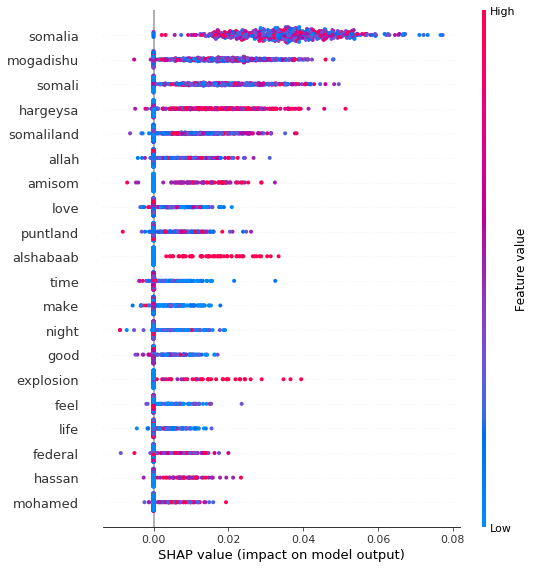

In [149]:
shap.summary_plot(shap_values_som, somalia_500)

In [171]:
som_weight_mean = shap_values_som.mean(axis=0)
(np.sort(som_weight_mean)[::-1])[:10]

array([0.03541922, 0.01766359, 0.01686822, 0.01213926, 0.00882363,
       0.00292089, 0.00237385, 0.00229668, 0.00203414, 0.00191884])

In [180]:
som_weight_dict = dict(zip(feature_names, som_weight_mean))

In [196]:
def sort_dict(d, rev=False):
    return OrderedDict(sorted(d.items(), key=lambda x:x[1], reverse=rev))

def rank_tweets(country_code, date_str, weight_dict, top_num, print_weights=False):
    print(f"{country_code} {date_str}")
    if print_weights:
        print("Feature weights:")
        for k, v in weight_dict.items():
            print(f"{k}\t{v}")
    print("\nTop weighted tweets:\n")
    tweet_file = f"/home/aadelucia/files/minerva/raw_tweets_deduplicated/tweets_en/{date_str}_{country_code}.gz"
    reader = TweetReader(tweet_file)
    tokenizer = TweetTokenizer()
    score_dict = {}
    text_dict = {}
    civil_unrest_score_dict = {}
    count = 0
    for tweet in reader.read_tweets():
#         count +=1
#         if count == 5:
#             break
        weight = 0
        tokens = tokenizer.tokenize(tweet['text'])
        for token in tokens:
#             print(f">>{token}<<")
            if token in weight_dict:
#                 print("YES")
                weight += weight_dict[token]
        score_dict[tweet['id']] = weight
        text_dict[tweet['id']] = tweet['text']
        civil_unrest_score_dict[tweet['id']] = tweet['civil_unrest_score']
    score_dict = sort_dict(score_dict, rev=True)
    top_tweets = []
    for tweet_id, score in list(score_dict.items())[:top_num]:
        text = text_dict[tweet_id]
        cu_score = civil_unrest_score_dict[tweet_id]
        top_tweets.append(tweet_id)
        print(f"{text} \n weight={score}, civil_unrest_score={cu_score}\n")
    print('-'*70, "\n")

In [179]:
somalia_all.iloc[12, :]

COUNTRY                    SOM
DATE       2018-01-23 00:00:00
LABEL                        1
00am                         0
00pm                         0
                  ...         
zoo                          0
zra2014                      0
zulu                         0
zuma                         0
️follow                      0
Name: 17200, Length: 10003, dtype: object

https://en.wikipedia.org/wiki/2018_timeline_of_the_Somali_Civil_War

January 23 - Four people have been killed and six others wounded in a remote-controlled improvised explosive device explosion near Mogadishu.

### Rank tweets using the aggregate SHAP value (magnitude in the summary plot) as the weight

In [197]:
top_tweets = rank_tweets('SO', '2018_01_21', som_weight_dict, 50)

SO 2018_01_21

Top weighted tweets:

@DeerAmina @musebiihi Somaliland is not Somalia Brother 
 weight=0.04435137726650622, civil_unrest_score=0.28133147954940796

First photo: President Farmaajo in Galguduud region of central Somalia
Second photo: President Museveni in Isingiro… https://t.co/2Ske5iz3HS 
 weight=0.037160807863515125, civil_unrest_score=0.5149667263031006

@Mabzzz01 Somalia is committed to exercise a democracy, the replacement itself means a democracy and it doesn’t matter who replaced who. 
 weight=0.03605764073724916, civil_unrest_score=0.41702699661254883

Good morning #Mogadishu! Sun will rise in 30 minutes (local time 06:09) #Sunrise #Photo #Photography [21.01.2018] 
 weight=0.023543436813507516, civil_unrest_score=0.2957618832588196

Good evening #Mogadishu! Sun will set in 30 minutes (local time 18:10) #Sunset #Photo #Photography [21.01.2018] 
 weight=0.02325165742288993, civil_unrest_score=0.31712085008621216

current weather in Mogadishu: scattered clouds, 29°C


In [201]:
list(sort_dict(som_weight_dict, rev=True).items())[:100]

[('somalia', 0.03541922483198873),
 ('mogadishu', 0.01766359101347992),
 ('somali', 0.016868224791932056),
 ('hargeysa', 0.012139256896673214),
 ('somaliland', 0.008823625696279378),
 ('allah', 0.002920890807772486),
 ('amisom', 0.002373854148725977),
 ('love', 0.0022966810212693986),
 ('puntland', 0.002034135500529426),
 ('alshabaab', 0.001918837371014883),
 ('time', 0.0013212783083246112),
 ('make', 0.001270940283303215),
 ('explosion', 0.0012322392607621872),
 ('good', 0.0012056224028397183),
 ('night', 0.0011639908385521658),
 ('feel', 0.0010966012261911893),
 ('life', 0.0010160567089425752),
 ('hassan', 0.0009619866148911418),
 ('federal', 0.0009393352559970013),
 ('mohamed', 0.0009103693077865054),
 ('ethiopian', 0.0009015428588519446),
 ('heart', 0.0008443396297730335),
 ('watching', 0.0008333245475076743),
 ('beautiful', 0.000813363111106863),
 ('state', 0.0007965006787060794),
 ('police', 0.0007882520649280171),
 ("didn't", 0.0007664994404380205),
 ('back', 0.00076573683075043

---